<a href="https://colab.research.google.com/github/RPAlbuquerque/Topic-Analysis---Twitter-2010-2023---BR/blob/main/LlaMA_Topic_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 🔍 Validation Utility — Check for mergeable and complete inputs before LLaMA 4

import os
import pandas as pd
from glob import glob

BASE = "/n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final"
OUT = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
anos = range(2010, 2024)
meses = range(1, 13)

validos = []
min_tweets_por_cluster = 10

for ano in anos:
    for mes in meses:
        if ano == 2023 and mes > 7:
            continue

        path_text = f"{BASE}/preprocessed_brasil_{ano}_{mes:02d}.csv.gz"
        path_clust = f"{BASE}/cluster_brasil_{ano}_{mes:02d}.csv.gz"

        if not os.path.exists(path_text) or not os.path.exists(path_clust):
            print(f"❌ Missing file(s) for {ano}-{mes:02d}")
            continue

        try:
            df_text = pd.read_csv(path_text, sep="\t", usecols=["message_id", "clean_text"])
            df_clust = pd.read_csv(path_clust, sep="\t", usecols=["message_id", "cluster_id"])
            df = df_text.merge(df_clust, on="message_id").dropna(subset=["clean_text"])

            n_clusters = df["cluster_id"].nunique()
            valid_clusters = df["cluster_id"].value_counts()
            if (valid_clusters >= min_tweets_por_cluster).sum() == 0:
                print(f"⚠️ {ano}-{mes:02d} → All clusters too small (< {min_tweets_por_cluster})")
                continue

            validos.append((ano, mes, len(df), n_clusters))
            print(f"✅ {ano}-{mes:02d} → {len(df):,} tweets | {n_clusters} clusters")

        except Exception as e:
            print(f"❌ Error reading {ano}-{mes:02d}: {e}")

print(f"\n🔎 Total months ready for LLaMA 4: {len(validos)}")

❌ Missing file(s) for 2010-01
❌ Missing file(s) for 2010-02
❌ Missing file(s) for 2010-03
❌ Missing file(s) for 2010-04
❌ Missing file(s) for 2010-05
❌ Missing file(s) for 2010-06
❌ Missing file(s) for 2010-07
❌ Missing file(s) for 2010-08
❌ Missing file(s) for 2010-09
❌ Missing file(s) for 2010-10
❌ Missing file(s) for 2010-11
❌ Missing file(s) for 2010-12
❌ Missing file(s) for 2011-01
❌ Missing file(s) for 2011-02
❌ Missing file(s) for 2011-03
❌ Missing file(s) for 2011-04
❌ Missing file(s) for 2011-05
❌ Missing file(s) for 2011-06
❌ Missing file(s) for 2011-07
❌ Missing file(s) for 2011-08
❌ Missing file(s) for 2011-09
❌ Missing file(s) for 2011-10
❌ Missing file(s) for 2011-11
❌ Missing file(s) for 2011-12
❌ Missing file(s) for 2012-01
❌ Missing file(s) for 2012-02
❌ Missing file(s) for 2012-03
❌ Missing file(s) for 2012-04
❌ Missing file(s) for 2012-05
❌ Missing file(s) for 2012-06
❌ Missing file(s) for 2012-07
❌ Missing file(s) for 2012-08
❌ Missing file(s) for 2012-09
❌ Missing 

In [ ]:
##🔷 Block 1 — Semantic Labeling of Topic Clusters using LLaMA 4

In [ ]:
# 🔷 Block 1 — Semantic Labeling of Topic Clusters using LLaMA 4
# Gera arquivos: labels_YYYY_MM.csv com prompt + label_ia placeholder (sobrescreve sempre)

import os
import pandas as pd

# Caminhos de entrada e saída
BASE = "/n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final"
OUT = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
os.makedirs(OUT, exist_ok=True)

# === Função para construir o prompt do LLaMA 4 ===
def build_prompt(texts):
    header = (
        "Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.\n\n"
        "Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.\n"
        "Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.\n\n"
        "🔍 Diretrizes:\n"
        "- Use linguagem clara, neutra e descritiva.\n"
        "- Não copie nenhuma parte dos tweets.\n"
        "- Não mencione hashtags, emojis, nomes de usuário ou links.\n"
        "- Não analise sentimentos ou opiniões; apenas o **tema predominante**.\n"
        "- Não utilize termos genéricos como “assuntos diversos”.\n\n"
        "📥 Tweets:\n"
    )
    body = "\n".join(f"- {t}" for t in texts)
    return header + body

# === Função principal para processar um mês ===
def generate_llama_labels(year, month, sample_size=200):
    input_texts = f"{BASE}/preprocessed_brasil_{year}_{month:02d}.csv.gz"
    input_clusters = f"{BASE}/cluster_brasil_{year}_{month:02d}.csv.gz"
    output_file = f"{OUT}/labels_{year}_{month:02d}.csv"

    if not os.path.exists(input_texts):
        print(f"❌ Arquivo ausente: {input_texts}")
        return
    if not os.path.exists(input_clusters):
        print(f"❌ Arquivo ausente: {input_clusters}")
        return

    print(f"\n📅 Processando {year}-{month:02d}...")

    try:
        # Leitura e merge dos dados
        df_texts = pd.read_csv(input_texts, sep="\t", usecols=["message_id", "clean_text"])
        df_clusters = pd.read_csv(input_clusters, sep="\t")
        df = df_texts.merge(df_clusters, on="message_id").dropna(subset=["clean_text"])
        df["clean_text"] = df["clean_text"].astype(str)

        # Construção dos prompts por cluster
        results = []
        for cluster_id in sorted(df["cluster_id"].unique()):
            cluster_texts = df[df["cluster_id"] == cluster_id]["clean_text"]
            samples = cluster_texts.sample(
                n=min(sample_size, len(cluster_texts)), random_state=42
            ).tolist()

            prompt = build_prompt(samples)

            results.append({
                "year_month": f"{year}_{month:02d}",
                "cluster_id": cluster_id,
                "n_tweets": len(samples),
                "label_ia": "[LLaMA 4 response here]",
                "prompt": prompt
            })

        # Salva o arquivo (sempre sobrescreve)
        df_out = pd.DataFrame(results)
        df_out.to_csv(output_file, index=False)
        print(f"✅ Salvo: {output_file}")

    except Exception as e:
        print(f"❌ Erro ao processar {year}-{month:02d}: {e}")

# === Loop completo: 2013 até julho/2023 ===
for ano in range(2013, 2024):
    for mes in range(1, 13):
        if ano == 2023 and mes > 7:
            continue
        generate_llama_labels(ano, mes)

# Confirmação visual de arquivos gerados
print("\n📦 Arquivos disponíveis no diretório de saída:")
print(os.listdir(OUT)[:10])

❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_01.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_02.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_03.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/preprocessed_brasil_2013_04.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_05.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_06.csv.gz
❌ Arquivo ausente: /n/netscratch/cga/Lab/rpalbuquerque/Topic Analysis Final/cluster_brasil_2013_07.csv.gz

📅 Processando 2013-08...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_08.csv

📅 Processando 2013-09...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_09.csv
❌ Arquivo ausente: /n/n

In [ ]:
##🔷 Block 2 — Batch Execution of LLaMA 4 for All Validated Months

In [ ]:
# 🔷 Block 2 — Batch Execution of LLaMA 4 for All Validated Months (Brazil 2013–2023)
# Requires: Block 1 (generate_llama_labels) already defined

import os
from tqdm import tqdm

# Output directory
OUT = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
os.makedirs(OUT, exist_ok=True)

# Full list of validated months
valid_months = [
    (2013, 8), (2013, 9), (2013, 12),
    *[(2014, m) for m in [1,2,3,6,7,9,10,11,12]],
    *[(2015, m) for m in range(1, 13)],
    *[(2016, m) for m in range(1, 13)],
    *[(2017, m) for m in range(1, 13)],
    *[(2018, m) for m in range(1, 13)],
    *[(2019, m) for m in range(1, 13)],
    *[(2020, m) for m in range(1, 13)],
    *[(2021, m) for m in range(1, 13)],
    *[(2022, m) for m in range(1, 13)],
    *[(2023, m) for m in range(1, 8)]
]

# Loop through all months with real-time output and checkpointing
for year, month in tqdm(valid_months, desc="🚀 Running LLaMA 4 labeling"):
    try:
        output_file = f"{OUT}/labels_{year}_{month:02d}.csv"
        if os.path.exists(output_file):
            print(f"🟡 Skipping {year}-{month:02d} (already exists)")
            continue

        # Call your prompt-based labeling function here
        generate_llama_labels(year, month)

    except Exception as e:
        print(f"❌ Error in {year}-{month:02d}: {e}")

🚀 Running LLaMA 4 labeling:   1%|          | 1/115 [00:00<00:14,  7.68it/s]


📅 Processing: 2013-08

🔹 Cluster 0 | 1 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 1 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use lingua

🚀 Running LLaMA 4 labeling:   8%|▊         | 9/115 [00:00<00:03, 27.25it/s]

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_01.csv

📅 Processing: 2014-02

🔹 Cluster 0 | 1 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 2 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objet

🚀 Running LLaMA 4 labeling:  11%|█▏        | 13/115 [00:00<00:03, 29.24it/s]

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_12.csv

📅 Processing: 2015-01

🔹 Cluster 0 | 2 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 13 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e obje

🚀 Running LLaMA 4 labeling:  14%|█▍        | 16/115 [00:00<00:06, 15.19it/s]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  19%|█▉        | 22/115 [00:01<00:05, 15.89it/s]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  22%|██▏       | 25/115 [00:01<00:05, 16.90it/s]


🔹 Cluster 8 | 38 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 9 | 92 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e d

🚀 Running LLaMA 4 labeling:  24%|██▍       | 28/115 [00:01<00:04, 17.85it/s]


🔹 Cluster 12 | 106 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 13 | 150 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  30%|██▉       | 34/115 [00:01<00:04, 19.02it/s]


🔹 Cluster 19 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 20 | 106 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  32%|███▏      | 37/115 [00:02<00:04, 19.32it/s]


🔹 Cluster 32 | 42 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 33 | 141 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra 

🚀 Running LLaMA 4 labeling:  37%|███▋      | 43/115 [00:02<00:03, 20.16it/s]


🔹 Cluster 0 | 99 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e 

🚀 Running LLaMA 4 labeling:  40%|████      | 46/115 [00:02<00:03, 20.23it/s]


🔹 Cluster 22 | 55 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 23 | 79 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  43%|████▎     | 49/115 [00:03<00:07,  9.09it/s]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  44%|████▍     | 51/115 [00:06<00:26,  2.41it/s]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  46%|████▌     | 53/115 [00:13<01:16,  1.23s/it]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

🚀 Running LLaMA 4 labeling:  47%|████▋     | 54/115 [00:19<01:56,  1.92s/it]


🔹 Cluster 35 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 36 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  48%|████▊     | 55/115 [00:43<05:43,  5.73s/it]


📅 Processing: 2018-08

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  49%|████▊     | 56/115 [01:21<11:53, 12.10s/it]


📅 Processing: 2018-09

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  50%|████▉     | 57/115 [01:59<17:15, 17.85s/it]


📅 Processing: 2018-10

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  50%|█████     | 58/115 [02:10<15:25, 16.23s/it]


🔹 Cluster 40 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 41 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  51%|█████▏    | 59/115 [02:17<13:00, 13.94s/it]


🔹 Cluster 30 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 31 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  52%|█████▏    | 60/115 [03:03<20:28, 22.34s/it]


📅 Processing: 2019-01

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  53%|█████▎    | 61/115 [03:57<27:57, 31.06s/it]


📅 Processing: 2019-02

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  54%|█████▍    | 62/115 [04:39<30:13, 34.21s/it]


📅 Processing: 2019-03

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  55%|█████▍    | 63/115 [05:19<31:14, 36.04s/it]


📅 Processing: 2019-04

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  56%|█████▌    | 64/115 [06:03<32:29, 38.23s/it]


📅 Processing: 2019-05

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  57%|█████▋    | 65/115 [06:46<32:55, 39.51s/it]


📅 Processing: 2019-06

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  57%|█████▋    | 66/115 [07:03<27:00, 33.07s/it]


🔹 Cluster 48 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 49 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  58%|█████▊    | 67/115 [07:43<28:01, 35.03s/it]


📅 Processing: 2019-08

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  59%|█████▉    | 68/115 [08:27<29:27, 37.60s/it]

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_08.csv

📅 Processing: 2019-09

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e o

🚀 Running LLaMA 4 labeling:  60%|██████    | 69/115 [09:07<29:26, 38.41s/it]


📅 Processing: 2019-10

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  61%|██████    | 70/115 [09:50<29:54, 39.88s/it]


📅 Processing: 2019-11

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  62%|██████▏   | 71/115 [10:31<29:26, 40.14s/it]


📅 Processing: 2019-12

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  63%|██████▎   | 72/115 [11:12<28:58, 40.43s/it]


📅 Processing: 2020-01

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  63%|██████▎   | 73/115 [12:01<30:04, 42.97s/it]

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_01.csv

📅 Processing: 2020-02

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e o

🚀 Running LLaMA 4 labeling:  64%|██████▍   | 74/115 [12:46<29:46, 43.58s/it]


📅 Processing: 2020-03

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  65%|██████▌   | 75/115 [13:39<30:56, 46.42s/it]


📅 Processing: 2020-04

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  66%|██████▌   | 76/115 [14:32<31:22, 48.27s/it]


📅 Processing: 2020-05

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  67%|██████▋   | 77/115 [15:15<29:43, 46.94s/it]


📅 Processing: 2020-06

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  68%|██████▊   | 78/115 [15:50<26:40, 43.25s/it]


📅 Processing: 2020-07

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  69%|██████▊   | 79/115 [16:23<24:05, 40.15s/it]


📅 Processing: 2020-08

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  70%|██████▉   | 80/115 [17:00<22:55, 39.31s/it]


📅 Processing: 2020-09

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  70%|███████   | 81/115 [17:29<20:26, 36.09s/it]


📅 Processing: 2020-10

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  71%|███████▏  | 82/115 [18:02<19:24, 35.28s/it]

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_10.csv

📅 Processing: 2020-11

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e o

🚀 Running LLaMA 4 labeling:  72%|███████▏  | 83/115 [18:35<18:27, 34.60s/it]


📅 Processing: 2020-12

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  73%|███████▎  | 84/115 [19:08<17:35, 34.04s/it]


📅 Processing: 2021-01

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  74%|███████▍  | 85/115 [19:37<16:17, 32.60s/it]


📅 Processing: 2021-02

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  75%|███████▍  | 86/115 [20:09<15:36, 32.31s/it]


📅 Processing: 2021-03

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  76%|███████▌  | 87/115 [20:42<15:07, 32.42s/it]


📅 Processing: 2021-04

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  77%|███████▋  | 88/115 [21:07<13:39, 30.34s/it]


📅 Processing: 2021-05

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  77%|███████▋  | 89/115 [21:31<12:15, 28.30s/it]


📅 Processing: 2021-06

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  78%|███████▊  | 90/115 [21:52<10:51, 26.07s/it]


📅 Processing: 2021-07

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  79%|███████▉  | 91/115 [22:13<09:49, 24.58s/it]


📅 Processing: 2021-08

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  80%|████████  | 92/115 [22:33<08:55, 23.30s/it]


📅 Processing: 2021-09

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  81%|████████  | 93/115 [22:52<08:05, 22.06s/it]


🔹 Cluster 47 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 48 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  82%|████████▏ | 94/115 [23:12<07:30, 21.47s/it]


📅 Processing: 2021-11

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  83%|████████▎ | 95/115 [23:31<06:55, 20.78s/it]


🔹 Cluster 47 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 48 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  83%|████████▎ | 96/115 [23:52<06:31, 20.62s/it]


📅 Processing: 2022-01

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  84%|████████▍ | 97/115 [24:12<06:07, 20.44s/it]


📅 Processing: 2022-02

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  85%|████████▌ | 98/115 [24:30<05:36, 19.82s/it]


🔹 Cluster 46 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 47 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  86%|████████▌ | 99/115 [24:52<05:26, 20.39s/it]


📅 Processing: 2022-04

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  87%|████████▋ | 100/115 [25:11<04:58, 19.91s/it]


📅 Processing: 2022-05

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  88%|████████▊ | 101/115 [25:30<04:38, 19.90s/it]


📅 Processing: 2022-06

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  89%|████████▊ | 102/115 [25:49<04:14, 19.56s/it]


🔹 Cluster 47 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 48 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  90%|████████▉ | 103/115 [26:07<03:48, 19.06s/it]


🔹 Cluster 49 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...

✅ Saved: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_07.csv

📅 Processing: 2022-08

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e 

🚀 Running LLaMA 4 labeling:  90%|█████████ | 104/115 [26:33<03:53, 21.27s/it]


📅 Processing: 2022-09

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  91%|█████████▏| 105/115 [27:05<04:04, 24.44s/it]


📅 Processing: 2022-10

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  92%|█████████▏| 106/115 [27:37<04:00, 26.67s/it]


📅 Processing: 2022-11

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  93%|█████████▎| 107/115 [28:04<03:34, 26.79s/it]


📅 Processing: 2022-12

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  94%|█████████▍| 108/115 [28:31<03:07, 26.76s/it]


📅 Processing: 2023-01

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  95%|█████████▍| 109/115 [28:52<02:30, 25.00s/it]


📅 Processing: 2023-02

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  96%|█████████▌| 110/115 [29:08<01:51, 22.21s/it]


🔹 Cluster 44 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 45 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  97%|█████████▋| 111/115 [29:25<01:23, 20.76s/it]


🔹 Cluster 48 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 49 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  97%|█████████▋| 112/115 [29:33<00:50, 16.90s/it]


📅 Processing: 2023-05

🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use li

🚀 Running LLaMA 4 labeling:  98%|█████████▊| 113/115 [29:40<00:27, 13.97s/it]


🔹 Cluster 36 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 37 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling:  99%|█████████▉| 114/115 [29:44<00:11, 11.08s/it]


🔹 Cluster 27 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 28 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra

🚀 Running LLaMA 4 labeling: 100%|██████████| 115/115 [29:45<00:00, 15.53s/it]


🔹 Cluster 0 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e descritiva.
- Não copie nenhuma parte dos tweets.
- Não mencione hashtags, emojis, nomes de usu ...


🔹 Cluster 1 | 200 tweets
🧠 Prompt preview:
 Você é um analista de linguagem natural especializado em identificar padrões temáticos em redes sociais.

Abaixo está uma amostra de tweets que compartilham um mesmo tema, agrupados com base em similaridade semântica.
Sua tarefa é ler cuidadosamente os textos e escrever **uma frase curta e objetiva que descreva o assunto principal tratado nesses tweets**.

🔍 Diretrizes:
- Use linguagem clara, neutra e

In [ ]:
## ✅ 🔷 Bloco 3 — Semantic Label Completion com LLaMA 3-70B-Instruct (via Hugging Face)

In [ ]:
import sys
!{sys.executable} -m pip install --upgrade transformers accelerate --quiet

In [ ]:
!{sys.executable} -m pip install --upgrade bitsandbytes --quiet

In [ ]:
import sys
!{sys.executable} -m pip install --upgrade llama-stack

In [ ]:
import sys
!{sys.executable} -m pip install --upgrade transformers accelerate

In [ ]:
import sys
!{sys.executable} -m pip install bitsandbytes

In [ ]:
# 🔷 Bloco 3 — Geração dos rótulos com LLaMA 3.2-3B-Instruct (robusto e otimizado)
# Inclui validação de entrada, fallback em caso de erro, e uso eficiente de GPU

import os
import pandas as pd
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
from concurrent.futures import ThreadPoolExecutor, as_completed
from glob import glob
from tqdm import tqdm

# === CONFIGURAÇÕES ===
MODEL_NAME = "meta-llama/Llama-3.2-3B-Instruct"
LABEL_DIR = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
OUT_SUFFIX = "_filled.csv"
N_THREADS = 8  # Mais seguro com 8 (reduzido para evitar corrida com GPU)

# === Carregamento do modelo ===
print("\n🔄 Carregando modelo LLaMA 3.2-3B-Instruct...")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForCausalLM.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float32,  # evita erro com inf/nan
    device_map="auto",
    trust_remote_code=True
)
print("✅ Modelo carregado com sucesso!")

# === Função de geração com tratamento de erro ===
@torch.inference_mode()
def call_llama(prompt):
    try:
        if not isinstance(prompt, str) or len(prompt.strip()) < 10:
            return "[ERRO: prompt inválido]"

        inputs = tokenizer(prompt, return_tensors="pt", truncation=True, max_length=2048).to(model.device)
        outputs = model.generate(
            **inputs,
            max_new_tokens=80,
            temperature=0.4,
            do_sample=False  # ← evita sampling com NaN
        )
        result = tokenizer.decode(outputs[0], skip_special_tokens=True)
        response = result.replace(prompt, "").strip()
        return response if response else "[ERRO: resposta vazia]"
    except Exception as e:
        return f"[ERRO: {str(e)}]"

# === Processamento por cluster ===
def processar_cluster(row_dict):
    cluster_id = row_dict.get("cluster_id", "N/A")
    if str(row_dict["label_ia"]).strip() != "[LLaMA 4 response here]":
        return row_dict

    prompt = row_dict["prompt"]
    resposta = call_llama(prompt)
    print(f"🔹 Cluster {cluster_id} → {resposta[:60]}...")
    row_dict["label_ia"] = resposta
    return row_dict

# === Processamento de um arquivo inteiro ===
def process_file(filepath):
    nome_arquivo = os.path.basename(filepath)
    path_out = os.path.join(LABEL_DIR, nome_arquivo.replace(".csv", OUT_SUFFIX))

    if os.path.exists(path_out):
        print(f"🟡 Pulando {nome_arquivo} (já preenchido)")
        return

    print(f"\n🚀 Processando {nome_arquivo} com {N_THREADS} threads...")
    df = pd.read_csv(filepath)
    if "prompt" not in df.columns:
        print(f"❌ {nome_arquivo} não contém a coluna 'prompt'")
        return

    rows = df.to_dict(orient="records")
    results = []

    with ThreadPoolExecutor(max_workers=N_THREADS) as executor:
        futures = [executor.submit(processar_cluster, row) for row in rows]
        for future in tqdm(as_completed(futures), total=len(futures)):
            results.append(future.result())

    df_final = pd.DataFrame(results)
    df_final.to_csv(path_out, index=False)
    print(f"✅ Salvo: {path_out}")

# === Rodar em todos os arquivos ===
arquivos = sorted([
    f for f in glob(f"{LABEL_DIR}/labels_20*.csv")
    if not f.endswith(OUT_SUFFIX)
])
print(f"🔍 Arquivos encontrados: {len(arquivos)}")

for arq in arquivos:
    process_file(arq)


🔄 Carregando modelo LLaMA 3.2-3B-Instruct...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


✅ Modelo carregado com sucesso!
🔍 Arquivos encontrados: 116

🚀 Processando labels_2013_08.csv com 8 threads...


  0%|          | 0/49 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/49 [01:30<1:12:29, 90.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_toke

🔹 Cluster 4 → - eu não tenho nada a ver com isso
- eu não tenho nada a ver...
🔹 Cluster 6 → e eu estou aqui
- eu estou tão triste que meus amigos estão ...
🔹 Cluster 7 → que a gente se lembra que a vida é curta e que devemos aprov...
🔹 Cluster 0 → - quero fazer bem as coisas aqui dia voltar vestir esa camis...
🔹 Cluster 1 → do patriota
- praça do patriota libertadores egalo
- praça d...
🔹 Cluster 3 → me deu um presente de aniversário e eu fiquei muito feliz
- ...


 14%|█▍        | 7/49 [01:31<06:45,  9.66s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → a minha família. Elas são meus verdadeiros heróis. #Família ...


 16%|█▋        | 8/49 [01:32<05:31,  8.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - eu não tenho dinheiro pra comprar um show, mas eu vou ir
-...


 18%|█▊        | 9/49 [02:53<15:04, 22.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → ada
- acho que é só o que faz
- acho que é só o que faz
- ac...


 20%|██        | 10/49 [02:56<11:55, 18.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - univasf universidade federal vale são francisco juazeiro
-...
🔹 Cluster 11 → - pessoas que se apaixonam por um só homem
- pessoas que se ...


 24%|██▍       | 12/49 [02:57<07:00, 11.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - gremio perde hoje
- gremio perde
- gremio
- gremio perdeu
...


 27%|██▋       | 13/49 [02:58<05:27,  9.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → de matemática
- fernanda ficou arranhando aula de matemática...
🔹 Cluster 8 → - a noite é a hora do meu dia
- a noite é a hora em que eu m...


 31%|███       | 15/49 [03:00<03:22,  5.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - comida saudável nutrição
- café comida saudável
- café pra...
🔹 Cluster 10 → - eu não tenho dinheiro para comprar um novo celular, mas eu...


 35%|███▍      | 17/49 [04:20<09:36, 18.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → à noite, quando estava em casa, ouvi um barulho estranho vin...


 37%|███▋      | 18/49 [04:22<07:41, 14.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - edificio marquês é um dos mais antigos da cidade de campin...


 39%|███▉      | 19/49 [04:25<06:04, 12.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu acho que a natação é uma atividade muito boa para a saú...


 41%|████      | 20/49 [04:26<04:33,  9.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - a maia é uma cidade que foi fundada pelos maia
- a maia é ...


 43%|████▎     | 21/49 [04:27<03:21,  7.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - pessoas que não perdoam nunca estão certos
- não é justo p...


 45%|████▍     | 22/49 [04:27<02:24,  5.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - comida mãe mãe mãe mãe mãe mãe mãe mãe mãe mãe mãe mãe mãe...
🔹 Cluster 21 → e se esquecer de tudo
- a vida é um pesadelo
- a dor é uma p...


 49%|████▉     | 24/49 [04:29<01:26,  3.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - acho que o que está acontecendo no mundo é que as pessoas ...


 51%|█████     | 25/49 [05:46<08:22, 20.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → u
- nota de 10,0 é o que eu estou esperando, mas acho que a ...


 53%|█████▎    | 26/49 [05:48<06:12, 16.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → para a apresentação
- acho que estou perdendo a noção do que...


 55%|█████▌    | 27/49 [05:53<04:48, 13.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - eu não tenho dinheiro para comprar um carro
- eu não tenho...


 57%|█████▋    | 28/49 [05:55<03:34, 10.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → , esse cara é um verdadeiro gênio! ele conseguiu fazer um bu...
🔹 Cluster 28 → - a recuperação química é um processo complexo que envolve a...


 61%|██████    | 30/49 [05:58<01:57,  6.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → , uma das minhas favoritas, no meu álbum de fotos. #fotograf...
🔹 Cluster 29 → - avenida augusto lima belo horizonte
- avenida augusto lima...
🔹 Cluster 26 → que a vida
- aí que aí que aí que aí que aí que aí que aí qu...


 67%|██████▋   | 33/49 [07:11<04:01, 15.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - beijar seu corpo inteiro ate pirar
- cala boca beija neh f...


 69%|██████▉   | 34/49 [07:14<03:11, 12.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → que a gente
- que tal uma noite de chamas
- que tal uma noit...


 71%|███████▏  | 35/49 [07:19<02:35, 11.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → ser um problema? 
- mirela é uma das principais causas de so...
🔹 Cluster 34 → - eu não tenho nada a ver com isso, mas é uma vergonha para ...


 76%|███████▌  | 37/49 [07:20<01:25,  7.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → é um verdadeiro herói, que salvou a vida de alguém.
- alguém...


 78%|███████▊  | 38/49 [07:21<01:05,  5.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - galeria rock são paulo 2023
- galeria rock são paulo 2022
...


 80%|███████▉  | 39/49 [07:22<00:47,  4.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → : “Aumento do custo de vida é um problema que afeta a todos....
🔹 Cluster 38 → - aeroporto internacional são paulo guarulhos gru guarulhos
...


 84%|████████▎ | 41/49 [08:38<02:23, 17.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → , mas não sei como começar
- como posso começar a jogar fute...


 86%|████████▌ | 42/49 [08:41<01:42, 14.65s/it]

🔹 Cluster 41 → que tava na mesa
- hoje eu estava olhando para a mesa e vi q...


 88%|████████▊ | 43/49 [08:42<01:08, 11.38s/it]

🔹 Cluster 42 → - eu não tenho dinheiro para comprar roupas para dançar
- eu...


 90%|████████▉ | 44/49 [08:44<00:44,  8.94s/it]

🔹 Cluster 45 → e rápido
- comeria pratada de chocolate
- comeria pratada de...


 92%|█████████▏| 45/49 [08:46<00:28,  7.08s/it]

🔹 Cluster 43 → - chego pedir embora jhon telefone falando gabriel
- chego p...


 94%|█████████▍| 46/49 [08:47<00:15,  5.30s/it]

🔹 Cluster 44 → - parabéns
- meu primeiro parabéns
- cheguemos
- parabéns
- ...


 96%|█████████▌| 47/49 [08:50<00:09,  4.66s/it]

🔹 Cluster 46 → u a todos, mas a verdade é que a pessoa que te magoou não é ...


 98%|█████████▊| 48/49 [08:51<00:03,  3.67s/it]

🔹 Cluster 47 → - Piranha é animal que se alimenta de carne
- Piranha é uma ...


100%|██████████| 49/49 [09:55<00:00, 12.15s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - amor é uma força
- amor é uma força que nos une
- amor é u...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_08_filled.csv

🚀 Processando labels_2013_09.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/41 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/41 [01:09<46:08, 69.21s/it]

🔹 Cluster 6 → - eu não quero mais
- eu não quero mais
- eu não quero mais
...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  5%|▍         | 2/41 [01:19<22:18, 34.31s/it]

🔹 Cluster 7 → - amor é amor
- gêmeas são gêmeas
- eu sou pera
- ninguém é ...


  7%|▋         | 3/41 [01:26<13:52, 21.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → , acho que ela está tentando ganhar atenção com essas fotos....


 10%|▉         | 4/41 [01:28<08:37, 13.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - mina fica tudo falando dificil mestruaagr quero ver cagar ...
🔹 Cluster 2 → - num bixo léo tagara fala coisa nada ver kkkkkkkkkkkkk
- eu...


 17%|█▋        | 7/41 [01:28<02:48,  4.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - acho que ele é o meu
- eu estou apaixonada
- acho que ele ...
🔹 Cluster 0 → não veio
- a morte de ana luiza é um lembrete de que a vida ...


 20%|█▉        | 8/41 [01:30<02:14,  4.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não tenho dinheiro para pagar a conta
- eu não tenho dinhe...


 22%|██▏       | 9/41 [02:32<11:03, 20.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → de aula
- aula de culinária
- aula de culinária: como fazer ...


 24%|██▍       | 10/41 [02:50<10:10, 19.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → res de amor nos olhos, é o que faz com que eu sinta que esto...


 27%|██▋       | 11/41 [02:51<07:06, 14.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - aço e alumínio
- aço e alumínio
- aço e alumínio
- aço e a...


 29%|██▉       | 12/41 [02:53<05:11, 10.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - frans café rio janeiro
- nokoni rio janeiro
- frans café r...


 32%|███▏      | 13/41 [03:00<04:33,  9.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - eu amo a vida
- eu amo a vida mais do que qualquer outra c...


 34%|███▍      | 14/41 [03:01<03:12,  7.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → que possível
- ação imediata
- prioridade máxima
- semanal
-...


 37%|███▋      | 15/41 [03:04<02:31,  5.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - rada lokasso
- coisinha
- time abc muda cada rodadaentrosa...


 39%|███▉      | 16/41 [03:05<01:49,  4.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu não sei se é só eu, mas parece que a gente está passand...


 41%|████▏     | 17/41 [03:54<07:05, 17.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - treino de força
- treino de resistência
- treino de força ...


 44%|████▍     | 18/41 [04:13<06:53, 17.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 46%|████▋     | 19/41 [04:22<05:35, 15.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - domingo dia de família é um dia para se oferecer carinho a...


 49%|████▉     | 20/41 [04:24<03:56, 11.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - acredito que a família fernandes mendes gomez tenha sido v...


 51%|█████     | 21/41 [04:28<03:02,  9.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → de terror no sábado à noite?
- eu estou procurando por filme...


 54%|█████▎    | 22/41 [04:33<02:31,  7.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - pimentão recheado é uma opção saudável
- espaço pimentão r...


 56%|█████▌    | 23/41 [04:34<01:46,  5.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - acho que acho que acho que acho que acho que acho que acho...


 59%|█████▊    | 24/41 [04:36<01:18,  4.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eu não tenho dinheiro pra comprar nada na polishop, mas eu...


 61%|██████    | 25/41 [05:19<04:20, 16.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → a uma festa e vi uma garota usando um vestido de seda e um c...


 63%|██████▎   | 26/41 [05:41<04:28, 17.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - eu não tenho dinheiro para comprar um novo computador, mas...


 66%|██████▌   | 27/41 [05:51<03:36, 15.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - acordar escutando música que me faz querer viver
- acordar...


 68%|██████▊   | 28/41 [05:53<02:28, 11.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → com um café da manhã delicioso e saudável, com frutas fresca...


 71%|███████   | 29/41 [05:55<01:44,  8.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → o que eu vi
- eu não sei se posso continuar com isso, a dor ...


 73%|███████▎  | 30/41 [06:03<01:32,  8.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - eu amo você meu anjo, você é o meu amor, você é a minha vi...


 76%|███████▌  | 31/41 [06:04<01:01,  6.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → pra isso
- eu também acho que é normal
- eu não acho que sej...


 78%|███████▊  | 32/41 [06:06<00:43,  4.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - a hora da verdade
- a hora da verdade é a hora do lanche
-...


 80%|████████  | 33/41 [06:46<02:04, 15.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - eu não entendi o que vocês falam mas eu sei que é sobre a ...


 83%|████████▎ | 34/41 [07:08<02:01, 17.33s/it]

🔹 Cluster 36 → , eu não entendi o que ele falou, mas acho que ele fala sobr...


 85%|████████▌ | 35/41 [07:19<01:33, 15.59s/it]

🔹 Cluster 37 → de aula
- aula de matemática é obrigatória
- aula de matemát...


 90%|█████████ | 37/41 [07:21<00:32,  8.05s/it]

🔹 Cluster 43 → - nina sempre twitter acho que a menina que dorme bem e tran...
🔹 Cluster 42 → as noites eu tenho um sonho que eu sinto que é uma mensagem ...


 93%|█████████▎| 38/41 [07:31<00:25,  8.51s/it]

🔹 Cluster 45 → do Brasil
- O Brasil é um país com uma grande diversidade cu...
🔹 Cluster 44 → - acho que a gente só precisa de um pouco de exercício para ...


 98%|█████████▊| 40/41 [07:39<00:06,  6.48s/it]

🔹 Cluster 46 → - eu sou um cara que gosta de viajar
- eu sou um cara que go...


100%|██████████| 41/41 [08:05<00:00, 11.85s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 47 → , mas não tenho tempo para namorar. Estou muito ocupada com ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_09_filled.csv

🚀 Processando labels_2013_11.csv com 8 threads...


  0%|          | 0/40 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▎         | 1/40 [01:04<41:42, 64.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → gata
- gata é a vida
- gata é a minha vida
- gata é tudo
- g...


  5%|▌         | 2/40 [01:25<24:33, 38.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → tem açaí
- açaí é bom
- açaí é uma das minhas frutas favorit...


  8%|▊         | 3/40 [01:26<13:15, 21.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → dsd
- kkkkkk sddsdsd carinhas
- sddsdsd kkkkkk carinhas
- kk...


 12%|█▎        | 5/40 [01:26<04:56,  8.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - bosta serio nem ser parada legal
- bosta serio nem ser par...
🔹 Cluster 4 → - Taquipariu é uma empresa que oferece serviços de tradução ...


 15%|█▌        | 6/40 [01:28<03:31,  6.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - renata ama arroz papai
- renata ama arroz papai
- renata a...
🔹 Cluster 7 → - eu não sei se é só eu mas parece que a segurança está pior...


 20%|██        | 8/40 [01:29<01:47,  3.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → mais
- mais show projota minha vida
- bruna não vê show
- br...


 22%|██▎       | 9/40 [02:29<09:22, 18.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → gadas de neve na minha janela e não posso parar de pensar em...


 25%|██▌       | 10/40 [02:41<08:15, 16.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - transformice é um jogo muito legal
- eu não gosto de trans...


 28%|██▊       | 11/40 [02:53<07:17, 15.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - transar postar instagram galera, que tal fazer um desafio?...


 30%|███       | 12/40 [02:53<05:04, 10.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → , mas não tenho dinheiro para vestido de noiva. talvez eu po...


 32%|███▎      | 13/40 [02:54<03:33,  7.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - eu também não gosto de presentes, mas se é para alguém que...
🔹 Cluster 11 → - fuderam baixei dnv app que fazer quando alguém te unfollow...


 38%|███▊      | 15/40 [02:55<01:58,  4.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → de vida foi de 1 dia
- eu sou um homem de negócios
- eu sou ...


 40%|████      | 16/40 [02:56<01:31,  3.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → de carne de porco
- carne de porco
- carne de porco
- carne ...


 42%|████▎     | 17/40 [03:53<06:41, 17.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → frita
- a batata frita é uma das principais causas de obesid...


 45%|████▌     | 18/40 [04:09<06:19, 17.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 48%|████▊     | 19/40 [04:16<04:58, 14.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - a importância da natureza na vida humana
- a importância d...


 50%|█████     | 20/40 [04:17<03:28, 10.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → e irmãs, acho que é hora de falar sobre a importância da **s...


 52%|█████▎    | 21/40 [04:19<02:33,  8.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - eu sou gay
- eu sou lesbica
- eu sou gay também
- eu sou l...
🔹 Cluster 23 → na vida: uma foto de uma pessoa com um sorriso
- a felicidad...


 57%|█████▊    | 23/40 [04:22<01:25,  5.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - açaí é uma fruta que cresce na Amazônia
- açaí é uma das p...


 60%|██████    | 24/40 [04:23<01:07,  4.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - demi é uma das melhores cantoras do mundo, com uma voz inc...


 62%|██████▎   | 25/40 [05:17<04:15, 17.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - o helio é um gás incolor e inodoro
- o helio é um elemento...


 65%|██████▌   | 26/40 [05:39<04:16, 18.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - a ninfas plaza é uma comunidade de mulheres que se reúnem ...


 68%|██████▊   | 27/40 [05:40<02:55, 13.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - “A academia de ômega é um lugar onde as pessoas se reúnem ...


 70%|███████   | 28/40 [05:42<02:03, 10.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - exnamorados continuam amigos, mas com diferença
- exnamora...


 72%|███████▎  | 29/40 [05:51<01:47,  9.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → , mas acredito que acreditar em mim mesmo é o que me faz cre...


 75%|███████▌  | 30/40 [05:51<01:11,  7.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → rs
- eu não sei se é sonho ou realidade, mas eu sinto que es...


 78%|███████▊  | 31/40 [05:54<00:52,  5.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - pinguim suplementos alimentares feira santana
- pinguim su...


 80%|████████  | 32/40 [05:55<00:35,  4.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - toda ardida espero minha mãe descubra que eu sou uma pesso...


 82%|████████▎ | 33/40 [06:46<02:06, 18.14s/it]

🔹 Cluster 40 → - não é só isso, a empresa está em crise
- acho que é hora d...


 85%|████████▌ | 34/40 [07:04<01:49, 18.26s/it]

🔹 Cluster 42 → ço
- cansaço no trabalho
- cansaço físico
- cansaço mental
-...
🔹 Cluster 41 → foi sobre como ser independente e ter um estilo próprio
- qu...


 90%|█████████ | 36/40 [07:11<00:45, 11.43s/it]

🔹 Cluster 43 → - a titia é tão linda, eu não posso parar de olhar para ela
...


 92%|█████████▎| 37/40 [07:17<00:30, 10.12s/it]

🔹 Cluster 45 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 95%|█████████▌| 38/40 [07:20<00:16,  8.16s/it]

🔹 Cluster 46 → - vdd zuadinho
- complexo brasil brasília
- vdd zuadinho
- c...


 98%|█████████▊| 39/40 [07:21<00:06,  6.18s/it]

🔹 Cluster 49 → : “Eu não entendo por que a indústria do entretenimento não ...


100%|██████████| 40/40 [07:23<00:00, 11.08s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 48 → - obrigada a todos que me ajudaram hoje
- obrigada a todos q...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_11_filled.csv

🚀 Processando labels_2013_12.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  4%|▍         | 2/50 [01:25<28:20, 35.42s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → alguém sem querer
- como amar alguém sem querer (repetição)
...
🔹 Cluster 0 → - a mesma coreografia é uma das melhores maneiras de ensinar...


  6%|▌         | 3/50 [01:27<15:37, 19.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - eu ouvindo a música britney spears é a minha vida
- minha ...


  8%|▊         | 4/50 [01:28<09:32, 12.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → que a modapara quem esta iniciando
- nina garcia seus livros...
🔹 Cluster 6 → com a chuva
- chuva é a melhor música
- chuva é a música da ...


 12%|█▏        | 6/50 [01:29<04:28,  6.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não é possível não acreditar em deus
- não é possível não ...
🔹 Cluster 3 → - lulu
- legal
- legal
- legal
- legal
- legal
- legal
- leg...


 16%|█▌        | 8/50 [01:38<03:46,  5.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - amor é vida
- eu sou
- eu sou eu sou eu sou eu sou eu sou ...


 18%|█▊        | 9/50 [02:51<14:34, 21.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → para o meu novo álbum
- eu amo a música eletrônica, mas não ...
🔹 Cluster 8 → - ver pessoas sem querer
- olhar para o perfil de samara
- n...


 22%|██▏       | 11/50 [02:54<08:38, 13.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - garanto pessoas lindas
- garanto pessoas lindas
- pessoas ...


 24%|██▍       | 12/50 [02:55<06:40, 10.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → que vocês estão de acordo comigo que os armadores são os ver...
🔹 Cluster 11 → cara é um verdadeiro gênio! ele descobriu uma maneira de faz...
🔹 Cluster 12 → e sede
- como alguém que passou por isso, posso dizer que a ...


 30%|███       | 15/50 [02:56<03:19,  5.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu não tenho dinheiro para férias
- eu não tenho dinheiro ...


 32%|███▏      | 16/50 [02:57<02:42,  4.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - menino fazendo bico mim tão menino assim
- menino fazendo ...


 34%|███▍      | 17/50 [04:23<12:01, 21.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - a união é a chave para o sucesso
- a força de uma equipe é...
🔹 Cluster 16 → - flor jorge mateus madonnq duas medidas
- piranha sossegado...
🔹 Cluster 17 → heatherton
- eleição 2024: o que você acha que vai acontecer...


 40%|████      | 20/50 [04:24<05:52, 11.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → e mais que eu
- eu não tenho tempo para brincar com vocês, e...


 42%|████▏     | 21/50 [04:25<04:42,  9.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - balneário arroio silva
- balneário arroio silva
- balneári...


 44%|████▍     | 22/50 [04:26<03:40,  7.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - justin bieber é o único astro teen mais prêmios antes dos ...
🔹 Cluster 22 → - praia praia praia
- praia é o amor
- praia é a vida
- prai...


 48%|████▊     | 24/50 [04:28<02:17,  5.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - bioeu pipi fez operação vira muié kkkkkk
- bioeu pipi fez ...


 50%|█████     | 25/50 [05:42<08:15, 19.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - caso de vida lousa escrever novo caso apagar caso escrito
...


 52%|█████▏    | 26/50 [05:50<06:47, 16.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - reforma de banheiro
- reforma de cozinha
- reforma de banh...


 54%|█████▍    | 27/50 [05:51<04:57, 12.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - motor que faz amor
- motor que faz mal
- motor que faz mal...


 56%|█████▌    | 28/50 [05:53<03:45, 10.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - xifrim ouro joão monlevade minas gerais
- xifrim ouro joão...


 58%|█████▊    | 29/50 [05:54<02:42,  7.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - boa tarde
- boa tarde
- boa tarde
- boa tarde
- boa tarde
...


 60%|██████    | 30/50 [05:57<02:06,  6.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - dia especial para mim
- dia de amor e alegria
- faz anos d...


 62%|██████▏   | 31/50 [06:00<01:42,  5.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - aula de matemática é uma tortura
- aula de matemática é um...


 64%|██████▍   | 32/50 [06:30<03:46, 12.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - eu sou o rei do mundo
- eu sou o rei do mundo
- eu sou o r...


 66%|██████▌   | 33/50 [07:05<05:22, 18.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - brasil pitty precisamos de luana camarah
- brasil pitty pr...


 68%|██████▊   | 34/50 [07:11<04:06, 15.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → , não é possível?
- como posso ganhar dinheiro rápido?
- com...


 70%|███████   | 35/50 [07:12<02:46, 11.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - vida após a morte
- vida
- amor
- vida após a morte
- vida...


 72%|███████▏  | 36/50 [07:25<02:43, 11.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → ecomastia
- cgr aeroporto goiânia gynecomastia
- cgr aeropor...


 74%|███████▍  | 37/50 [07:28<01:58,  9.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → , que a vida é dura, mas a vida é dura para todos, não é mes...


 76%|███████▌  | 38/50 [07:30<01:23,  6.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → que foi uma paródia de um show de rock
- acredito que tenha ...


 78%|███████▊  | 39/50 [07:33<01:03,  5.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - a teoria da superposição é uma teoria física que afirma qu...


 80%|████████  | 40/50 [07:54<01:41, 10.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - chuva hoje
- eu não tenho dinheiro para o filme hoje
- eu ...


 82%|████████▏ | 41/50 [08:31<02:44, 18.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → do que eu amo a vida
- a vida é um desafio, mas é preciso en...


 84%|████████▍ | 42/50 [08:36<01:54, 14.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → para um tweet que diz: “A vida é um desafio, mas também é um...


 86%|████████▌ | 43/50 [08:38<01:13, 10.54s/it]

🔹 Cluster 42 → que é um desastre
- ponto onibus grande bahia é um desastre
...


 88%|████████▊ | 44/50 [08:56<01:17, 12.86s/it]

🔹 Cluster 43 → eu não entendi o que foi que eu disse
- eu acho que eu disse...


 90%|█████████ | 45/50 [08:59<00:49,  9.81s/it]

🔹 Cluster 44 → - medicamentos
- saúde
- medicamentos
- saúde
- medicamentos...


 92%|█████████▏| 46/50 [09:01<00:29,  7.39s/it]

🔹 Cluster 45 → - não tenho dinheiro para comprar um novo celular mas tenho ...


 94%|█████████▍| 47/50 [09:02<00:17,  5.76s/it]

🔹 Cluster 46 → - a vida é um grande desafio
- a vida é um grande desafio, m...


 96%|█████████▌| 48/50 [09:16<00:16,  8.18s/it]

🔹 Cluster 47 → - mulher que chuta marido que não quer sair casa é uma mulhe...


 98%|█████████▊| 49/50 [09:46<00:14, 14.55s/it]

🔹 Cluster 48 → de como posso fazer isso
- eu acho que posso fazer isso
- eu...


100%|██████████| 50/50 [09:57<00:00, 11.95s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - restaurante inês
- comida aki são paulo
- bis faceiro
- re...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2013_12_filled.csv

🚀 Processando labels_2014_01.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/49 [01:22<1:05:42, 82.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - casa maria luisa
- mercado pacote runflless
- condominio r...


  4%|▍         | 2/49 [01:23<26:58, 34.44s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - saudades
- eu não sei mais
- voltar tempo
- eu não sei mai...


  6%|▌         | 3/49 [01:27<15:41, 20.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - nuno rodrigues ganha mais
- valorize o que você ganha
- nu...


  8%|▊         | 4/49 [01:27<09:31, 12.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - larissa esther são as mesmas pessoas
- larissa esther são ...


 10%|█         | 5/49 [01:28<06:00,  8.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - eu não tenho emprego, mas tenho empregada
- eu não tenho e...


 12%|█▏        | 6/49 [01:28<04:02,  5.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → em 5 palavras: “Sorriso é a linguagem universal.”
- O sorris...
🔹 Cluster 2 → os dias
- taisalvarenga cantando condicional é uma música qu...
🔹 Cluster 5 → - comida
- comida boa
- comida deliciosa
- comida para comer...


 18%|█▊        | 9/49 [02:15<07:45, 11.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Agora é sua vez! Descreva o tema principal desses tweets com...


 20%|██        | 10/49 [02:42<09:42, 14.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → ar
- amanhã eu vou fazer umas compras
- eu vou fazer umas co...


 22%|██▏       | 11/49 [02:51<08:30, 13.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - cocaína é um problema
- cocaína é uma droga
- cocaína é pe...


 24%|██▍       | 12/49 [02:52<06:24, 10.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - passar medicina veterinaria
- passar medicina veterinaria
...


 27%|██▋       | 13/49 [02:54<04:47,  8.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - escola sem matricula
- escola sem matricula auto escola
- ...


 29%|██▊       | 14/49 [02:55<03:34,  6.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - vida é um desafio, mas também é uma oportunidade de cresci...


 31%|███       | 15/49 [02:56<02:42,  4.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - odeio quando wel responde
- odeio quando wel responde
- od...
🔹 Cluster 14 → - feliz ano novo para todos
- feliz ano novo para todos você...


 35%|███▍      | 17/49 [03:44<07:05, 13.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - praia ontem
- eu não vou deixar que ela vá praia
- praia o...


 37%|███▋      | 18/49 [04:06<07:58, 15.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → a diferença
- Bernardo tem um golo e está em 2º lugar
- Bern...


 39%|███▉      | 19/49 [04:15<06:52, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → a vida
- a vida é um desafio, mas é preciso viver
- a vida é...


 41%|████      | 20/49 [04:20<05:27, 11.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - mundo ideal estaria recebendo sexo oral agora
- O mundo id...
🔹 Cluster 23 → ros de dança
- eu não tenho maneiros de dança, mas eu sei qu...


 45%|████▍     | 22/49 [04:21<03:02,  6.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - essa programação mato grosso é uma loucura
- esses ratos s...


 47%|████▋     | 23/49 [04:23<02:25,  5.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - alguém que não gosta de música, mas que gosta de cantar
- ...


 49%|████▉     | 24/49 [04:25<01:55,  4.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - eu não sou uma especialista, mas acho que o amor é uma coi...


 51%|█████     | 25/49 [05:08<05:54, 14.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - a verdadeira felicidade não vem de fora
- a felicidade é u...


 53%|█████▎    | 26/49 [05:33<06:47, 17.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → a um cliente
- como pessoas normais atendem celular como ate...


 55%|█████▌    | 27/49 [05:45<05:50, 15.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - macarrão feijão é uma opção saudável
- eu amo o macarrão f...


 57%|█████▋    | 28/49 [05:46<04:07, 11.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - livro schindler é um dos meus favoritos
- eu também estou ...
🔹 Cluster 29 → - vida é um sonho
- a vida é um sonho
- a vida é um sonho, m...


 61%|██████    | 30/49 [05:46<02:04,  6.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - a união é a chave
- a união é a chave
- a união é a chave
...


 63%|██████▎   | 31/49 [05:48<01:36,  5.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → bieber
- sdds vip boyfriend sdds grade sdds justin bieber
- ...


 65%|██████▌   | 32/49 [05:58<01:51,  6.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - acho que é o que eu disse
- acho que é o que eu disse
- ac...


 67%|██████▋   | 33/49 [06:38<04:09, 15.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → e faça um jogo de jogos vorazes
- eu amo jogos vorazes, mas ...


 69%|██████▉   | 34/49 [07:02<04:29, 17.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - eu estou ansioso para voltar ao trabalho
- eu estou ansios...


 71%|███████▏  | 35/49 [07:12<03:38, 15.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → cidade
- fumante de mlk malha
- pesquisando como é a vida de...


 73%|███████▎  | 36/49 [07:13<02:27, 11.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - pqp é bom pra quem gosta de pqp
- pqp é uma droga
- pqp é ...


 76%|███████▌  | 37/49 [07:14<01:39,  8.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - ação de despejo
- despejo de imóveis
- ação de despejo
- d...


 78%|███████▊  | 38/49 [07:14<01:05,  5.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - acho que estou tendo um ataque de ansiedade, e não sei com...


 80%|███████▉  | 39/49 [07:16<00:46,  4.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - piscina piscina piscina piscina piscina piscina piscina pi...


 82%|████████▏ | 40/49 [07:29<01:05,  7.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - eu não sou fã de futebol mas eu amo o futebol
- eu sou fã ...


 84%|████████▎ | 41/49 [08:31<03:08, 23.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → a história
- a polícia não tem nada a ver com isso, a respon...


 86%|████████▌ | 42/49 [08:33<01:59, 17.03s/it]

🔹 Cluster 41 → - eu sou a melhor
- eu sou a melhor
- eu sou a melhor
- eu s...


 88%|████████▊ | 43/49 [08:37<01:18, 13.08s/it]

🔹 Cluster 43 → e mais uma vez a vida me deixa sem palavras
- a vida é um de...


 90%|████████▉ | 44/49 [08:38<00:48,  9.71s/it]

🔹 Cluster 44 → - aula de adivinhação
- aula de florestal
- aula de floresta...


 92%|█████████▏| 45/49 [08:40<00:29,  7.30s/it]

🔹 Cluster 47 → mais
- eu não tenho dinheiro para comprar um carro, mas eu q...


 94%|█████████▍| 46/49 [08:42<00:16,  5.56s/it]

🔹 Cluster 46 → família
- a vida é um desafio
- a vida é um desafio, mas com...


 96%|█████████▌| 47/49 [08:42<00:07,  3.99s/it]

🔹 Cluster 45 → - praia de areia
- praia de areia dura
- praia de areia mole...


 98%|█████████▊| 48/49 [08:56<00:07,  7.06s/it]

🔹 Cluster 48 → ao ver que a prefeitura está investindo em infraestrutura pa...


100%|██████████| 49/49 [09:49<00:00, 12.03s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → o show de hoje! a atuação foi incrível!
- a atuação foi incr...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_01_filled.csv

🚀 Processando labels_2014_02.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/48 [01:21<1:03:32, 81.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → arca concerto
- igreja pentecostal arca concerto
- alegria e...


  4%|▍         | 2/48 [01:24<26:55, 35.13s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - família é tudo
- família é o amor
- família é a vida
- fam...


  6%|▋         | 3/48 [01:24<14:36, 19.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - ciumes mim lau awn kkkkkkkk
- ciumes mim lau awn kkkkkkkk
...


  8%|▊         | 4/48 [01:26<08:59, 12.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → no cinema
- a minha filha ficou muito assustada com o filme
...


 10%|█         | 5/48 [01:26<05:49,  8.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → de engenharia arquitetura
- a evolução da construção civil é...


 12%|█▎        | 6/48 [01:27<04:00,  5.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - bolado toca ariana no rádio
- bolado toca ariana no rádio ...


 15%|█▍        | 7/48 [01:31<03:28,  5.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - quero fazer um desenho de um gato
- quero pintar um gato
-...


 17%|█▋        | 8/48 [01:39<03:58,  5.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → tudo
- que tal um bom dia
- que tal um bom dia
- que tal um ...


 19%|█▉        | 9/48 [02:39<14:50, 22.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - eu não entendi o que é esse movimento que faz as pessoas c...


 21%|██        | 10/48 [02:41<10:18, 16.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → é uma das principais causas de morte entre jovens no Brasil....


 23%|██▎       | 11/48 [02:47<08:07, 13.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - carol vine é uma garota linda
- eu não sou fã de carol vin...


 25%|██▌       | 12/48 [03:00<07:55, 13.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - sonho acordar cedo
- sonho ter mais energia
- sonho ter ma...
🔹 Cluster 12 → - eco park aquático são joaquim iguarapé açu pic
- parque ci...


 29%|██▉       | 14/48 [03:01<04:07,  7.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - aula de culinária com professor aristonio foi incrível
- a...


 31%|███▏      | 15/48 [03:04<03:25,  6.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - batalhão polícia militar
- polícia militar
- batalhão polí...


 33%|███▎      | 16/48 [03:13<03:41,  6.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - eu sou um gato
- eu sou um gato
- eu sou um gato
- eu sou ...


 35%|███▌      | 17/48 [04:09<10:26, 20.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - vanda
- vanda valença
- vanda valença
- vanda valença
- va...


 38%|███▊      | 18/48 [04:11<07:34, 15.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - eu sou mais macho que esses mlks
- eu sou mais macho que e...


 40%|███▉      | 19/48 [04:14<05:43, 11.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → e trabalhar
- não quero mais ser uma vítima de preconceito
-...


 42%|████▏     | 20/48 [04:28<05:50, 12.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → a qual eu não tenho nada
- não é justo que eu tenha que paga...


 44%|████▍     | 21/48 [04:31<04:22,  9.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → ando por episódios
- não tenho tempo de assistir a todos os ...


 46%|████▌     | 22/48 [04:34<03:20,  7.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → , mas acho que a solução é simples: não nos preocuparmos com...


 48%|████▊     | 23/48 [04:37<02:34,  6.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - eu amo meu pênis
- eu amo meu corpo
- eu amo meu rosto
- e...


 50%|█████     | 24/48 [04:45<02:41,  6.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → ife pe
- aeroporto internacional recife guararapes recife pe...


 52%|█████▏    | 25/48 [05:33<07:20, 19.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - Pênalti: a regra que faz com que o jogador que cometeu o e...


 54%|█████▍    | 26/48 [05:36<05:11, 14.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - o que é esse movimento que está fazendo com que as pessoas...


 56%|█████▋    | 27/48 [05:38<03:44, 10.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 58%|█████▊    | 28/48 [05:54<04:03, 12.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → amor
- beijos de amor
- amor não é uma brincadeira
- amor é ...


 60%|██████    | 29/48 [06:04<03:36, 11.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 62%|██████▎   | 30/48 [06:07<02:40,  8.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → -feira
- a bola basquete é uma das principais atividades esp...


 65%|██████▍   | 31/48 [06:11<02:06,  7.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - saúde em mocambinho
- saúde em timbaúba
- saúde em timbaúb...


 67%|██████▋   | 32/48 [06:18<02:00,  7.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - bairro são cristóvão teófilo otoni minas gerais
- bairro s...


 69%|██████▉   | 33/48 [06:58<04:18, 17.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - eu não tenho dinheiro para comprar um carro novo, mas eu q...


 71%|███████   | 34/48 [07:02<03:04, 13.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - óculos precosos preto e amarelo
- preciso comprar óculos p...


 73%|███████▎  | 35/48 [07:04<02:06,  9.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → , não quero mais cabelo, quero cabelo que seja mais longo e ...


 75%|███████▌  | 36/48 [07:23<02:32, 12.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - água doce
- mar
- sombra
- lagoa
- rios
- lago
- água
- ma...


 77%|███████▋  | 37/48 [07:37<02:21, 12.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - eu não tenho dinheiro para comprar um carro
- como eu poss...


 79%|███████▉  | 38/48 [07:39<01:35,  9.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - eu não tenho dinheiro para comprar um novo aparelho de den...


 81%|████████▏ | 39/48 [07:43<01:13,  8.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 83%|████████▎ | 40/48 [07:51<01:03,  7.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - eu não tenho dinheiro para comprar um carro novo mas eu qu...


 85%|████████▌ | 41/48 [08:26<01:52, 16.06s/it]

🔹 Cluster 41 → - eu não tenho dinheiro para comprar calçados
- eu não tenho...


 88%|████████▊ | 42/48 [08:29<01:12, 12.15s/it]

🔹 Cluster 42 → , mas ainda não há um sistema de alerta prévio para prevenir...


 90%|████████▉ | 43/48 [08:31<00:45,  9.02s/it]

🔹 Cluster 43 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 92%|█████████▏| 44/48 [08:50<00:48, 12.18s/it]

🔹 Cluster 44 → - a importância do shopping
- como comprar no shopping
- a i...


 94%|█████████▍| 45/48 [09:01<00:35, 11.91s/it]

🔹 Cluster 45 → - torcida do corinthians é a melhor do mundo
- maracanã é o ...


 96%|█████████▌| 46/48 [09:03<00:17,  8.85s/it]

🔹 Cluster 46 → - mais dose de cafezinho
- café com leite
- café com leite e...


 98%|█████████▊| 47/48 [09:07<00:07,  7.48s/it]

🔹 Cluster 47 → - acho que a vida é mais fácil quando não se preocupa com o ...


100%|██████████| 48/48 [09:15<00:00, 11.56s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 48 → ! 🌴🏖️
- Quem vai fazer a pega comigo? 🤔
- Estou ansioso para...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_02_filled.csv

🚀 Processando labels_2014_03.csv com 8 threads...


  0%|          | 0/48 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/48 [01:27<1:08:22, 87.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - praça estrela castanhal
- praça estrela castanhal
- praça ...
🔹 Cluster 3 → - conselheiro lafaiete
- conselheiro lafaiete
- conselheiro ...
🔹 Cluster 0 → - leão estádio lacerdãocaruaru
- leão estádio lacerdãocaruar...


  8%|▊         | 4/48 [01:27<12:12, 16.65s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - pessoas falsas acham enganam sua simpatia forçada
- pessoa...


 10%|█         | 5/48 [01:28<08:41, 12.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → os dias
- acho que o casamento é uma coisa muito boa
- eu ac...


 12%|█▎        | 6/48 [01:30<06:26,  9.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → ao fim da semana
- rly? acho que não vou conseguir
- kkkkkkk...


 17%|█▋        | 8/48 [01:31<03:15,  4.88s/it]

🔹 Cluster 4 → - não é fácil ser mulher
- não é fácil ser homem
- não é fác...
🔹 Cluster 2 → - eu sou o rei do mundo
- eu sou um rei
- eu sou o rei do mu...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 19%|█▉        | 9/48 [02:51<17:32, 26.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → para menores de idade
- alguém fala sobre a importância de p...


 21%|██        | 10/48 [02:52<12:11, 19.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → _
- a porra que eu não quero que você veja
- eu não quero qu...


 23%|██▎       | 11/48 [02:55<09:03, 14.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - a capa do meu próximo álbum é uma cópia da capa do meu pri...


 25%|██▌       | 12/48 [03:01<07:12, 12.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → ana é o pior do mundo
- eu também não gosto do ônibus havaia...
🔹 Cluster 8 → - desgraçado
- desgraçado
- desgraçado
- desgraçado
- desgra...


 29%|██▉       | 14/48 [03:03<03:56,  6.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - a escola é um lugar de aprendizado, não de repetição
- ach...


 31%|███▏      | 15/48 [03:05<03:07,  5.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - a menina que teve a mão cortada
- a menina que teve a mão ...


 33%|███▎      | 16/48 [03:06<02:22,  4.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu não quero ser cortado assim
- eu não quero ser cortado ...


 35%|███▌      | 17/48 [04:15<11:19, 21.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - eu não quero mais ouvir sobre a vida de jorge matheus
- eu...


 38%|███▊      | 18/48 [04:16<08:01, 16.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - dia ouvir chamando alguém momozinho está autorizado espanc...


 40%|███▉      | 19/48 [04:20<06:11, 12.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - protesto contra a polícia
- polícia agressiva
- polícia ma...


 42%|████▏     | 20/48 [04:39<06:44, 14.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → são paulo
- parque ecológico guarapiranga são paulo
- praça ...
🔹 Cluster 19 → - a tristeza é uma emoção saudável
- a tristeza é uma emoção...


 46%|████▌     | 22/48 [04:40<03:31,  8.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → bruta
- segurança cibernética
- segurança cibernética
- segu...


 48%|████▊     | 23/48 [04:43<02:50,  6.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - pessoas que não querem ser ajudados não são ajudados
- aju...


 50%|█████     | 24/48 [04:45<02:14,  5.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → risadas
- voltar ser assim ver certa vergonha abraçar escola...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 52%|█████▏    | 25/48 [05:36<06:52, 17.93s/it]

🔹 Cluster 24 → - não é assim que funciona a vida não é assim que funciona a...


 54%|█████▍    | 26/48 [05:37<04:49, 13.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - a balada de amor que eu escrevi é sobre a dor de perder al...


 56%|█████▋    | 27/48 [05:42<03:51, 11.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - sou mais nathy número vem antes merece abraço luan contrar...


 58%|█████▊    | 28/48 [06:14<05:39, 16.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → do sistema de transporte público
- atualização sobre a vacin...


 60%|██████    | 29/48 [06:15<03:54, 12.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → ado
- acho que o casamento é uma instituição que não faz sen...


 62%|██████▎   | 30/48 [06:16<02:41,  8.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - acho que acho que acho que eu estou começando a entender o...


 65%|██████▍   | 31/48 [06:18<01:56,  6.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → se fosse uma festa? como é que vocês fazem isso?
- eu não te...


 67%|██████▋   | 32/48 [06:20<01:26,  5.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - @marceloalmeida
- @marceloalmeida
- @marceloalmeida
- @mar...


 69%|██████▉   | 33/48 [06:56<03:38, 14.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - O que é a tendência de que os preços dos alimentos aumente...


 71%|███████   | 34/48 [07:00<02:40, 11.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - como fazer
- como fazer
- como fazer
- como fazer
- como f...


 73%|███████▎  | 35/48 [07:03<01:55,  8.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → sabem que a vacinação é obrigatória para crianças com mais d...


 75%|███████▌  | 36/48 [07:49<03:59, 19.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - ser gay coisa agora postar foto cueca mostrando volume bun...


 77%|███████▋  | 37/48 [07:51<02:40, 14.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - elas beber pouco elas logo assume tira roupa dança pelada ...


 79%|███████▉  | 38/48 [07:52<01:45, 10.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - gatos são animais muito especiais
- gatos são animais muit...


 81%|████████▏ | 39/48 [07:53<01:08,  7.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → você
- eu não sou cretino, sou apenas realista
- parabéns, v...


 83%|████████▎ | 40/48 [07:55<00:47,  5.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → com a decisão do governo, mas acho que é uma boa ideia
- ach...


 85%|████████▌ | 41/48 [08:19<01:19, 11.41s/it]

🔹 Cluster 42 → iana ao vivo no youtube
- assistindo saga asgardiana ao vivo...


 88%|████████▊ | 42/48 [08:24<00:56,  9.42s/it]

🔹 Cluster 43 → - a crítica é uma ferramenta de crescimento
- a crítica cons...


 90%|████████▉ | 43/48 [08:27<00:37,  7.46s/it]

🔹 Cluster 44 → , mas acho que é só uma questão de tempo antes que a outra s...


 92%|█████████▏| 44/48 [09:10<01:12, 18.22s/it]

🔹 Cluster 45 → - falta piroca
- falta piroca
- falta piroca
- falta piroca
...


 94%|█████████▍| 45/48 [09:12<00:39, 13.28s/it]

🔹 Cluster 46 → - alicia kemily como amigas precisa de inimigos
- alicia kem...


 96%|█████████▌| 46/48 [09:13<00:19,  9.81s/it]

🔹 Cluster 47 → - hotel estação
- hotel estação
- hotel estação
- hotel esta...


 98%|█████████▊| 47/48 [09:14<00:07,  7.12s/it]

🔹 Cluster 48 → de uma empresa que está lançando um novo produto.
- fala de ...


100%|██████████| 48/48 [09:16<00:00, 11.59s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → 123, 12345-000, são paulo - rua nossa senhora lurdes 123, 12...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_03_filled.csv

🚀 Processando labels_2014_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:20<1:05:54, 80.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - amor é uma coisa que não se pode explicar
- não é fácil se...


  4%|▍         | 2/50 [01:24<28:35, 35.73s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - todos vamos juntos vamos
- vamos juntos vamos
- todos vamo...


  6%|▌         | 3/50 [01:25<15:27, 19.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → com o seu cachorro, mas não sabe brincar com o seu filho. (1...


  8%|▊         | 4/50 [01:34<11:48, 15.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - luisa carregou
- luisa carregou
- luisa carregou
- luisa c...
🔹 Cluster 5 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


 12%|█▏        | 6/50 [01:34<05:23,  7.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - eu não tenho dinheiro para comprar música mas eu tenho din...


 14%|█▍        | 7/50 [01:37<04:26,  6.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - abreu advogados sao josé rio preto
- saca campo louco pent...


 16%|█▌        | 8/50 [01:39<03:19,  4.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → vida
- eu sou feliz
- eu sou feliz
- eu sou feliz

Aqui está...


 18%|█▊        | 9/50 [02:50<16:15, 23.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → mensagem
- escrevia bilhete bom dia deixar mensagem
- enquan...


 20%|██        | 10/50 [02:52<11:41, 17.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - amor é uma coisa que não se pode explicar
- amor é uma coi...


 22%|██▏       | 11/50 [02:55<08:37, 13.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - dormir bem é importante
- dormir bem é fundamental
- dormi...


 24%|██▍       | 12/50 [03:01<07:03, 11.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - eu sou muito mais feliz quando estou com a minha família
-...


 26%|██▌       | 13/50 [03:03<05:06,  8.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → a importância de aguentar as dificuldades na vida.
- a vida ...


 28%|██▊       | 14/50 [03:03<03:39,  6.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - sem risadinhas
- meu dia começou top seu
- quero rir falar...


 30%|███       | 15/50 [03:04<02:39,  4.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → o brasil
- marcelo chego perto goleiro brasil fico medo mais...


 32%|███▏      | 16/50 [03:06<02:07,  3.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → que não se encaixa
- arte é a forma como o mundo se explica
...


 34%|███▍      | 17/50 [04:15<12:41, 23.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - visitando clinica dos amigos marcio patricia tatuí inspira...


 36%|███▌      | 18/50 [04:17<09:03, 16.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - brasil não tem futuro sem educação
- o que é que o governo...


 38%|███▊      | 19/50 [04:19<06:25, 12.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - carols house sorocaba são paulo
- eu sou carols
- eu sou c...


 40%|████      | 20/50 [04:23<04:59,  9.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - acho que estou me sentindo um pouco triste
- acho que esto...


 42%|████▏     | 21/50 [04:25<03:39,  7.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - café amp pizzaria belo horizonte
- café amp pizzaria belo ...


 44%|████▍     | 22/50 [04:28<02:51,  6.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → pessoa, teve um choque, mas sabia que era inevitável
- acho ...


 46%|████▌     | 23/50 [04:29<02:03,  4.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - toró patio eventos gravata
- joga sozinho
- joca sofrendo ...


 48%|████▊     | 24/50 [04:32<01:44,  4.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → de vida
- estilo de vida saudável
- estilo de vida saudável ...


 50%|█████     | 25/50 [05:40<09:45, 23.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - tempo é dinheiro, mas tempo é também vida
- a vida é um jo...


 52%|█████▏    | 26/50 [05:42<06:46, 16.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - renatinha é uma palavra que significa “menino pequeno”
- r...


 54%|█████▍    | 27/50 [05:44<04:45, 12.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → , eu adoro! Quem mais gosta de tatuagens?
- A tatuagem é uma...


 56%|█████▌    | 28/50 [05:50<03:47, 10.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - aeroporto do brasil é o pior do mundo
- aeroporto do brasi...


 60%|██████    | 30/50 [05:53<01:57,  5.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → no instagram
- eu também sinto muito pela fran, ela é uma da...
🔹 Cluster 27 → de casa
- linda linda linda
- linda linda linda
- linda lind...


 62%|██████▏   | 31/50 [05:54<01:23,  4.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - acendendo baseado izaura assopro acender
- acendendo basea...


 64%|██████▍   | 32/50 [06:12<02:28,  8.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - eu não sei mais o que fazer
- eu não sei mais o que fazer
...


 66%|██████▌   | 33/50 [07:09<06:31, 23.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → dias
- a luz do sol é a luz da vida
- a luz do sol é a luz d...


 68%|██████▊   | 34/50 [07:09<04:19, 16.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - sobre passar estrada lado hotel onde portugal hospedado
- ...


 70%|███████   | 35/50 [07:12<03:01, 12.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - biblioteca pública
- educação em movimento
- biblioteca co...


 72%|███████▏  | 36/50 [07:17<02:21, 10.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - a importância da diversidade na sociedade
- como a igualda...


 74%|███████▍  | 37/50 [07:21<01:45,  8.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - eu não entendi nada, só que foi legal
- eu não entendi nad...


 76%|███████▌  | 38/50 [07:23<01:17,  6.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 78%|███████▊  | 39/50 [07:25<00:53,  4.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - copa 2024 tabela de grupos copa 2024 tabela de grupos copa...


 80%|████████  | 40/50 [07:39<01:17,  7.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - exercícios em casa para perder peso
- como fazer exercício...


 82%|████████▏ | 41/50 [08:34<03:16, 21.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → do que o original
- acho que o roubo é uma forma de flertar
...


 84%|████████▍ | 42/50 [08:39<02:14, 16.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - semelhante ao que aconteceu com o João
- semelhante ao que...


 86%|████████▌ | 43/50 [08:42<01:29, 12.73s/it]

🔹 Cluster 42 → - bullying brincadeira
- bullying brincadeira
- bullying bri...


 88%|████████▊ | 44/50 [08:49<01:05, 10.89s/it]

🔹 Cluster 43 → - eu não tenho dinheiro para comprar balinhas
- eu não tenho...


 90%|█████████ | 45/50 [08:50<00:39,  7.90s/it]

🔹 Cluster 45 → - dia one direction é uma banda de rock
- dia one direction ...


 92%|█████████▏| 46/50 [08:52<00:25,  6.31s/it]

🔹 Cluster 44 → - sexta-feira é dia de festa
- a noite é para o lazer
- sext...


 94%|█████████▍| 47/50 [08:55<00:15,  5.26s/it]

🔹 Cluster 46 → empresta
- empresta dinheiro para pessoas que não têm empreg...


 96%|█████████▌| 48/50 [09:08<00:15,  7.60s/it]

🔹 Cluster 47 → ia
- como posso ter um relacionamento saudável com meu parce...


 98%|█████████▊| 49/50 [09:54<00:18, 18.97s/it]

🔹 Cluster 48 → - vaca brava
- vaca brava
- vaca brava
- vaca brava
- vaca b...


100%|██████████| 50/50 [10:01<00:00, 12.02s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - nunca mais diga alguém foder diga apaixonar mais educado m...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_06_filled.csv

🚀 Processando labels_2014_07.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:11<58:30, 71.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - alegria ter novo dia
- acredite que pode
- alegria ter nov...


  4%|▍         | 2/50 [01:20<27:39, 34.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - eu não tenho mais
- eu não tenho mais
- eu não tenho mais
...


  6%|▌         | 3/50 [01:22<15:27, 19.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - a torcida do Flamengo é conhecida por sua paixão e entusia...


  8%|▊         | 4/50 [01:24<09:47, 12.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - gosta de carona
- gosta de carona
- gosta de carona
- rua ...


 10%|█         | 5/50 [01:25<06:19,  8.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - quarto
- ostentação
- raaaaaaivaaaaa ufpe núcleo física
- ...


 12%|█▏        | 6/50 [01:31<05:42,  7.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → ninguém chorando pelo botafogo
- botafogo é o pior time do m...


 14%|█▍        | 7/50 [01:32<03:57,  5.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - não sei se posso continuar com a minha vida normal
- acho ...


 16%|█▌        | 8/50 [01:35<03:21,  4.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - coração jesus mercantil
- valmor revoltou
- júlio césar de...


 18%|█▊        | 9/50 [02:06<08:50, 12.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - eu sou faser
- eu sou razão
- eu sou faser e razão
- eu so...


 20%|██        | 10/50 [02:46<14:08, 21.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - que a vida
- que a vida é
- que a vida é uma
- que a vida ...


 22%|██▏       | 11/50 [02:53<10:58, 16.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → ou falso
- acredito que seja falso, mas não tenho certeza
- ...


 24%|██▍       | 12/50 [02:53<07:30, 11.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → aparece em outros lugares
- lucas aparece em outros lugares ...


 26%|██▌       | 13/50 [02:55<05:24,  8.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → que me lembrei que não posso mais comprar produtos da empres...


 28%|██▊       | 14/50 [02:57<03:59,  6.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - não é só você que se sente assim
- não é só você que se se...


 30%|███       | 15/50 [03:12<05:17,  9.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - odeio sentir ciúmes
- odeio pessoas lerdas
- odeio sentir ...


 32%|███▏      | 16/50 [03:15<04:12,  7.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu sou o rei do mundo
- eu sou o rei do mundo
- eu sou o r...


 34%|███▍      | 17/50 [03:36<06:14, 11.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → : “O que é a tecnologia de ponta? Como ela funciona e quais ...


 36%|███▌      | 18/50 [04:08<09:28, 17.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - acho que é muito fácil fazer escolha
- acho que é muito di...


 38%|███▊      | 19/50 [04:18<07:52, 15.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → dar um tempo para que eles possam se recuperar
- marcelo sou...


 40%|████      | 20/50 [04:21<05:46, 11.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → io
- faz mais alemanha número sorteio
- faz mais alemanha nú...


 42%|████▏     | 21/50 [04:22<04:02,  8.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → que sou bissexual
- eu sou gay
- eu sou gay e não tenho medo...


 44%|████▍     | 22/50 [04:26<03:18,  7.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → um exemplo
- eu sou um cara que gosta de fazer piadas e brin...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 46%|████▌     | 23/50 [04:40<04:14,  9.42s/it]

🔹 Cluster 23 → - eu não tenho tempo para assistir a filmes, mas concordo qu...


 48%|████▊     | 24/50 [04:46<03:35,  8.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - acho que não é um flop
- acho que é um flop
- acho que é u...


 50%|█████     | 25/50 [05:02<04:21, 10.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - cachorro quente arlindo parnamirim rio grande do norte
- c...


 52%|█████▏    | 26/50 [05:34<06:51, 17.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - ação de despejo
- ação de despejo
- despejo de imóveis
- d...


 54%|█████▍    | 27/50 [05:47<06:05, 15.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - não tenho dinheiro
- tenha cuidado com o calango
- eu sou ...


 56%|█████▌    | 28/50 [05:48<04:11, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → quando foi?
- eu também lembro quando foi o mtv hottest de 2...


 58%|█████▊    | 29/50 [05:51<03:04,  8.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → , mas acho que ela tem um lado bom
- acho que a pessoa que e...


 60%|██████    | 30/50 [05:52<02:10,  6.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - acho que ele é um dos maiores jogadores da história do fut...


 62%|██████▏   | 31/50 [06:08<02:54,  9.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - até allan dormi kkkk
- até allan dormi kkkk
- até allan do...


 64%|██████▍   | 32/50 [06:12<02:21,  7.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - brasil jogar preto vermelho hoje
- brasil jogar preto verm...


 66%|██████▌   | 33/50 [06:27<02:48,  9.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → de dados
- análise de dados
- aprendizado de máquina
- intel...


 68%|██████▊   | 34/50 [06:50<03:41, 13.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → brasileira

**Resposta:**
A frase curta e objetiva que descr...


 70%|███████   | 35/50 [07:06<03:37, 14.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - bom dia
- renault sandero preto
- renault sandero preto 20...


 72%|███████▏  | 36/50 [07:13<02:51, 12.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - acho que acho que acho que acho que acho que acho que acho...


 74%|███████▍  | 37/50 [07:16<02:02,  9.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - estádio mineirão
- estádio governador magalhães pinto mine...


 76%|███████▌  | 38/50 [07:22<01:42,  8.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → como vcs são ridículos
- eu não tenho nada a ver com isso, m...


 78%|███████▊  | 39/50 [07:37<01:52, 10.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → : “Acho que a tecnologia está nos ajudando a nos conectar co...


 80%|████████  | 40/50 [07:54<02:03, 12.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - ação de roubo
- roubo de carro
- roubo de carro com motoci...


 82%|████████▏ | 41/50 [07:56<01:24,  9.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - amor
- amorzinho
- amorzinho
- amorzinho
- amorzinho
- amo...


 84%|████████▍ | 42/50 [08:18<01:44, 13.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - eu não tenho dinheiro para namorar
- eu não tenho dinheiro...


 86%|████████▌ | 43/50 [08:22<01:12, 10.40s/it]

🔹 Cluster 44 → nada
- eu sou uma pessoa que não tem tempo para nada
- eu so...


 88%|████████▊ | 44/50 [08:33<01:03, 10.64s/it]

🔹 Cluster 42 → - adriel tava em casa
- porfiro estava em casa
- porfiro est...


 90%|█████████ | 45/50 [08:36<00:41,  8.25s/it]

🔹 Cluster 43 → e ouvir atentamente.
- pessoas amam descontar seus problemas...


 92%|█████████▏| 46/50 [08:43<00:31,  7.90s/it]

🔹 Cluster 45 → de dança
- a dança é uma forma de expressão artística
- a da...


 94%|█████████▍| 47/50 [08:57<00:29,  9.82s/it]

🔹 Cluster 46 → - senac governador valadares governador valadares minas gera...


 96%|█████████▌| 48/50 [09:16<00:24, 12.49s/it]

🔹 Cluster 47 → - Thamayra é uma espécie de lagarto, conhecida por sua capac...


 98%|█████████▊| 49/50 [09:19<00:09,  9.74s/it]

🔹 Cluster 48 → - eu não como comida saudável eu como comida boa
- eu não co...


100%|██████████| 50/50 [09:38<00:00, 11.57s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - eletrólise é um processo químico que envolve a decomposiçã...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_07_filled.csv

🚀 Processando labels_2014_09.csv com 8 threads...


  0%|          | 0/47 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/47 [01:14<56:57, 74.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - eu sou o seu amor
- eu sou o seu amor
- eu sou o seu amor
...


  4%|▍         | 2/47 [01:28<29:02, 38.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - casa marlin
- casa marlin
- casa marlin
- casa marlin
- ca...
🔹 Cluster 1 → - ação de tim betalab
- ação de tim betalab
- ação de tim be...


 11%|█         | 5/47 [01:30<07:22, 10.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → a net
- eu não tenho mais a net
- eu não tenho mais a net
- ...
🔹 Cluster 2 → é uma forma de arte
- a arte de falar cuba é uma forma de re...


 13%|█▎        | 6/47 [01:30<05:02,  7.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - twitar causa tim beta
- twitar causa tim beta
- twitar cau...


 15%|█▍        | 7/47 [01:31<03:32,  5.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → tarde
- não posso mais pagar a conta de ipa
- não posso paga...


 17%|█▋        | 8/47 [01:33<02:46,  4.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - quando eu soube que eu não era mais o único
- eu soube que...


 19%|█▉        | 9/47 [02:39<14:34, 23.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - não sou gay
- não sou gay
- não sou gay
- não sou gay
- nã...


 21%|██▏       | 10/47 [02:42<10:25, 16.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - lula é um demagogo
- lula é um demagogo

**Resposta:**
A f...


 23%|██▎       | 11/47 [02:54<09:17, 15.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → e me ameaçam
- acho que é hora de eu me defender, não posso ...


 26%|██▌       | 12/47 [03:01<07:34, 12.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - pão artesanal de trigo integral
- pão integral de trigo in...


 28%|██▊       | 13/47 [03:03<05:24,  9.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → palmeiras
- debora lucas north shopping fortaleza fortaleza
...


 30%|██▉       | 14/47 [03:05<04:05,  7.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - a nova acrilux é uma obra-prima
- kauane é um dos maiores ...


 32%|███▏      | 15/47 [03:08<03:10,  5.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → para a cidade do cairu
- viajando para a cidade do cairu, a ...


 34%|███▍      | 16/47 [03:10<02:32,  4.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - eu não sou perfeito eu sou humano
- eu não sou perfeito eu...


 36%|███▌      | 17/47 [04:06<10:03, 20.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - lançamento de um novo produto
- lançamento de um novo prod...


 38%|███▊      | 18/47 [04:09<07:14, 14.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → oficial
- concursos dão falarconfiram site oficial
- concurs...


 40%|████      | 19/47 [04:27<07:28, 16.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - toma então
- toma então
- toma então
- toma então
- toma e...


 43%|████▎     | 20/47 [04:29<05:19, 11.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - tava cozinha lembrei quer dizer teu cheiro cheira chocolat...


 45%|████▍     | 21/47 [04:31<03:45,  8.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → é revelado
- a beleza é uma ilusão, uma armadilha para a alm...


 47%|████▋     | 22/47 [04:34<02:58,  7.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - acho que o mundo está chegando ao fim, acho que é hora de ...


 49%|████▉     | 23/47 [04:36<02:12,  5.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - a nova loja de supermercados no bairro do morro é uma verd...


 51%|█████     | 24/47 [04:36<01:30,  3.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - acho que é pecado
- olho bruna regina
- acho que é pecado
...


 53%|█████▎    | 25/47 [05:38<07:50, 21.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - prefeitura municipal são joão ponte são joão ponte minas g...


 55%|█████▌    | 26/47 [05:42<05:35, 15.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → que te deu o mal
- dar unfollow é uma forma de proteger a si...


 57%|█████▋    | 27/47 [05:48<04:23, 13.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - hora almoço resenhas
- agora aproveitar final semana
- hor...


 60%|█████▉    | 28/47 [05:51<03:08,  9.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → melha
- festa escondi noite toda vermelha
- festa escondi no...


 62%|██████▏   | 29/47 [06:00<02:52,  9.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - eu não tenho nada a ver com isso
- eu não tenho nada a ver...


 64%|██████▍   | 30/47 [06:02<02:08,  7.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - pão de queijo é feito de queijo
- feijão é uma fonte de pr...


 66%|██████▌   | 31/47 [06:05<01:35,  5.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - a força que nos faz sentir que somos mais do que a sombra ...


 68%|██████▊   | 32/47 [06:09<01:23,  5.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - torcida corinthians é a melhor do mundo, não há igual
- eu...


 70%|███████   | 33/47 [07:10<05:10, 22.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → , respeita a vida
- respeito é uma escolha, não uma obrigaçã...


 72%|███████▏  | 34/47 [07:13<03:33, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → so é um problema
- acho que é só uma questão de tempo
- acho...


 74%|███████▍  | 35/47 [07:13<02:19, 11.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - hahahahahab eu estou rindo mesmo não sei o que é
- eu esto...


 77%|███████▋  | 36/47 [07:14<01:32,  8.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - a vida é um grande desafio
- a vida é um grande desafio, m...


 79%|███████▊  | 37/47 [07:22<01:21,  8.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → tem medo de ser rejeitado? eu também, mas eu não me deixo ab...


 81%|████████  | 38/47 [07:33<01:20,  8.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - eu não tenho nada a ver com isso
- mamãe, eu não sei o que...


 83%|████████▎ | 39/47 [07:36<00:58,  7.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → um skate
- como fazer um skate de madeira
- como fazer um sk...


 85%|████████▌ | 40/47 [07:41<00:46,  6.59s/it]

🔹 Cluster 40 → e não tenho dinheiro para comprar comida
- não tenho dinheir...


 87%|████████▋ | 41/47 [08:37<02:08, 21.48s/it]

🔹 Cluster 43 → a acreditar que vocês são os melhores fãs do mundo
- eu sou ...


 89%|████████▉ | 42/47 [08:38<01:16, 15.36s/it]

🔹 Cluster 41 → - eu não tenho dinheiro para pagar a conta
- eu não tenho di...


 91%|█████████▏| 43/47 [08:42<00:47, 11.83s/it]

🔹 Cluster 45 → - acho que acho que acho que estou perdendo a minha casa
- a...


 94%|█████████▎| 44/47 [08:43<00:25,  8.54s/it]

🔹 Cluster 46 → ! hoje vamos falar sobre a importância da educação em nossa ...


 96%|█████████▌| 45/47 [08:46<00:14,  7.00s/it]

🔹 Cluster 47 → - acho que a música inglesa é mais doce do que a portuguesa
...


 98%|█████████▊| 46/47 [08:59<00:08,  8.77s/it]

🔹 Cluster 48 → - que tal encontro com as amigas
- que tal encontro com as a...


100%|██████████| 47/47 [09:02<00:00, 11.54s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - acredito que seja uma nova foto do william
- acredito que ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_09_filled.csv

🚀 Processando labels_2014_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:22<1:07:19, 82.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - bom dia
- lana e skatistas
- bom dia
- lana e skatistas
- ...


  4%|▍         | 2/50 [01:25<28:40, 35.84s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → de papel
- bonequinhas de papel
- bonequinas de papel
- bone...


  6%|▌         | 3/50 [01:28<16:15, 20.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → odores
- a fome é uma doença
- a fome é uma consequência da ...


  8%|▊         | 4/50 [01:29<09:54, 12.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 12%|█▏        | 6/50 [01:29<04:29,  6.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - eu não sei se é legal, mas acho que é legal
- eu acho que ...
🔹 Cluster 3 → se eu gosto de comida mexicana: “não, não gosto de comida me...
🔹 Cluster 4 → - eu não entendi o que aconteceu com a seleção brasileira
- ...


 14%|█▍        | 7/50 [01:30<03:21,  4.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → cota amizade
- eu não tenho dinheiro pra comprar um presente...


 16%|█▌        | 8/50 [01:35<03:18,  4.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - laranja
- laranja
- laranja
- laranja
- laranja
- laranja
...


 18%|█▊        | 9/50 [02:51<17:17, 25.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → junto comemora junto sofe junto tbm melhor grupo
- comissão ...


 20%|██        | 10/50 [02:52<12:12, 18.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - vitoria dormindo vsf: a importância da qualidade do sono
-...


 22%|██▏       | 11/50 [02:54<08:46, 13.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - ingresso para o jogo de futebol está disponível
- a lotaçã...


 24%|██▍       | 12/50 [02:55<06:10,  9.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - eu não tenho certeza mas acho que foi um jogo
- eu não ten...
🔹 Cluster 10 → e piorou
- eu não tenho dinheiro para pagar a conta
- eu não...


 28%|██▊       | 14/50 [03:02<04:04,  6.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - acho que é mais fácil de entender quando se trata de anima...
🔹 Cluster 14 → : O Jardim Panamericano é um dos maiores jardins de plantas ...


 32%|███▏      | 16/50 [03:07<02:52,  5.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - a vida é uma grande aventura
- eu amo a vida
- a vida é um...


 34%|███▍      | 17/50 [04:15<10:23, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - cachorros são legais, mas os gatos são mais inteligentes
-...


 36%|███▌      | 18/50 [04:15<07:47, 14.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - renê faz show sem palco
- renê faz show sem palco
- renê f...


 38%|███▊      | 19/50 [04:17<05:52, 11.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → uma vez, a tecnologia está nos ajudando a viver mais, não é?...
🔹 Cluster 20 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 42%|████▏     | 21/50 [04:23<03:44,  7.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → ! a nova coleção de calçados da marca é incrível! #calçados ...
🔹 Cluster 22 → mente não usa roupas de banho em casa
- andriely normalmente...


 46%|████▌     | 23/50 [04:31<02:49,  6.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - a tarifa é injusta, a empresa não cobra apenas pelo tempo ...


 48%|████▊     | 24/50 [04:38<02:49,  6.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - eu sou uma garota que gosta de um bom
- eu sou uma garota ...


 50%|█████     | 25/50 [05:42<08:17, 19.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - parada de ônibus
- gurias entrando no ônibus
- parada de ô...


 52%|█████▏    | 26/50 [05:43<06:04, 15.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → , a casa que eu mais amo, e acho que ela é a mais bonita da ...


 54%|█████▍    | 27/50 [05:44<04:23, 11.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → da cruz
- a sedução é uma arte que requer prática e paciênci...


 56%|█████▌    | 28/50 [05:45<03:08,  8.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → que não gosta de brilho, mas que ama a beleza escondida
- a ...


 58%|█████▊    | 29/50 [05:52<02:52,  8.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - euteamo
- euteamo
- euteamo
- euteamo
- euteamo
- euteamo
...
🔹 Cluster 29 → - maria joão
- joão pereira
- carlos silva
- luisa martins
-...


 62%|██████▏   | 31/50 [06:02<02:08,  6.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - quando eu penso em mim mesmo eu sinto que estou além
- mun...


 64%|██████▍   | 32/50 [06:08<01:57,  6.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → , é preciso ter paciência e flexibilidade. A vida é cheia de...


 66%|██████▌   | 33/50 [07:09<05:47, 20.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - desiste persiste enfrenta batalha violenta vida fil navalh...


 68%|██████▊   | 34/50 [07:10<04:03, 15.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - acho que a sensibilidade é uma força, não um defeito
- ach...


 70%|███████   | 35/50 [07:11<02:48, 11.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - mariana rios é uma das maiores cidades do estado do rio gr...


 72%|███████▏  | 36/50 [07:15<02:09,  9.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → em um mundo onde a comida é uma questão de luxo
- a comida é...


 74%|███████▍  | 37/50 [07:22<01:52,  8.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - banho é uma atividade necessária para manter a higiene pes...
🔹 Cluster 36 → aos seus compromissos. a confiança é a base de tudo. #motiva...


 78%|███████▊  | 39/50 [07:32<01:17,  7.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → e meia
- sonho de uma vida sem responsabilidades
- sonho de ...


 80%|████████  | 40/50 [07:38<01:07,  6.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - a árvore que se tornou uma casa
- a árvore que se tornou u...


 82%|████████▏ | 41/50 [08:34<02:54, 19.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - ação de compra de produtos de beleza
- ação de compra de p...


 84%|████████▍ | 42/50 [08:35<01:57, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - ayslan praça cenip é um dos maiores centros de comércio el...


 86%|████████▌ | 43/50 [08:38<01:19, 11.41s/it]

🔹 Cluster 40 → - outras
- fala quem liberta
- outras
- fala quem liberta
- ...


 88%|████████▊ | 44/50 [08:45<01:00, 10.03s/it]

🔹 Cluster 43 → - festa escolar para crianças
- dia das crianças escolar
- f...


 90%|█████████ | 45/50 [08:51<00:43,  8.77s/it]

🔹 Cluster 44 → - chama o que é
- o que é chama
- chama é o que é
- chama é ...
🔹 Cluster 45 → - eu não sei como vocês, mas eu acho que tomar banho com ref...


 94%|█████████▍| 47/50 [09:01<00:21,  7.14s/it]

🔹 Cluster 46 → - linda giulia hoje
- praia mayara amanhã tudo lindo
- linda...


 96%|█████████▌| 48/50 [09:06<00:13,  6.65s/it]

🔹 Cluster 47 → , não é? A verdade é que o amor verdadeiro não é uma questão...


 98%|█████████▊| 49/50 [09:50<00:16, 16.26s/it]

🔹 Cluster 48 → ao jogo de futebol da seleção brasileira hoje à noite
- o fu...


100%|██████████| 50/50 [09:52<00:00, 11.84s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → do mundo
- o mundo está queimando
- o mundo está em chamas
-...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_10_filled.csv

🚀 Processando labels_2014_11.csv com 8 threads...


  2%|▏         | 1/50 [01:22<1:07:45, 82.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - como chegar nela é fácil, só precisa de um bom senso
- eu ...


  4%|▍         | 2/50 [01:27<29:35, 36.99s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Aqui está a sua tarefa: **descreva o tema principal desses t...
🔹 Cluster 6 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  8%|▊         | 4/50 [01:29<11:01, 14.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - não é legal que eles vendam esses produtos
- é uma vergonh...
🔹 Cluster 1 → , eu não sou branco, eu sou pardo, eu sou negro, eu sou pret...


 12%|█▏        | 6/50 [01:30<05:43,  7.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → e agora estamos com recaídas
- eu não sei como não estou mai...
🔹 Cluster 3 → - O que é um “passeio de bicicleta” para alguém que nunca ma...


 16%|█▌        | 8/50 [01:38<04:26,  6.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - linda traduz verso prosa
- linda traduz verso prosa
- lind...


 18%|█▊        | 9/50 [02:50<14:21, 21.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → , mas não muito, e não se preocupar com isso.
- não se preoc...


 20%|██        | 10/50 [02:54<11:13, 16.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - falcão debochado
- borba ceguinha morro
- debaixo dos meus...


 22%|██▏       | 11/50 [02:54<08:11, 12.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - obrigado a todos
- obrigado a todos
- obrigado a todos
- o...


 24%|██▍       | 12/50 [02:55<05:59,  9.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → saudade como eu
- saudade é uma doença
- saudade é uma sensa...


 26%|██▌       | 13/50 [02:56<04:22,  7.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → no jogo de futebol
- o jogo foi muito difícil, mas a equipe ...


 28%|██▊       | 14/50 [03:01<03:49,  6.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bimtz
- bimtz
- bimtz
- bimtz
- bimtz
- bimtz
- bimtz
- bi...


 30%|███       | 15/50 [03:02<02:47,  4.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu não entendi o que aconteceu
- eu não entendi o time do ...


 32%|███▏      | 16/50 [03:05<02:32,  4.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → k
- foda é o que é kkkkkk
- kkkkkk sobre minhas conversas co...


 34%|███▍      | 17/50 [04:13<12:41, 23.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - o que é esse sentimento de desespero que está passando por...
🔹 Cluster 18 → hoje
- eu não tenho medo de nada, nem mesmo de ser julgado
-...


 38%|███▊      | 19/50 [04:23<07:37, 14.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → com um animal
- animal não é um parceiro sexual
- a natureza...


 40%|████      | 20/50 [04:26<05:56, 11.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → está interessado em mim
- namorada ciumenta namorada possess...


 42%|████▏     | 21/50 [04:32<04:59, 10.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → é uma forma de ensino que não me convence
- acho que assisti...


 44%|████▍     | 22/50 [04:36<03:58,  8.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → , a lua cheia brilha intensamente no céu, iluminando a cidad...


 46%|████▌     | 23/50 [04:36<02:50,  6.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → pra baixo
- sou japa
- eu sou uma garota que gosta de música...


 48%|████▊     | 24/50 [04:36<01:59,  4.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → e estou aqui para compartilhar com vocês sobre como criar um...


 50%|█████     | 25/50 [05:39<08:57, 21.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - não é fácil ser um herói
- a força não é para todos
- a ve...
🔹 Cluster 24 → o que não posso mais ir ao trabalho
- quando alguém pergunta...


 54%|█████▍    | 27/50 [05:43<04:48, 12.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - são paulo romaria empresários contratar imigrantes
- são p...


 56%|█████▌    | 28/50 [05:56<04:38, 12.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - lindo lindo boa noite
- boa noite
- lindo lindo lindo boa ...


 58%|█████▊    | 29/50 [06:02<03:48, 10.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → por ter me ajudado a encontrar o meu caminho
- acho que esto...


 60%|██████    | 30/50 [06:03<02:47,  8.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - a segunda terceira opção é a melhor opção
- a segunda terc...


 62%|██████▏   | 31/50 [06:06<02:10,  6.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - não é fácil, mas é preciso continuar
- a vida é dura, mas ...
🔹 Cluster 31 → ?
- como eu posso fazer papel trouxa para a minha casa?
- co...


 66%|██████▌   | 33/50 [06:55<04:08, 14.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - não acordar
- não quero acordar
- não quero mais acordar
-...


 68%|██████▊   | 34/50 [07:03<03:28, 13.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → um grande problema para a saúde mental de muitas pessoas. É ...


 70%|███████   | 35/50 [07:07<02:41, 10.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - assistir filme é uma atividade relaxante
- assistir filme ...


 72%|███████▏  | 36/50 [07:27<03:05, 13.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → ?
- chico buarque é um dos maiores nomes da música brasileir...


 74%|███████▍  | 37/50 [07:32<02:20, 10.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → é dia
- não me lembro de nada
- hoje é dia
- não me lembro d...


 76%|███████▌  | 38/50 [07:35<01:43,  8.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - eu sou trans e estou procurando por alguém para namorar
- ...


 78%|███████▊  | 39/50 [07:36<01:12,  6.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - eu não entendi o que ele disse, mas parece que ele fala so...
🔹 Cluster 39 → u
- Anitta é uma das principais artistas do movimento musica...


 82%|████████▏ | 41/50 [08:15<01:50, 12.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - olaria fluminense é o maior campeão da copa do nordeste
- ...


 84%|████████▍ | 42/50 [08:23<01:30, 11.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → aqui para celebrar com vocês todos, mas estou aqui para comp...


 86%|████████▌ | 43/50 [08:26<01:04,  9.24s/it]

🔹 Cluster 42 → - pessoas que não querem beijar
- pessoas que querem beijar
...


 88%|████████▊ | 44/50 [08:50<01:18, 13.04s/it]

🔹 Cluster 44 → uma forma de arte?
- a flor é uma das principais fontes de i...


 90%|█████████ | 45/50 [09:00<01:00, 12.19s/it]

🔹 Cluster 43 → ao que pedimos, é muito fácil de entender e explicar.
- a li...


 92%|█████████▏| 46/50 [09:08<00:44, 11.04s/it]

🔹 Cluster 45 → - a vida é um labirinto
- a vida é um labirinto
- a vida é u...


 94%|█████████▍| 47/50 [09:09<00:24,  8.10s/it]

🔹 Cluster 46 → - amor é uma doença
- amor é uma doença, mas também é uma es...


 96%|█████████▌| 48/50 [09:11<00:12,  6.29s/it]

🔹 Cluster 47 → - eu não tenho celular mas eu sinto saudade dele
- eu não te...


 98%|█████████▊| 49/50 [09:29<00:09,  9.89s/it]

🔹 Cluster 48 → que o assedia em show
- mariana pimentel mulher que assedia ...


100%|██████████| 50/50 [09:38<00:00, 11.58s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - alegria é alegria alegria alegria alegria alegria alegria
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_11_filled.csv

🚀 Processando labels_2014_12.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:20<1:05:36, 80.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - a escolinha bernard vôlei praia rio janeiro é uma escola p...
🔹 Cluster 0 → olic
- roubo bolo lauraholic
- roubo bolo lauraholic novamen...


  6%|▌         | 3/50 [01:23<17:07, 21.86s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - eu não tenho diploma
- eu não tenho diploma
- eu não tenho...


  8%|▊         | 4/50 [01:25<11:38, 15.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - eu sou uma piranha
- eu sou uma piranha
- eu sou uma piran...


 12%|█▏        | 6/50 [01:33<06:18,  8.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu também estou com problemas com descontos e não entendi ...
🔹 Cluster 5 → - raiva pablo pqp
- eu não sou pqp, mas eu também estou cans...


 14%|█▍        | 7/50 [01:34<04:29,  6.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → ado
- eu não tenho dinheiro para aniversário
- eu não tenho ...


 16%|█▌        | 8/50 [01:42<04:48,  6.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - tentei
- tentei
- tentei
- tentei
- tentei
- tentei
- tent...


 18%|█▊        | 9/50 [02:23<11:44, 17.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - felicidade é a resposta
- felicidade é a vida
- felicidade...


 20%|██        | 10/50 [02:24<08:11, 12.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Agora é sua vez! Descreva o tema principal desses tweets com...


 22%|██▏       | 11/50 [02:30<06:53, 10.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - almoço
- não estou com fome
- almoçar
- não estou com fome...


 24%|██▍       | 12/50 [02:47<07:56, 12.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - testando novas funcionalidades
- melhorias em interface
- ...
🔹 Cluster 10 → - eu sou um cara que não gosta de nada
- eu sou um cara que ...


 28%|██▊       | 14/50 [02:58<05:34,  9.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - manacá são lourenço mata
- manacá são lourenço mata
- mana...


 30%|███       | 15/50 [03:00<04:14,  7.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → za
- não é fácil ser sincero
- não é fácil ser honesto
- não...


 32%|███▏      | 16/50 [03:10<04:38,  8.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - todos os torcedores
- o que é um torcedor
- como eu sou to...


 34%|███▍      | 17/50 [03:55<09:56, 18.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - não é fácil, mas é necessário
- não é fácil, mas é necessá...


 36%|███▌      | 18/50 [04:02<07:56, 14.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - eu sou o rei do mundo
- eu sou o rei do mundo
- eu sou o r...


 38%|███▊      | 19/50 [04:03<05:38, 10.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → locais
- praia lagoa
- praia lagoa centro
- praia lagoa cent...


 40%|████      | 20/50 [04:12<05:12, 10.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - cabelo loira e pika
- cabelo loira e roxo
- cabelo pika e ...


 42%|████▏     | 21/50 [04:20<04:44,  9.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → çado
- pessoas que ganham pouco reconhecimento
- reconhecime...


 44%|████▍     | 22/50 [04:22<03:29,  7.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - sem caminho semestre
- sem férias
- sem tempo
- sem sem
- ...


 46%|████▌     | 23/50 [04:25<02:43,  6.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - hotel do sol pará
- aeroporto de maceió alagoas
- aeroport...


 48%|████▊     | 24/50 [04:35<03:09,  7.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → que a previsão é de chuva hoje
- chuva na previsão para hoje...


 50%|█████     | 25/50 [05:18<07:25, 17.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - encerramento ano letivo working centro educacional balão m...


 52%|█████▏    | 26/50 [05:35<07:02, 17.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → 3 copos
- eu não tenho dinheiro para beber
- eu não tenho di...


 54%|█████▍    | 27/50 [05:35<04:47, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - namorei garota tinha cachorrinha filha puta era chata aque...


 56%|█████▌    | 28/50 [05:38<03:31,  9.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - desapontado com a falta de apoio
- acho que é hora de muda...


 58%|█████▊    | 29/50 [05:40<02:32,  7.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - amor não é amor
- amor é amor
- amor é amor é amor
- amor ...


 60%|██████    | 30/50 [05:47<02:24,  7.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → com ele
- a saudade é uma dor que não passa
- a saudade é um...


 62%|██████▏   | 31/50 [05:53<02:08,  6.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - minas mar serra cipó
- minas mar serra serra cipó
- minas ...


 64%|██████▍   | 32/50 [06:25<04:21, 14.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - que tal um bicho que mora na praia
- que tal um bicho que ...


 66%|██████▌   | 33/50 [06:40<04:07, 14.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → reino, eu sou o rei do mundo, eu sou o rei da vida, eu sou o...


 68%|██████▊   | 34/50 [07:01<04:21, 16.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → de cavalo animais de estimação
- acho que foi um dia de fest...


 70%|███████   | 35/50 [07:04<03:06, 12.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - o recife de árvores foi uma das primeiras estruturas urban...


 72%|███████▏  | 36/50 [07:07<02:14,  9.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - química escola estadual prof anísio teixeira
- química esc...


 74%|███████▍  | 37/50 [07:10<01:41,  7.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - pessoas que ouviram jair bolsonaro fala estão sendo conden...


 76%|███████▌  | 38/50 [07:13<01:13,  6.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - odeio a minha namoradinha
- odeio a namorada
- odeio a nam...


 78%|███████▊  | 39/50 [07:22<01:18,  7.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - grama verde é a chave para um jardim feliz
- alguém diz qu...


 80%|████████  | 40/50 [07:54<02:26, 14.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - piffero eleito, piffero eleito, piffero eleito
- piffero e...


 82%|████████▏ | 41/50 [08:02<01:53, 12.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → , tomé, filipe, barabás, matteus, simão, júdio, e matteo.
- ...


 84%|████████▍ | 42/50 [08:19<01:52, 14.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - a vida é um desafio, mas a felicidade é uma escolha
- a fe...


 86%|████████▌ | 43/50 [08:30<01:31, 13.03s/it]

🔹 Cluster 45 → , eu não vou mais falar com ele. Ele me deixou sem dinheiro ...


 88%|████████▊ | 44/50 [08:39<01:11, 11.93s/it]

🔹 Cluster 43 → - eu não sei o que é o cmg
- eu não sei o que é o cmg
- eu n...


 90%|█████████ | 45/50 [08:41<00:44,  8.93s/it]

🔹 Cluster 42 → ela
- liga
- fala fritou happy holi sei libera brioco

Agora...


 92%|█████████▏| 46/50 [08:47<00:31,  7.83s/it]

🔹 Cluster 44 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 94%|█████████▍| 47/50 [08:52<00:21,  7.06s/it]

🔹 Cluster 46 → aula de culinária
- aula de culinária para iniciantes
- como...


 96%|█████████▌| 48/50 [09:19<00:26, 13.01s/it]

🔹 Cluster 47 → - sobre o meu trabalho
- sobre o meu trabalho
- sobre o meu ...


 98%|█████████▊| 49/50 [09:20<00:09,  9.50s/it]

🔹 Cluster 48 → - eu não sei se vocês sabem mas eu acho que
- eu não sei se ...


100%|██████████| 50/50 [09:37<00:00, 11.55s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → , não é o que se diz, mas o que se faz.
- A verdadeira mudan...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2014_12_filled.csv

🚀 Processando labels_2015_01.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:25<1:09:37, 85.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - eu amo matheus
- eu amo matheus também
- matheus é meu her...


  4%|▍         | 2/50 [01:25<28:18, 35.38s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → , pessoal
- boa noite, pessoal, com amor
- boa noite, pessoa...


  6%|▌         | 3/50 [01:28<16:02, 20.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → maranhão
- praça josé sarney pinheiro
- praça josé sarney pi...


  8%|▊         | 4/50 [01:28<09:34, 12.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → 2 dias
- milerda fazendo sucesso twitter hahaha
- milerda é ...


 12%|█▏        | 6/50 [01:35<05:02,  6.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → festa
- ninguém pode voltar tempo fazer novo começo podemos ...
🔹 Cluster 3 → Aqui estão os tweets agrupados por similaridade semântica:

...


 14%|█▍        | 7/50 [01:42<05:02,  7.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - eu sou uma pederasta
- eu sou uma pederasta
- eu sou uma p...


 16%|█▌        | 8/50 [01:45<03:52,  5.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - que
- que tal
- que tal
- que tal
- que tal
- que tal
- qu...


 18%|█▊        | 9/50 [02:25<11:17, 16.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - eu sou apaixonada
- namorada
- eu amo
- eu sou apaixonada
...


 20%|██        | 10/50 [02:56<14:01, 21.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - eu estou tendo um dia ruim hoje
- qual data seu aniversari...


 22%|██▏       | 11/50 [02:57<09:33, 14.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - praia malhada praia malhada praia malhada
- praia malhada ...


 24%|██▍       | 12/50 [02:57<06:35, 10.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - não é isso que eu disse
- não é isso que eu disse, eu diss...


 26%|██▌       | 13/50 [03:07<06:12, 10.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → cannabis
- acho mundo deveria ouvir selvagens procura lei ap...


 28%|██▊       | 14/50 [03:09<04:34,  7.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - eu não tenho dinheiro para comprar música
- eu não tenho d...


 30%|███       | 15/50 [03:13<03:48,  6.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - a vida é um desafio
- a vida é um desafio, mas também é um...
🔹 Cluster 12 → - eu não sou a única que sofreu
- eu não sou a única que sof...


 34%|███▍      | 17/50 [03:54<07:10, 13.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - como se tornar piloto avião
- qual é o melhor avião para i...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 36%|███▌      | 18/50 [04:24<09:15, 17.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → com que ela seja tão bonita
- jennifer e anitta são iguais
-...
🔹 Cluster 19 → - sdds sdds sdds
- sdds sdds sdds sdds
- sdds sdds sdds sdds...


 40%|████      | 20/50 [04:25<05:10, 10.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - pinto pinto pinto pinto pinto
- pinto pinto pinto pinto
- ...


 42%|████▏     | 21/50 [04:31<04:27,  9.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - amizade é vida
- ser amiga é ser feliz
- amizade é amor
- ...


 44%|████▍     | 22/50 [04:36<03:51,  8.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → de solidão
- a vida é dura, mas a família é mais dura
- a so...


 46%|████▌     | 23/50 [04:41<03:21,  7.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - minha mae saindo para beber sem trancadas
- minha mae sain...


 48%|████▊     | 24/50 [04:46<02:54,  6.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → ele
- eu sou um homem que gosta de viver
- eu sou um homem q...


 50%|█████     | 25/50 [05:25<06:34, 15.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - marcelle linda
- alessandra cirúrgica
- alice apareceu mai...


 52%|█████▏    | 26/50 [05:50<07:23, 18.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - caminhos deus são os melhores
- concordo com vocês
- algum...


 54%|█████▍    | 27/50 [05:57<05:47, 15.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - mora posse kkgjhg akiga luana beija paus
- mora posse kkgj...
🔹 Cluster 26 → - eu não quero dormir
- eu quero dormir
- eu não quero dormi...


 58%|█████▊    | 29/50 [06:00<03:05,  8.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - criador sempre ira superar criador
- criador é o que cria
...


 60%|██████    | 30/50 [06:01<02:21,  7.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - quem lembra o primeiro encontro
- sdds gilthom e eu
- lemb...


 62%|██████▏   | 31/50 [06:11<02:27,  7.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - eurico vtnc que teve que vender a alma para ganhar
- flame...


 64%|██████▍   | 32/50 [06:14<01:55,  6.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → os tweets que eu faço
- eu sou um beta, e eu faço tweets que...


 66%|██████▌   | 33/50 [07:00<04:58, 17.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → é uma desgraçada
- que tal uma festa com a gente
- que tal u...


 68%|██████▊   | 34/50 [07:23<05:06, 19.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - quando alguém beija meu pescoço e não me diz que é só um b...


 70%|███████   | 35/50 [07:24<03:26, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → prefeitura tabuleiro
- aula de matemática
- aula de matemáti...


 72%|███████▏  | 36/50 [07:27<02:30, 10.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → -se
- acho que estou me sentindo um pouco de raiva
- acho qu...


 74%|███████▍  | 37/50 [07:31<01:51,  8.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → que o mundo
- mundo é um labirinto e todos estão perdidos
- ...


 76%|███████▌  | 38/50 [07:36<01:31,  7.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - eu não tenho nenhuma bola
- eu não tenho bola
- eu não ten...


 78%|███████▊  | 39/50 [07:39<01:09,  6.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → de matemática
- a escola é um lugar de aprendizado
- a educa...


 80%|████████  | 40/50 [07:40<00:47,  4.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → foi uma empresa de tecnologia, mas agora está se expandindo ...


 82%|████████▏ | 41/50 [08:24<02:28, 16.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → a regra de não usar mais de 280 caracteres. 
- a regra de nã...


 84%|████████▍ | 42/50 [08:31<01:48, 13.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 45 → - eu sou um sonho
- eu sou um sonho

**Responda com uma fras...


 86%|████████▌ | 43/50 [08:45<01:35, 13.58s/it]

🔹 Cluster 42 → - amor eu amo
- amor eu amo eu amo
- amor eu amo eu amo eu a...


 88%|████████▊ | 44/50 [08:51<01:08, 11.46s/it]

🔹 Cluster 43 → - amor é uma ilusão
- tristeza é a realidade
- amor é uma es...


 90%|█████████ | 45/50 [08:54<00:44,  8.84s/it]

🔹 Cluster 44 → pertence a você, meu amor. você é a luz que ilumina minha vi...


 92%|█████████▏| 46/50 [08:56<00:26,  6.73s/it]

🔹 Cluster 41 → u
- meu amor meu amor meu amor
- meu amor meu amor meu amor
...


 94%|█████████▍| 47/50 [09:04<00:21,  7.12s/it]

🔹 Cluster 47 → ? eu não vi nenhuma coisa
- eu também não vi nenhuma coisa, ...


 96%|█████████▌| 48/50 [09:05<00:11,  5.52s/it]

🔹 Cluster 46 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 98%|█████████▊| 49/50 [09:32<00:11, 11.88s/it]

🔹 Cluster 48 → - boa tarde
- parabéns
- linda gabi parabéns sua gata tudo b...


100%|██████████| 50/50 [09:49<00:00, 11.79s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → - esther é uma pessoa
- esther é uma pessoa que faz coisas
-...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_01_filled.csv

🚀 Processando labels_2015_02.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/49 [01:29<1:11:53, 89.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - saudade é uma emoção normal
- saudade é uma emoção saudáve...


  4%|▍         | 2/49 [01:30<29:26, 37.59s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - aaaaaamo flá
- aaaaaamo flá
- aaaaaamo flá
- aaaaaamo flá
...


  6%|▌         | 3/49 [01:31<15:47, 20.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - bradley cooper ótimo atormece ganhar seu excelente trabalh...


  8%|▊         | 4/49 [01:32<09:39, 12.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - como
- que
- fala
- sempre
- fala
- fala
- fala
- fala
- f...


 10%|█         | 5/49 [01:33<06:23,  8.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → er
- mais linda arcos lapa aqueduto carioca
- visualizar
- m...


 12%|█▏        | 6/49 [01:37<05:08,  7.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 14%|█▍        | 7/49 [01:49<05:59,  8.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - que tal uma boa brincadeira
- que tal uma boa brincadeira
...


 16%|█▋        | 8/49 [01:51<04:33,  6.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu sou uma pessoa que não gosta de ser amada
- eu sou uma ...


 18%|█▊        | 9/49 [02:28<10:37, 15.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → a dia
- vida após a vida
- sobre amor
- sobre a vida

**Resp...


 20%|██        | 10/49 [02:28<07:12, 11.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - não é fácil ser feliz
- não é fácil ser feliz

Agora é sua...


 22%|██▏       | 11/49 [03:00<11:11, 17.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - não é fácil encontrar coração
- encontrar coração é encont...


 24%|██▍       | 12/49 [03:03<08:07, 13.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - igreja católica
- estádio do pará
- igreja evangélica
- es...


 27%|██▋       | 13/49 [03:06<06:03, 10.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → de ex-namorada no braço
- tatuagem de ex-namorada é um grand...


 29%|██▊       | 14/49 [03:09<04:31,  7.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - linda linda linda
- linda linda linda
- linda linda linda
...


 31%|███       | 15/49 [03:18<04:39,  8.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - como fazer campanha
- como fazer campanha para ganhar dinh...


 33%|███▎      | 16/49 [03:24<04:10,  7.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - carnaval é um desastre
- carnaval é um desastre
- carnaval...


 35%|███▍      | 17/49 [04:04<09:16, 17.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → é
- amor é
- amor é
- amor é
- amor é
- amor é
- amor é
- am...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 37%|███▋      | 18/49 [04:20<08:45, 16.96s/it]

🔹 Cluster 17 → - que tal que eu faça
- que tal que eu faça
- que tal que eu...


 39%|███▉      | 19/49 [04:30<07:22, 14.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → e joão
- hoje aniversário dos maiores ídolos recentes mengão...


 41%|████      | 20/49 [04:34<05:35, 11.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - sobre beijar
- sobre beijar
- sobre beijar
- sobre beijar
...


 43%|████▎     | 21/49 [04:38<04:21,  9.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - como posso saber se estou fazendo o que é certo?
- como po...


 45%|████▍     | 22/49 [04:40<03:09,  7.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - dormir bem é o melhor jeito de viver
- eu não sei mais com...


 47%|████▋     | 23/49 [04:52<03:44,  8.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → fácil
- eu sou o rei
- eu sou o rei
- eu sou o rei
- eu sou ...


 49%|████▉     | 24/49 [04:53<02:39,  6.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - sdd rafinha
- sdd rafinha e rayssa
- sdd rafinha e rayssa ...


 51%|█████     | 25/49 [05:40<07:23, 18.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - vício em comida
- comida é vício
- comer é vício
- vício a...


 53%|█████▎    | 26/49 [05:44<05:22, 14.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - parque almirante tamandaré belém
- avenida almirante taman...


 55%|█████▌    | 27/49 [06:00<05:27, 14.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - não quero mais namorar
- não quero mais namorar
- não quer...


 57%|█████▋    | 28/49 [06:08<04:24, 12.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → do país
- acho que a gente só vai ficar aqui
- eu não quero ...


 59%|█████▉    | 29/49 [06:10<03:11,  9.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - acho que é melhor
- eu não sou especialista mas
- eu não s...


 61%|██████    | 30/49 [06:12<02:18,  7.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → atrasadas
- fluminense pagar séries atrasadas
- fluminense p...


 63%|██████▎   | 31/49 [06:15<01:47,  5.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - aula de história
- aula de matemática
- aula de física
- a...


 65%|██████▌   | 32/49 [06:25<02:00,  7.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - sempre acredita
- quando acredita tudo é possível
- sempre...


 67%|██████▋   | 33/49 [07:03<04:23, 16.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → mas não twitter
- eu não tenho twitter
- eu não tenso twitte...


 69%|██████▉   | 34/49 [07:15<03:45, 15.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → estamos trabalhando em um projeto para criar um aplicativo q...


 71%|███████▏  | 35/49 [07:33<03:44, 16.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - luisa não sei mais kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 73%|███████▎  | 36/49 [07:43<03:04, 14.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - eu sou uma vaca
- eu sou uma vaca
- eu sou uma vaca
- eu s...🔹 Cluster 35 → - eu amo jesus
- eu amo jesus
- eu amo jesus
- eu amo jesus
...



 78%|███████▊  | 38/49 [07:46<01:31,  8.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - mundo é um lugar feliz
- felicidade é o que importa
- tudo...


 80%|███████▉  | 39/49 [07:49<01:09,  6.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - crlh janyne linda pprt
- crlh janyne linda pprt
- crlh jan...


 82%|████████▏ | 40/49 [08:07<01:28,  9.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 84%|████████▎ | 41/49 [08:26<01:39, 12.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - mãe gêmeos suspeitos de homicídio
- gêmeos suspeitos de ho...


 86%|████████▌ | 42/49 [08:44<01:37, 13.99s/it]

🔹 Cluster 41 → - Cachaça é uma bebida alcoólica que pode causar danos à saú...


 88%|████████▊ | 43/49 [08:58<01:22, 13.80s/it]

🔹 Cluster 42 → - quero saber quando o show começa
- quero saber quando a gr...


 90%|████████▉ | 44/49 [09:10<01:07, 13.47s/it]

🔹 Cluster 44 → - praia do pescador
- maracujá
- praia do pescador
- praia d...


 92%|█████████▏| 45/49 [09:13<00:41, 10.28s/it]

🔹 Cluster 45 → - vídeo feito
- vídeo finalizado
- vídeo de amor
- vídeo de ...


 94%|█████████▍| 46/49 [09:15<00:23,  7.80s/it]

🔹 Cluster 47 → - ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ód...


 96%|█████████▌| 47/49 [09:23<00:16,  8.07s/it]

🔹 Cluster 43 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 98%|█████████▊| 48/49 [09:32<00:08,  8.34s/it]

🔹 Cluster 48 → - eu não tenho cabelo, mas eu tenho estilo
- cabelo natural ...


100%|██████████| 49/49 [09:48<00:00, 12.01s/it]


🔹 Cluster 49 → - boa noite meular fortaleza
- vira noite contigo sem ficar ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_02_filled.csv

🚀 Processando labels_2015_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 1 → z
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- ...


  4%|▍         | 2/50 [03:21<1:06:55, 83.66s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:21<35:42, 45.59s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:22<21:15, 27.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<13:37, 18.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<09:12, 12.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:25<06:08,  8.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<04:11,  5.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:36<43:34, 63.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:40<30:07, 45.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:41<20:35, 31.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:42<14:05, 22.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:44<09:58, 16.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<07:26, 12.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:55<06:21, 10.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:56<04:25,  7.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:55<32:44, 59.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:58<22:42, 42.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [10:02<15:59, 30.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:03<10:56, 21.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:04<07:29, 15.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<05:55, 12.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:17<05:01, 11.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:21<03:53,  8.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:55<21:52, 52.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 52%|█████▏    | 26/50 [13:13<16:47, 41.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:16<11:39, 30.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:20<08:10, 22.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:24<05:54, 16.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:27<04:14, 12.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:32<03:16, 10.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 64%|██████▍   | 32/50 [13:36<02:36,  8.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [16:10<14:48, 52.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 68%|██████▊   | 34/50 [16:15<10:06, 37.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:32<07:55, 31.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:39<05:40, 24.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:46<04:09, 19.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:50<02:54, 14.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:53<02:01, 11.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:58<01:33,  9.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:54<06:11, 41.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - sesc
- sesc
- sesc
- sesc
- sesc
- sesc
- sesc
- sesc
- se...


 84%|████████▍ | 42/50 [19:13<04:35, 34.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 44 → - qualquer pessoa
- qualquer pessoa
- qualquer pessoa
- qual...


 86%|████████▌ | 43/50 [19:27<03:18, 28.43s/it]

🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:40<02:22, 23.80s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:53<01:42, 20.57s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:13<00:43, 14.37s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:15<00:20, 10.49s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:55<00:37, 37.55s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:13<00:00, 26.67s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_03_filled.csv

🚀 Processando labels_2015_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → - tava
- tava
- tava
- tava
- tava
- tava
- tava
- tava
- ta...


  4%|▍         | 2/50 [03:14<1:12:36, 90.76s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:15<39:09, 49.98s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:16<23:20, 30.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:20<15:47, 21.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<11:18, 15.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:25<07:29, 10.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<05:11,  7.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:26<29:09, 42.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:32<33:14, 49.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:34<22:48, 35.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:35<15:45, 24.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<11:14, 18.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:40<07:59, 13.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:42<05:42,  9.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:42<04:00,  7.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:44<22:52, 41.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:50<26:01, 48.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:50<17:44, 34.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<12:20, 24.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:55<08:38, 17.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:57<06:09, 13.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:01<04:44, 10.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:02<03:15,  7.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:58<16:46, 40.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:00<18:39, 46.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:04<12:59, 33.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:16<10:02, 27.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:17<06:46, 19.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:22<05:03, 15.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:25<03:38, 11.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - pior
- pior que eu
- pior que eu
- pior que eu
- pior que ...


 64%|██████▍   | 32/50 [13:27<02:35,  8.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:10<10:25, 36.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:17<08:01, 32.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - que tal que eu não tenha mais
- que tal que eu não tenha m...
🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:30<06:10, 26.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - aula
- aula
- aula
- aula
- aula
- aula
- aula
- aula
- au...


 74%|███████▍  | 37/50 [16:31<04:06, 18.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:42<03:17, 16.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:46<02:18, 12.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:50<01:42, 10.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:24<05:16, 35.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:15<05:19, 39.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 47 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 86%|████████▌ | 43/50 [19:33<03:53, 33.36s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:35<02:24, 24.00s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:39, 19.93s/it]

🔹 Cluster 45 → - não é
- não é
- não é
- não é
- não é
- não é
- não é
- nã...


 92%|█████████▏| 46/50 [19:47<00:57, 14.35s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:53<00:35, 11.80s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:03<00:22, 11.42s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:04<00:26, 26.14s/it]

🔹 Cluster 48 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


100%|██████████| 50/50 [22:06<00:00, 26.54s/it]


🔹 Cluster 49 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_04_filled.csv

🚀 Processando labels_2015_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


  4%|▍         | 2/50 [02:56<1:03:34, 79.46s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - bom diaa
- parabéns
- bom diaa
- parabéns
- bom diaa
- par...


  6%|▌         | 3/50 [03:20<42:15, 53.96s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 10%|█         | 5/50 [03:20<17:35, 23.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<09:51, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:33<23:02, 33.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:19<24:11, 36.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 22%|██▏       | 11/50 [06:22<18:29, 28.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<15:51, 25.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 26%|██▌       | 13/50 [06:37<11:22, 18.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:39<08:18, 13.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - restaurante pizzaria laranja
- restaurante pizzaria laranj...


 30%|███       | 15/50 [06:44<06:36, 11.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<04:48,  8.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:36<21:00, 38.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - foda
- que tal
- que tal
- que tal
- que tal
- que tal
- q...


 36%|███▌      | 18/50 [09:40<24:23, 45.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:42<16:52, 32.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:52<13:05, 26.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - beijo
- beijo
- beijo
- beijo
- beijo
- beijo
- beijo
- be...


 42%|████▏     | 21/50 [09:53<08:59, 18.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:54<06:16, 13.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:57<04:37, 10.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:02<03:43,  8.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 50%|█████     | 25/50 [11:51<16:06, 38.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:41<16:49, 42.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - sei que
- sei que
- sei que
- sei que
- sei que
- sei que
...


 54%|█████▍    | 27/50 [12:47<11:56, 31.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - fome
- fome
- fome
- fome
- fome
- fome
- fome
- fome
- fo...


 56%|█████▌    | 28/50 [12:56<09:00, 24.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:08<07:17, 20.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:16<05:39, 16.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - twitter é bom
- twitter é bom
- twitter é bom
- twitter é ...


 62%|██████▏   | 31/50 [13:17<03:50, 12.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:19<02:45,  9.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:11<11:19, 39.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:54<10:56, 41.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:02<07:43, 30.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:16<06:04, 26.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 74%|███████▍  | 37/50 [16:18<04:04, 18.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:29<03:16, 16.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:33<02:21, 12.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:39<01:46, 10.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:30<06:07, 40.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:11<05:27, 40.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:20<03:39, 31.29s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:33<02:34, 25.75s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:37<01:36, 19.31s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:48<01:07, 16.84s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:49<00:35, 11.96s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [19:58<00:22, 11.16s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:36<00:37, 37.10s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:10<00:00, 26.61s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_05_filled.csv

🚀 Processando labels_2015_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - cabelos algodão fly
- cabelos algodão fly
- cabelos algodã...


  4%|▍         | 2/50 [02:26<48:58, 61.21s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - lojas rede contagem minas gerais
- lojas rede contagem min...


  6%|▌         | 3/50 [03:14<43:18, 55.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:16<26:23, 34.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:27<19:22, 25.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<09:19, 13.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<06:56,  9.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:40<29:33, 43.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - melhor
- melhor
- melhor
- melhor
- melhor
- melhor
- melh...


 20%|██        | 10/50 [05:48<22:02, 33.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [05:53<16:22, 25.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - café
- eu não tenho dinheiro para beber
- café
- eu não te...


 24%|██▍       | 12/50 [05:54<11:31, 18.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 26%|██▌       | 13/50 [06:15<11:43, 19.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - rio janeiro rio janeiro
- rio janeiro
- rio janeiro
- rio ...


 28%|██▊       | 14/50 [06:40<12:21, 20.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - não é nada
- não é nada
- não é nada
- não é nada
- não é ...


 30%|███       | 15/50 [06:44<09:10, 15.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:48<06:54, 12.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:57<25:49, 46.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:02<18:22, 34.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - eu não tenho dinheiro para comprar ingresso
- eu não tenho...


 38%|███▊      | 19/50 [09:09<13:35, 26.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:15<10:09, 20.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:37<10:05, 20.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:52<08:53, 19.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 46%|████▌     | 23/50 [09:53<06:05, 13.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:08<06:03, 13.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:45<16:11, 38.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - aaaaaaaa
- aaaaaaaa
- aaaaaaaa
- aaaaaaaa
- aaaaaaaa
- aaa...


 52%|█████▏    | 26/50 [12:07<13:33, 33.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - supermercado são josé
- supermercado são josé
- supermerca...


 54%|█████▍    | 27/50 [12:15<09:57, 25.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:32<08:37, 23.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [12:48<07:26, 21.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - lindooo
- lindoo
- lindoo
- lindoo
- lindoo
- lindoo
- lin...


 60%|██████    | 30/50 [12:55<05:38, 16.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:04<04:36, 14.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - eu sou amiga
- eu sou amiga
- eu sou amiga
- eu sou amigaa...


 64%|██████▍   | 32/50 [13:09<03:27, 11.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:59<11:38, 41.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:26<09:53, 37.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → bahia
- aeroporto internacional brasília presidente juscelin...


 70%|███████   | 35/50 [15:28<06:34, 26.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [15:31<04:32, 19.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [15:50<04:09, 19.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - eu não tenho celular
- celular
- celular
- celular
- celul...


 76%|███████▌  | 38/50 [15:51<02:45, 13.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:07<02:40, 14.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - tchê paladar arapiraca
- tchê paladar arapiraca
- tchê pal...


 80%|████████  | 40/50 [16:17<02:11, 13.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:14<06:39, 44.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:26<04:35, 34.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - frio
- frio
- frio
- frio
- frio
- frio
- frio
- frio
- fr...


 86%|████████▌ | 43/50 [18:46<03:30, 30.05s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [18:50<02:14, 22.36s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:02<01:36, 19.30s/it]

🔹 Cluster 44 → - twitter é um desastre
- retweet ganhar seguidores siga que...


 92%|█████████▏| 46/50 [19:08<01:00, 15.18s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:23<00:45, 15.27s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [19:30<00:25, 12.81s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:18<00:41, 41.16s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:30<00:00, 25.81s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_06_filled.csv

🚀 Processando labels_2015_07.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:16<1:51:40, 136.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


  6%|▌         | 3/50 [03:18<39:20, 50.23s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<23:49, 31.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<15:21, 20.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<10:43, 14.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<07:23, 10.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<05:08,  7.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:25<28:39, 41.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:22<31:11, 46.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - fome
- fome
- fome
- fome
- fome
- fome
- fome
- fome
- fo...


 22%|██▏       | 11/50 [06:30<22:37, 34.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - férias
- férias
- férias
- férias
- férias
- férias
- féri...


 24%|██▍       | 12/50 [06:33<15:58, 25.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - praça engenheiro josé waldez botelho fortaleza ceará
- pra...


 26%|██▌       | 13/50 [06:37<11:34, 18.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:40<08:25, 14.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:46<06:39, 11.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:47<04:41,  8.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:04<15:59, 29.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 36%|███▌      | 18/50 [09:42<26:28, 49.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:47<18:45, 36.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:48<12:49, 25.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<10:39, 22.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<07:25, 15.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:04<05:11, 11.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:09,  9.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [10:44<07:07, 17.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 52%|█████▏    | 26/50 [12:20<16:19, 40.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - mudança
- mudança
- mudança
- mudança
- mudança
- mudança
...


 54%|█████▍    | 27/50 [13:04<15:57, 41.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:08<11:12, 30.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<08:32, 24.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:19<05:44, 17.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:21<04:01, 12.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:30<03:27, 11.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [13:56<04:28, 15.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 68%|██████▊   | 34/50 [15:27<10:14, 38.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - acabei publicar foto praia ipanema
- acabei publicar foto ...


 70%|███████   | 35/50 [16:19<10:39, 42.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<07:01, 30.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → recife pernambuco
- praça beberibe recife pernambuco
- escol...


 74%|███████▍  | 37/50 [16:23<04:46, 22.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:31<03:31, 17.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - eu não tenho twitter
- eu não tenho twitter
- eu não tenho...


 78%|███████▊  | 39/50 [16:33<02:24, 13.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - avenida dos andradas belo horizonte
- avenida silva lobo b...


 80%|████████  | 40/50 [16:41<01:53, 11.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [16:47<01:30, 10.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:29<05:00, 37.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - obrigada
- obrigada
- obrigada
- obrigada
- obrigada
- obr...


 86%|████████▌ | 43/50 [18:55<03:57, 33.93s/it]

🔹 Cluster 42 → - dois mil duzentos
- dois mil duzentos
- dois mil duzentos
...


 88%|████████▊ | 44/50 [19:21<03:09, 31.51s/it]

🔹 Cluster 46 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 90%|█████████ | 45/50 [19:29<02:03, 24.64s/it]

🔹 Cluster 43 → - praça salvador
- praça salvador
- praça salvador
- praça s...


 92%|█████████▏| 46/50 [19:38<01:20, 20.01s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:50<00:52, 17.62s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:01<00:10, 10.93s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:30<00:00, 25.82s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_07_filled.csv

🚀 Processando labels_2015_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  4%|▍         | 2/50 [03:14<1:05:28, 81.84s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


  6%|▌         | 3/50 [03:17<35:52, 45.80s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<22:13, 28.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<14:44, 19.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<09:54, 13.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:30<07:40, 10.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<05:22,  7.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:44<32:04, 46.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- li...


 20%|██        | 10/50 [06:22<29:21, 44.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:39<23:15, 35.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:43<16:35, 26.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<11:32, 18.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:47<08:20, 13.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<05:43,  9.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - minha mãe não quer mais
- minha mãe não quer mais
- minha ...


 32%|███▏      | 16/50 [06:51<04:22,  7.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [07:59<14:15, 25.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - supermercado pereira cachoeira
- supermercado pereira cach...


 36%|███▌      | 18/50 [09:06<20:24, 38.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:28<17:17, 33.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - retweet ganhar seguidores siga quem retweetou siga volta q...


 40%|████      | 20/50 [09:43<13:57, 27.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - meu deus
- meu deus
- meu deus
- meu deus
- meu deus
- meu...


 42%|████▏     | 21/50 [09:54<10:57, 22.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:57<07:55, 16.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - amizade é vida
- amizade é amor
- amizade é tudo
- amizade...


 46%|████▌     | 23/50 [10:03<06:09, 13.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:13<05:25, 12.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:16<11:30, 27.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:08<14:00, 35.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - sessenta
- sessenta e cinco
- sessenta e um
- sessenta e c...


 54%|█████▍    | 27/50 [12:22<10:58, 28.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:38<09:03, 24.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - boa noite
- boa noite
- boa noite
- boa noite
- boa noite
...


 58%|█████▊    | 29/50 [12:43<06:34, 18.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - dança dança dança
- dança dança dança
- dança dança dança
...


 60%|██████    | 30/50 [12:48<04:55, 14.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:01<04:29, 14.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:12<04:00, 13.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - piora
- piora
- piora
- piora
- piora
- piora
- piora
- pi...


 66%|██████▌   | 33/50 [14:33<09:28, 33.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:24<10:22, 38.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:34<07:33, 30.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 72%|███████▏  | 36/50 [15:40<05:18, 22.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - restaurante pizzaria pôr sol lucena
- bar restaurante pôr ...


 74%|███████▍  | 37/50 [16:00<04:47, 22.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:10<03:40, 18.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:25<03:09, 17.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:26<02:04, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:25<03:59, 26.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - casa nova iguaçu
- casa nova iguaçu
- casa nova iguaçu
- c...


 84%|████████▍ | 42/50 [17:52<03:33, 26.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:47<04:05, 35.01s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:01<02:52, 28.68s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:11<01:55, 23.08s/it]

🔹 Cluster 44 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 92%|█████████▏| 46/50 [19:13<01:07, 16.94s/it]

🔹 Cluster 45 → - praça floriano peixoto
- praça largo dom luiz recife
- pra...


 94%|█████████▍| 47/50 [19:22<00:43, 14.52s/it]

🔹 Cluster 47 → - loja vila maria shopping são luís
- loja vila maria shoppi...


 96%|█████████▌| 48/50 [19:38<00:29, 14.99s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:30<00:26, 26.04s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [20:55<00:00, 25.10s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_08_filled.csv

🚀 Processando labels_2015_09.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:26<1:10:33, 86.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - churrascaria do rei baião
- escola de música
- churrascari...


  4%|▍         | 2/50 [01:26<28:34, 35.73s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → , eu não posso mais! - Eu não posso mais! - Eu não posso mai...


  6%|▌         | 3/50 [01:27<15:32, 19.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → o meu carro? eu acho que eu o deixei na praia
- eu também es...


  8%|▊         | 4/50 [01:28<09:29, 12.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - eu amo a novela
- eu amo a novela também
- eu amo a novela...


 10%|█         | 5/50 [01:29<06:10,  8.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - peça falso
- barra de massa
- peça de falso
- peça de mass...


 12%|█▏        | 6/50 [01:32<04:40,  6.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - igreja católica santo antônio pinhal
- cartório registro c...


 16%|█▌        | 8/50 [01:34<02:22,  3.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - quando eu toco música justin nas festas
- eu não tenho din...
🔹 Cluster 0 → - eu sou um cara que gosta de impressoras
- kkkkkkkkkkkkkkkk...


 18%|█▊        | 9/50 [02:41<15:53, 23.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → são luís
- latão rápido deu ficar brilho
- quarteto fantásti...


 20%|██        | 10/50 [02:56<13:51, 20.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - rebola meu colo perde linha fica solta
- jessika enchemos ...


 22%|██▏       | 11/50 [03:00<10:07, 15.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - pampulha
- belo horizonte
- pampulha
- belo horizonte
- ba...


 24%|██▍       | 12/50 [03:00<06:55, 10.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → ada
- derrubem quem for aceito cair
- derrubem quem for acei...


 26%|██▌       | 13/50 [03:02<04:59,  8.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - quadra local esporte lazer
- quadra local esporte lazer
- ...


 28%|██▊       | 14/50 [03:11<05:10,  8.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → eu não sei
- eu não sei
- eu não sei
- eu não sei
- eu não s...
🔹 Cluster 8 → - eu amo meu amor
- eu amo meu amor
- eu amo meu amor
- eu a...


 32%|███▏      | 16/50 [03:13<02:46,  4.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu sou um homem que gosta de mulheres
- eu sou um homem qu...


 34%|███▍      | 17/50 [04:08<09:35, 17.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - assistir ao show de rihanna
- não assistir ao show de riha...


 36%|███▌      | 18/50 [04:21<08:37, 16.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → não é
- amor não é uma doença
- não é uma doença
- não é uma...


 38%|███▊      | 19/50 [04:28<07:07, 13.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - café com leite casa paula filtro
- restaurante são luís ma...


 40%|████      | 20/50 [04:28<05:01, 10.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 42%|████▏     | 21/50 [04:36<04:32,  9.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - museu língua portuguesa são paulo
- história da língua por...


 44%|████▍     | 22/50 [04:40<03:39,  7.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - saúde familiar é direito de todos
- amor é a força que nos...


 46%|████▌     | 23/50 [04:47<03:22,  7.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - luta de vida
- luta de morte
- luta de amor
- luta de vida...


 48%|████▊     | 24/50 [04:51<02:51,  6.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 50%|█████     | 25/50 [05:20<05:27, 13.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - dentista dra inoá dra cristiane
- dentista maria
- dentist...


 52%|█████▏    | 26/50 [05:40<06:04, 15.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - edifício maria angela armede
- edifício karnak belo horizo...


 54%|█████▍    | 27/50 [05:49<05:10, 13.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - praia sonho verde
- praia sonho verde
- praia sonho verde
...


 56%|█████▌    | 28/50 [05:59<04:31, 12.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - bem mal serio
- mais sério
- bem mal serio
- bem mal serio...


 58%|█████▊    | 29/50 [06:09<04:03, 11.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → errado
- pessoas que não se importam com a vida
- quando a g...


 60%|██████    | 30/50 [06:11<02:53,  8.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - clube dos empregados fiat betim
- clube dos empregados fia...


 62%|██████▏   | 31/50 [06:17<02:31,  7.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → do mundo
- eu não tenho tempo para isso
- eu não tenho tempo...


 64%|██████▍   | 32/50 [06:20<01:56,  6.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → de psicologia para uma pesquisa acadêmica. Quem pode me ajud...


 66%|██████▌   | 33/50 [06:41<03:01, 10.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - moda paraíba moda paraíba
- moda paraíba moda paraíba
- mo...


 68%|██████▊   | 34/50 [07:13<04:34, 17.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - lamento não poder mais esperar
- esperar é uma doença
- es...


 70%|███████   | 35/50 [07:16<03:14, 12.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → ção
- folhas lanches teresina piauí
- flor de jardim
- ish f...


 72%|███████▏  | 36/50 [07:24<02:42, 11.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - time corinthians coração paixão futebol
- corinthians paix...


 74%|███████▍  | 37/50 [07:40<02:47, 12.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - meu pai me ensinou a beber
- meu pai me ensinou a beber e ...


 76%|███████▌  | 38/50 [07:44<01:59,  9.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - pousada do sol praia forte bahia
- cachoeira do caranguejo...


 78%|███████▊  | 39/50 [07:48<01:31,  8.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → são paulo
- avenida das nações unidas são paulo
- avenida pa...


 80%|████████  | 40/50 [08:03<01:42, 10.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - eu não tenho vergonha de nada
- eu não tenho vergonha de n...


 82%|████████▏ | 41/50 [08:07<01:16,  8.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - churrascaria engenho belo horizonte minas gerais
- churras...


 84%|████████▍ | 42/50 [08:18<01:14,  9.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - quero ver esse jogo
- quero ver esse jogo
- quero ver esse...


 86%|████████▌ | 43/50 [08:39<01:29, 12.84s/it]

🔹 Cluster 41 → são os melhores, eles nos ensinaram a ser solidários e a aju...


 88%|████████▊ | 44/50 [08:52<01:17, 12.93s/it]

🔹 Cluster 43 → - temos até pior banda
- agosto é mês de desgraça
- não
- mi...


 90%|█████████ | 45/50 [09:09<01:09, 13.89s/it]

🔹 Cluster 44 → que fazem música
- menina que faz música e faz mal
- menina ...


 92%|█████████▏| 46/50 [09:10<00:40, 10.24s/it]

🔹 Cluster 45 → - aula de bike
- aula de bike sexta
- aula de bike online
- ...


 94%|█████████▍| 47/50 [09:14<00:24,  8.23s/it]

🔹 Cluster 46 → - rei mate vitória conquista
- rei mate vitória conquista
- ...


 96%|█████████▌| 48/50 [09:31<00:21, 10.86s/it]

🔹 Cluster 47 → - eu não tenho dinheiro pra comprar uma casa
- eu não tenho ...


 98%|█████████▊| 49/50 [09:32<00:07,  7.87s/it]

🔹 Cluster 48 → - alegria e alegria mais alegria
- alegria é alegria é alegr...


100%|██████████| 50/50 [09:40<00:00, 11.61s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - teatro liberdade salvador
- teatro pará
- teatro
- teatro ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_09_filled.csv

🚀 Processando labels_2015_10.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:52<1:31:32, 112.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - feira de artesanato feira santana bahia
- feira de artesan...


  4%|▍         | 2/50 [02:22<51:19, 64.15s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - tchau
- tchau
- tchau
- tchau
- tchau
- tchau
- tchau
- tc...


  6%|▌         | 3/50 [02:23<27:44, 35.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - just posted photo praia do fort
- just posted photo praia ...


  8%|▊         | 4/50 [02:28<17:48, 23.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - linda vida
- linda vida
- linda vida
- linda vida
- linda ...


 10%|█         | 5/50 [02:52<17:41, 23.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 12%|█▏        | 6/50 [03:13<16:37, 22.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não confio em ninguém
- não confio em mim mesmo
- não conf...


 14%|█▍        | 7/50 [03:19<12:24, 17.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:21<08:37, 12.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [03:33<08:23, 12.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 20%|██        | 10/50 [05:02<23:51, 35.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - bar do carlo
- bar do carlo
- bar do carlo
- bar do carlo
...


 22%|██▏       | 11/50 [05:36<22:53, 35.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - pessoas que não sabem que eu sou
- pessoas que não sabem q...


 24%|██▍       | 12/50 [05:42<16:46, 26.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - meu pai
- meu pai
- meu pai
- meu pai
- meu pai
- meu pai
...


 26%|██▌       | 13/50 [05:43<11:30, 18.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - praça bandeira maceió
- praça bandeira teresina
- praça ba...


 28%|██▊       | 14/50 [05:47<08:31, 14.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - centro itaguaí
- avenida marquês de caxias fortaleza
- ave...


 30%|███       | 15/50 [06:15<10:52, 18.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - hospital
- hospital
- hospital
- hospital
- hospital
- hos...


 32%|███▏      | 16/50 [06:21<08:20, 14.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - praia maceió
- praia ipitanga lauro freitas bahia
- praia ...


 34%|███▍      | 17/50 [06:29<07:00, 12.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 36%|███▌      | 18/50 [07:51<17:53, 33.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - cabelo preto
- cabelo preto
- cabelo preto
- cabelo preto
...


 38%|███▊      | 19/50 [07:55<12:44, 24.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - mercado de pulgas
- loja de roupas
- loja de roupas
- loja...


 40%|████      | 20/50 [08:15<11:36, 23.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [08:36<10:49, 22.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - avenida floresta salvador bahia
- avenida afrânio peixoto ...


 44%|████▍     | 22/50 [08:54<09:53, 21.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:00<07:27, 16.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 48%|████▊     | 24/50 [09:00<05:03, 11.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [09:04<03:53,  9.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - bairro águas lindas belem
- lagoa doce
- lagoa doce
- lago...


 52%|█████▏    | 26/50 [11:08<17:28, 43.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - igreja batista jardim américa
- deus
- igreja batista jard...


 56%|█████▌    | 28/50 [11:14<08:18, 22.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 31 → - avenida das nações belo horizonte
- loja de roupas belo ho...


 58%|█████▊    | 29/50 [11:20<06:15, 17.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - pãozinho café
- pãozinho café
- pãozinho café
- pãozinho c...


 60%|██████    | 30/50 [11:38<05:54, 17.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 62%|██████▏   | 31/50 [11:48<04:57, 15.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → pará
- república federativa brasil brasilia são paulo
- repú...


 64%|██████▍   | 32/50 [11:52<03:38, 12.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [12:05<03:26, 12.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - avenida são joão
- parque das cachoeiras guaramiranga cear...


 68%|██████▊   | 34/50 [13:49<10:38, 39.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - não tenho certeza de nada
- não tenho certeza de nada
- nã...


 70%|███████   | 35/50 [13:55<07:26, 29.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - atenção nível rio itajaíaçu subiu desde fonte ana
- atençã...


 72%|███████▏  | 36/50 [14:29<07:11, 30.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - meu quarto
- meu quarto
- meu quarto
- meu quarto
- meu qu...


 74%|███████▍  | 37/50 [14:31<04:51, 22.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - juiz fora
- piauí
- juiz fora
- juiz fora
- juiz fora
- ju...


 76%|███████▌  | 38/50 [14:32<03:10, 15.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - escola estadual ensino médio são joão
- escola estadual en...


 78%|███████▊  | 39/50 [14:32<02:03, 11.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - não é que eu não quero
- não é que eu não quero
- não é qu...


 80%|████████  | 40/50 [14:37<01:33,  9.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [15:22<02:58, 19.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [16:05<03:34, 26.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - retweet ganhar seguidores siga quem retweetou siga volta q...


 86%|████████▌ | 43/50 [16:36<03:18, 28.29s/it]

🔹 Cluster 42 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 88%|████████▊ | 44/50 [16:48<02:20, 23.34s/it]

🔹 Cluster 47 → - centro de saúde pública fortaleza
- laboratório de análise...


 90%|█████████ | 45/50 [16:52<01:27, 17.58s/it]

🔹 Cluster 43 → is
- vamos fazer
- eu sou
- eu sou
- eu sou
- eu sou
- eu so...


 92%|█████████▏| 46/50 [17:00<00:58, 14.52s/it]

🔹 Cluster 45 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 94%|█████████▍| 47/50 [17:08<00:37, 12.53s/it]

🔹 Cluster 44 → - mampd gas são miguel baixa grande piauí
- mampd gas são mi...


 96%|█████████▌| 48/50 [17:40<00:36, 18.47s/it]

🔹 Cluster 46 → - minha mãe
- minha mãe
- minha mãe
- minha mãe
- minha mãe
...


 98%|█████████▊| 49/50 [17:43<00:13, 13.99s/it]

🔹 Cluster 48 → - aeroporto internacional são paulo guarulhos gru guarulhos ...


100%|██████████| 50/50 [19:06<00:00, 22.93s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_10_filled.csv

🚀 Processando labels_2015_11.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:59<1:37:13, 119.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - praia mirante sereia maceió
- praia mirante sereia maceió
...


  4%|▍         | 2/50 [02:10<44:41, 55.86s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu não sou feliz
- eu não sou feliz
- eu não sou feliz
- e...


  6%|▌         | 3/50 [02:29<30:31, 38.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


  8%|▊         | 4/50 [02:40<21:24, 27.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - república federativa brasil osasco são paulo
- república f...


 10%|█         | 5/50 [02:46<14:54, 19.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - eu não
- eu não
- eu não
- eu não
- eu não
- eu não
- eu n...
🔹 Cluster 0 → - avenida são paulo
- avenida são paulo
- avenida são paulo
...


 14%|█▍        | 7/50 [02:52<08:05, 11.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - eu sou seu amigo
- eu sou seu amigo
- eu sou seu amigo
- e...


 16%|█▌        | 8/50 [03:20<11:08, 15.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [03:55<14:25, 21.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - bairro são cosme santa luzia minas gerais
- bairro são cos...


 20%|██        | 10/50 [04:39<18:26, 27.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - nunca mais
- nunca mais
- nunca mais
- nunca mais
- nunca ...


 22%|██▏       | 11/50 [04:41<13:08, 20.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - clínica saúde
- aula
- clínica saúde
- aula
- clínica saúd...


 24%|██▍       | 12/50 [05:01<12:43, 20.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - amanhã eu vou
- amanhã eu vou
- amanhã eu vou
- amanhã eu ...


 26%|██▌       | 13/50 [05:01<08:50, 14.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 28%|██▊       | 14/50 [05:03<06:16, 10.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - lanchonete luisa recife pernambuco
- lanchonete luisa reci...


 30%|███       | 15/50 [06:03<14:43, 25.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:14<12:00, 21.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 34%|███▍      | 17/50 [06:18<08:48, 16.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 36%|███▌      | 18/50 [07:06<13:31, 25.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - avenida silva lobo belo horizonte
- avenida bandeirantes b...


 38%|███▊      | 19/50 [07:11<10:03, 19.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - quero natal logo
- quero natal logo
- quero natal logo
- q...


 40%|████      | 20/50 [07:22<08:29, 16.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → aaa
- alem melhor jogo
- alem melhor jogo
- alem melhor jogo...


 42%|████▏     | 21/50 [07:37<07:55, 16.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → ada
- ação deles
- ação deles
- ação deles
- ação deles
- aç...


 44%|████▍     | 22/50 [07:59<08:19, 17.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - casa nova iguaçu
- casa nova iguaçu
- casa nova iguaçu
- c...


 46%|████▌     | 23/50 [08:03<06:08, 13.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [08:48<10:03, 23.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → azed
- mil novecentos sessenta e dois
- mil novecentos sesse...


 50%|█████     | 25/50 [08:52<07:18, 17.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eu não tenho tempo
- eu não tenho tempo
- eu não tenho tem...


 52%|█████▏    | 26/50 [09:32<09:36, 24.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - pessoas que não querem mudar não querem ser mudados
- pess...


 54%|█████▍    | 27/50 [09:36<06:56, 18.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - exª pauta votação aprovação urgência chegade protelar
- ex...


 56%|█████▌    | 28/50 [09:45<05:42, 15.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → salvador bahia
- rua 15 de novembro salvador bahia
- praça d...


 58%|█████▊    | 29/50 [09:51<04:21, 12.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - loja de roupas
- loja de roupas
- loja de roupas
- loja de...


 60%|██████    | 30/50 [10:08<04:36, 13.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - eu sou uma garota
- eu sou uma garota
- eu sou uma garota
...


 62%|██████▏   | 31/50 [10:23<04:32, 14.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - atenção nível rio itajaí oeste desceu desde fonte ana
- ri...


 64%|██████▍   | 32/50 [11:24<08:28, 28.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - igreja matriz divino espírito santo espirito santo pinhal ...


 66%|██████▌   | 33/50 [11:33<06:22, 22.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - festa de aniversário
- festa de casamento
- festa de nasci...


 68%|██████▊   | 34/50 [11:36<04:26, 16.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - escola estadual engenheiro prado lopes belo horizontal
- e...


 70%|███████   | 35/50 [11:57<04:27, 17.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - amor é vida
- amor é vida
- amor é vida
- amor é vida
- am...


 72%|███████▏  | 36/50 [12:12<04:00, 17.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - aeroporto aeroporto
- aeroporto
- aeroporto
- aeroporto
- ...


 74%|███████▍  | 37/50 [12:15<02:48, 12.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - eu não tenho celular
- eu não tenho celular
- eu não tenho...


 76%|███████▌  | 38/50 [12:18<01:58,  9.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - aeroporto internacional fortaleza pinto martins
- aeroport...


 78%|███████▊  | 39/50 [12:43<02:39, 14.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 80%|████████  | 40/50 [13:21<03:34, 21.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- aç...


 82%|████████▏ | 41/50 [13:31<02:42, 18.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - retweet ganhar seguidores siga quem retweetou siga volta q...


 84%|████████▍ | 42/50 [14:11<03:16, 24.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - fome
- pão açúcar fortaleza
- almoço
- queijo queijo queij...


 86%|████████▌ | 43/50 [14:15<02:09, 18.51s/it]

🔹 Cluster 43 → - viver em paz
- viver em paz
- viver em paz
- viver em paz
...


 88%|████████▊ | 44/50 [14:41<02:04, 20.70s/it]

🔹 Cluster 44 → - tia
- tia
- tia
- tia
- tia
- tia
- tia
- tia
- tia
- tia
...


 90%|█████████ | 45/50 [14:41<01:12, 14.59s/it]

🔹 Cluster 45 → - fazenda macedo
- fazenda macedo
- fazenda macedo
- fazenda...


 92%|█████████▏| 46/50 [14:43<00:43, 10.87s/it]

🔹 Cluster 40 → - pega esse chapéu dalessandro
- pega esse chapéu dalessandr...


 94%|█████████▍| 47/50 [15:00<00:37, 12.45s/it]

🔹 Cluster 46 → - barra nova
- barra nova
- barra nova
- barra nova
- barra ...


 96%|█████████▌| 48/50 [15:32<00:36, 18.49s/it]

🔹 Cluster 47 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 98%|█████████▊| 49/50 [16:27<00:29, 29.51s/it]

🔹 Cluster 49 → - não morri
- não morri
- não morri
- não morri
- não morri
...


100%|██████████| 50/50 [16:33<00:00, 19.87s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_11_filled.csv

🚀 Processando labels_2015_12.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:59<1:37:54, 119.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - cabelo cabeludo cabelo cabeludo cabelo cabeludo cabelo cab...


  4%|▍         | 2/50 [02:10<44:30, 55.64s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - parque residencial fazendinha curitiba parana
- bairro par...


  6%|▌         | 3/50 [02:10<23:46, 30.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - just posted photo são pedro aldeia
- just posted photo são...


  8%|▊         | 4/50 [02:11<14:09, 18.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 10%|█         | 5/50 [02:12<09:20, 12.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → rio janeiro
- agradecer assembleia deus shallon nova iguaçu ...


 12%|█▏        | 6/50 [02:28<09:55, 13.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 14%|█▍        | 7/50 [02:40<09:23, 13.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → meu nome
- meu irmão brabo
- meu pai
- meu irmão
- meu pai
-...


 16%|█▌        | 8/50 [03:06<11:54, 17.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → com a educação
- universidade federal do estado do minas ger...


 18%|█▊        | 9/50 [03:56<18:47, 27.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - eu estou casa
- eu estou casa
- eu estou casa
- eu estou c...


 20%|██        | 10/50 [04:35<20:44, 31.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - praia do pôr do sol
- lagoa do pôr do sol
- praia do pôr d...


 22%|██▏       | 11/50 [04:56<18:13, 28.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - natal é o melhor
- natal é o melhor
- natal é o melhor
- n...


 24%|██▍       | 12/50 [05:01<13:17, 20.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - bom dia
- hoje
- bom dia
- hoje
- bom dia
- hoje
- bom dia...


 26%|██▌       | 13/50 [05:05<09:43, 15.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu não tenho twitter
- eu não tenho twitter eu não tenjo t...


 28%|██▊       | 14/50 [05:10<07:24, 12.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - pessoas que não querem mudar
- pessoas que não querem muda...


 30%|███       | 15/50 [05:14<05:53, 10.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - tira saporra pagode
- tira saporra pagode
- tira saporra p...


 32%|███▏      | 16/50 [05:23<05:25,  9.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - bicho de mão
- bicho de mão
- bicho de mão
- bicho de mão
...


 34%|███▍      | 17/50 [06:31<14:54, 27.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - pão
- pão
- pão
- pão
- pão
- pão
- pão
- pão
- pão
- pão
...


 36%|███▌      | 18/50 [06:48<12:56, 24.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - lanche preguiça
- lanche preguiça
- lanche preguiça
- lanc...


 38%|███▊      | 19/50 [07:10<12:12, 23.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - mercado do povo
- loja do povo
- mercado do povo
- loja do...


 40%|████      | 20/50 [07:20<09:42, 19.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - casa dos conselhos parnaíba
- casa dos conselhos parnaíba
...


 42%|████▏     | 21/50 [07:32<08:19, 17.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu sou a vida
- eu sou a vida
- eu sou a vida
- eu sou a v...


 44%|████▍     | 22/50 [07:34<05:50, 12.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → dia
- pessoas que não querem conversar
- pessoas que não que...


 46%|████▌     | 23/50 [07:44<05:21, 11.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - igreja matriz
- igreja matriz
- igreja matriz
- igreja mat...


 48%|████▊     | 24/50 [07:49<04:18,  9.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - eu não sei como eu não sei como eu não sei como eu não sei...


 50%|█████     | 25/50 [09:08<12:42, 30.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - avenida paulista são paulo
- avenida paulista são paulo
- ...


 52%|█████▏    | 26/50 [09:17<09:39, 24.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - praia são francisco niterói rjbrazil
- praia são francisco...


 54%|█████▍    | 27/50 [09:39<09:01, 23.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 56%|█████▌    | 28/50 [09:48<07:00, 19.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - rua doce
- rua doce
- rua doce
- rua doce
- rua doce
- rua...


 58%|█████▊    | 29/50 [09:56<05:27, 15.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 60%|██████    | 30/50 [09:57<03:43, 11.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 62%|██████▏   | 31/50 [10:02<02:59,  9.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - primeira menção aparece sua agora trending topic brasil
- ...


 64%|██████▍   | 32/50 [10:17<03:19, 11.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 66%|██████▌   | 33/50 [10:53<05:18, 18.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - mentiras são como uma mão de obra barata
- mentiras são co...


 68%|██████▊   | 34/50 [11:28<06:17, 23.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - eu não tenho mais
- eu não tenho mais
- eu não tenho mais
...


 70%|███████   | 35/50 [12:06<06:55, 27.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - chovendo
- chovendo
- chovendo
- chovendo
- chovendo
- cho...


 72%|███████▏  | 36/50 [12:10<04:51, 20.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - retweet ganhar seguidores siga quem retweetou siga volta q...


 74%|███████▍  | 37/50 [12:20<03:46, 17.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - tristeza
- tristeza
- tristeza
- tristeza
- tristeza
- tri...


 76%|███████▌  | 38/50 [12:23<02:39, 13.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - eu sou um rap
- eu sou um rap
- eu sou um rap
- eu sou um ...


 78%|███████▊  | 39/50 [12:27<01:54, 10.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → kkkkkkkkkkkkkk
- kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 80%|████████  | 40/50 [12:44<02:02, 12.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 82%|████████▏ | 41/50 [13:44<04:00, 26.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - centro bom retiro sul
- avenida jovita feitosa fortaleza
-...


 84%|████████▍ | 42/50 [14:07<03:24, 25.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - ninguém pediu
- ninguém pediu
- ninguém pediu
- ninguém pe...


 86%|████████▌ | 43/50 [14:09<02:10, 18.57s/it]

🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [14:25<01:46, 17.81s/it]

🔹 Cluster 45 → - acho que não
- acho que sim
- acho que não
- acho que sim
...


 90%|█████████ | 45/50 [14:37<01:19, 15.82s/it]

🔹 Cluster 43 → - eu sou lindo eu sou lindo eu sou lindo
- eu sou lindo eu s...


 92%|█████████▏| 46/50 [14:38<00:46, 11.55s/it]

🔹 Cluster 47 → - restaurante do bicho salvador
- centro comercial do bicho ...


 94%|█████████▍| 47/50 [14:59<00:43, 14.40s/it]

🔹 Cluster 44 → - casa dos padres são nicolau rio grande sul
- aeroporto rio...


 96%|█████████▌| 48/50 [15:10<00:26, 13.32s/it]

🔹 Cluster 46 → - eu não sei
- eu não sei
- eu não sei
- eu não sei
- eu não...


 98%|█████████▊| 49/50 [16:20<00:30, 30.41s/it]

🔹 Cluster 48 → - foda
- foda
- foda
- foda
- foda
- foda
- foda
- foda
- fo...


100%|██████████| 50/50 [16:34<00:00, 19.90s/it]


🔹 Cluster 49 → - amor é
- amor é
- amor é
- amor é
- amor é
- amor é
- amor...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2015_12_filled.csv

🚀 Processando labels_2016_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - itaguaí itaguaí
- centro itaguaí
- avenida itaguaí itaguaí...


  4%|▍         | 2/50 [02:29<54:57, 68.70s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - hospital universitário maringá maringá
- hospital são josé...


  6%|▌         | 3/50 [02:40<33:04, 42.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - restaurante lanchonete variedades mais brasília outeiro be...


  8%|▊         | 4/50 [02:51<23:02, 30.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 10%|█         | 5/50 [03:16<21:02, 28.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:28<16:37, 22.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...



 16%|█▌        | 8/50 [03:32<08:40, 12.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:18<14:32, 21.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - supermercado emily melo santa helena maranhão
- supermerca...


 20%|██        | 10/50 [05:12<19:59, 29.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - lagoa doce
- lagoa doce
- lagoa doce
- lagoa doce
- lagoa ...


 22%|██▏       | 11/50 [05:49<20:52, 32.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:05<17:21, 27.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:08<12:40, 20.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 28%|██▊       | 14/50 [06:32<12:50, 21.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:47<11:20, 19.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:48<07:54, 13.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [07:37<13:23, 24.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:08<14:04, 26.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - avenida amazonas belo horizonte
- avenida prof mário werne...


 38%|███▊      | 19/50 [09:03<18:01, 34.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:18<14:29, 28.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - just posted photo centro histórico
- just posted photo cen...


 42%|████▏     | 21/50 [09:23<10:36, 21.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → que eu não estou mais aqui
- eu não estou mais aqui
- eu não...


 44%|████▍     | 22/50 [09:28<07:47, 16.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:29<05:27, 12.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - pãozinho queijo
- pizzaria doce
- pãozinho queijo
- pizzar...


 48%|████▊     | 24/50 [10:03<08:01, 18.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [10:15<06:57, 16.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → nova iguaçu
- casa tiana nova iguaçu
- casa tiana nova iguaç...


 52%|█████▏    | 26/50 [10:43<08:04, 20.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - escola estadual professor samuel morse são paulo
- escola ...


 54%|█████▍    | 27/50 [11:24<10:04, 26.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 56%|█████▌    | 28/50 [11:47<09:15, 25.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - comida
- comida
- comida
- comida
- comida
- comida
- comi...


 58%|█████▊    | 29/50 [12:01<07:40, 21.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - beber sem álcool
- beber sem álcool
- beber sem álcool
- b...


 60%|██████    | 30/50 [12:20<07:01, 21.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [12:38<06:23, 20.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:22<08:10, 27.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [13:27<05:53, 20.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [13:58<06:19, 23.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [14:32<06:40, 26.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa...


 72%|███████▏  | 36/50 [14:42<05:04, 21.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - semana vem
- semana vem
- semana vem
- semana vem
- semana...


 74%|███████▍  | 37/50 [14:55<04:09, 19.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 76%|███████▌  | 38/50 [15:43<05:33, 27.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [15:49<03:54, 21.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:20<04:01, 24.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - lagoa do bairro do morro do canto salvador bahia
- lagoa d...


 82%|████████▏ | 41/50 [16:24<02:43, 18.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - eu sou dançarino
- dança
- dança
- dança
- dança
- dança
-...


 84%|████████▍ | 42/50 [16:51<02:45, 20.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [17:09<02:19, 19.94s/it]

🔹 Cluster 42 → - vitória conquista vitória conquista
- vitória conquista vi...


 88%|████████▊ | 44/50 [18:00<02:55, 29.24s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [18:09<01:56, 23.34s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [18:31<01:30, 22.75s/it]

🔹 Cluster 45 → - cabelo quebrado
- cabelo quebrado
- cabelo quebrado
- cabe...
🔹 Cluster 46 → - chuva queimando
- chuva queimando
- chuva queimando
- chuv...


 96%|█████████▌| 48/50 [19:17<00:46, 23.01s/it]

🔹 Cluster 48 → - aeroporto internacional brasília presidente juscelino kubi...


 98%|█████████▊| 49/50 [19:24<00:19, 19.03s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [19:51<00:00, 23.83s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_01_filled.csv

🚀 Processando labels_2016_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:03<1:40:53, 123.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - loja do bicho
- loja do bicho
- loja do bicho
- loja do bi...


  4%|▍         | 2/50 [02:10<44:03, 55.06s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - avenida deusdedith salgado juiz fora
- avenida deusdedith ...


  6%|▌         | 3/50 [02:21<27:12, 34.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - casa
- bairro
- casa
- casa
- casa
- casa
- casa
- casa
- ...


  8%|▊         | 4/50 [02:30<18:54, 24.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - churrascaria do povo salvador bahia
- churrascaria do povo...


 10%|█         | 5/50 [03:00<19:59, 26.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - escola
- estou universidade estadual do pará ufpa belém
- ...


 12%|█▏        | 6/50 [03:20<17:45, 24.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:20<11:48, 16.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - eu sou
- eu sou eu sou eu sou
- eu sou eu sou eu sou eu so...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:26<16:45, 24.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - estou belo horizonte
- estação são gabriel dom silvério pa...


 20%|██        | 10/50 [04:39<14:18, 21.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - praia forte cabo frio
- praia ipanema
- praia ipanema
- pr...


 22%|██▏       | 11/50 [04:45<11:13, 17.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - rua felipe cardoso campos
- rua felipe cardoso campos
- ru...


 24%|██▍       | 12/50 [05:37<17:00, 26.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [05:43<12:59, 21.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - just posted photo são paulo brazil
- just posted photo são...


 28%|██▊       | 14/50 [06:01<12:06, 20.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 30%|███       | 15/50 [06:09<09:35, 16.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - minha mãe
- minha mãe
- minha mãe
- minha mãe
- minha mãe
...


 32%|███▏      | 16/50 [06:33<10:42, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - eu não tenho celular
- eu não tenho internet
- eu não tenh...


 34%|███▍      | 17/50 [06:34<07:23, 13.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - pessoas que não são como as outras pessoas
- pessoas que n...


 36%|███▌      | 18/50 [07:14<11:20, 21.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - praça general osório dom pedrito
- aeroporto internacional...


 38%|███▊      | 19/50 [07:23<09:09, 17.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - lindinha linda
- lindinha linda
- lindinha linda
- lindinh...


 40%|████      | 20/50 [07:44<09:23, 18.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - retweet ganhar seguidores siga quem retweetou siga volta q...


 42%|████▏     | 21/50 [08:01<08:51, 18.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 44%|████▍     | 22/50 [08:43<11:48, 25.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - igreja batista dos mares salvador bahia
- igreja batista d...


 46%|████▌     | 23/50 [08:56<09:40, 21.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - eu sou um torcedor do corinthians
- eu sou um torcedor do ...


 48%|████▊     | 24/50 [09:08<08:07, 18.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - não me lembro de nada
- acordei com dor de cabeça
- não me...


 50%|█████     | 25/50 [09:35<08:48, 21.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eu não sou
- eu não sou
- eu não sou
- eu não sou
- eu não...


 52%|█████▏    | 26/50 [09:42<06:45, 16.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - estou casa
- estou casa
- estou casa
- estou casa
- estou ...


 54%|█████▍    | 27/50 [10:12<07:58, 20.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 56%|█████▌    | 28/50 [10:36<08:00, 21.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [10:38<05:34, 15.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - eu não tenho medo de nada
- eu não tenho medo de nada
- eu...


 60%|██████    | 30/50 [11:23<08:13, 24.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 62%|██████▏   | 31/50 [11:28<05:55, 18.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - estou
- estou
- estou
- estou
- estou
- estou
- estou
- es...


 64%|██████▍   | 32/50 [11:30<04:08, 13.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - boa noite
- boa noite
- boa noite
- boa noite
- boa noite
...


 66%|██████▌   | 33/50 [12:18<06:49, 24.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [12:41<06:19, 23.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - poca poca poca
- poca poca poca
- poca poca poca
- poca po...


 70%|███████   | 35/50 [12:43<04:15, 17.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - fome
- fome
- fome
- fome
- fome
- fome
- fome
- fome
- fo...


 72%|███████▏  | 36/50 [12:55<03:39, 15.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 74%|███████▍  | 37/50 [13:14<03:34, 16.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - vida
- vida
- vida
- vida
- vida
- vida
- vida
- vida
- vi...


 76%|███████▌  | 38/50 [13:15<02:24, 12.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - tomar banho
- tomar banho
- tomar banho
- tomar banho
- to...


 78%|███████▊  | 39/50 [13:59<03:57, 21.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - carnaval é que eu não tenho
- carnaval é que eu não tenho
...


 80%|████████  | 40/50 [14:07<02:56, 17.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → kkkkkkkkkk
- kkkkkkkk que tal
- kkkkkkkk que tal
- kkkkkkkk ...


 82%|████████▏ | 41/50 [14:46<03:34, 23.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - estou restaurante fazenda rachado
- restaurante doce de le...


 84%|████████▍ | 42/50 [14:53<02:31, 18.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - rei rei rainha piranha
- praça bandeira moreno
- rei rei r...


 86%|████████▌ | 43/50 [15:24<02:36, 22.36s/it]

🔹 Cluster 42 → - rio paraguaçu cachoeira
- rio jaboatão
- rio jaboatão
- ri...


 88%|████████▊ | 44/50 [15:26<01:37, 16.27s/it]

🔹 Cluster 41 → - nova iguaçu
- nova iguaçu
- nova iguaçu
- nova iguaçu
- no...


 90%|█████████ | 45/50 [15:41<01:19, 15.93s/it]

🔹 Cluster 45 → - meu pai é meu maior tesouro
- meu pai é meu maior tesouro
...


 92%|█████████▏| 46/50 [16:12<01:21, 20.44s/it]

🔹 Cluster 47 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 94%|█████████▍| 47/50 [16:27<00:56, 18.80s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [16:55<00:43, 21.55s/it]

🔹 Cluster 48 → - aula
- aula
- aula
- aula
- aula
- aula
- aula
- aula
- au...


 98%|█████████▊| 49/50 [17:10<00:19, 19.52s/it]

🔹 Cluster 49 → a
- agradecemos
- agradecemos
- agradecemos
- agradecemos
- ...


100%|██████████| 50/50 [17:10<00:00, 20.61s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_02_filled.csv

🚀 Processando labels_2016_03.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:04<1:41:40, 124.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - casamento é amor
- casar é amor
- casar é amor
- casar é a...


  4%|▍         | 2/50 [02:05<41:16, 51.58s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - minha mãe pediu
- minha mãe morreu
- minha mãe morreu
- mi...


  6%|▌         | 3/50 [02:18<26:50, 34.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - eu sou uma música
- eu sou uma música
- eu sou uma música
...


  8%|▊         | 4/50 [02:20<16:18, 21.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 10%|█         | 5/50 [02:48<17:58, 23.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - foda
- que tal uma boa merda
- foda
- que tal uma boa merd...


 12%|█▏        | 6/50 [03:19<19:13, 26.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:22<13:17, 18.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - praça das mãos
- favela rocinha são conrado
- favela rocin...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:12<14:55, 21.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - supermercado pimenta do ceará
- supermercado doce de leite...


 20%|██        | 10/50 [04:26<13:05, 19.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - nova iguaçu nova iguaçu
- nova iguaçu nova iguaçu
- nova i...


 22%|██▏       | 11/50 [04:42<12:13, 18.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - não fui
- não sei como
- não sei como
- não sei como
- não...


 24%|██▍       | 12/50 [05:20<15:10, 23.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - quero ser eu
- quero ser eu mesmo
- quero ser eu mesmo mes...


 26%|██▌       | 13/50 [05:27<11:57, 19.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - sair de casa
- sair de casa
- sair de casa
- sair de casa
...


 28%|██▊       | 14/50 [05:28<08:24, 14.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - alegria é alegria
- eu sou feliz
- eu sou feliz
- eu sou f...


 30%|███       | 15/50 [06:28<15:53, 27.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - aula de educação física
- aula de educação física
- aula d...


 32%|███▏      | 16/50 [06:36<12:15, 21.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:41<09:11, 16.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - centro médico são rafael monte tabor
- hospital universitá...


 36%|███▌      | 18/50 [06:50<07:47, 14.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - atenção nível rio itajaí oeste subiu desde fonte ana
- ate...


 38%|███▊      | 19/50 [07:14<08:58, 17.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 40%|████      | 20/50 [07:32<08:40, 17.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → e
- retweet ganhar seguidores siga quem retweetou siga volta...


 42%|████▏     | 21/50 [07:42<07:26, 15.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - joão pessoa
- amizade é
- joão pessoa
- joão pessoa
- joão...


 44%|████▍     | 22/50 [07:58<07:17, 15.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - comi cachorro quente
- eu não como carne
- eu não como car...


 46%|████▌     | 23/50 [08:47<11:24, 25.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - eu não tenho nada
- eu não tenho nada
- eu não tenho nada
...


 48%|████▊     | 24/50 [09:11<10:52, 25.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - praça jardim do sol rio janeiro
- praça jardim do sol rio ...


 50%|█████     | 25/50 [09:50<12:13, 29.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - lula é o pior presidente brasileiro
- lula é um grande pre...


 52%|█████▏    | 26/50 [09:53<08:29, 21.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → o
- bora mundo nosso
- bora mundo nosso
- bora mundo nosso
-...


 54%|█████▍    | 27/50 [09:58<06:17, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - avenida marcelo camargo fortaleza
- avenida do coração de ...


 56%|█████▌    | 28/50 [10:13<05:54, 16.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - meu dedo doente
- meu coração
- meu coração
- meu coração
...


 58%|█████▊    | 29/50 [10:15<04:05, 11.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 60%|██████    | 30/50 [10:56<06:52, 20.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - hoje eu não
- hoje eu não
- hoje eu não
- hoje eu não
- ho...


 62%|██████▏   | 31/50 [11:09<05:45, 18.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - loja de roupas para homens
- loja de roupas para mulheres
...


 64%|██████▍   | 32/50 [11:34<06:06, 20.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → paulo
- praça são joão belo horizonte
- praça são joão belo ...


 66%|██████▌   | 33/50 [11:56<05:54, 20.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → bahia
- bairro do morro salvador bahia
- bairro do morro sal...


 68%|██████▊   | 34/50 [12:27<06:23, 23.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 70%|███████   | 35/50 [12:44<05:26, 21.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - igreja evangélica congregacional itaguaí
- igreja evangéli...


 72%|███████▏  | 36/50 [13:01<04:47, 20.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - kkkkkkkkkkkk kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 74%|███████▍  | 37/50 [13:15<04:01, 18.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 76%|███████▌  | 38/50 [13:21<02:56, 14.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [13:27<02:11, 11.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - centro itaguaí
- centro itaguaí
- centro itaguaí
- centro ...


 80%|████████  | 40/50 [14:21<04:06, 24.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - amor que não é amor
- não sei como não sei como
- amor que...


 82%|████████▏ | 41/50 [14:26<02:48, 18.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - eu não tenho celular
- eu não tenho celular
- eu não tenho...


 84%|████████▍ | 42/50 [14:39<02:16, 17.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - não tenho dinheiro
- não tenho dinheiro
- não tenho dinhei...


 86%|████████▌ | 43/50 [14:51<01:49, 15.58s/it]

🔹 Cluster 40 → - praia bessa
- praia bessa
- praia bessa
- praia bessa
- pr...


 88%|████████▊ | 44/50 [15:01<01:22, 13.71s/it]

🔹 Cluster 43 → - chuva
- chuva
- chuva
- chuva
- chuva
- chuva
- chuva
- ch...


 90%|█████████ | 45/50 [15:51<02:02, 24.58s/it]

🔹 Cluster 45 → a
- açaí
- ação
- ação
- ação
- ação
- ação
- ação
- ação
- ...


 92%|█████████▏| 46/50 [16:11<01:33, 23.27s/it]

🔹 Cluster 44 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 94%|█████████▍| 47/50 [16:34<01:09, 23.20s/it]

🔹 Cluster 48 → - bom dia
- boa noite
- bom dia
- bom dia
- bom dia
- bom di...


 96%|█████████▌| 48/50 [16:41<00:36, 18.28s/it]

🔹 Cluster 46 → - escola estadual ensino médio morada vale iciep gravataí
- ...


 98%|█████████▊| 49/50 [16:46<00:14, 14.38s/it]

🔹 Cluster 47 → bar
- restaurante pousada sítio paraíso cabo santo agostinho...


100%|██████████| 50/50 [17:18<00:00, 20.76s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_03_filled.csv

🚀 Processando labels_2016_04.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:51<1:31:18, 111.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - droga
- droga
- droga
- droga
- droga
- droga
- droga
- dr...


  6%|▌         | 3/50 [02:25<28:08, 35.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → a cidade
- barra norte
- barra norte
- barra norte
- barra n...
🔹 Cluster 6 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


  8%|▊         | 4/50 [02:34<19:09, 25.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- aç...


 10%|█         | 5/50 [02:45<15:11, 20.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - meu pai é
- meu irmão é
- meu pai é
- meu pai é
- meu pai ...


 12%|█▏        | 6/50 [03:13<16:36, 22.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<10:27, 14.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:47<21:44, 31.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - não quero acordar
- não quero ir escola
- não quero trabal...


 20%|██        | 10/50 [05:09<19:28, 29.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [05:43<19:58, 30.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [05:46<14:19, 22.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [05:51<10:52, 17.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...
🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [05:52<05:47,  9.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - nova iguaçu rio janeiro
- bairro luz nova iguaçu
- casa no...


 32%|███▏      | 16/50 [06:30<09:26, 16.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - acho que morro
- acho que morro
- acho que morro
- acho qu...


 34%|███▍      | 17/50 [07:35<16:07, 29.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - casa mamasita
- casa mamasita
- casa mamasita
- casa mamas...


 36%|███▌      | 18/50 [07:37<11:40, 21.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - como ganhar dinheiro com a internet
- como ganhar dinheiro...


 38%|███▊      | 19/50 [08:00<11:25, 22.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - shopping pátio belém belém
- shopping são paulo
- shopping...


 40%|████      | 20/50 [08:21<10:55, 21.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - terminal rodoviário gontijo
- terminal rodoviário santana ...


 42%|████▏     | 21/50 [08:40<10:08, 20.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 44%|████▍     | 22/50 [08:54<08:53, 19.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → 100% mas agora 0% e não consigo carregar
- eu não tenho celu...


 46%|████▌     | 23/50 [08:59<06:37, 14.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [09:04<05:11, 11.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [10:17<12:30, 30.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - quero mesmo dia
- quero mesmo dia
- quero mesmo dia
- quer...


 52%|█████▏    | 26/50 [10:36<10:40, 26.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - feliz dia eu
- alegria alegria
- alegria alegria
- alegria...


 54%|█████▍    | 27/50 [10:47<08:30, 22.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - amizade é um tesouro
- amizade é um tesouro
- amizade é um...


 56%|█████▌    | 28/50 [10:52<06:12, 16.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 58%|█████▊    | 29/50 [11:12<06:13, 17.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - secretaria saúde estado paraíba
- secretaria fazenda estad...


 60%|██████    | 30/50 [11:29<05:54, 17.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - praça do povo fortaleza ceará
- praça do povo fortaleza ce...


 62%|██████▏   | 31/50 [12:06<07:24, 23.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - centro itaguaí
- itaú goiânia
- instituto goiano pediatria...


 64%|██████▍   | 32/50 [12:11<05:22, 17.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [12:29<05:06, 18.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - frio
- frio
- frio
- frio
- frio
- frio
- frio
- frio
- fr...


 68%|██████▊   | 34/50 [13:08<06:29, 24.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - eu não sei mais que música
- eu não sei mais que música
- ...


 70%|███████   | 35/50 [13:12<04:30, 18.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - dia que eu não quero
- dia que eu não quero
- dia que eu n...


 72%|███████▏  | 36/50 [14:03<06:33, 28.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [14:14<04:56, 22.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 76%|███████▌  | 38/50 [14:28<04:04, 20.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [14:50<03:49, 20.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - kkkkkkkkkk
- kkkkkkkkkk
- kkkkkkkkkk
- kkkkkkkkkk
- kkkkkk...


 80%|████████  | 40/50 [15:16<03:43, 22.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - deus é meu
- deus é meu
- deus é meu
- deus é meu
- deus é...


 82%|████████▏ | 41/50 [15:27<02:49, 18.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 84%|████████▍ | 42/50 [15:30<01:53, 14.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - fazenda altamira
- fazenda mucambo serrinha
- fazenda gran...


 86%|████████▌ | 43/50 [15:40<01:31, 13.04s/it]

🔹 Cluster 42 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 88%|████████▊ | 44/50 [17:00<03:17, 32.86s/it]

🔹 Cluster 44 → - eu sou uma pessoa
- eu sou uma pessoa
- eu sou uma pessoa
...


 90%|█████████ | 45/50 [17:17<02:21, 28.23s/it]

🔹 Cluster 46 → - bar restaurante ulisses salvador
- bar jabá cabo pernambuc...


 92%|█████████▏| 46/50 [17:19<01:21, 20.45s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [17:23<00:46, 15.41s/it]

🔹 Cluster 45 → - eu não tenho olhos
- eu não tenho olhos
- eu não tenho olh...


 96%|█████████▌| 48/50 [17:45<00:34, 17.38s/it]

🔹 Cluster 47 → - que
- queira
- queira
- queira
- queira
- queira
- queira
...


 98%|█████████▊| 49/50 [18:01<00:17, 17.03s/it]

🔹 Cluster 49 → - gato destrutivo
- gato destrutivo
- gato destrutivo
- gato...


100%|██████████| 50/50 [18:19<00:00, 21.98s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 48 → - que merda
- que merda que merda que merda
- que merda que ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_04_filled.csv

🚀 Processando labels_2016_05.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:48<1:28:26, 108.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - dois como escolher
- dois como escolher
- dois como escolh...


  4%|▍         | 2/50 [02:07<44:42, 55.89s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - odeio quando as pessoas não respeitam
- odeio quando as pe...


  6%|▌         | 3/50 [02:47<38:07, 48.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - aula show gabriel_g_bastos curso gastronomia ces foto
- au...


  8%|▊         | 4/50 [02:56<25:07, 32.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - praça jardim tropical nova iguaçu rio janeiro
- universida...


 10%|█         | 5/50 [03:01<17:08, 22.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - minha mãe
- minha mãe
- minha mãe
- minha mãe
- minha mãe
...


 12%|█▏        | 6/50 [03:05<12:02, 16.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - kkkkkk kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 14%|█▍        | 7/50 [03:09<08:52, 12.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - parabéns pessoal
- parabéns pessoal
- parabéns pessoal
- p...


 16%|█▌        | 8/50 [03:24<09:21, 13.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:05<27:44, 40.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [05:11<19:54, 29.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - hospital
- clínica
- hospital
- clínica
- hospital
- clíni...


 22%|██▏       | 11/50 [05:23<15:54, 24.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - deus é meu
- deus é meu
- deus é meu
- deus é meu
- deus é...


 24%|██▍       | 12/50 [05:25<11:16, 17.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - fala
- que
- que
- que
- que
- que
- que
- que
- que
- que...


 26%|██▌       | 13/50 [05:33<08:59, 14.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - restaurante lanchonete
- restaurante lanchonete
- restaura...


 28%|██▊       | 14/50 [05:51<09:27, 15.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 30%|███       | 15/50 [06:21<11:42, 20.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - casa do povo
- casa do povo
- casa do povo
- casa do povo
...


 32%|███▏      | 16/50 [06:38<10:52, 19.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [07:14<13:20, 24.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - dormir sem dormir
- dormir sem dormir
- dormir sem dormir
...


 36%|███▌      | 18/50 [08:19<19:26, 36.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [08:33<15:16, 29.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → que eu sou uma pessoa muito simpática
- eu sou uma pessoa mu...


 40%|████      | 20/50 [08:41<11:40, 23.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [08:43<08:05, 16.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [08:51<06:36, 14.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → rio grande sul
- lagoa pitangui extremoz rio grande norte
- ...


 46%|████▌     | 23/50 [08:53<04:41, 10.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [09:30<07:57, 18.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 50%|█████     | 25/50 [09:38<06:22, 15.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - chuva
- chuva
- chuva
- chuva
- chuva
- chuva
- chuva
- ch...


 52%|█████▏    | 26/50 [11:13<15:44, 39.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - just posted photo praia do fort
- just posted photo praia ...


 54%|█████▍    | 27/50 [11:33<12:53, 33.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - chorando eu não sei
- chorando eu não sei
- chorando eu nã...


 56%|█████▌    | 28/50 [11:35<08:51, 24.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [11:39<06:17, 17.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 60%|██████    | 30/50 [11:43<04:34, 13.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - igreja batista esperança
- igreja batista esperança
- igre...


 62%|██████▏   | 31/50 [12:06<05:15, 16.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - eu não tenho celular
- eu não teno celular
- eu não tenho ...


 64%|██████▍   | 32/50 [12:17<04:27, 14.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [12:32<04:11, 14.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → porto velho rondônia
- pão de queijo
- pizzaria pimenta
- pã...


 68%|██████▊   | 34/50 [13:59<09:43, 36.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - itaguaí itaguaí
- itaguaí itaguaí
- itaguaí itaguaí
- itag...


 70%|███████   | 35/50 [14:10<07:14, 28.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 72%|███████▏  | 36/50 [14:24<05:41, 24.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - praia ipitanga lauro freitas bahia
- praia ipitanga lauro ...


 74%|███████▍  | 37/50 [14:29<04:02, 18.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - amor é vida
- amor é amor
- amor é amor
- amor é amor
- am...


 76%|███████▌  | 38/50 [14:30<02:39, 13.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 78%|███████▊  | 39/50 [15:04<03:36, 19.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - senador falou que não é um golpe
- senador falou que não é...


 80%|████████  | 40/50 [15:22<03:09, 18.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [15:33<02:29, 16.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [16:05<02:50, 21.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - parque são bernardo
- parque são bernardo
- parque são ber...


 86%|████████▌ | 43/50 [16:45<03:07, 26.82s/it]

🔹 Cluster 45 → - música
- eu não sei mais
- eu não sei mais
- eu não sei ma...


 88%|████████▊ | 44/50 [16:57<02:13, 22.32s/it]

🔹 Cluster 47 → - caixa econômica federal
- mercado central
- caixa econômic...


 90%|█████████ | 45/50 [17:09<01:36, 19.31s/it]

🔹 Cluster 44 → - eu sou linda
- eu sou linda
- eu sou linda
- eu sou linda
...


 92%|█████████▏| 46/50 [17:25<01:13, 18.33s/it]

🔹 Cluster 42 → - fala mais
- fala mais
- fala mais
- fala mais
- fala mais
...


 94%|█████████▍| 47/50 [17:29<00:42, 14.08s/it]

🔹 Cluster 43 → - avenida nazaré belém
- aeroporto internacional guarulhos
-...


 96%|█████████▌| 48/50 [18:04<00:40, 20.42s/it]

🔹 Cluster 48 → - fome de morrer
- fome de morrer
- fome de morrer
- fome de...


 98%|█████████▊| 49/50 [18:06<00:14, 14.68s/it]

🔹 Cluster 46 → - quero ter mais
- quero ter mais
- quero ter mais
- quero t...


100%|██████████| 50/50 [18:28<00:00, 22.17s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_05_filled.csv

🚀 Processando labels_2016_06.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:07<1:43:44, 127.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - universidade iguaçu unig nova iguaçu
- bobs nova iguaçu
- ...


  4%|▍         | 2/50 [02:25<50:21, 62.95s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - muito frio
- não
- muito frio
- muito frio
- muito frio
- ...


  6%|▌         | 3/50 [02:25<26:58, 34.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - pão de queijo
- pão de queijo
- pão de queijo
- pão de que...


  8%|▊         | 4/50 [02:32<18:09, 23.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - não me deixe
- não me deixe
- não me deixe
- não me deixe
...


 10%|█         | 5/50 [02:40<13:21, 17.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - casa davi nilopolis rio janeiro
- casa davi nilopolis rio ...


 12%|█▏        | 6/50 [02:49<10:58, 14.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - eu sou uma pessoa muito especial
- eu sou uma pessoa muito...


 14%|█▍        | 7/50 [03:03<10:33, 14.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - puxa que eu não tenho mais nada
- puxa que eu não tenha ma...


 16%|█▌        | 8/50 [03:12<08:53, 12.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:58<28:42, 42.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - rua são francisco
- avenida são joão
- aeroporto internaci...


 20%|██        | 10/50 [05:08<21:20, 32.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - bairro aririu formiga palhoça
- bairro aririu formiga palh...


 22%|██▏       | 11/50 [05:09<14:37, 22.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - tae
- tae
- tae
- tae
- tae
- tae
- tae
- tae
- tae
- tae
...


 24%|██▍       | 12/50 [05:46<17:08, 27.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 26%|██▌       | 13/50 [05:52<12:36, 20.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [05:59<09:53, 16.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - escola estadual carlos albuquerque
- escola estadual carlo...


 30%|███       | 15/50 [06:07<08:09, 13.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 32%|███▏      | 16/50 [06:28<09:09, 16.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:57<10:57, 19.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - boa noitee
- boa noite
- boa noite
- boa noite
- boa noite...


 36%|███▌      | 18/50 [07:06<08:57, 16.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - comida
- comida
- comida
- comida
- comida
- comida
- comi...


 38%|███▊      | 19/50 [07:20<08:06, 15.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - bar lula belo vale
- bar lula belo vale
- bar lula belo va...


 40%|████      | 20/50 [08:26<15:25, 30.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - farmacia são joão
- centro de saúde
- centro de saúde
- ce...


 42%|████▏     | 21/50 [08:55<14:36, 30.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 44%|████▍     | 22/50 [08:57<10:10, 21.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu sou louco
- eu sou louco
- eu sou louco
- eu sou louco
...


 46%|████▌     | 23/50 [09:10<08:39, 19.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [09:23<07:28, 17.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [09:24<05:09, 12.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eu sou feliz
- eu sou feliz
- eu sou feliz
- eu sou feliz
...


 52%|█████▏    | 26/50 [09:55<07:14, 18.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - ação de reunião
- ação de reunião
- ação de reunião
- ação...


 54%|█████▍    | 27/50 [10:00<05:26, 14.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - deus é meu
- deus é meu
- deus é meu
- deus é meu
- deus é...


 56%|█████▌    | 28/50 [10:43<08:19, 22.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - pizzaria bbb duque caxias
- pizzaria meire beberibe ceará
...


 58%|█████▊    | 29/50 [10:55<06:49, 19.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 60%|██████    | 30/50 [11:11<06:11, 18.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - parque exposição
- parque exposição
- parque exposição
- p...


 62%|██████▏   | 31/50 [12:06<09:18, 29.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → praia
- praia litorânea
- praia litorânea
- praia litorânea
...


 64%|██████▍   | 32/50 [12:11<06:36, 22.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - eu não sei como eu vou passar esse dia
- eu não sei como e...


 66%|██████▌   | 33/50 [12:12<04:27, 15.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...
🔹 Cluster 34 → - loja de roupas
- mercado público
- shopping cidade maceió
...


 70%|███████   | 35/50 [12:18<02:30, 10.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - cabelo queimado
- cabelo queimado
- cabelo queimado
- cabe...


 72%|███████▏  | 36/50 [12:58<04:01, 17.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - mulher que não tem homem
- mulher que não tem homem
- mulh...


 74%|███████▍  | 37/50 [13:22<04:08, 19.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - just posted photo bar hotúlio
- just posted photo festa pe...


 76%|███████▌  | 38/50 [13:35<03:28, 17.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - bar restaurante pousada sítio paraíso cabo santo agostinho...


 78%|███████▊  | 39/50 [14:20<04:36, 25.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - lanchonete casa papi rio janeiro nova iguaçu
- lanchonete ...


 80%|████████  | 40/50 [14:32<03:35, 21.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - kkkkkkkkkk kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 82%|████████▏ | 41/50 [14:47<02:55, 19.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - igreja internacional graça deus
- igreja internacional gra...


 84%|████████▍ | 42/50 [15:04<02:31, 18.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - eu sou o rei do mundo
- eu sou o rei do mundo
- eu sou o r...


 86%|████████▌ | 43/50 [15:28<02:22, 20.42s/it]

🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [15:30<01:28, 14.82s/it]

🔹 Cluster 43 → residencial
- condomínio morada parque cuiabá
- condomínio m...


 90%|█████████ | 45/50 [15:47<01:17, 15.45s/it]

🔹 Cluster 45 → - clínica desafio belo horizonte
- clínica saúde belém belém...


 92%|█████████▏| 46/50 [16:10<01:11, 17.84s/it]

🔹 Cluster 44 → - amor
- amor
- amor
- amor
- amor
- amor
- amor
- amor
- am...


 94%|█████████▍| 47/50 [16:35<00:59, 19.92s/it]

🔹 Cluster 46 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 96%|█████████▌| 48/50 [16:37<00:29, 14.67s/it]

🔹 Cluster 47 → - salão
- centro histórico porto alegre
- salão
- centro his...


 98%|█████████▊| 49/50 [17:04<00:18, 18.18s/it]

🔹 Cluster 48 → - eu não sei como é que eu vou continuar
- eu não sei como é...


100%|██████████| 50/50 [17:10<00:00, 20.61s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_06_filled.csv

🚀 Processando labels_2016_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:23<1:57:35, 143.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - churrascaria beija flor belo horizonte
- churrascaria beij...


  4%|▍         | 2/50 [02:34<52:34, 65.72s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → que não danço
- eu sou uma garota que gosta de dançar
- eu s...


  6%|▌         | 3/50 [02:38<29:10, 37.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - meu
- não
- meu
- meu
- meu
- meu
- meu
- meu
- meu
- meu
...


  8%|▊         | 4/50 [02:44<19:11, 25.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - mercado de pulgas recife pernambuco
- jardim do sol salvad...


 10%|█         | 5/50 [02:56<15:14, 20.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - feliz dia pessoal
- sorriso que me faz feliz
- eu sou feli...


 12%|█▏        | 6/50 [03:12<13:54, 18.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:16<09:59, 13.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:19<07:14, 10.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:14<16:34, 24.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - pizzaria do bairro
- pizzaria do bairro
- pizzaria do bair...


 20%|██        | 10/50 [05:14<23:41, 35.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - meu cabelo queimando
- meu cabelo queimando
- meu cabelo q...


 22%|██▏       | 11/50 [05:19<16:52, 25.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - just posted photo praia de búzios
- just posted photo prai...


 24%|██▍       | 12/50 [05:43<16:08, 25.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [05:45<11:20, 18.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bom diaa
- que bom
- que bom
- que bom
- que bom
- que bom...


 28%|██▊       | 14/50 [05:47<08:08, 13.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu não bebo
- eu não bebo
- eu não bebo
- eu não bebo
- eu...


 30%|███       | 15/50 [06:03<08:13, 14.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:17<08:01, 14.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:55<11:40, 21.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - casa vovó isa mesquita rio janeiro
- casa vovó isa mesquit...


 36%|███▌      | 18/50 [07:26<12:58, 24.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - eu não quero ficar sem casa
- eu quero ficar em casa
- eu ...


 38%|███▊      | 19/50 [07:39<10:50, 20.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - deus abençoar
- deus abençoar
- deus abençoar
- deus abenç...


 40%|████      | 20/50 [07:41<07:35, 15.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - praia dos ingleses floripa
- praia do sol
- praia do sol
-...


 42%|████▏     | 21/50 [08:29<12:05, 25.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - restaurante pôr sol natal
- restaurante pedra branca
- res...


 44%|████▍     | 22/50 [08:43<10:09, 21.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - praça morada vale gravataí
- praça nereu ramos
- praça mat...


 46%|████▌     | 23/50 [08:52<08:00, 17.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eu não tenho mais saco assistir esse programa
- eu não ten...


 48%|████▊     | 24/50 [09:06<07:14, 16.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - meu amigo morreu
- meu pai morreu
- meu irmão morreu
- meu...


 50%|█████     | 25/50 [09:36<08:40, 20.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 52%|█████▏    | 26/50 [09:40<06:17, 15.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 54%|█████▍    | 27/50 [09:41<04:20, 11.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - quero férias
- quero férias
- quero férias
- quero férias
...


 56%|█████▌    | 28/50 [10:58<11:20, 30.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [11:12<09:02, 25.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - avenida goiânia
- rua são josé egito
- rua formigão itagua...


 60%|██████    | 30/50 [11:29<07:42, 23.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - eu sou torcedor do corinthians
- eu sou torcedor do corint...


 62%|██████▏   | 31/50 [11:55<07:35, 23.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - calçadão nova iguaçu nova iguaçu
- calçadão nova iguaçu no...


 64%|██████▍   | 32/50 [12:00<05:29, 18.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 66%|██████▌   | 33/50 [12:08<04:20, 15.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - pão queijo porto xavier fronteira argentina
- pão nobre im...


 68%|██████▊   | 34/50 [12:24<04:08, 15.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [12:49<04:33, 18.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - casa minha casa
- casa minha casa
- casa minha casa

**Res...


 72%|███████▏  | 36/50 [13:02<03:53, 16.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [13:11<03:09, 14.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - fome
- fome
- fome
- fome
- fome
- fome
- fome
- fome
- fo...


 76%|███████▌  | 38/50 [13:46<04:05, 20.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 78%|███████▊  | 39/50 [14:31<05:06, 27.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - choro
- choro
- choro
- choro
- choro
- choro
- choro
- ch...


 80%|████████  | 40/50 [14:34<03:23, 20.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → belo horizonte
- praça santo antônio belo horizonte
- praça ...


 82%|████████▏ | 41/50 [14:48<02:47, 18.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 84%|████████▍ | 42/50 [15:16<02:49, 21.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - praça general osório dom pedrito
- praça bandeira fortalez...


 86%|████████▌ | 43/50 [15:54<03:04, 26.40s/it]

🔹 Cluster 44 → - centro histórico porto alegre
- parque das águas shopping ...


 88%|████████▊ | 44/50 [16:09<02:18, 23.02s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [16:17<01:32, 18.47s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [16:54<01:36, 24.08s/it]

🔹 Cluster 46 → - supermercado laranja
- supermercado laranja
- supermercado...


 94%|█████████▍| 47/50 [17:00<00:55, 18.45s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [17:10<00:32, 16.05s/it]

🔹 Cluster 47 → - eu não tenho celular
- eu não tenho celular
- eu não tenho...


 98%|█████████▊| 49/50 [17:40<00:20, 20.19s/it]

🔹 Cluster 48 → - parque residencial fazendinha curitiba parana
- parque res...


100%|██████████| 50/50 [18:08<00:00, 21.78s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - que tal uma festa
- que tal uma festa
- que tal uma festa
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_07_filled.csv

🚀 Processando labels_2016_08.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:59<1:37:15, 119.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - casa do povo nova iguaçu rio janeiro
- casa do povo nova i...


  4%|▍         | 2/50 [02:24<51:03, 63.81s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


  6%|▌         | 3/50 [02:33<30:30, 38.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - meu irmão é meu melhor amigo
- meu irmão
- meu irmão
- meu...


  8%|▊         | 4/50 [02:41<20:30, 26.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - praça granito rio janeiro
- praça novembro rio janeiro
- p...


 10%|█         | 5/50 [02:47<14:22, 19.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - não mais
- não mais
- não mais
- não mais
- não mais
- não...


 12%|█▏        | 6/50 [03:15<16:23, 22.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - igreja batista pentecostal mundial
- igreja batista pentec...


 14%|█▍        | 7/50 [03:16<10:50, 15.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:19<08:03, 11.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:28<20:00, 29.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - supermercado tamarineiro santo antonio jesus bahia
- super...


 20%|██        | 10/50 [04:29<13:44, 20.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - que tal mais dia
- que tal mais dia
- que tal mais dia
- q...


 22%|██▏       | 11/50 [05:09<17:20, 26.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - praia são joão do castelo
- praia são joão do castelo
- pr...


 24%|██▍       | 12/50 [05:25<14:48, 23.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - escola estadual ensino médio morada vale iciep gravataí
- ...


 26%|██▌       | 13/50 [05:30<10:53, 17.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - aeroporto internacional rio janeiro galeão gig ilha govern...


 28%|██▊       | 14/50 [05:32<07:46, 12.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - são leopoldo são leopoldo
- batalha batalha piauí
- batalh...


 30%|███       | 15/50 [05:57<09:42, 16.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - churrascaria gaúcha lagoa grande
- churrascaria gaúcha lag...


 32%|███▏      | 16/50 [06:32<12:36, 22.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:47<10:58, 19.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - hospital são camilo macapá amapá
- acho que estou morrendo...


 36%|███▌      | 18/50 [07:33<14:53, 27.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - lagoa dois irmãos
- lagoa dois irmãos
- lagoa dois irmãos
...


 38%|███▊      | 19/50 [07:37<10:42, 20.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - ação de justiça
- ação de justiça
- ação de justiça
- ação...


 40%|████      | 20/50 [07:46<08:33, 17.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 42%|████▏     | 21/50 [08:27<11:47, 24.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [08:35<08:58, 19.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 46%|████▌     | 23/50 [08:48<07:55, 17.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 48%|████▊     | 24/50 [09:18<09:09, 21.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - eu não tenho ideia de como fazer uma boa foto
- eu não ten...


 50%|█████     | 25/50 [09:40<08:55, 21.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 52%|█████▏    | 26/50 [10:04<08:56, 22.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → coração
- eu sou eu sou eu sou eu sou eu sou eu sou eu sou e...


 54%|█████▍    | 27/50 [10:21<07:57, 20.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 56%|█████▌    | 28/50 [10:23<05:30, 15.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - boa noite
- boa noite
- boa noite
- boa noite
- boa noite
...


 58%|█████▊    | 29/50 [10:38<05:16, 15.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - rua são joão
- rua são joão
- rua são joão
- rua são joão
...


 60%|██████    | 30/50 [11:05<06:11, 18.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [11:21<05:37, 17.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - campeão
- ginásio esportes porto alegre
- campeão
- ginási...


 64%|██████▍   | 32/50 [12:17<08:48, 29.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - lindo dia
- lindo dia
- lindo dia
- lindo dia
- lindo dia
...


 66%|██████▌   | 33/50 [12:18<05:50, 20.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - praia porto barra salvador
- praça guaratuba salvador bahi...


 68%|██████▊   | 34/50 [12:33<05:05, 19.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - não sou
- meu mundo
- não sou
- meu mundo
- não sou
- meu ...


 70%|███████   | 35/50 [12:46<04:20, 17.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - solzinho magoando
- solzinho magoando
- solzinho magoando
...


 72%|███████▏  | 36/50 [12:57<03:33, 15.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - restaurante sorveteria luana
- restaurante sorveteria luan...


 74%|███████▍  | 37/50 [13:12<03:17, 15.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → celular
- eu não tenho celular
- eu não tenho celular
- eu n...


 76%|███████▌  | 38/50 [13:13<02:11, 10.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - bairro parque cidadania
- bairro parque cidadania
- bairro...


 78%|███████▊  | 39/50 [13:21<01:51, 10.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - toma gelada
- toma gelada
- toma gelada
- toma gelada
- to...


 80%|████████  | 40/50 [14:17<03:59, 23.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - pizzaria restaurante alemão
- pizzaria restaurante bom pal...


 82%|████████▏ | 41/50 [14:38<03:27, 23.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - casa pequena sereia mesquita rio janeiro
- casa pequena se...


 84%|████████▍ | 42/50 [14:51<02:38, 19.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - universidade federal pará ufpa belém
- universidade federa...


 86%|████████▌ | 43/50 [15:10<02:17, 19.70s/it]

🔹 Cluster 42 → - fala cmg
- fala mais cmg
- fala cmg
- fala cmg
- fala cmg
...


 88%|████████▊ | 44/50 [15:18<01:36, 16.14s/it]

🔹 Cluster 43 → - nova iguaçu
- nova iguaçu
- nova iguaçu
- nova iguaçu
- no...


 90%|█████████ | 45/50 [15:22<01:02, 12.47s/it]

🔹 Cluster 44 → - olimpíadas são muito bonitas
- parque olímpico
- parque ol...


 92%|█████████▏| 46/50 [15:35<00:51, 12.76s/it]

🔹 Cluster 46 → - beijo de amor
- beijo de amor
- beijo de amor
- beijo de a...


 94%|█████████▍| 47/50 [15:45<00:35, 11.85s/it]

🔹 Cluster 45 → - parque aquático parque das águas
- parque esportivo genera...


 96%|█████████▌| 48/50 [16:25<00:40, 20.38s/it]

🔹 Cluster 48 → - cabelo queimado
- cabelo queimado
- cabelo queimado
- cabe...


 98%|█████████▊| 49/50 [17:13<00:28, 28.63s/it]

🔹 Cluster 47 → - brasil osasco são paulo
- brasil é o melhor
- brasil é o p...


100%|██████████| 50/50 [17:48<00:00, 21.37s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_08_filled.csv

🚀 Processando labels_2016_09.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - mercado deus dará vitória conquista bahia
- restaurante un...


  4%|▍         | 2/50 [02:27<49:58, 62.47s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - eu sou amor
- eu sou amor eu sou amor eu sou amor eu sou a...


  6%|▌         | 3/50 [02:45<33:09, 42.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - eu não tenho dinheiro para assistir filmes
- eu não tenho ...


  8%|▊         | 4/50 [02:48<20:23, 26.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - praça
- praça
- praça
- praça
- praça
- praça
- praça
- pr...


 10%|█         | 5/50 [03:03<16:46, 22.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - que tal pizza
- que tal salada
- que tal churrasco
- que t...


 12%|█▏        | 6/50 [03:17<14:24, 19.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:19<09:51, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:21<07:00, 10.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - rio janeiro
- praça do sol rio janeiro
- rio janeiro
- pra...


 18%|█▊        | 9/50 [04:58<25:26, 37.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 20%|██        | 10/50 [05:02<18:02, 27.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - deus
- deus
- deus
- deus
- deus
- deus
- deus
- deus
- de...


 22%|██▏       | 11/50 [05:04<12:38, 19.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - praça jardim tropical nova iguaçu rio janeiro
- instituto ...


 24%|██▍       | 12/50 [05:06<08:48, 13.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - que tal uma noite
- que tal uma noite
- que tal uma noite
...


 26%|██▌       | 13/50 [05:15<07:41, 12.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - cabelo quebrado
- cabelo quebrado
- cabelo quebrado
- cabe...


 28%|██▊       | 14/50 [05:54<12:20, 20.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - não acredito
- não acredito
- não acredito
- não acredito
...


 30%|███       | 15/50 [05:55<08:34, 14.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - pista caminhada via expressa belo horizonte
- pista caminh...


 32%|███▏      | 16/50 [06:17<09:33, 16.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - avenida maranhão teresina
- avenida independência novo tre...


 34%|███▍      | 17/50 [07:05<14:23, 26.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 36%|███▌      | 18/50 [07:07<10:04, 18.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 38%|███▊      | 19/50 [07:34<11:00, 21.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - universidade estácio nova iguaçu
- universidade estácio no...


 40%|████      | 20/50 [08:15<13:35, 27.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [08:23<10:23, 21.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [08:37<09:02, 19.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - restaurante lanchonete ebnézer maceió alagoas
- restaurant...


 46%|████▌     | 23/50 [09:00<09:08, 20.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - hoje não tenho tempo
- não tenho tempo
- não tenha tempo
-...


 48%|████▊     | 24/50 [09:02<06:23, 14.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - clube do povo
- clube do povo
- clube do pove
- clube do p...


 50%|█████     | 25/50 [09:12<05:36, 13.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [09:44<07:38, 19.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - praia litorânea são luíz
- praia litorânea são luíz
- prai...


 54%|█████▍    | 27/50 [10:22<09:29, 24.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - são paulo brazil
- são paulo brazil
- são paulo brazil
- s...


 56%|█████▌    | 28/50 [10:38<08:07, 22.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - supermercado guararapes jaboatão dos guararapes
- supermer...


 58%|█████▊    | 29/50 [10:51<06:43, 19.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - just posted photo são gonçaloniterói
- just posted photo s...


 60%|██████    | 30/50 [10:54<04:49, 14.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - frio
- frio
- frio
- frio
- frio
- frio
- frio
- frio
- fr...


 62%|██████▏   | 31/50 [11:17<05:22, 16.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - eu não sei como
- chorar
- chorar
- chorar
- chorar
- chor...


 64%|██████▍   | 32/50 [11:56<07:06, 23.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - parque das rendeiras
- parque das rendeiras
- parque das r...


 66%|██████▌   | 33/50 [12:21<06:47, 24.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - não gosto
- não gosto de nada
- não gosto de nada
- não go...


 68%|██████▊   | 34/50 [12:29<05:06, 19.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [12:59<05:38, 22.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [13:33<06:02, 25.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - treinamento
- treinamento
- treinamento
- treinamento
- tr...


 74%|███████▍  | 37/50 [13:57<05:31, 25.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - hoje eu estou
- bom diaa
- hoje eu estou
- bom diaa
- hoje...


 76%|███████▌  | 38/50 [14:06<04:05, 20.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [14:08<02:43, 14.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - amor é vida
- amor é vida
- amor é vida
- amor é vida
- am...


 80%|████████  | 40/50 [14:29<02:47, 16.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - salto coletivo dança fortaleza ceará
- fortaleza ceará
- s...


 82%|████████▏ | 41/50 [15:01<03:11, 21.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 84%|████████▍ | 42/50 [15:25<02:56, 22.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - maceió maceió
- são joão meriti sao joao meriti
- são joão...


 86%|████████▌ | 43/50 [16:16<03:34, 30.71s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [16:23<02:22, 23.81s/it]

🔹 Cluster 46 → - dormir que eu
- dormir que eu
- dormir que eu
- dormir que...


 90%|█████████ | 45/50 [16:27<01:28, 17.77s/it]

🔹 Cluster 43 → - lagoa doce
- lagoa doce
- lagoa doce
- lagoa doce
- lagoa ...


 92%|█████████▏| 46/50 [16:31<00:53, 13.49s/it]

🔹 Cluster 45 → - hospital são joão de carioca
- professora jandira teles so...


 94%|█████████▍| 47/50 [16:33<00:30, 10.13s/it]

🔹 Cluster 47 → - eu não sei mais se estou ouvindo ou morrendo
- eu não sei ...


 96%|█████████▌| 48/50 [17:05<00:33, 16.85s/it]

🔹 Cluster 44 → - meu menino
- meu menino
- meu menino
- meu menino
- meu me...


 98%|█████████▊| 49/50 [17:42<00:22, 22.71s/it]

🔹 Cluster 48 → são leopoldo
- igreja mundial poder deus feira santana
- igr...


100%|██████████| 50/50 [17:44<00:00, 21.30s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → kkk
- kkkkkkkk eu sou
- kkkkkkkk eu sou
- kkkkkkkk eu sou
- ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_09_filled.csv

🚀 Processando labels_2016_10.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:50<1:30:26, 110.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - café comido pão feio casa começo
- café comido pão feio ca...


  4%|▍         | 2/50 [02:12<46:31, 58.16s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - tendência
- viciada
- viciada
- viciada
- viciada
- viciad...


  6%|▌         | 3/50 [02:36<33:28, 42.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - parque exposições juventino corrêa moura dom pedrito
- par...


  8%|▊         | 4/50 [03:10<30:11, 39.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - just posted photo barra tijuca
- just posted photo ipoema
...


 10%|█         | 5/50 [03:14<19:54, 26.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → são paulo
- pão queijo queijo queijo
- pão queijo queijo
- p...


 12%|█▏        | 6/50 [03:15<13:02, 17.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → o horizonte
- lindo scarpin compor aquele look sabe mundo mo...


 14%|█▍        | 7/50 [03:18<09:25, 13.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:21<06:48,  9.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:09<14:55, 21.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - pizzaria flor jardim salvador bahia
- pizzaria vícius reci...


 20%|██        | 10/50 [04:55<19:28, 29.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → rio janeiro
- casa matheus nova iguaçu rio janeiro
- casa ma...


 22%|██▏       | 11/50 [05:25<19:07, 29.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → por tudo
- parabéns
- parabéns
- parabéns
- parabéns
- parab...


 24%|██▍       | 12/50 [05:32<14:20, 22.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu não bebo
- eu não bebo
- eu não bebo
- eu não bebo
- eu...


 26%|██▌       | 13/50 [06:16<17:53, 29.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - semana que vem
- eu estou cansado
- eu estou cansado
- eu ...


 28%|██▊       | 14/50 [06:17<12:19, 20.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - minha mãe
- minha mãe
- minha mãe
- minha mãe
- minha mãe
...


 30%|███       | 15/50 [06:22<09:17, 15.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - igreja nossa senhora do coração
- igreja matriz são josé r...


 32%|███▏      | 16/50 [06:28<07:20, 12.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [07:26<14:33, 26.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [07:42<12:23, 23.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - supermercado lopes barueri são paulo
- supermercado lopes ...


 38%|███▊      | 19/50 [08:12<13:07, 25.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [08:44<13:38, 27.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - não vila pai não ouviu tiro ontem loko
- não vila pai não ...


 42%|████▏     | 21/50 [08:49<10:01, 20.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:00<08:14, 17.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - ação cidadania
- ação cidadania
- ação cidadania
- ação ci...


 46%|████▌     | 23/50 [09:05<06:14, 13.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → deus
- graças deus
- graças deus
- graças deus
- graças deus...


 48%|████▊     | 24/50 [09:24<06:41, 15.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 50%|█████     | 25/50 [10:42<14:19, 34.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [10:47<10:14, 25.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - batalhão infantaria vila velha
- batalhão infantaria vila ...


 54%|█████▍    | 27/50 [11:00<08:19, 21.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [11:35<09:25, 25.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → ra do guaporé
- festa de aniversário clube social
- festa de...


 58%|█████▊    | 29/50 [11:44<07:12, 20.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - bala comendo
- bala comendo
- bala comendo
- bala comendo
...


 60%|██████    | 30/50 [11:48<05:12, 15.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → bahia
- lagoa doce cachaçaria
- lagoa doce cachaçaria
- lago...


 62%|██████▏   | 31/50 [11:57<04:21, 13.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 64%|██████▍   | 32/50 [12:24<05:15, 17.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [12:47<05:29, 19.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → belo horizonte minas gerais
- parque do sol
- parque do sol
...


 68%|██████▊   | 34/50 [12:53<04:03, 15.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → praia
- praia litoral
- praia litoral
- praia litoral
- prai...


 70%|███████   | 35/50 [14:13<08:41, 34.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → mais
- aeroporto internacional são paulo guarulhos guarulhos...


 72%|███████▏  | 36/50 [14:19<06:04, 26.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - praça candelária rio janeiro
- praça candelária rio janeir...


 74%|███████▍  | 37/50 [14:21<04:05, 18.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 76%|███████▌  | 38/50 [14:24<02:50, 14.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [14:28<02:02, 11.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - não estou afim sair hoje
- não estou afim sair hoje
- não ...


 80%|████████  | 40/50 [14:38<01:47, 10.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → k
- kkkkkk que tal
- kkkkkk que tal
- kkkkkk que tal
- kkkkk...


 82%|████████▏ | 41/50 [15:20<03:02, 20.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - restaurante lanchonete ebnézer maceió alagoas
- restaurant...


 84%|████████▍ | 42/50 [15:25<02:03, 15.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 86%|████████▌ | 43/50 [16:22<03:16, 28.05s/it]

🔹 Cluster 42 → - casa lucas daniel nilópolis rio janeiro
- abeu colégios ni...


 88%|████████▊ | 44/50 [16:45<02:38, 26.48s/it]

🔹 Cluster 43 → - bela vista são paulo
- belo horizonte belo horizonte
- bel...


 90%|█████████ | 45/50 [16:54<01:46, 21.35s/it]

🔹 Cluster 45 → - bairro do morro rio janeiro
- bairro do morro rio janeiro
...


 92%|█████████▏| 46/50 [16:55<01:00, 15.16s/it]

🔹 Cluster 44 → - amor
- amor
- amor
- amor
- amor
- amor
- amor
- amor
- am...


 94%|█████████▍| 47/50 [17:08<00:43, 14.37s/it]

🔹 Cluster 47 → - avenida paulista
- cidade baixa alta
- avenida paulista
- ...


 96%|█████████▌| 48/50 [17:35<00:36, 18.13s/it]

🔹 Cluster 46 → - alegria é a vida
- alegria é a vida
- alegria é a vida
- a...


 98%|█████████▊| 49/50 [17:43<00:15, 15.20s/it]

🔹 Cluster 48 → são leopoldo rio grande sul
- avenida marcelo camargo são le...


100%|██████████| 50/50 [18:32<00:00, 22.25s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_10_filled.csv

🚀 Processando labels_2016_11.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:10<1:46:37, 130.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - avenida paulista
- avenida paulista
- avenida paulista
- a...


  4%|▍         | 2/50 [02:38<55:58, 69.97s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  6%|▌         | 3/50 [02:46<32:39, 41.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → parana
- parque do sol lagoa
- parque do sol lagoa
- parque ...


  8%|▊         | 4/50 [02:47<19:44, 25.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 10%|█         | 5/50 [02:52<13:42, 18.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - praia são francisco
- praia são francisco
- praia são fran...


 12%|█▏        | 6/50 [03:03<11:34, 15.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - igreja batista bairro nova américa ibbana nova iguaçu rio ...


 14%|█▍        | 7/50 [03:13<09:51, 13.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:13<06:45,  9.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:25<19:52, 29.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - ibama instituto brasileiro meio ambiente dos recursos natu...


 20%|██        | 10/50 [04:58<20:11, 30.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → bahia
- praça do povo salvador
- jardim são joão
- praça do ...


 22%|██▏       | 11/50 [05:09<15:53, 24.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - supermercado bento ribeiro
- supermercado bento ribeiro
- ...


 24%|██▍       | 12/50 [05:17<12:08, 19.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - fala cmg
- fórmula de segurança
- fórmula de segurança
- f...


 26%|██▌       | 13/50 [05:28<10:24, 16.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [05:32<07:44, 12.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - meu coração
- meu coração
- meu coração
- meu coração
- me...


 30%|███       | 15/50 [05:35<05:50, 10.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 32%|███▏      | 16/50 [06:16<10:56, 19.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 34%|███▍      | 17/50 [07:35<20:25, 37.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - eu não sei o que fazer
- eu não sei o que fazer
- eu não s...


 36%|███▌      | 18/50 [07:40<14:43, 27.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - praça general osório dom pedrito
- praça general osório do...


 38%|███▊      | 19/50 [07:44<10:34, 20.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - café com leite
- barra de café
- café com leite
- café com...


 40%|████      | 20/50 [07:45<07:20, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - iguaçu beer club nova iguaçu
- iguaçu beer club nova iguaç...


 42%|████▏     | 21/50 [07:47<05:17, 10.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - chuvaamor
- chovendo
- chovendo
- chovendo
- chovendo
- ch...


 44%|████▍     | 22/50 [07:50<03:58,  8.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - sem amor
- sem vida
- sem nada
- sem nada
- sem nada
- sem...


 46%|████▌     | 23/50 [08:26<07:33, 16.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - que eu não tenha mais
- que eu não tenha mais
- que eu não...


 48%|████▊     | 24/50 [08:51<08:14, 19.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → ancelha
- cabelo queimado
- cabelo queimado
- cabelo queimad...


 50%|█████     | 25/50 [09:36<11:17, 27.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - clínica médica geral
- hospital são joão de carioca
- clín...


 52%|█████▏    | 26/50 [09:55<09:46, 24.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → são gabriel
- terminal rodoviário maringá maringá
- aeroport...


 54%|█████▍    | 27/50 [10:00<07:09, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - just posted photo rua babilônia bairro coloniaribeirão pir...


 56%|█████▌    | 28/50 [10:11<06:02, 16.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - tristeza
- tristeza
- tristeza
- tristeza
- tristeza
- tri...


 58%|█████▊    | 29/50 [10:22<05:12, 14.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - não é mais
- não é mais
- não é mais
- não é mais
- não é ...


 60%|██████    | 30/50 [10:24<03:37, 10.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - casa dos borges
- casa dos borges
- casa dos borges
- casa...


 62%|██████▏   | 31/50 [10:51<04:56, 15.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - festa
- lindas pessoas
- lindas pessoas
- lindas pessoas
-...


 64%|██████▍   | 32/50 [11:31<06:54, 23.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - eu sou um fã do meu canal
- eu sou um fã do meu canal
- eu...


 66%|██████▌   | 33/50 [11:36<05:00, 17.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - natal é o meu aniversário
- natal é o meu aniversário
- na...


 68%|██████▊   | 34/50 [12:20<06:46, 25.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → que eu
- meu irmão não quer
- meu pai não quer
- meu irmão n...


 70%|███████   | 35/50 [12:36<05:40, 22.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → dormi
- dormir
- dormir
- dormir
- dormir
- dormir
- dormir
...


 72%|███████▏  | 36/50 [12:50<04:42, 20.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - bora askov back frutas silvestre
- bora askov back frutas ...


 74%|███████▍  | 37/50 [12:51<03:06, 14.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - papa
- papa
- papa
- papa
- papa
- papa
- papa
- papa
- pa...


 76%|███████▌  | 38/50 [13:19<03:40, 18.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - parabéns meu amigo são paulo brazil
- parabéns meu amigo s...


 78%|███████▊  | 39/50 [13:26<02:45, 15.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - eu não sou fofa eu sou ciumenta
- eu não sou ciumenta eu s...


 80%|████████  | 40/50 [14:22<04:33, 27.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - restaurante lanchonete ebnézer maceió alagoas
- restaurant...


 82%|████████▏ | 41/50 [14:23<02:54, 19.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - parque das mangueiras são luís
- parque das mangueiras são...


 84%|████████▍ | 42/50 [14:49<02:52, 21.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [15:44<03:40, 31.54s/it]

🔹 Cluster 43 → - casa marcelo viamão
- casa maria nilópolis
- casa maria ni...


 88%|████████▊ | 44/50 [15:54<02:29, 24.95s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [15:59<01:34, 18.86s/it]

🔹 Cluster 44 → - praça jardim tropical nova iguaçu rio janeiro
- praça jard...


 92%|█████████▏| 46/50 [16:06<01:01, 15.32s/it]

🔹 Cluster 47 → - pista de corrida
- pista de corrida
- pista de corrida
- p...


 94%|█████████▍| 47/50 [16:10<00:36, 12.08s/it]

🔹 Cluster 45 → - amor é
- amor é
- amor é
- amor é
- amor é
- amor é
- amor...


 96%|█████████▌| 48/50 [16:12<00:18,  9.15s/it]

🔹 Cluster 46 → - não tenho mais nada
- não tenho mais nada
- não tenho mais...


 98%|█████████▊| 49/50 [16:58<00:20, 20.13s/it]

🔹 Cluster 48 → - agradecido deus
- hoje eu estou muito feliz
- agradecido d...


100%|██████████| 50/50 [17:50<00:00, 21.41s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_11_filled.csv

🚀 Processando labels_2016_12.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:46<1:26:55, 106.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → mesquita rio janeiro
- rua crispim mesquita rio janeiro
- ru...


  4%|▍         | 2/50 [01:48<36:07, 45.15s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - sonho que eu tenho é que eu possa
- sonho que eu tenho é q...


  6%|▌         | 3/50 [02:10<27:09, 34.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - feliz mesmo
- eu sou feliz
- eu sou feliz mesmo
- eu sou f...


  8%|▊         | 4/50 [02:12<16:42, 21.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → itaguaí
- just posted photo rua doce bairro doce
- itaguaí
-...


 10%|█         | 5/50 [02:21<12:48, 17.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → salvador bahia
- centro administrativo bahia cab salvador ba...


 12%|█▏        | 6/50 [02:22<08:30, 11.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 14%|█▍        | 7/50 [03:03<15:14, 21.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - praça macedo
- bicho
- praça macedo
- praça macedo
- praça...


 16%|█▌        | 8/50 [03:19<13:40, 19.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [03:59<17:45, 25.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - eu não tenho celular
- eu não tenho celular
- eu não tenho...


 20%|██        | 10/50 [04:37<19:44, 29.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - sol nascente
- sol nascente
- sol nascente
- sol nascente
...


 22%|██▏       | 11/50 [05:03<18:29, 28.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - amor que me faz chorar
- não me deixe nunca
- amor que me ...


 24%|██▍       | 12/50 [05:08<13:27, 21.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - escola estadual ensino médio geral
- escola estadual ensin...
🔹 Cluster 11 → - parque municipal lagoa peri
- parque municipal lagoa peri
...


 28%|██▊       | 14/50 [05:08<06:51, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 30%|███       | 15/50 [06:10<14:05, 24.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - festa
- festa
- festa
- festa
- festa
- festa
- festa
- fe...


 32%|███▏      | 16/50 [06:14<10:35, 18.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - parque das nações manaus
- parque do sol
- parque das naçõ...


 34%|███▍      | 17/50 [06:19<08:13, 14.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [07:19<14:42, 27.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - fazenda doce
- fazenda doce
- fazenda doce
- fazenda doce
...


 38%|███▊      | 19/50 [07:35<12:37, 24.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 40%|████      | 20/50 [07:38<09:03, 18.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - nova iguaçu
- nova iguaçu
- nova iguaçu
- nova iguaçu
- no...


 42%|████▏     | 21/50 [07:40<06:26, 13.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - loteamento nova palhoça
- loteamento nova palhoça
- loteam...


 44%|████▍     | 22/50 [08:08<08:14, 17.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - rio janeiro
- área baby mania rio janeiro
- área baby mani...


 46%|████▌     | 23/50 [08:22<07:30, 16.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - natal é o meu dia
- natal é o meu dia
- natal é o meu dia
...


 48%|████▊     | 24/50 [08:58<09:40, 22.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - que eu
- que eu
- que eu
- que eu
- que eu
- que eu
- que ...


 50%|█████     | 25/50 [09:01<06:53, 16.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → u
- linda
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu ...


 52%|█████▏    | 26/50 [10:00<11:46, 29.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - pão de queijo
- pão de queijo
- pão de queijo
- pão de que...


 54%|█████▍    | 27/50 [10:13<09:24, 24.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 56%|█████▌    | 28/50 [10:33<08:27, 23.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - bdbdabdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdb...


 58%|█████▊    | 29/50 [10:39<06:19, 18.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - eu não tenho dinheiro para comprar um carro brasil
- eu nã...


 60%|██████    | 30/50 [11:03<06:34, 19.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [11:06<04:40, 14.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - deus
- deus
- deus
- deus
- deus
- deus
- deus
- deus
- de...


 64%|██████▍   | 32/50 [11:13<03:41, 12.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - rua do povo
- avenida do povo
- avenida do povo
- avenida ...


 66%|██████▌   | 33/50 [11:42<04:56, 17.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - praia do mar
- praia do morro
- praia do povo
- praia do s...


 68%|██████▊   | 34/50 [12:12<05:36, 21.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 70%|███████   | 35/50 [13:04<07:38, 30.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - minha tia
- minha mãe
- minha mãe
- minha mãe
- minha mãe
...


 72%|███████▏  | 36/50 [13:11<05:27, 23.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - hospital geral hospital de caridade
- farmácia pague menos...


 74%|███████▍  | 37/50 [13:12<03:35, 16.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - igreja batista centenário
- igreja batista centenário
- ig...


 76%|███████▌  | 38/50 [13:13<02:23, 11.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → aré
- casa rafinha
- casa rafinha
- casa rafinha
- casa rafi...


 78%|███████▊  | 39/50 [13:18<01:48,  9.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - aeroporto são paulo congonhas são paulo
- parada ônibus sa...


 80%|████████  | 40/50 [13:55<03:00, 18.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [13:59<02:03, 13.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - mais uma vez agradeço
- mais uma vez agradeço
- mais uma v...


 84%|████████▍ | 42/50 [14:58<03:38, 27.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - café mto bom
- pão de queijo
- café mto bom
- café mto bom...


 86%|████████▌ | 43/50 [15:16<02:51, 24.56s/it]

🔹 Cluster 46 → - dor cabeça
- dor cabeça
- dor cabeça
- dor cabeça
- dor ca...


 88%|████████▊ | 44/50 [15:30<02:09, 21.54s/it]

🔹 Cluster 44 → - praça jardim tropical nova iguaçu rio janeiro
- casa ferna...


 90%|█████████ | 45/50 [15:49<01:43, 20.73s/it]

🔹 Cluster 43 → - pessoas que se amam
- pessoas que se amam
- pessoas que se...


 92%|█████████▏| 46/50 [15:50<00:58, 14.63s/it]

🔹 Cluster 45 → - eu sou uma pessoa
- eu sou uma pessoa
- eu sou uma pessoa
...


 94%|█████████▍| 47/50 [15:55<00:35, 11.81s/it]

🔹 Cluster 42 → - just posted photo olímpia
- just posted photo olímpia
- ju...


 96%|█████████▌| 48/50 [16:00<00:19,  9.95s/it]

🔹 Cluster 47 → - shopping atacadão
- supermercado guará eusébio
- shopping ...


 98%|█████████▊| 49/50 [16:03<00:07,  7.68s/it]

🔹 Cluster 48 → - restaurante pizzaria lanchonete praça manaus
- restaurante...


100%|██████████| 50/50 [17:34<00:00, 21.09s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - eu sou fã
- eu sou fã
- eu sou fã
- eu sou fã
- eu sou fã
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2016_12_filled.csv

🚀 Processando labels_2017_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:24<1:57:57, 144.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - eu estou indo visitar meu avô
- eu estou indo visitar meu ...


  4%|▍         | 2/50 [02:48<59:08, 73.92s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - bairro grajaú maringá
- bairro grajaú maringá
- bairro gra...


  6%|▌         | 3/50 [02:52<32:42, 41.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → são paulo
- jardim das árvores são paulo
- jardim das palmei...


  8%|▊         | 4/50 [02:56<20:34, 26.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - cachorro
- cachorro
- cachorro
- cachorro
- cachorro
- cac...


 10%|█         | 5/50 [03:09<16:20, 21.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - bicho
- bicho
- bicho
- bicho
- bicho
- bicho
- bicho
- bi...


 12%|█▏        | 6/50 [03:14<11:54, 16.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - amor
- amor
- amor
- amor
- amor
- amor
- amor
- amor
- am...


 14%|█▍        | 7/50 [03:21<09:21, 13.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<07:07, 10.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:23<17:14, 25.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - primeira menção aparece sua agora trending topic brasil
- ...


 20%|██        | 10/50 [05:38<27:03, 40.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → a
- churrascaria rodeio
- churrascaria pizzaria engenho belo...


 22%|██▏       | 11/50 [05:43<19:14, 29.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - praia barra lagoa florianópolis
- praia barra lagoa floria...


 24%|██▍       | 12/50 [05:46<13:38, 21.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - pessoas que não querem ser
- pessoas que querem ser
- pess...


 26%|██▌       | 13/50 [05:50<10:04, 16.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - café doce são paulo
- pão de queijo
- café
- café
- café
-...


 28%|██▊       | 14/50 [06:04<09:15, 15.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - rio
- centro clínico estrela estrela rio grande sul
- rio
...


 30%|███       | 15/50 [06:32<11:13, 19.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:42<09:23, 16.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [07:41<16:09, 29.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:19<16:59, 31.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - igreja são josé são paulo
- igreja são josé são paulo
- ig...


 38%|███▊      | 19/50 [08:29<13:06, 25.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - supermercado laranjão
- supermercado laranjão
- supermerca...


 40%|████      | 20/50 [08:47<11:31, 23.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - deus é o meu
- deus é o meu
- deus é o meu
- deus é o meu
...


 42%|████▏     | 21/50 [08:49<08:11, 16.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - pessoas que não se importam comigo
- pessoas que não se im...


 44%|████▍     | 22/50 [08:59<06:51, 14.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - casa dos silveira cachoeirinha
- casa dos silveira cachoei...


 46%|████▌     | 23/50 [09:25<08:07, 18.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → acho
- que tal dormir mais
- que tal dormir mais
- que tal d...


 48%|████▊     | 24/50 [09:48<08:33, 19.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [10:04<07:44, 18.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [11:05<12:26, 31.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - educação física
- educação física
- educação física
- educ...


 54%|█████▍    | 27/50 [11:12<09:14, 24.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - restaurante lanchonete ebnézer maceió alagoas
- bar luisão...


 56%|█████▌    | 28/50 [11:42<09:25, 25.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - hospital são camilo macapá amapá
- hospital são camilo mac...


 58%|█████▊    | 29/50 [11:43<06:22, 18.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - como eu vou fazer
- eu não tenho dinheiro
- eu não tenho t...


 60%|██████    | 30/50 [11:45<04:26, 13.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - maceió maceió
- maceió maceió
- maceió maceió
- maceió mac...


 62%|██████▏   | 31/50 [11:48<03:17, 10.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - eu sou eu sou eu sou eu sou eu sou eu sou eu sou eu sou eu...


 64%|██████▍   | 32/50 [12:44<07:10, 23.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - amor é uma doença
- amor é uma doença
- amor é uma doença
...


 66%|██████▌   | 33/50 [13:22<07:59, 28.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - clube de dança
- clube de dança
- clube de dança
- clube d...


 68%|██████▊   | 34/50 [13:35<06:21, 23.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - rua são joão
- avenida são joão
- avenida são joão
- aveni...


 70%|███████   | 35/50 [13:55<05:39, 22.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 72%|███████▏  | 36/50 [14:08<04:37, 19.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - chovendo
- chovendo
- chovendo
- chovendo
- chovendo
- cho...


 74%|███████▍  | 37/50 [14:28<04:16, 19.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - aeroporto internacional são paulo guarulhos guarulhos são ...


 76%|███████▌  | 38/50 [14:59<04:36, 23.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 78%|███████▊  | 39/50 [15:02<03:08, 17.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [15:20<02:54, 17.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → são paulo
- cabelo queimado
- cabelo queimado
- cabelo queim...


 82%|████████▏ | 41/50 [15:39<02:39, 17.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 84%|████████▍ | 42/50 [16:50<04:29, 33.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - almoço hoje não
- almoço hoje mesmo
- almoço hoje mesmo me...


 86%|████████▌ | 43/50 [16:51<02:47, 24.00s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [17:14<02:22, 23.80s/it]

🔹 Cluster 44 → - nova iguaçu nova iguaçu
- nova iguaçu nova iguaçu
- nova i...


 90%|█████████ | 45/50 [17:25<01:39, 19.88s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [17:49<01:24, 21.06s/it]

🔹 Cluster 46 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 94%|█████████▍| 47/50 [18:04<00:58, 19.45s/it]

🔹 Cluster 47 → - just posted photo praia do fortinho
- just posted photo pr...


 96%|█████████▌| 48/50 [18:11<00:30, 15.42s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [18:45<00:21, 21.20s/it]

🔹 Cluster 48 → - fio de aço
- fio de aço
- fio de aço
- fio de aço
- fio de...


100%|██████████| 50/50 [19:54<00:00, 23.89s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_01_filled.csv

🚀 Processando labels_2017_02.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:24<1:09:09, 84.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → mais tem coragem de falar
- acho que a segunda opção é a mel...🔹 Cluster 7 → - foda sem querer
- foda
- foda sem querer
- foda sem querer...



  6%|▌         | 3/50 [01:25<17:17, 22.08s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu amo essa garota kkkkkkkkkkkkkkkkkkk
- essa garota é lin...


  8%|▊         | 4/50 [01:25<11:19, 14.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - cefedcbaacefecaeeabdfedcbaacefecaeeabdfedcba
- cefedcbaace...
🔹 Cluster 6 → - for namorar dançar assim nem quero
- quero quero dia termi...


 12%|█▏        | 6/50 [01:26<05:33,  7.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - aula de informática
- aula de informática
- aula de inform...


 14%|█▍        | 7/50 [01:43<07:14, 10.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 16%|█▌        | 8/50 [02:09<10:07, 14.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - bbfeddbbfeddbbfeddbbfeddbbfeddbbfeddbbfeddbbfeddbbfed
- bb...


 20%|██        | 10/50 [02:53<10:49, 16.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - feira de artesanato em fortaleza
- assaí atacadista em for...
🔹 Cluster 13 → : a águia é um animal que se alimenta de presas vivas.
- cam...
🔹 Cluster 8 → - fdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdfdbdf
- fd...


 24%|██▍       | 12/50 [03:00<06:40, 10.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 26%|██▌       | 13/50 [03:03<05:16,  8.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - amor
- amor
- amor
- amor
- amor
- amor
- amor
- amor
- am...


 28%|██▊       | 14/50 [03:06<04:17,  7.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - eu não tenho nenhuma ideia
- eu não tenho nenhuma ideia
- ...


 30%|███       | 15/50 [03:20<05:13,  8.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - eu sou apaixonada por esse homem
- eu amo esse homem
- eu ...


 32%|███▏      | 16/50 [03:37<06:24, 11.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eu também vi esse vídeo e fiquei louca
- eu não vi esse ví...


 34%|███▍      | 17/50 [04:18<10:53, 19.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - pastel serra seropédica
- búzios
- shell select brasília
-...


 36%|███▌      | 18/50 [04:21<07:56, 14.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - campo de futebol
- praça central
- estádio municipal
- cam...
🔹 Cluster 17 → - quando pessoa fazer sarrada
- queijo lauro freitas
- quand...


 40%|████      | 20/50 [04:27<04:42,  9.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - praia do sol caxias sul rio grande sul
- praia do sol é a ...


 42%|████▏     | 21/50 [04:33<04:13,  8.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - quando eu beijo
- olha pra mim com olhos de gato
- gatinho...


 44%|████▍     | 22/50 [04:37<03:28,  7.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - praça do comércio salvador bahia
- casa de praia salvador ...


 46%|████▌     | 23/50 [04:46<03:29,  7.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - mês tirar aparelho ansiedade
- mês tirar aparelho ansiedad...


 48%|████▊     | 24/50 [05:46<09:39, 22.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - aeroporto internacional de são paulo congonhas
- que tal a...


 50%|█████     | 25/50 [05:52<07:26, 17.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → amiga
- eu não tenho mais nenhuma amiga
- eu não tenho mais ...


 52%|█████▏    | 26/50 [05:56<05:32, 13.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - academia laranjeiras
- praça general osório dom pedrito
- ...


 54%|█████▍    | 27/50 [06:02<04:20, 11.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - mesmo assim
- mesmo assim
- mesmo assim
- mesmo assim
- me...


 56%|█████▌    | 28/50 [06:04<03:12,  8.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - eabdbdceabdbdabdbdabdbdabdbdabdbdabdbdabdbdabdbdabdbdabdbd...


 58%|█████▊    | 29/50 [06:05<02:15,  6.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → manda
- não é que eu queira
- não é que eu queira
- não é qu...


 60%|██████    | 30/50 [06:08<01:47,  5.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → a um filme sem parar
- animação laís cristo hahzhhhzzjzjajja...


 62%|██████▏   | 31/50 [06:14<01:48,  5.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - mercado ronda alta nilópolis
- metrô linha azul nilópolis
...


 64%|██████▍   | 32/50 [07:15<06:37, 22.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - mais maravilhosa bloco
- melhor que o meu verão
- não é fá...


 66%|██████▌   | 33/50 [07:22<05:00, 17.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - meu filho
- eu sou o pai
- eu sou o pai
- eu sou o pai
- e...


 68%|██████▊   | 34/50 [07:26<03:34, 13.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → amentos que eu fiz nos meus primeiros anos de carreira.
- ac...


 70%|███████   | 35/50 [07:29<02:33, 10.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - ebdcedcbedcbedcbedcbedcbedcbedcbedcbedcbedcbedcbedc
- cedc...


 72%|███████▏  | 36/50 [07:34<02:03,  8.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - deixa minha famila avontade queremos rimaa rss fieel
- dei...


 74%|███████▍  | 37/50 [07:39<01:37,  7.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - eu sou afrontado kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 76%|███████▌  | 38/50 [07:42<01:14,  6.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- aç...


 78%|███████▊  | 39/50 [07:43<00:51,  4.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → eu
- eu sou uma garota
- eu sou uma garota que quer ser uma ...


 80%|████████  | 40/50 [08:42<03:30, 21.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → como o meu, não se preocupe, a vida é um ciclo
- a vida é um...


 82%|████████▏ | 41/50 [08:49<02:29, 16.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → de farias
- casa de farias
- fazenda de farias
- fazenda do ...


 84%|████████▍ | 42/50 [08:57<01:53, 14.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - eu sinto falta de você
- eu sinto falta de você
- eu sinto...


 86%|████████▌ | 43/50 [09:05<01:26, 12.35s/it]

🔹 Cluster 41 → - eu não tenho medo de nada eu sou eu mesmo eu não teno medo...


 88%|████████▊ | 44/50 [09:06<00:53,  8.89s/it]

🔹 Cluster 43 → has
- morte
- morte no carnaval
- morte no carnaval 2023
- m...


 90%|█████████ | 45/50 [09:07<00:32,  6.50s/it]

🔹 Cluster 45 → a 0,5% é perigoso
- álcoolemência de 0,5% é perigosa para a ...


 92%|█████████▏| 46/50 [09:13<00:25,  6.35s/it]

🔹 Cluster 44 → rio janeiro
- praia do mar rio janeiro
- praia do mar rio ja...


 94%|█████████▍| 47/50 [09:14<00:14,  4.70s/it]

🔹 Cluster 46 → - car autopeças serviços automotivos bahia
- peças de auto p...


 96%|█████████▌| 48/50 [10:02<00:35, 17.69s/it]

🔹 Cluster 48 → - dia lacre é uma festa que não é respeitada
- festa ser leg...
🔹 Cluster 47 → tem um bom lugar para comer pizza em São Paulo? eu estou mor...


100%|██████████| 50/50 [10:29<00:00, 12.59s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - que tal uma festa
- que tal uma festa
- que tal uma festa
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_02_filled.csv

🚀 Processando labels_2017_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:53<1:32:27, 113.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → do rio porto alegre
- centro histórico porto alegre
- centro...


  4%|▍         | 2/50 [02:09<44:50, 56.04s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - universidade iguaçu unig nova iguaçu
- universidade estáci...


  6%|▌         | 3/50 [02:10<24:24, 31.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - lagoa do povo
- lagoa do povo
- lagoa do povo
- lagoa do p...


  8%|▊         | 4/50 [02:26<19:20, 25.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - clube de futebol porto alegre
- clube de futebol porto ale...


 10%|█         | 5/50 [02:32<13:39, 18.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - festa de aniversário
- festa de casamento
- festa de nasci...


 12%|█▏        | 6/50 [02:33<09:07, 12.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - alegria de ver a arte
- alegria de ver a arte
- alegria de...


 14%|█▍        | 7/50 [02:53<10:32, 14.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → mais bonito
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- e...


 16%|█▌        | 8/50 [03:21<13:22, 19.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [03:46<14:17, 20.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - amizade é o que resta
- amizade é o que resta
- amizade é ...


 20%|██        | 10/50 [04:22<17:00, 25.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 22%|██▏       | 11/50 [04:37<14:30, 22.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - aeroporto internacional brasília presidente juscelino kubi...
🔹 Cluster 9 → - parque das ruínas goiás
- parque das ruínas goiás
- parque...


 26%|██▌       | 13/50 [04:56<10:07, 16.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → são paulo
- aula de dança salvador bahia
- aula de dança sal...


 28%|██▊       | 14/50 [05:17<10:30, 17.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [05:18<07:39, 13.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - aeroporto
- aeroporto
- aeroporto
- aeroporto
- aeroporto
...


 32%|███▏      | 16/50 [05:54<10:54, 19.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 34%|███▍      | 17/50 [06:35<13:56, 25.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [06:52<12:15, 22.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - escola estadual ensino médio morada vale iciep gravataí
- ...


 38%|███▊      | 19/50 [07:18<12:22, 23.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - universidade federal do estado do minas gerais ufmg
- univ...


 40%|████      | 20/50 [07:21<08:55, 17.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - amor é vida
- amor é vida
- amor é vida
- amor é vida
- am...


 42%|████▏     | 21/50 [07:23<06:21, 13.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - hospital municipal de são paulo
- hospital municipal de sã...


 44%|████▍     | 22/50 [08:10<10:51, 23.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - shopping comary teresópolos
- shopping comary teresópolis
...


 46%|████▌     | 23/50 [08:36<10:44, 23.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [08:36<07:20, 16.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [09:25<10:58, 26.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 52%|█████▏    | 26/50 [09:32<08:15, 20.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - just posted photo paróquia santa cruz
- just posted photo ...


 54%|█████▍    | 27/50 [09:54<08:04, 21.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - pessoas poderiam ter olhado entre sua menção até momento t...


 56%|█████▌    | 28/50 [09:55<05:33, 15.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [10:10<05:13, 14.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - não tenho mais
- não tenho mais
- não tenho mais
- não ten...


 60%|██████    | 30/50 [10:44<06:52, 20.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - praia de são josé
- praia de são josé
- praia de são josé
...


 62%|██████▏   | 31/50 [11:11<07:08, 22.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - bairro alemão
- bairro alemão
- bairro alemão
- bairro ale...


 64%|██████▍   | 32/50 [11:14<05:00, 16.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - perto do rio rio grande sul
- perto do rio rio grande sul
...


 66%|██████▌   | 33/50 [11:55<06:47, 23.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - não é fácil ser homem
- não é fácil ser mulher
- não é fác...


 68%|██████▊   | 34/50 [12:07<05:26, 20.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - trabalho
- trabalho
- trabalho
- trabalho
- trabalho
- tra...


 70%|███████   | 35/50 [12:45<06:24, 25.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - são paulo brazil
- são paulo bahia brasil
- são paulo braz...


 72%|███████▏  | 36/50 [12:48<04:26, 19.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 74%|███████▍  | 37/50 [13:15<04:36, 21.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [13:26<03:37, 18.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - reunião diretoria
- centro de atendimento ao cidadão
- aul...


 78%|███████▊  | 39/50 [13:43<03:15, 17.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - igreja matriz são joão
- igreja matriz são joão
- igreja m...


 80%|████████  | 40/50 [13:48<02:21, 14.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → ao vivo
- teatro municipal são paulo
- música ao vivo
- teat...


 82%|████████▏ | 41/50 [14:25<03:07, 20.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - eu não tenho celular
- eu não tenho celular
- eu não tenho...


 84%|████████▍ | 42/50 [14:25<01:57, 14.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - casa vovó
- casa vovó
- casa vovó
- casa vovó
- casa vovó
...


 86%|████████▌ | 43/50 [14:29<01:19, 11.42s/it]

🔹 Cluster 42 → - florianópolis santa catarina
- mercado público florianópol...


 88%|████████▊ | 44/50 [15:06<01:54, 19.14s/it]

🔹 Cluster 44 → - praia do mar recife
- praia do mar recife
- praia do mar r...


 90%|█████████ | 45/50 [15:16<01:22, 16.44s/it]

🔹 Cluster 43 → - casa do povo mesquita rio janeiro
- casa do povo mesquita ...


 92%|█████████▏| 46/50 [15:28<01:00, 15.13s/it]

🔹 Cluster 45 → - estação são joão metrô são paulo
- estação são joão metrô ...


 94%|█████████▍| 47/50 [15:39<00:41, 13.95s/it]

🔹 Cluster 47 → - área vip nilópolis
- nilópolis
- casa do povo nilopolis
- ...


 96%|█████████▌| 48/50 [16:09<00:36, 18.48s/it]

🔹 Cluster 46 → - lanchonete laranja fortaleza ceará
- lanchonete laranja fo...


 98%|█████████▊| 49/50 [16:27<00:18, 18.54s/it]

🔹 Cluster 49 → - mais
- mais
- mais
- mais
- mais
- mais
- mais
- mais
- ma...


100%|██████████| 50/50 [16:57<00:00, 20.35s/it]


🔹 Cluster 48 → as são paulo
- lagoa dois irmãos são paulo
- lanchonete são ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_03_filled.csv

🚀 Processando labels_2017_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 0 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


  4%|▍         | 2/50 [03:11<1:04:18, 80.38s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - casa dos chaffin mesquita rio janeiro
- casa dos chaffin m...


  6%|▌         | 3/50 [03:16<35:58, 45.92s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - restaurante barra do sol
- restaurante barra do sol
- rest...


  8%|▊         | 4/50 [03:18<22:00, 28.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<14:38, 19.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → bahia
- praia atalaia
- praia atalaia
- praia atalaia
- prai...


 12%|█▏        | 6/50 [03:27<10:42, 14.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<07:08,  9.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<05:23,  7.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:18<39:35, 57.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:29<28:50, 43.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:35<20:41, 31.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:38<14:45, 23.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<11:10, 18.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<08:08, 13.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<05:44,  9.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → ab
- bdfbdfdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbdbd...


 32%|███▏      | 16/50 [06:57<05:13,  9.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:38<30:16, 55.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:42<21:09, 39.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → salvador bahia
- centro guaíba
- mercado mix bahia pirajá sa...


 38%|███▊      | 19/50 [09:46<14:53, 28.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<11:10, 22.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - praça das árvores são paulo
- praça das árvores são paulo
...


 42%|████▏     | 21/50 [09:54<07:43, 16.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:00<06:06, 13.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<05:10, 11.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:17<04:37, 10.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:56<15:30, 37.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - hashtag ocupou posição sextafeira top dos assuntos momento...


 52%|█████▏    | 26/50 [12:34<15:00, 37.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - sonho que eu tenho
- sonho que eu tenho
- sonho que eu ten...


 54%|█████▍    | 27/50 [12:59<12:54, 33.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:04<09:09, 24.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:16<07:26, 21.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:18<03:43, 11.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:39<04:13, 14.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:25<06:20, 22.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - dormir
- dormir
- dormir
- dormir
- dormir
- dormir
- dorm...


 68%|██████▊   | 34/50 [15:14<07:55, 29.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - fã de futebol manaus amazonas
- fã de futebol manaus amazo...


 70%|███████   | 35/50 [15:51<07:55, 31.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:13<06:47, 29.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:17<04:41, 21.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → do sol
- fuma gold assume costa do sol
- fuma gold assume co...


 76%|███████▌  | 38/50 [16:23<03:25, 17.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:35<02:52, 15.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:56<02:52, 17.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:41<03:47, 25.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:30<04:18, 32.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:08<03:58, 34.09s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:15<02:36, 26.15s/it]

🔹 Cluster 44 → pará
- avenida são joão
- avenida são joão
- avenida são joã...


 90%|█████████ | 45/50 [19:28<01:51, 22.24s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:39<01:15, 18.78s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:51<00:50, 16.74s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:10<00:34, 17.34s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:53<00:25, 25.21s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:34<00:00, 25.90s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_04_filled.csv

🚀 Processando labels_2017_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 4 → - liga
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- açaí
- aç...


  4%|▍         | 2/50 [02:56<1:00:13, 75.28s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - avenida do coração são paulo
- avenida do coração são paul...


  6%|▌         | 3/50 [02:59<33:04, 42.23s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - just posted photo paróquia santa cruz
- just posted photo ...


  8%|▊         | 4/50 [03:02<20:19, 26.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - alegria é vida
- alegria é amor
- alegria é vida
- alegria...


 10%|█         | 5/50 [03:05<13:43, 18.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - bom dia são paulo
- eu não tenho dinheiro são paulo
- eu n...


 12%|█▏        | 6/50 [03:16<11:27, 15.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - universidade federal do estado do rio de janeiro uerj
- un...


 14%|█▍        | 7/50 [03:16<07:35, 10.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:18<05:27,  7.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:42<34:25, 50.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → com a cara de que a gente não tem dinheiro
- supermercado zo...


 20%|██        | 10/50 [05:44<23:41, 35.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - praça são joão rio janeiro
- praça são joão rio janeiro
- ...


 22%|██▏       | 11/50 [05:53<17:48, 27.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - treino de treinadores
- treino de treinadores
- treino de ...


 24%|██▍       | 12/50 [06:02<13:48, 21.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:14<11:35, 18.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - eu não sei mais
- eu não sei mais
- eu não sei mais
- eu n...


 28%|██▊       | 14/50 [06:20<08:54, 14.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:24<06:44, 11.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:37<06:49, 12.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:21<21:55, 39.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - universidade iguaçu unig nova iguaçu
- universidade estáci...


 36%|███▌      | 18/50 [08:55<20:19, 38.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - deus nos abençoou
- deus nos abençoou
- deus nos abençoou
...


 38%|███▊      | 19/50 [09:09<15:53, 30.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:14<11:32, 23.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:15<07:55, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu sou uma fã do rock
- eu sou uma fã do funk
- eu sou uma...


 44%|████▍     | 22/50 [09:38<08:35, 18.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:46<06:48, 15.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [09:58<06:15, 14.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:08<12:54, 31.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - professores são pessoas que se dedicam
- professores são p...


 52%|█████▏    | 26/50 [11:11<09:04, 22.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → jardim botânico
- parque municipal do parque
- parque munici...


 54%|█████▍    | 27/50 [11:29<08:05, 21.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - pessoas poderiam ter olhado entre sua menção até momento t...


 56%|█████▌    | 28/50 [12:23<11:23, 31.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - casa maria nova iguaçu
- laranja nova iguaçu
- laranja nov...


 58%|█████▊    | 29/50 [12:30<08:19, 23.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [12:42<06:46, 20.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 62%|██████▏   | 31/50 [12:57<05:55, 18.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:04<04:34, 15.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [13:18<04:12, 14.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - rio janeiro brazil
- rio janeiro brazil
- rio janeiro braz...


 68%|██████▊   | 34/50 [13:47<05:05, 19.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - batalhão guardas pmmg belo horizonte minas gerais
- batalh...


 70%|███████   | 35/50 [14:43<07:33, 30.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → pernambuco
- praia ipanema ipanema beach
- praia ipanema ipa...


 72%|███████▏  | 36/50 [15:33<08:24, 36.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → pessoas
- não é fácil
- não é fácil
- não é fácil
- não é fá...


 74%|███████▍  | 37/50 [15:47<06:21, 29.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [15:57<04:42, 23.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - avenida dom pedro belo horizonte
- avenida dom pedro belo ...


 78%|███████▊  | 39/50 [16:00<03:12, 17.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:04<02:13, 13.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - semana especial dia de festa
- semana especial dia de fest...


 82%|████████▏ | 41/50 [16:17<02:00, 13.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [17:04<03:07, 23.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [17:53<03:37, 31.06s/it]

🔹 Cluster 42 → - aula de design
- aula de design
- aula de design
- aula de...


 88%|████████▊ | 44/50 [18:08<02:38, 26.33s/it]

🔹 Cluster 43 → - hospital professor edmundo vasconcelos são paulo
- hospita...


 90%|█████████ | 45/50 [18:20<01:49, 21.85s/it]

🔹 Cluster 47 → - mercado público porto alegre
- economia é um jogo de estra...


 92%|█████████▏| 46/50 [19:03<01:52, 28.16s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:11<01:07, 22.40s/it]

🔹 Cluster 45 → - barra aririú palhoça
- barra aririú palhoça
- barra aririú...


 96%|█████████▌| 48/50 [19:14<00:32, 16.44s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [19:32<00:16, 16.77s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [19:50<00:00, 23.82s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - escola estadual ensino médio nossa senhora patrocinio dom ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_05_filled.csv

🚀 Processando labels_2017_06.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:27<1:11:34, 87.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → e metros largura__


Agora é sua vez! Qual é o tema principa...


  4%|▍         | 2/50 [01:47<38:04, 47.59s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - pelo menos pesquisas frase greve geral tendência hoje goog...


  6%|▌         | 3/50 [02:15<30:28, 38.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - casa vovó maria itaguaí rio janeiro
- casa vovó maria itag...


  8%|▊         | 4/50 [02:24<20:48, 27.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - rodoviária são josé rio preto são josé rio preto
- puxando...
🔹 Cluster 3 → - eu não sei como dormir
- eu não sei como dormir
- eu não s...


 12%|█▏        | 6/50 [02:25<09:23, 12.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - hospital são joão de lima
- hospital são joão de lima
- ho...


 14%|█▍        | 7/50 [02:48<11:15, 15.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - treino de força
- treino de resistência
- treino de flexib...


 16%|█▌        | 8/50 [03:05<11:16, 16.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - atenção aos detalhes
- atenção aos detalhes
- atenção aos ...


 18%|█▊        | 9/50 [04:17<21:56, 32.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - açaí guaíba
- aeroporto teresina senador petrônio portella...


 20%|██        | 10/50 [04:41<19:55, 29.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 22%|██▏       | 11/50 [04:46<14:39, 22.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - universidade estadual do estado do pará
- universidade est...


 24%|██▍       | 12/50 [04:49<10:30, 16.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - cabelo quebrado
- estúdio
- cabelo quebrado
- cabelo quebr...


 26%|██▌       | 13/50 [05:00<09:14, 15.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - noite mais linda
- noite mais linda
- noite mais linda
- n...


 28%|██▊       | 14/50 [05:18<09:28, 15.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - pão de queijo
- pão de queijo
- pão de queijo
- pão de que...


 30%|███       | 15/50 [05:26<07:55, 13.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - just posted photo praia do fortim
- just posted photo prai...


 32%|███▏      | 16/50 [05:56<10:28, 18.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - praça do povo
- praça do povo
- praça do povo
- praça do p...


 34%|███▍      | 17/50 [06:09<09:14, 16.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - centro comercial salvador bahia
- centro comercial salvado...


 36%|███▌      | 18/50 [07:12<16:17, 30.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 40%|████      | 20/50 [07:29<09:20, 18.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bdbdcebfecdbdcebfecdbdcebfecdbdcebfecdbdcebfecdbdcebfecdbd...
🔹 Cluster 19 → - deus é amor
- deus é vida
- deus é amor
- deus é vida
- de...


 42%|████▏     | 21/50 [07:56<10:09, 21.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [08:21<10:26, 22.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - restaurante pizzaria gaúcho são paulo
- restaurante pizzar...


 46%|████▌     | 23/50 [08:24<07:25, 16.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - rua das moças
- rua março
- rua das moças
- centro históri...


 48%|████▊     | 24/50 [08:25<05:09, 11.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [09:21<10:29, 25.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - parque do sol rio janeiro
- parque do sol rio janeiro
- pa...


 52%|█████▏    | 26/50 [09:28<07:51, 19.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [09:58<08:44, 22.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - praia do mar
- praia do sol
- praia do porto
- praia do so...


 56%|█████▌    | 28/50 [10:31<09:25, 25.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - amor é amor
- amor é amor
- amor é amor
- amor é amor
- am...


 58%|█████▊    | 29/50 [10:41<07:23, 21.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - mercado municipal são joão do pinhal
- shopping são joão d...


 60%|██████    | 30/50 [10:51<05:55, 17.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - escola estadual ensino médio são joão pirralho
- escola es...


 62%|██████▏   | 31/50 [10:59<04:43, 14.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - pessoas poderiam ter olhado marcos gil design entre sua me...


 64%|██████▍   | 32/50 [11:15<04:31, 15.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - parabéns meu amor tudo bom hoje
- parabéns meu amor tudo b...


 66%|██████▌   | 33/50 [11:34<04:36, 16.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - aeroporto internacional são paulo guarulhos guarulhos são ...


 68%|██████▊   | 34/50 [12:04<05:26, 20.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - lagoa dois irmãos lagoa dois irmãos
- lagoa dois irmãos
- ...


 70%|███████   | 35/50 [12:25<05:10, 20.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - mais dias assim
- hoje dia de trabalho
- mais dias assim
-...


 72%|███████▏  | 36/50 [12:36<04:10, 17.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - praça antônio carlos juiz fora
- praça antônio carlos juiz...


 74%|███████▍  | 37/50 [13:35<06:29, 29.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → grande sul
- lagoa doce rio grande sul
- lagoa doce rio gran...


 76%|███████▌  | 38/50 [13:47<04:56, 24.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - via light nova iguaçu
- via light nova iguaçu
- via light ...


 78%|███████▊  | 39/50 [13:47<03:11, 17.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - governador paulo câmara discursa durante última sessão
- a...


 80%|████████  | 40/50 [14:09<03:05, 18.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - casal de amor
- amor é o que faz a vida valer a pena
- amo...


 82%|████████▏ | 41/50 [14:48<03:42, 24.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [14:49<02:21, 17.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - igreja batista são joão batista
- igreja batista são pedro...


 86%|████████▌ | 43/50 [15:18<02:28, 21.20s/it]

🔹 Cluster 42 → - eu sou feliz quando
- eu sou feliz quando
- eu sou feliz q...


 88%|████████▊ | 44/50 [15:23<01:36, 16.08s/it]

🔹 Cluster 43 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 90%|█████████ | 45/50 [15:56<01:46, 21.25s/it]

🔹 Cluster 46 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 92%|█████████▏| 46/50 [16:04<01:08, 17.23s/it]

🔹 Cluster 45 → - clube dos cães
- clube dos gatos
- clube dos pássaros
- cl...


 94%|█████████▍| 47/50 [16:15<00:46, 15.51s/it]

🔹 Cluster 47 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 96%|█████████▌| 48/50 [16:22<00:25, 12.91s/it]

🔹 Cluster 44 → - fio de arame
- fio de arame
- fio de arame
- fio de arame
...


 98%|█████████▊| 49/50 [16:46<00:16, 16.21s/it]

🔹 Cluster 49 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


100%|██████████| 50/50 [17:05<00:00, 20.51s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-

🔹 Cluster 48 → - parque são josé dos pinhais
- parque são josé dos pinhais
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_06_filled.csv

🚀 Processando labels_2017_07.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:34<1:16:59, 94.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - acho que é só uma questão de tempo
- acho que é só uma que...


  4%|▍         | 2/50 [01:48<37:44, 47.18s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - música que eu amo
- eu sou uma fã do rock
- eu amo a músic...


  6%|▌         | 3/50 [01:50<20:37, 26.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - avenida do coração belo horizonte
- avenida do coração bel...


  8%|▊         | 4/50 [01:55<13:55, 18.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 10%|█         | 5/50 [01:56<09:01, 12.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - eu sou amiga de todos
- eu sou amizade
- eu sou amor
- eu ...


 12%|█▏        | 6/50 [02:06<08:10, 11.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - just posted photo são paulo brazil
- maior número assuntos...


 14%|█▍        | 7/50 [02:13<07:09,  9.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - meu amigo
- meu irmão
- meu irmão
- meu irmão
- meu irmão
...


 16%|█▌        | 8/50 [02:14<04:51,  6.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - bom dia que tal
- bom dia que tal
- bom dia que tal
- bom ...


 18%|█▊        | 9/50 [03:40<21:46, 31.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - café com leite
- grão de café
- café com leite
- café com ...


 20%|██        | 10/50 [03:41<14:48, 22.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - parque das nações recife pernambuco
- parque do sol porto ...


 22%|██▏       | 11/50 [03:53<12:27, 19.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 24%|██▍       | 12/50 [03:59<09:31, 15.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - nova iguaçu
- nova iguaçu
- nova iguaçu
- nova iguaçu
- no...


 26%|██▌       | 13/50 [04:02<07:03, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → -se
- gravação muito boa hoje
- gravação muito boa hoje
- gr...


 28%|██▊       | 14/50 [04:03<04:57,  8.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - casa de pedra
- avenida general flores cunha cachoeirinha
...


 30%|███       | 15/50 [04:36<09:08, 15.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - bbfccdbdababababababababababababababababababababababababab...


 32%|███▏      | 16/50 [04:38<06:30, 11.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 34%|███▍      | 17/50 [05:29<12:52, 23.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - acho que é melhor morar em um condomínio
- acho que é melh...


 36%|███▌      | 18/50 [05:43<11:03, 20.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - floricultura
- floricultura
- floriculta
- floricultura
- ...


 38%|███▊      | 19/50 [05:46<07:53, 15.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - comendo comida boa bar cabo recife
- comendo comida boa ba...


 40%|████      | 20/50 [06:10<09:02, 18.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - acabou publicar foto bessa joão pessoapb
- acabou publicar...


 42%|████▏     | 21/50 [06:13<06:25, 13.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - amor que não é amor
- amor que não é amor
- amor que não é...


 44%|████▍     | 22/50 [06:17<04:59, 10.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bicho do mato
- bicho do mato
- bicho do mato
- bicho do m...


 46%|████▌     | 23/50 [06:22<03:57,  8.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - sem falar
- sem falar
- sem falar
- sem falar
- sem falar
...


 48%|████▊     | 24/50 [06:29<03:35,  8.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → jou
- mercado central
- mercado central
- mercado central
- ...


 50%|█████     | 25/50 [07:08<07:22, 17.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - luta pela igualdade
- luta pela igualdade
- luta pela igua...


 52%|█████▏    | 26/50 [07:21<06:29, 16.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - aeroporto internacional são paulo guarulhos guarulhos são ...


 54%|█████▍    | 27/50 [07:25<04:45, 12.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - alegria que me faz feliz
- alegria que me faz feliz
- aleg...


 56%|█████▌    | 28/50 [08:04<07:34, 20.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 58%|█████▊    | 29/50 [08:06<05:15, 15.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - fazenda grande retiro salvador bahia
- casa música salvado...


 60%|██████    | 30/50 [08:10<03:52, 11.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - parque ibirapuera são paulo
- parque ibirapaparque ibirapu...


 62%|██████▏   | 31/50 [08:28<04:13, 13.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - casa de pedra nilópolis rio janeiro
- rio grande norte
- c...


 64%|██████▍   | 32/50 [08:39<03:49, 12.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - deus é meu
- deus é meu
- deus é meu
- deus é meu
- deus é...


 66%|██████▌   | 33/50 [08:54<03:47, 13.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - casa dos oliveiras rua ivan cavalcante melo josé carlos ol...


 68%|██████▊   | 34/50 [09:06<03:30, 13.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - restaurante doce de leite

Agora é sua vez! Qual é o tema ...


 70%|███████   | 35/50 [09:11<02:38, 10.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - mais mês mais mês
- mais mês mais mês
- mais mês mais mês
...


 72%|███████▏  | 36/50 [09:46<04:10, 17.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → ceará
- pizzaria itaipava petrópolis
- pizzaria itaipava pet...


 74%|███████▍  | 37/50 [09:58<03:31, 16.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - praia
- praia
- praia
- praia
- praia
- praia
- praia
- pr...


 76%|███████▌  | 38/50 [10:25<03:52, 19.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - que tal um bom dia
- que tal um bom dia
- que tal um um bo...


 78%|███████▊  | 39/50 [10:29<02:43, 14.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - são paulo brazil
- alegria dos meus são mateus brazil
- sã...


 80%|████████  | 40/50 [10:32<01:50, 11.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - academia de treinamento físico
- escola estadual de ensino...


 82%|████████▏ | 41/50 [10:57<02:17, 15.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - festa de aniversário clube
- festa de aniversário clube
- ...


 84%|████████▍ | 42/50 [11:17<02:13, 16.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - eu sou uma pessoa muito sensível
- eu não tenho medo de na...


 86%|████████▌ | 43/50 [11:32<01:54, 16.29s/it]

🔹 Cluster 40 → - parabéns marcelo fonseca campeão evento nlh headsup sherat...


 88%|████████▊ | 44/50 [11:34<01:11, 11.89s/it]

🔹 Cluster 43 → - mais um sucesso
- mais um sucesso
- mais um sucesso
- mais...


 90%|█████████ | 45/50 [12:04<01:27, 17.54s/it]

🔹 Cluster 47 → tudo
- meu irmão mais velho é meu melhor amigo
- irmão mais ...


 92%|█████████▏| 46/50 [12:20<01:07, 16.93s/it]

🔹 Cluster 46 → - estação ferroviária pedro nolasco efvm cariacica
- estação...


 94%|█████████▍| 47/50 [12:27<00:42, 14.13s/it]

🔹 Cluster 49 → - eu sou um homem sem amor
- eu sou um homem sem amor

**Res...


 96%|█████████▌| 48/50 [12:32<00:22, 11.38s/it]

🔹 Cluster 45 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 98%|█████████▊| 49/50 [12:35<00:08,  8.79s/it]

🔹 Cluster 44 → - eu sou o rei
- eu sou o rei
- eu sou o rei
- eu sou o rei
...


100%|██████████| 50/50 [12:46<00:00, 15.33s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 48 → - maceió
- sesc tijuca
- santo grão são paulo
- sesc tijuca
...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_07_filled.csv

🚀 Processando labels_2017_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:15<1:50:33, 135.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - casa mario nova iguaçu rio janeiro
- casa miih nova iguaçu...


  4%|▍         | 2/50 [02:18<46:16, 57.84s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - acabou publicar foto lagoa do itaimbezinho
- acabou public...


  6%|▌         | 3/50 [02:31<29:03, 37.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - praça maria helena barueri
- praça maranguape paulista
- p...


  8%|▊         | 4/50 [02:46<21:44, 28.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - deus nos abençoar nos proteger
- deus é eterno
- deus é am...


 10%|█         | 5/50 [03:04<18:27, 24.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - mais uma vez rio janeiro
- mais uma vez rio janeiro
- mais...


 12%|█▏        | 6/50 [03:04<12:02, 16.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eabdbefdbfdddbefdbfdddbefdbfdddbefdbfdddbefdbfdddbefdbfddd...


 14%|█▍        | 7/50 [03:08<08:46, 12.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → um
- parabéns meu amigo
- bom dia
- parabéns meu amigo
- par...


 16%|█▌        | 8/50 [03:14<07:13, 10.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - sem palavras
- sem palavras
- sem palavras
- sem palavras
...


 18%|█▊        | 9/50 [04:57<26:44, 39.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - parque das ruinas santa teresa
- parque das ruinas santa t...


 20%|██        | 10/50 [05:12<21:07, 31.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - reunião comandante soldados tatíco
- reunião comandante so...


 22%|██▏       | 11/50 [05:19<15:42, 24.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bairro do morro recife
- bairro do morro são josé
- bairro...


 24%|██▍       | 12/50 [05:35<13:44, 21.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → fazer
- bom dia eu sou
- bom dia eu sou
- bom dia eu sou
- b...


 26%|██▌       | 13/50 [05:41<10:32, 17.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - treinamento físico
- treinamento físico
- treinamento físi...


 28%|██▊       | 14/50 [05:47<08:08, 13.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:16<10:42, 18.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:22<08:19, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → uari
- que tal
- que tal
- que tal
- que tal
- que tal
- que...


 34%|███▍      | 17/50 [08:04<22:25, 40.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → rio grande sul
- lagoa doce rio grande sul
- lagoa doce
- la...
🔹 Cluster 16 → - aula de arte
- aula de arte
- aula de arte
- aula de arte
...


 38%|███▊      | 19/50 [08:23<13:38, 26.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - supermercado docelar suzano
- supermercado gavião boa vist...


 42%|████▏     | 21/50 [08:33<07:57, 16.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 20 → - rio janeiro
- praça são joão rio janeiro
- rio janeiro
- p...


 44%|████▍     | 22/50 [08:33<05:39, 12.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - universidade estadual do pará uepa belém pará
- universida...


 46%|████▌     | 23/50 [08:38<04:31, 10.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - casa do povo nilópolis rio janeiro
- casa do povo nilópoli...


 48%|████▊     | 24/50 [08:52<04:51, 11.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - jardim inconfidência belo horizonte
- jardim inconfidência...


 50%|█████     | 25/50 [09:56<10:57, 26.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - acabou publicar foto são paulo brazil
- acabou publicar fo...


 52%|█████▏    | 26/50 [10:46<13:23, 33.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - instituto educação rangel pestana nova iguaçu
- universida...


 54%|█████▍    | 27/50 [10:52<09:42, 25.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → minas gerais
- ação de mercado fortaleza
- ação de mercado f...


 56%|█████▌    | 28/50 [10:57<07:05, 19.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - feliz dia dos pais
- feliz dia dos pais
- feliz dia dos pa...


 58%|█████▊    | 29/50 [11:12<06:15, 17.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - igreja batista central
- igreja matriz santa cecília
- igr...


 60%|██████    | 30/50 [11:17<04:43, 14.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - festa mais linda
- festa mais linda
- festa mais linda
- f...


 62%|██████▏   | 31/50 [11:51<06:18, 19.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - pessoas falam muito
- pessoas falam muito
- pessoas falam ...


 64%|██████▍   | 32/50 [12:09<05:49, 19.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [12:50<07:22, 26.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 68%|██████▊   | 34/50 [13:13<06:42, 25.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - hospital universitário ufpi teresina
- hospital universitá...


 70%|███████   | 35/50 [13:51<07:10, 28.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - amor meu coração
- amor meu coração
- amor meu coração
- a...


 72%|███████▏  | 36/50 [14:00<05:21, 22.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [14:08<03:59, 18.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [14:10<02:43, 13.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → vida
- faltam poucos dias para o meu aniversário
- faltam po...


 78%|███████▊  | 39/50 [14:28<02:44, 14.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 80%|████████  | 40/50 [14:47<02:39, 15.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - casa vovó
- casa dos idosos
- casa vovô
- casa dos idosos
...


 82%|████████▏ | 41/50 [15:26<03:27, 23.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - casa do povo itaguaí
- casa do povo itaguaí
- casa do povo...


 84%|████████▍ | 42/50 [15:40<02:41, 20.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - lindas araucárias paraná curitiba brazil
- mercado rio ver...


 86%|████████▌ | 43/50 [16:01<02:23, 20.54s/it]

🔹 Cluster 42 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 88%|████████▊ | 44/50 [16:39<02:34, 25.75s/it]

🔹 Cluster 44 → - meu pai é o melhor
- meu pai é o meu herói
- meu pai é o m...


 90%|█████████ | 45/50 [16:54<01:52, 22.59s/it]

🔹 Cluster 43 → fusão
- aeroporto internacional de são paulo
- aeroporto int...


 92%|█████████▏| 46/50 [17:05<01:15, 18.96s/it]

🔹 Cluster 45 → - acabou publicar foto canaã dos carajas
- acabou publicar f...


 94%|█████████▍| 47/50 [17:05<00:40, 13.42s/it]

🔹 Cluster 46 → - centro histórico porto alegre
- avenida paulista são paulo...


 96%|█████████▌| 48/50 [17:29<00:32, 16.42s/it]

🔹 Cluster 48 → - praia do pescador
- praia do pescador
- praia do pescador
...


 98%|█████████▊| 49/50 [17:40<00:14, 14.84s/it]

🔹 Cluster 47 → - são paulo brazil
- são paulo brazil
- são paulo brazil
- s...


100%|██████████| 50/50 [18:18<00:00, 21.97s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - que tal uma cerveja
- que tal uma cerveja
- que tal uma ce...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_08_filled.csv

🚀 Processando labels_2017_09.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:40<1:21:56, 100.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - motor elétrico
- motor elétrico
- motor elétrico
- motor e...


  4%|▍         | 2/50 [01:59<41:51, 52.32s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - estação metrô são paulo
- estação aeroporto são paulo
- es...


  6%|▌         | 3/50 [02:02<23:36, 30.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → parana
- centro educacional santuário de amor
- universidade...


  8%|▊         | 4/50 [02:04<14:37, 19.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - acabou publicar foto são paulo brazil
- acabou publicar fo...


 10%|█         | 5/50 [02:30<16:10, 21.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - igreja batista centro
- igreja batista centro
- igreja bat...


 12%|█▏        | 6/50 [02:34<11:13, 15.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - bento ribeiro
- bento ribeiro
- bento ribeiro
- bento ribe...


 14%|█▍        | 7/50 [03:16<17:25, 24.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:17<11:43, 16.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [03:40<12:52, 18.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - barra tijuca rio janeiro
- barra tijuca rio janeiro
- barr...


 20%|██        | 10/50 [04:00<12:39, 18.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - praça santos dumont praça avião
- praça santos dumond praç...


 22%|██▏       | 11/50 [04:26<13:47, 21.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - fórmula 1 em porto alegre
- vamos dar um passeiozinho
- fó...


 24%|██▍       | 12/50 [05:15<18:44, 29.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - todos são iguais
- eu sou um homem
- eu sou um homem que
-...


 26%|██▌       | 13/50 [05:18<13:14, 21.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [05:24<10:07, 16.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - hospital universitário de curitiba
- hospital universitári...


 30%|███       | 15/50 [05:44<10:24, 17.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - praia ipanema rio janeiro
- casa lanches rio janeiro
- pra...


 32%|███▏      | 16/50 [05:50<08:03, 14.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:05<07:59, 14.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - aula de dança
- aula de dança
- aula de dança
- aula de da...


 36%|███▌      | 18/50 [06:30<09:26, 17.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - universidade federal do estado do minas gerais campus pomb...


 38%|███▊      | 19/50 [07:06<11:56, 23.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - amor é vida
- amor é vida
- amor é vida
- amor é vida
- am...


 40%|████      | 20/50 [07:14<09:15, 18.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 42%|████▏     | 21/50 [07:23<07:40, 15.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - praia barra tijuca
- praia são francisco
- praia são franc...


 44%|████▍     | 22/50 [07:53<09:24, 20.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - almoço com a minha filha
- almoço com a minha família
- al...


 46%|████▌     | 23/50 [08:01<07:21, 16.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 48%|████▊     | 24/50 [08:20<07:30, 17.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - clube festa cia mineiros
- clube festa cia mineiros
- club...


 50%|█████     | 25/50 [08:28<06:01, 14.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - que tal um bom dia
- que tal um bom dia
- que tal um bom d...


 52%|█████▏    | 26/50 [08:58<07:33, 18.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - cabelo cabelo cabelo cabelo cabelo cabelo cabelo cabelo ca...


 54%|█████▍    | 27/50 [09:18<07:29, 19.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - mais rock rio
- mais rock rio
- mais rock rio
- mais rock ...


 56%|█████▌    | 28/50 [09:39<07:13, 19.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - café com leite
- café com leite
- café com leite
- café co...


 58%|█████▊    | 29/50 [09:41<05:03, 14.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - lula patrimônio renda contas fora país dinheiro embaixo co...


 60%|██████    | 30/50 [10:09<06:10, 18.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - mercado municipal são paulo
- mercado municipal são paulo
...


 62%|██████▏   | 31/50 [10:38<06:54, 21.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → ada
- acho que não vou conseguir
- acho que não vou consegui...


 64%|██████▍   | 32/50 [10:41<04:47, 15.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - praça santos dumont nilópolis rio janeiro
- praça itanhomi...


 66%|██████▌   | 33/50 [10:58<04:38, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 68%|██████▊   | 34/50 [11:23<05:01, 18.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - alegria é o que faz a vida mais interessante
- alegria é o...


 70%|███████   | 35/50 [11:24<03:22, 13.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - parque das aves
- parque das palmeiras
- parque das palmei...


 72%|███████▏  | 36/50 [12:02<04:51, 20.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 74%|███████▍  | 37/50 [12:31<05:05, 23.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - parabéns meu amor
- parabéns meu amor
- parabéns meu amor
...


 76%|███████▌  | 38/50 [12:44<04:02, 20.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - casa maria nova iguaçu rio janeiro
- casa maria nova iguaç...


 78%|███████▊  | 39/50 [13:05<03:45, 20.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - avenida das castanholeiras fortaleza
- avenida das castanh...


 80%|████████  | 40/50 [13:19<03:05, 18.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - acabou publicar foto parque das águas são lourenço
- acabo...


 82%|████████▏ | 41/50 [13:20<01:58, 13.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - atualização
- atualização
- atualização
- atualização
- at...


 84%|████████▍ | 42/50 [13:45<02:14, 16.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - meu irmão meu amigo
- meu irmão meu amigo
- meu irmão meu ...


 86%|████████▌ | 43/50 [13:58<01:49, 15.62s/it]

🔹 Cluster 43 → - sol brilha em todas as direções
- alegria é alegria
- aleg...


 88%|████████▊ | 44/50 [14:02<01:12, 12.10s/it]

🔹 Cluster 41 → - lagoa doce rio grande sul
- lagoa doce
- lagoa doce
- lago...


 90%|█████████ | 45/50 [14:35<01:32, 18.44s/it]

🔹 Cluster 44 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 92%|█████████▏| 46/50 [14:47<01:06, 16.68s/it]

🔹 Cluster 47 → - gravataí
- vestido tricot longo maraaaavilhoso fenda later...


 94%|█████████▍| 47/50 [15:05<00:50, 16.98s/it]

🔹 Cluster 45 → - casa do povo
- casa do povo
- casa do povo
- casa do povo
...


 96%|█████████▌| 48/50 [15:06<00:24, 12.18s/it]

🔹 Cluster 46 → - praça beberibe recife pernambuco
- praça sudene recife per...


 98%|█████████▊| 49/50 [15:09<00:09,  9.46s/it]

🔹 Cluster 48 → - treinamento de luta livre
- treinamento de luta livre
- tr...


100%|██████████| 50/50 [16:14<00:00, 19.49s/it]


🔹 Cluster 49 → - pessoas que não se importam com a vida
- pessoas que não s...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_09_filled.csv

🚀 Processando labels_2017_10.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - vídeo passou estar posição lista tendências youtube brasil...


  4%|▍         | 2/50 [02:19<51:11, 63.99s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


  6%|▌         | 3/50 [02:37<33:38, 42.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - eu não tenho medo de falhar
- eu não tenho medo de falhar
...


  8%|▊         | 4/50 [02:38<20:23, 26.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - eu não tenho cabelo mas eu tenho coração
- eu não tenho ca...


 10%|█         | 5/50 [02:49<15:37, 20.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - casa do povo nilópolis rio janeiro
- casa do povo nilópoli...


 12%|█▏        | 6/50 [03:01<13:03, 17.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → amor
- deus nos abençoou
- deus é meu refúgio
- deus é meu c...


 14%|█▍        | 7/50 [03:17<12:27, 17.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<09:33, 13.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:59<26:52, 39.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - parque do sol
- parque do sol
- parque do sol
- parque do ...


 20%|██        | 10/50 [05:01<18:40, 28.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [05:12<14:42, 22.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - estação tatuapé metrô são paulo
- estação tatuapé metrô sã...


 24%|██▍       | 12/50 [05:19<11:24, 18.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - universidade estadual oeste paraná foz iguaçu
- universida...


 26%|██▌       | 13/50 [05:43<12:04, 19.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - pimenta
- pimenta
- pimenta
- pimenta
- pimenta
- pimenta
...


 28%|██▊       | 14/50 [05:56<10:40, 17.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:21<11:32, 19.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:31<09:31, 16.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - parabéns meu amigo
- parabéns meu amigo
- parabéns meu ami...


 34%|███▍      | 17/50 [08:05<22:02, 40.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 36%|███▌      | 18/50 [08:14<16:24, 30.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - praia barra posto
- praia barra posto
- praia barra posto
...


 38%|███▊      | 19/50 [08:16<11:25, 22.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - almoço hoje comendo pão francês
- almoço hoje comendo pão ...


 40%|████      | 20/50 [08:17<07:54, 15.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - não é fácil ser feliz
- não é fácil ser feliz
- não é fáci...


 42%|████▏     | 21/50 [08:19<05:40, 11.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - rua das pedras armação dos búzios
- avenida paulista ciclo...


 44%|████▍     | 22/50 [08:59<09:22, 20.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - como eu estou
- mais uma vez
- como eu estou
- como eu est...


 46%|████▌     | 23/50 [09:20<09:09, 20.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - ação penal contra o ex-presidente
- ação penal contra o ex...


 48%|████▊     | 24/50 [09:27<07:03, 16.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → c
- eabdbefdbdceabdbefdbdceabdbefdbdceabdbefdbdceabdbefdbdce...


 50%|█████     | 25/50 [10:39<13:45, 33.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - bar
- bar
- bar
- bar
- bar
- bar
- bar
- bar
- bar
- bar
...


 52%|█████▏    | 26/50 [10:42<09:41, 24.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - área vip nilópolis
- centro histórico porto alegre
- área ...


 54%|█████▍    | 27/50 [10:51<07:26, 19.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - casa doce casa nova iguaçu rio janeiro
- casa doce casa no...


 56%|█████▌    | 28/50 [11:33<09:40, 26.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [11:37<06:54, 19.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [11:55<06:21, 19.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - lagoa do povo
- lagoa do povo
- lagoa do povo
- lagoa do p...


 62%|██████▏   | 31/50 [12:18<06:26, 20.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - piquenique
- piquenique
- piquenique
- piquenique
- piquen...


 64%|██████▍   | 32/50 [12:25<04:50, 16.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - eu sou uma pessoa muito ciumenta
- não tenho medo de nada
...


 66%|██████▌   | 33/50 [12:56<05:54, 20.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - estádio morumbi
- clube corintiano
- clube corintiano
- es...


 68%|██████▊   | 34/50 [13:04<04:28, 16.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - aeroporto internacional são paulo guarulhos guarulhos são ...


 70%|███████   | 35/50 [13:56<06:51, 27.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [13:58<04:38, 19.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - pessoas poderiam ter olhado entre sua menção até momento t...


 74%|███████▍  | 37/50 [14:43<05:54, 27.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - santo antônio das missões
- santo antônio das missões
- sa...


 76%|███████▌  | 38/50 [14:45<03:55, 19.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - acabou publicar foto são paulo brazil
- acabou publicar fo...


 78%|███████▊  | 39/50 [15:01<03:25, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 80%|████████  | 40/50 [15:13<02:47, 16.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [15:31<02:32, 16.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - shopping metropolitano barra
- shopping conjunto nacional ...


 84%|████████▍ | 42/50 [16:12<03:14, 24.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [17:15<04:11, 35.87s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [17:17<02:34, 25.76s/it]

🔹 Cluster 46 → - centro itaguaí
- centro itaguaí
- centro itaguaí
- centro ...


 90%|█████████ | 45/50 [17:18<01:31, 18.28s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [17:34<01:09, 17.48s/it]

🔹 Cluster 45 → - igreja batista central
- igreja matriz são joão
- igreja m...


 94%|█████████▍| 47/50 [17:41<00:43, 14.60s/it]

🔹 Cluster 47 → - hospital universitário de caruaru
- hospital universitário...


 96%|█████████▌| 48/50 [17:48<00:24, 12.05s/it]

🔹 Cluster 44 → - aniversário meu amorzão
- aniversário meu amorzão
- aniver...


 98%|█████████▊| 49/50 [18:13<00:15, 15.92s/it]

🔹 Cluster 49 → - acabou publicar vídeo lagoa do itaimbezinho
- acabou publi...


100%|██████████| 50/50 [18:20<00:00, 22.00s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 48 → - rio janeiro rio janeiro
- rio janeiro rio janeiro
- rio ja...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_10_filled.csv

🚀 Processando labels_2017_11.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [01:49<1:29:36, 109.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - acabou publicar foto são paulo brazil
- acabou publicar fo...


  4%|▍         | 2/50 [01:51<36:56, 46.17s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - pega
- pega
- pega
- pega
- pega
- pega
- pega
- pega
- pe...


  6%|▌         | 3/50 [02:03<24:05, 30.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - lagoa dois irmãos rio janeiro
- lagoa dois irmãos rio jane...


  8%|▊         | 4/50 [02:09<15:55, 20.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - casa do povo
- casa do povo
- casa do povo
- casa do povo
...


 10%|█         | 5/50 [02:09<10:04, 13.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - bairro do bairro
- bairro do bairro
- bairro do bairro
- b...


 12%|█▏        | 6/50 [02:15<08:01, 10.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - amor meu
- amor meu
- amor meu
- amor meu
- amor meu
- amo...


 14%|█▍        | 7/50 [02:28<08:20, 11.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - não é fácil ser um herói
- não é fácil ser um herói
- não ...


 16%|█▌        | 8/50 [03:05<13:36, 19.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - não tenho dinheiro
- eu sou uma pessoa
- eu sou uma pessoa...


 18%|█▊        | 9/50 [03:31<14:49, 21.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - avenida paulista são paulo
- avenida paulista são paulo
- ...


 20%|██        | 10/50 [03:39<11:37, 17.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - parabéns a todos que se esforçaram
- agradecimento a todos...


 22%|██▏       | 11/50 [03:51<10:10, 15.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - supermercado pão de açúcar são paulo
- supermercado pão de...


 24%|██▍       | 12/50 [04:06<09:49, 15.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - artesã farmácia manipulação manaus amazonas
- artesã farmá...


 26%|██▌       | 13/50 [04:25<10:15, 16.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - eu não tenho mais nenhuma coisa que eu queira
- eu não ten...


 28%|██▊       | 14/50 [04:27<07:14, 12.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - rio janeiro
- rio janeiro
- rio janeiro
- rio janeiro
- ri...


 30%|███       | 15/50 [04:48<08:44, 14.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - bicho do mato
- bicho do mato
- bicho do mato
- bicho do m...


 32%|███▏      | 16/50 [05:17<10:45, 18.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - rolê orla gasômetro
- rolê orla gasômetro

Agora é sua vez...


 34%|███▍      | 17/50 [05:24<08:28, 15.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [05:44<08:58, 16.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - igreja evangélica vida nova são paulo
- igreja católica ma...


 38%|███▊      | 19/50 [06:11<10:19, 19.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu não tenho dinheiro para comprar
- eu não tenho dinheiro...


 40%|████      | 20/50 [06:20<08:18, 16.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - universidade federal do estado do pará
- seminário de educ...


 42%|████▏     | 21/50 [07:07<12:27, 25.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - pessoas que não querem ouvir
- pessoas que não querem ouvi...


 44%|████▍     | 22/50 [07:10<08:50, 18.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - universidade iguaçu unig nova iguaçu
- universidade estáci...


 46%|████▌     | 23/50 [07:20<07:14, 16.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → zinho
- que tal
- que tal
- que tal
- que tal
- que tal
- qu...


 48%|████▊     | 24/50 [07:27<05:47, 13.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - gato destrói brinquedo
- gato destrói brinquedo
- gato des...


 50%|█████     | 25/50 [07:45<06:10, 14.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - restaurante eldorado palhoça santa catarina
- restaurante ...


 52%|█████▏    | 26/50 [07:48<04:29, 11.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → ina
- a ilha melina é uma ilha que existe na história da med...


 54%|█████▍    | 27/50 [08:09<05:25, 14.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → n rio janeiro
- casa do povo
- casa do povo
- casa do povo
-...


 56%|█████▌    | 28/50 [08:21<05:02, 13.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → mente
- ação prevenção suicídio
- ação prevenção suicídio
- ...


 58%|█████▊    | 29/50 [09:09<08:21, 23.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 60%|██████    | 30/50 [09:15<06:08, 18.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - cabelo mais brilhante
- cabelo mais brilhante
- cabelo mai...


 62%|██████▏   | 31/50 [09:19<04:30, 14.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → paulo
- festa de aniversário
- festa de aniversário
- festa ...


 64%|██████▍   | 32/50 [09:44<05:13, 17.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → -feira
- sextafeira
- sextafeira
- sextafeira
- sextafeira
-...


 66%|██████▌   | 33/50 [09:45<03:33, 12.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - pescado a la gallega
- pescado a la gallega
- pescado a la...


 68%|██████▊   | 34/50 [09:50<02:44, 10.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → **Responda com uma frase curta e objetiva que descreva o ass...


 70%|███████   | 35/50 [09:54<02:04,  8.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - aeroporto internacional curitiba afonso pena cwb são josé ...


 72%|███████▏  | 36/50 [09:59<01:43,  7.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 74%|███████▍  | 37/50 [10:09<01:47,  8.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - hotel ibis maracanã
- hotel ibis maracanã
- hotel ibis mar...


 76%|███████▌  | 38/50 [10:59<04:09, 20.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - lagoa do pato
- lagoa do pato
- lagoa do pato
- lagoa do p...


 78%|███████▊  | 39/50 [11:13<03:25, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - parque farroupilha
- parque são paulo
- parque vila germân...


 80%|████████  | 40/50 [11:32<03:07, 18.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → rio grande sul
- aula de adivinhação dom pedrito rio grande ...


 82%|████████▏ | 41/50 [11:45<02:33, 17.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - praia linda praia linda
- praia linda praia linda
- praia ...


 84%|████████▍ | 42/50 [12:04<02:21, 17.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - clube de música
- clube de música
- clube de música
- club...


 86%|████████▌ | 43/50 [12:10<01:38, 14.05s/it]

🔹 Cluster 44 → - eu sou um grande fã do canal
- eu sou um grande fã do cana...


 88%|████████▊ | 44/50 [12:19<01:15, 12.59s/it]

🔹 Cluster 42 → - acabou publicar foto lagoa do pato
- acabou publicar foto ...


 92%|█████████▏| 46/50 [12:37<00:40, 10.02s/it]

🔹 Cluster 46 → - dormir dormir dormir
- dormir dormir dormir
- dormir dormi...
🔹 Cluster 39 → - são paulo brazil
- são paulo
- são paulo
- são paulo
- são...


 94%|█████████▍| 47/50 [13:21<01:00, 20.06s/it]

🔹 Cluster 45 → - deus sempre nos protegerá
- deus sempre nos protegerá
- de...


 96%|█████████▌| 48/50 [13:53<00:47, 23.87s/it]

🔹 Cluster 48 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 98%|█████████▊| 49/50 [13:54<00:16, 16.81s/it]

🔹 Cluster 47 → - eu não sou
- eu não sou
- eu não sou
- eu não sou
- eu não...


100%|██████████| 50/50 [14:24<00:00, 17.28s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → - alegria é o que faz a vida
- alegria é o que faz a vida
- ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_11_filled.csv

🚀 Processando labels_2017_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:05<1:42:07, 125.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - centro itaguaí
- centro itaguaí
- centro itaguaí
- centro ...


  4%|▍         | 2/50 [02:26<51:04, 63.85s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - alegria é vida
- alegria é amor
- alegria é vida
- alegria...


  6%|▌         | 3/50 [02:41<32:43, 41.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - casa nova iguaçu rio janeiro
- nova iguaçu
- calçadão nova...


  8%|▊         | 4/50 [02:54<23:23, 30.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → praia
- praia
- praia
- praia
- praia
- praia
- praia
- prai...


 10%|█         | 5/50 [02:58<15:39, 20.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - café com leite
- pão de queijo
- café
- café
- café
- café...


 12%|█▏        | 6/50 [03:09<12:52, 17.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - parabéns meu amigo todo mundo
- parabéns meu amigo todo mu...


 14%|█▍        | 7/50 [03:20<11:03, 15.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<08:02, 11.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:37<21:12, 31.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - pó
- pó
- pó
- pó
- pó
- pó
- pó
- pó
- pó
- pó
- pó
- pó
...


 20%|██        | 10/50 [04:39<14:41, 22.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - cabelo quebrado
- cabelo quebrado
- cabelo quebrado
- cabe...


 22%|██▏       | 11/50 [04:48<11:45, 18.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - natal rio grande norte
- natal rio grande sul
- natal rio ...


 24%|██▍       | 12/50 [05:05<11:15, 17.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - pessoas poderiam ter olhado entre sua menção até momento t...


 26%|██▌       | 13/50 [05:27<11:37, 18.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - aniversário maria
- eu sou lindo
- eu sou lindo
- eu sou l...


 28%|██▊       | 14/50 [06:05<14:52, 24.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - praça barro vermelho rio janeiro
- praça cláudio souza rio...


 30%|███       | 15/50 [06:11<11:01, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - eabdbdcebfeddbdcebfeddbdcebfeddbdcebfeddbdcebfed
- bdbdbdb...


 32%|███▏      | 16/50 [06:26<10:04, 17.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [06:49<10:40, 19.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - stigmabase jornalista gay é condenado a 3 anos e 9 meses d...


 36%|███▌      | 18/50 [07:07<10:03, 18.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - clube dos funcionários do hospital
- clube dos funcionário...


 38%|███▊      | 19/50 [07:27<10:03, 19.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - eu sou muito pobre
- eu sou muito pobre
- eu sou muito pob...


 40%|████      | 20/50 [07:48<09:58, 19.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 42%|████▏     | 21/50 [07:58<08:07, 16.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - eu sou deus
- eu sou deus
- eu sou deus
- eu sou deus
- eu...


 44%|████▍     | 22/50 [08:41<11:31, 24.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - eu sou uma pessoa que não gosta de ser amada
- eu sou uma ...


 46%|████▌     | 23/50 [08:53<09:27, 21.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - instituto estadual educação maranhão
- aula de matemática
...


 48%|████▊     | 24/50 [09:27<10:44, 24.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - supermercado
- centro comercial
- shopping
- economia
- me...


 50%|█████     | 25/50 [09:27<07:15, 17.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - mais bistrô impermanente porto alegre
- mais bistrô imperm...


 52%|█████▏    | 26/50 [09:43<06:45, 16.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [09:49<05:10, 13.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → de janeiro brazil
- feliz natal todos são paulo brazil
- fel...


 56%|█████▌    | 28/50 [09:50<03:39,  9.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - casa
- casa
- casa
- casa
- casa
- casa
- casa
- casa
- ca...


 58%|█████▊    | 29/50 [10:14<04:57, 14.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → galeão ilha governador
- aeroporto internacional porto alegr...


 60%|██████    | 30/50 [11:22<10:02, 30.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - treino de futebol
- eu sou um fã do futebol
- eu sou um fã...


 62%|██████▏   | 31/50 [11:45<08:54, 28.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - alegria
- alegria
- alegria
- alegria
- alegria
- alegria
...


 64%|██████▍   | 32/50 [11:51<06:27, 21.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - amor é vida
- amor é vida
- amor é vida
- amor é vida
- am...


 66%|██████▌   | 33/50 [12:05<05:28, 19.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - acabou publicar foto parque aquático thermas dos laranjais...


 68%|██████▊   | 34/50 [12:16<04:27, 16.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - açaí top top salvador bahia
- açaí top top rio janeiro
- a...
🔹 Cluster 33 → - eu não tenho dinheiro para comprar um microfone
- eu não t...


 72%|███████▏  | 36/50 [12:23<02:27, 10.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - não sei como continuar
- não sei como continuar
- não sei ...


 74%|███████▍  | 37/50 [13:15<04:31, 20.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - anjos
- anjos
- anjos
- anjos
- anjos
- anjos
- anjos
- an...


 76%|███████▌  | 38/50 [13:18<03:13, 16.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - família éramos
- família érama
- família éramos
- família ...


 78%|███████▊  | 39/50 [13:36<03:05, 16.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - são paulo
- são paulo
- são paulo
- são paulo
- são paulo
...


 80%|████████  | 40/50 [14:03<03:16, 19.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - vida é um sonho
- mundo sem fronteiras
- sonho
- sonho
- s...


 82%|████████▏ | 41/50 [14:33<03:23, 22.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - menina linda
- menina linda
- menina linda
- menina linda
...


 84%|████████▍ | 42/50 [14:36<02:13, 16.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - igreja batista central
- igreja batista central
- igreja b...


 86%|████████▌ | 43/50 [14:41<01:33, 13.42s/it]

🔹 Cluster 43 → - casa santo andré são paulo
- festa de aniversário do meu f...


 88%|████████▊ | 44/50 [14:42<00:58,  9.81s/it]

🔹 Cluster 42 → - não tenho mais amizade
- não tenha mais amizade
- não tenh...


 90%|█████████ | 45/50 [15:31<01:46, 21.25s/it]

🔹 Cluster 44 → aulo
- lanchonete são bernardo campo
- lanchonete são bernar...


 92%|█████████▏| 46/50 [15:50<01:23, 20.80s/it]

🔹 Cluster 45 → - eu não tenho dinheiro
- eu não tenho dinheiro
- eu não ten...


 94%|█████████▍| 47/50 [16:24<01:13, 24.59s/it]

🔹 Cluster 46 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 96%|█████████▌| 48/50 [16:27<00:36, 18.10s/it]

🔹 Cluster 47 → - final semana
- eu não tenho mais
- eu não tenho mais
- eu ...


 98%|█████████▊| 49/50 [16:31<00:14, 14.12s/it]

🔹 Cluster 48 → - meu bebê
- meu bebê
- meu bebê
- meu bebê
- meu bebê
- meu...


100%|██████████| 50/50 [17:08<00:00, 20.57s/it]


🔹 Cluster 49 → - parque da cidade
- parque da cidade
- parque da cidade
- p...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2017_12_filled.csv

🚀 Processando labels_2018_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - bairro do morro
- bairro do morro
- bairro do morro
- bair...


  4%|▍         | 2/50 [03:16<1:07:17, 84.12s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<36:23, 46.46s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<21:37, 28.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:26<15:33, 20.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:28<10:34, 14.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<07:02,  9.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<05:19,  7.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:13<38:14, 55.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:31<29:28, 44.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:34<20:34, 31.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<14:24, 22.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:49<12:05, 19.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:53<09:01, 15.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:56<06:28, 11.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [07:00<05:12,  9.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:20<26:42, 48.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 36%|███▌      | 18/50 [09:45<22:06, 41.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:50<15:38, 30.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:54<11:13, 22.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - tendência
- tendência
- tendência
- tendência
- tendência
...


 42%|████▏     | 21/50 [09:54<07:37, 15.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:13<07:49, 16.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:16<05:41, 12.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:20<04:21, 10.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:38<20:09, 48.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:05<16:48, 42.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:11<11:59, 31.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:14<08:18, 22.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:14<05:36, 16.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:32<05:27, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:33<03:43, 11.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:37<02:54,  9.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:56<13:41, 48.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:26<11:23, 42.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:34<08:05, 32.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:34<05:18, 22.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:34<03:28, 16.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:50<03:10, 15.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:50<02:03, 11.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:57<01:37,  9.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [19:13<07:08, 47.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:45<05:44, 43.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:53<03:46, 32.37s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:53<02:17, 22.91s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:57<01:24, 16.99s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:07<01:00, 15.13s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:09<00:33, 11.02s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:17<00:20, 10.20s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [22:09<00:40, 40.73s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:38<00:00, 27.17s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_01_filled.csv

🚀 Processando labels_2018_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:16<1:04:43, 80.91s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu não sei
- eu não sei
- eu não sei
- eu não sei
- eu não...


  6%|▌         | 3/50 [03:18<35:08, 44.85s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<21:08, 27.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:27<11:07, 15.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<08:12, 11.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<06:02,  8.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:36<40:39, 59.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:38<28:35, 42.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:42<20:20, 31.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:42<14:03, 22.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<09:41, 15.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:49<07:50, 13.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:52<05:44,  9.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<04:08,  7.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:54<32:38, 59.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [10:00<23:05, 43.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [10:00<15:43, 30.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:06<11:32, 23.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:09<08:12, 16.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<05:44, 12.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:13<04:12,  9.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:20<03:48,  8.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:35<19:21, 46.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bora
- mesmo
- bora
- mesmo
- bora
- bora
- bora
- bora
- ...


 52%|█████▏    | 26/50 [13:12<17:29, 43.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:20<12:37, 32.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:25<06:38, 19.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:29<05:04, 15.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:38<03:13, 10.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:52<11:02, 38.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:32<10:27, 39.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:39<07:40, 30.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:42<05:24, 23.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:46<03:51, 17.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:49<02:44, 13.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:50<01:49,  9.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:55<01:26,  8.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [19:07<06:44, 44.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:41<05:33, 41.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - tendência
- tendência
- tendência
- tendência
- tendência
...


 86%|████████▌ | 43/50 [19:45<03:32, 30.34s/it]

🔹 Cluster 47 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 88%|████████▊ | 44/50 [20:01<02:36, 26.15s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:04<01:35, 19.15s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:08<00:58, 14.64s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:09<00:31, 10.61s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:13<00:17,  8.60s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [22:09<00:40, 40.99s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:45<00:00, 27.30s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_02_filled.csv

🚀 Processando labels_2018_03.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- li...


  4%|▍         | 2/50 [03:13<1:11:53, 89.86s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:15<38:59, 49.77s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<23:43, 30.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:27<17:23, 23.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<08:14, 11.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<06:00,  8.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:28<26:48, 39.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:33<31:02, 46.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<16:57, 26.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<13:25, 21.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 28%|██▊       | 14/50 [06:51<10:50, 18.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:51<07:46, 13.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<05:32,  9.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:39<20:31, 37.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:49<25:01, 46.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:56<18:14, 35.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:02<13:14, 26.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:07<09:42, 20.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:08<06:44, 14.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<04:36, 10.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:13<03:44,  8.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:49<14:28, 34.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:07<19:07, 47.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:17<13:57, 36.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:22<09:53, 26.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:24<06:50, 19.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:29<05:02, 15.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:30<03:27, 10.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:34<02:37,  8.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:59<08:57, 31.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:23<12:38, 47.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:40<09:33, 38.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:41<06:19, 27.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:42<04:10, 19.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:46<02:55, 14.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:56<02:28, 13.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:59<01:42, 10.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:07<04:07, 27.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:37<06:10, 46.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:39<03:50, 32.97s/it]

🔹 Cluster 42 → - tendência
- tendência
- tendência
- tendência
- tendência
...


 88%|████████▊ | 44/50 [19:54<02:45, 27.63s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:01<01:47, 21.48s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:10<01:10, 17.61s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:23<00:49, 16.41s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:11<00:19, 19.88s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:31<00:00, 27.02s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_03_filled.csv

🚀 Processando labels_2018_04.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:22<1:56:18, 142.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:02<1:05:33, 81.95s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - pior
- pior
- pior
- pior
- pior
- pior
- pior
- pior
- pi...


  6%|▌         | 3/50 [03:15<39:33, 50.51s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<24:49, 32.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:31<18:38, 24.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:31<08:48, 12.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:32<06:28,  9.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:41<28:53, 42.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [05:58<23:28, 35.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:17<19:46, 30.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:21<14:27, 22.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - tcc
- tcc
- tcc
- tcc
- tcc
- tcc
- tcc
- tcc
- tcc
- tcc
...


 26%|██▌       | 13/50 [06:50<15:14, 24.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:52<10:45, 17.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:53<07:33, 12.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:57<19:27, 35.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:12<16:13, 30.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bicho
- bicho
- bicho
- bicho
- bicho
- bicho
- bicho
- bi...


 38%|███▊      | 19/50 [09:26<13:28, 26.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:31<10:08, 20.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:35<07:38, 15.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:15<10:38, 22.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:17<07:27, 16.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:18<05:15, 12.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:19<18:25, 44.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:32<14:02, 35.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:45<10:50, 28.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:51<07:57, 21.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [12:56<05:50, 16.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:31<07:26, 22.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:33<05:09, 16.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:37<03:44, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:34<12:24, 43.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:54<09:46, 36.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 70%|███████   | 35/50 [16:04<07:08, 28.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:09<05:00, 21.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:12<03:26, 15.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:56<04:55, 24.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:58<03:13, 17.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:02<02:15, 13.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:47<06:10, 41.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:15<04:56, 37.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:25<03:22, 28.94s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:26<02:03, 20.65s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:38<01:30, 18.13s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:19<01:38, 24.73s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:21<00:54, 18.00s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:26<00:28, 14.07s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:52<00:35, 35.65s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:13<00:00, 26.67s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_04_filled.csv

🚀 Processando labels_2018_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:21<1:55:43, 141.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


  6%|▌         | 3/50 [03:17<38:49, 49.56s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<23:06, 30.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<15:59, 21.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<10:55, 14.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<05:31,  7.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:38<27:20, 40.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:39<30:24, 45.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:39<21:26, 32.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:40<15:05, 23.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:43<07:33, 12.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<05:25,  9.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<04:03,  7.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:53<23:25, 42.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:57<26:12, 49.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:58<17:54, 34.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:03<12:49, 25.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:03<08:46, 18.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:04<06:02, 12.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<04:14,  9.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:07<03:07,  7.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:06<16:56, 40.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:15<19:36, 49.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:15<13:12, 34.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:21<09:33, 26.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:24<06:37, 18.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:25<04:34, 13.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:27<03:11, 10.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:28<02:13,  7.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:20<10:57, 38.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:46<09:17, 34.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 70%|███████   | 35/50 [16:29<09:21, 37.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:31<06:13, 26.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:44<03:10, 15.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...
🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:54<02:34, 14.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:54<01:39,  9.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:32<05:27, 36.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:58<04:25, 33.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:59<02:45, 23.65s/it]

🔹 Cluster 42 → - meu deus
- meu deus
- meu deus
- meu deus
- meu deus
- meu...


 88%|████████▊ | 44/50 [19:21<02:17, 22.99s/it]

🔹 Cluster 45 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 90%|█████████ | 45/50 [19:48<02:00, 24.19s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:57<01:18, 19.71s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:09<00:52, 17.49s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:24, 12.31s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:33<00:33, 33.66s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:54<00:00, 26.29s/it]


🔹 Cluster 49 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_05_filled.csv

🚀 Processando labels_2018_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:18<1:05:30, 81.88s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<35:08, 44.86s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<21:24, 27.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:26<14:51, 19.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:28<10:08, 13.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:30<06:59,  9.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<04:46,  6.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:32<41:56, 61.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - linda
- parabéns
- muito obrigada
- linda
- parabéns
- mui...


 20%|██        | 10/50 [06:37<29:19, 44.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:38<20:03, 30.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - mais tempo
- eu não sei
- eu não sei
- eu não sei
- eu não...


 24%|██▍       | 12/50 [06:40<13:57, 22.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:48<11:01, 17.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:50<07:51, 13.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:50<05:25,  9.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<03:56,  6.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:52<32:24, 58.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:55<22:27, 42.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:58<15:45, 30.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:58<10:41, 21.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → empenho
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sd...


 42%|████▏     | 21/50 [10:00<07:32, 15.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:11<06:32, 14.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:12<04:37, 10.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:13<03:14,  7.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:18<17:43, 42.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - mesmo
- que tal
- que tal
- que tal
- que tal
- que tal
- ...


 52%|█████▏    | 26/50 [12:39<14:26, 36.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - fala
- meu
- que
- que
- que
- que
- que
- que
- que
- que...


 54%|█████▍    | 27/50 [13:09<13:10, 34.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:12<09:11, 25.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:20<06:56, 19.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:30<05:36, 16.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<02:49,  9.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:32<10:27, 36.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:57<09:04, 34.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:25<08:03, 32.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:29<05:39, 24.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:37<04:17, 19.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:47<03:22, 16.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:48<02:12, 12.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:49<01:28,  8.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:46<06:08, 40.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:59<04:22, 32.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 44 → - vão
- vão
- vão
- vão
- vão
- vão
- vão
- vão
- vão
- vão
...


 86%|████████▌ | 43/50 [19:16<03:16, 28.02s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:36<02:33, 25.63s/it]

🔹 Cluster 47 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 90%|█████████ | 45/50 [19:45<01:42, 20.49s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:46<00:59, 14.83s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:03<00:21, 10.75s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:48<00:39, 39.04s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:02<00:00, 26.45s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_06_filled.csv

🚀 Processando labels_2018_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:47<2:16:39, 167.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  4%|▍         | 2/50 [03:18<1:09:44, 87.18s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<37:22, 47.70s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 10%|█         | 5/50 [03:19<15:33, 20.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<11:55, 16.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<06:25,  9.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:08<21:50, 31.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - pente rala
- pente rala
- pente rala
- pente rala
- pente ...


 20%|██        | 10/50 [06:32<30:19, 45.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:34<21:56, 33.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:34<15:29, 24.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:41<11:54, 19.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<09:13, 15.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<06:33, 11.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:50<04:54,  8.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:22<18:20, 33.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:52<26:42, 50.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:56<18:46, 36.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:56<12:50, 25.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:59<09:08, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:04<06:46, 14.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:06<04:50, 10.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<03:43,  8.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:38<13:37, 32.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:03<19:23, 48.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 54%|█████▍    | 27/50 [13:09<13:41, 35.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 56%|█████▌    | 28/50 [13:11<09:19, 25.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:17<04:34, 13.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:20<03:19, 10.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:24<02:36,  8.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:55<09:25, 33.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:30<09:03, 33.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 70%|███████   | 35/50 [16:26<10:06, 40.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:34<07:08, 30.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:34<04:41, 21.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:35<03:02, 15.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:40<02:15, 12.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:41<01:28,  8.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:10<04:57, 33.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:50<04:39, 34.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:43<04:42, 40.33s/it]

🔹 Cluster 43 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...
🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:50<01:57, 23.43s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:54<01:14, 18.62s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:55<00:42, 14.08s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:02<00:23, 11.97s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:15<00:29, 29.14s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:53<00:00, 26.26s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_07_filled.csv

🚀 Processando labels_2018_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:25<1:58:59, 145.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - lindimais
- lindimais
- lindimais
- lindimais
- lindimais
...


  4%|▍         | 2/50 [03:15<1:11:35, 89.50s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:16<38:27, 49.09s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<23:00, 30.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<15:49, 21.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<10:33, 14.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<05:43,  8.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:36<27:02, 39.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:38<21:24, 32.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...
🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:39<15:05, 23.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<11:07, 18.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<07:56, 13.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<06:08, 10.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:50<04:25,  7.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:50<22:42, 41.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:33<22:16, 41.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:57<18:45, 36.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:00<09:50, 20.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<07:27, 15.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<05:54, 13.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:08<04:10,  9.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:08<16:50, 40.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:21<13:02, 32.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 54%|█████▍    | 27/50 [12:53<12:26, 32.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:15<10:47, 29.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:19<07:39, 21.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<05:47, 17.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:28<04:05, 12.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:29<02:47,  9.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:20<11:14, 39.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:34<08:34, 32.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:08<08:10, 32.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:39<07:29, 32.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:42<05:03, 23.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:44<03:23, 16.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:50<02:29, 13.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 80%|████████  | 40/50 [16:54<01:47, 10.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:31<05:28, 36.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:44<03:56, 29.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:19<03:39, 31.35s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:47<03:01, 30.22s/it]

🔹 Cluster 43 → - não aguentar mais
- que tal
- não
- que tal
- que tal
- qu...


 90%|█████████ | 45/50 [20:08<02:16, 27.35s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:13<00:47, 15.95s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:16<00:25, 12.76s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:37<00:30, 30.54s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:47<00:00, 26.15s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_08_filled.csv

🚀 Processando labels_2018_09.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:21<1:55:47, 141.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- ai...


  4%|▍         | 2/50 [03:17<1:13:03, 91.33s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<38:59, 49.78s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<23:33, 30.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:20<15:05, 20.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:27<11:16, 15.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<07:29, 10.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<05:12,  7.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:34<30:30, 44.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:28<31:41, 47.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:37<23:06, 35.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<15:45, 24.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<11:33, 18.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:43<07:58, 13.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:50<06:46, 11.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<04:53,  8.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:56<23:53, 43.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:00<16:46, 31.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 38%|███▊      | 19/50 [09:42<17:58, 34.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:56<14:15, 28.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:57<09:40, 20.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<07:26, 15.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:09<05:47, 12.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<03:58,  9.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:13<18:08, 43.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:13<12:14, 30.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:04<14:01, 36.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:11<10:07, 27.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<07:32, 21.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:18<05:03, 15.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:24, 13.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:32<03:12, 10.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:27<11:52, 41.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:32<08:10, 30.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:23<09:12, 36.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:27<06:19, 27.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 74%|███████▍  | 37/50 [16:30<04:16, 19.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:36<03:06, 15.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:39<02:11, 11.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:51<01:57, 11.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:59<04:18, 28.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - quebrar
- quebrar
- quebrar
- quebrar
- quebrar
- quebrar
...


 84%|████████▍ | 42/50 [18:45<04:31, 33.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:37<04:35, 39.39s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:44<02:58, 29.75s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:50<01:53, 22.61s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:55<01:09, 17.35s/it]

🔹 Cluster 46 → - saudades
- não é
- saudades
- não é
- saudades
- não é
- s...


 94%|█████████▍| 47/50 [19:58<00:38, 12.92s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:03<00:21, 10.55s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:11<00:27, 27.80s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:45<00:00, 26.10s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_09_filled.csv

🚀 Processando labels_2018_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
...


  4%|▍         | 2/50 [03:19<1:07:11, 83.99s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:20<35:49, 45.74s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 10%|█         | 5/50 [03:20<14:55, 19.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:21<10:39, 14.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<07:53, 11.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<05:44,  8.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:39<31:05, 45.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 20%|██        | 10/50 [05:40<21:29, 32.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - tchico
- tchiquinha
- tchiquinha
- tchiquinha
- tchiquinha...


 22%|██▏       | 11/50 [06:38<25:52, 39.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:38<17:48, 28.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<12:30, 20.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:41<08:35, 14.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<06:24, 10.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:47<04:51,  8.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:51<23:41, 43.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:53<16:26, 30.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:55<20:50, 40.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:58<14:29, 28.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:02<10:25, 21.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<07:07, 15.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:04<05:02, 11.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:03,  9.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:05<17:09, 41.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:06<11:42, 29.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:40<11:43, 30.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 56%|█████▌    | 28/50 [13:15<11:40, 31.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:16<07:56, 22.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<06:19, 18.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:29, 14.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:36<03:36, 12.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:15<10:45, 37.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:35<08:42, 32.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:51<06:53, 27.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<06:31, 27.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 74%|███████▍  | 37/50 [16:28<04:46, 22.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:30<03:14, 16.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:58, 16.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:07<02:54, 17.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:22<05:12, 34.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:00<04:46, 35.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:39<02:54, 29.07s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:44<01:49, 21.84s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:44<01:01, 15.44s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:06<00:52, 17.39s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:29<00:37, 18.86s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:27<00:30, 30.72s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:08<00:00, 26.57s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_10_filled.csv

🚀 Processando labels_2018_11.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:03<1:03:45, 79.69s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - quero
- eu sou
- quero
- quero
- quero
- quero
- quero
- q...


  6%|▌         | 3/50 [03:20<39:45, 50.76s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<23:57, 31.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:21<10:49, 14.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:01<24:01, 35.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:16<20:49, 31.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:28<17:25, 26.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:39<14:36, 23.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:41<10:51, 17.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:42<07:56, 13.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...



 32%|███▏      | 16/50 [06:45<04:30,  7.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:32<17:17, 31.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 36%|███▌      | 18/50 [09:13<18:06, 33.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:54<18:27, 35.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:54<13:01, 26.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<07:57, 17.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<06:02, 13.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:32, 10.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:43<13:35, 32.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:26<14:12, 35.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:06<14:07, 36.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:08<09:47, 26.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<05:34, 16.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - nada
- não
- não
- não
- não
- não
- não
- não
- não
- não...
🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:15, 13.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:38<03:35, 11.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:50<08:30, 30.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:35<09:10, 34.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:17<09:10, 36.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:21<06:16, 26.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:52<06:06, 28.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:55<04:05, 20.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:57<02:46, 15.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:06<02:10, 13.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:04<03:59, 26.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:47<04:12, 31.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:31<04:07, 35.30s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:38<02:41, 26.97s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:10<02:21, 28.25s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:14<01:24, 21.01s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:22<00:26, 13.10s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:14<00:22, 22.77s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:51<00:00, 26.23s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_11_filled.csv

🚀 Processando labels_2018_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → - lindão
- lindinha
- lindinho
- lindão
- lindinho
- lindão
...


  4%|▍         | 2/50 [02:55<1:02:25, 78.04s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  6%|▌         | 3/50 [03:15<40:17, 51.43s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<24:27, 31.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<16:50, 22.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:23<11:06, 15.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<07:50, 10.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<05:19,  7.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 18%|█▊        | 9/50 [05:32<30:27, 44.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:07<27:41, 41.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:28<23:00, 35.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:32<16:26, 25.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:47<13:56, 22.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:49<09:41, 16.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:52<07:08, 12.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:55<05:19,  9.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:49<22:27, 40.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:25<21:03, 39.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:45<17:22, 33.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:52<12:47, 25.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:07<10:49, 22.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:09<07:42, 16.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:14<05:48, 12.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:15<04:02,  9.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:24<11:21, 27.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 52%|█████▏    | 26/50 [12:37<16:21, 40.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:56<13:13, 34.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:16<10:59, 29.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:27<08:31, 24.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:28<05:46, 17.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:31<04:06, 12.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:36<03:12, 10.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:35<07:09, 25.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:49<10:35, 39.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:07<08:19, 33.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:39<07:40, 32.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:42<05:12, 24.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:48<03:42, 18.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:52<02:34, 14.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:57<01:54, 11.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:47<03:28, 23.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:01<05:05, 38.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:20<03:46, 32.42s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:24<02:24, 24.13s/it]

🔹 Cluster 46 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 90%|█████████ | 45/50 [19:56<02:11, 26.33s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:56<01:14, 18.57s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:03<00:44, 14.96s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:11<00:26, 13.06s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:56<00:22, 22.63s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:01<00:00, 26.43s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2018_12_filled.csv

🚀 Processando labels_2019_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:06:25, 83.03s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:22<36:10, 46.19s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:23<21:34, 28.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<13:52, 18.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<04:51,  6.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:12<34:38, 50.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 20%|██        | 10/50 [06:36<28:46, 43.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:42<21:13, 32.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:44<15:00, 23.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → rsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrsrs...


 26%|██▌       | 13/50 [06:46<10:37, 17.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<07:38, 12.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<05:17,  9.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<03:49,  6.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:25<28:11, 51.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:52<23:28, 44.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:59<16:59, 32.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:03<12:09, 24.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:08<08:57, 18.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:11<04:18,  9.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<02:59,  6.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:21<18:15, 43.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 52%|█████▏    | 26/50 [12:40<14:30, 36.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:09<13:07, 34.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:15<09:24, 25.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:27<07:31, 21.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:29<05:11, 15.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<02:40,  8.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:38<10:49, 38.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - sem nada
- sem nada
- sem nada
- sem nada
- sem nada
- sem...


 68%|██████▊   | 34/50 [15:40<07:38, 28.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:25<08:19, 33.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:32<06:00, 25.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:45<04:47, 22.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:46<03:13, 16.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:07, 11.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:50<01:31,  9.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:48<06:13, 41.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:59<04:19, 32.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:37<03:57, 33.87s/it]

🔹 Cluster 44 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 88%|████████▊ | 44/50 [19:42<02:31, 25.24s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:48<01:38, 19.62s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:05<01:15, 18.78s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:06<00:40, 13.49s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:20, 10.31s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:46<00:36, 36.45s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:02<00:00, 26.45s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_01_filled.csv

🚀 Processando labels_2019_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:18<1:05:34, 81.96s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<35:24, 45.21s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<21:11, 27.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<14:24, 19.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:27<10:00, 13.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<06:58,  9.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<04:45,  6.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:45<32:09, 47.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 20%|██        | 10/50 [06:34<31:53, 47.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:36<21:55, 33.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:36<14:54, 23.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<10:20, 16.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<08:36, 14.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<06:19, 10.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:51<04:38,  8.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:01<24:39, 44.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:34<21:56, 41.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 38%|███▊      | 19/50 [09:50<17:25, 33.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:57<08:42, 18.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<06:59, 14.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<05:05, 11.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<03:46,  8.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:13<17:49, 42.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:55<17:00, 42.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:01<12:07, 31.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 56%|█████▌    | 28/50 [13:06<08:39, 23.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<07:05, 20.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:19<04:45, 14.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:23<03:32, 11.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:24<02:29,  8.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:23<11:45, 41.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:50<09:52, 37.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - não sei
- não sei
- não sei
- não sei
- não sei
- não sei
...


 70%|███████   | 35/50 [16:17<08:33, 34.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:29<06:24, 27.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:37<04:39, 21.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:38<03:06, 15.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:40<02:04, 11.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:41<01:23,  8.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:37<06:04, 40.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:06<04:58, 37.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:37<04:07, 35.33s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:49<02:48, 28.15s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:54<01:46, 21.29s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:56<01:02, 15.51s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:59<00:35, 11.72s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:01<00:17,  8.93s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:40<00:35, 35.83s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:09<00:00, 26.59s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_02_filled.csv

🚀 Processando labels_2019_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 2 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


  4%|▍         | 2/50 [03:18<1:10:18, 87.88s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<37:43, 48.17s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<22:47, 29.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:28<16:22, 21.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<07:47, 10.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...



 18%|█▊        | 9/50 [06:00<26:00, 38.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - mesmo assim
- também
- também
- também
- também
- também
-...


 20%|██        | 10/50 [06:02<19:57, 29.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:39<20:34, 31.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<15:02, 23.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<10:52, 17.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<08:21, 13.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<06:09, 10.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:24,  7.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:19<27:09, 49.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:22<18:56, 35.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:58<18:28, 35.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:01<13:01, 26.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:02<08:54, 18.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<06:32, 14.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<04:40, 10.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<03:40,  8.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:26<19:17, 46.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 52%|█████▏    | 26/50 [12:34<13:52, 34.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:20<14:39, 38.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:23<07:27, 21.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:25<05:29, 16.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:09, 13.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<03:23, 11.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:27<11:08, 39.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - desapontado
- desapontado
- desapontado
- desapontado
- de...


 68%|██████▊   | 34/50 [15:42<08:40, 32.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:38<09:50, 39.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:40<06:35, 28.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:43<04:30, 20.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:43<02:57, 14.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:50<02:17, 12.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:53<01:36,  9.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:58<03:54, 26.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 84%|████████▍ | 42/50 [18:36<03:58, 29.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:31<04:19, 37.11s/it]

🔹 Cluster 44 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 88%|████████▊ | 44/50 [19:54<03:18, 33.09s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:59<02:03, 24.62s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:05<01:16, 19.07s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:17<00:50, 16.86s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:18<00:24, 12.20s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:03<00:22, 22.09s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:35<00:00, 25.92s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_03_filled.csv

🚀 Processando labels_2019_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - queira
- queira
- queira
- queira
- queira
- queira
- quei...


  4%|▍         | 2/50 [03:09<1:07:43, 84.65s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ód...


  6%|▌         | 3/50 [03:16<38:30, 49.17s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<23:06, 30.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...



 12%|█▏        | 6/50 [03:33<13:33, 18.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:35<09:56, 13.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:36<07:14, 10.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:44<30:06, 44.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:26<28:59, 43.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:32<21:04, 32.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:33<14:39, 23.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<11:17, 18.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 28%|██▊       | 14/50 [06:41<07:50, 13.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:56<07:58, 13.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:59<05:58, 10.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:58<23:35, 42.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:43<23:20, 43.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:48<16:37, 32.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:49<11:19, 22.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:06<10:06, 20.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:09<07:15, 15.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:16<05:49, 12.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:22<04:40, 10.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:08<16:25, 39.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - tira
- tira
- tira
- tira
- tira
- tira
- tira
- tira
- ti...


 52%|█████▏    | 26/50 [12:10<11:20, 28.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:41<11:09, 29.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 56%|█████▌    | 28/50 [13:01<09:38, 26.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:03<06:42, 19.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:22<06:18, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - muito obrigado
- muito obrigado
- muito obrigado
- muito o...


 62%|██████▏   | 31/50 [13:24<04:21, 13.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:34<03:48, 12.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:22<11:40, 41.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:22<07:46, 29.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:00<07:55, 31.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<06:34, 28.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:21<04:19, 19.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:38<03:47, 18.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:39<02:32, 13.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:50<02:08, 12.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:21<05:25, 36.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - não
- sem graça
- não
- sem
- não
- não
- não
- não
- não
...


 84%|████████▍ | 42/50 [18:42<04:14, 31.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:13<03:40, 31.55s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:47<03:12, 32.09s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:47<01:52, 22.59s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:51<01:07, 16.93s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:02<00:45, 15.13s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:04<00:22, 11.24s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:22<00:31, 31.22s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:42<00:00, 26.06s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_04_filled.csv

🚀 Processando labels_2019_05.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:13<1:48:36, 133.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - também
- também
- também
- também
- também
- também
- tamb...


  4%|▍         | 2/50 [03:08<1:09:45, 87.20s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


  6%|▌         | 3/50 [03:16<40:00, 51.08s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<23:56, 31.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<12:18, 16.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<09:33, 13.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:15<21:05, 30.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom ...


 20%|██        | 10/50 [06:14<25:03, 37.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - quero
- fala minha gata
- eu sou
- eu sou
- eu sou
- eu so...


 22%|██▏       | 11/50 [06:15<18:16, 28.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - foda
- quebrou
- quebrou
- quebrou
- quebrou
- quebrou
- q...


 24%|██▍       | 12/50 [06:31<15:49, 25.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:35<11:46, 19.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:35<08:17, 13.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<07:30, 12.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<05:15,  9.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:22<19:03, 34.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
...


 36%|███▌      | 18/50 [09:26<23:05, 43.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 38%|███▊      | 19/50 [09:29<16:17, 31.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:51<14:21, 28.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:52<09:49, 20.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:57<07:18, 15.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:06<06:11, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:08<04:25, 10.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:32<13:27, 32.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:37<16:55, 42.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:43<11:57, 31.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:07<10:38, 29.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<08:16, 23.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<06:09, 18.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:35, 14.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:32<03:15, 10.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:41<08:01, 28.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:46<10:28, 39.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:54<07:29, 29.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:19<06:38, 28.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:46<06:03, 27.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:54<04:23, 21.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:55<02:54, 15.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:59<02:03, 12.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:51<03:35, 23.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:56<04:51, 36.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:12<03:32, 30.32s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:31<02:41, 26.94s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:07<01:22, 20.69s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:19<00:54, 18.27s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:20<00:25, 12.88s/it]

🔹 Cluster 46 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 98%|█████████▊| 49/50 [20:58<00:20, 20.40s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:54<00:00, 26.29s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_05_filled.csv

🚀 Processando labels_2019_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<18:13, 24.30s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<13:38, 18.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<09:55, 13.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<07:25, 10.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:45<31:39, 46.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
...


 20%|██        | 10/50 [06:37<32:01, 48.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 22%|██▏       | 11/50 [06:39<22:30, 34.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:43<16:10, 25.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:44<11:19, 18.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<08:03, 13.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<05:48,  9.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:06,  7.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:03<24:51, 45.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:36<22:11, 41.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [10:00<18:46, 36.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:02<09:38, 19.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:06<07:28, 16.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:09<05:44, 12.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<04:10,  9.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:15<17:24, 41.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:16<12:03, 30.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 54%|█████▍    | 27/50 [12:52<12:12, 31.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:17<10:58, 29.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:20<07:38, 21.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:22<05:18, 15.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:30<04:20, 13.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:33<10:06, 35.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:34<07:11, 26.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:12<07:29, 29.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:32<06:22, 27.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:33<04:17, 19.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 76%|███████▌  | 38/50 [16:37<03:04, 15.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:41<02:12, 12.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:47<01:42, 10.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:49<06:29, 43.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:51<04:07, 30.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:27<03:46, 32.42s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:48<02:53, 28.99s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:53<01:49, 21.90s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:00<01:09, 17.46s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:04<00:39, 13.31s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:21, 10.87s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:55<00:39, 39.60s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:57<00:00, 26.34s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_06_filled.csv

🚀 Processando labels_2019_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:15<1:12:01, 90.04s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:16<38:39, 49.34s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<23:17, 30.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<16:14, 21.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<10:46, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<05:31,  7.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:39<27:32, 40.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:28<28:29, 42.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 22%|██▏       | 11/50 [06:35<21:10, 32.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<15:14, 24.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<10:55, 17.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:44<08:18, 13.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<05:51, 10.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<04:09,  7.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:53<23:38, 42.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:54<16:17, 30.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 38%|███▊      | 19/50 [09:51<19:49, 38.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 40%|████      | 20/50 [09:53<13:46, 27.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:55<09:38, 19.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:00<07:13, 15.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:01<04:55, 10.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:14<05:04, 11.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:12<18:06, 43.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:59<13:06, 34.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 56%|█████▌    | 28/50 [13:13<10:43, 29.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:14<07:39, 21.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:15<05:21, 16.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:21<04:15, 13.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<03:45, 12.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:28<12:07, 42.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:36<08:39, 32.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:15<08:33, 34.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:28<06:32, 28.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:35<04:45, 21.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:36<03:07, 15.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:41<02:16, 12.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:50<01:53, 11.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:14<04:56, 32.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - não
- sem palavras
- não
- sem palavras
- sem palavras
- s...


 84%|████████▍ | 42/50 [18:57<04:48, 36.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:29<04:05, 35.01s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:41<02:48, 28.05s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:55<01:58, 23.78s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:57<01:08, 17.15s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:58<00:37, 12.50s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:23, 11.96s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:19<00:29, 29.31s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:59<00:00, 26.38s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_07_filled.csv

🚀 Processando labels_2019_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 2 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:18<1:13:29, 91.86s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<39:29, 50.42s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<23:43, 30.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:24<07:07, 10.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:33<23:01, 33.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:38<27:06, 40.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:39<15:53, 25.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:41<12:25, 20.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:49<10:18, 17.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:50<07:38, 13.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<05:53, 10.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:25<18:05, 32.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - muito obrigada
- muito obrigada
- muito obrigada
- muito o...


 36%|███▌      | 18/50 [09:56<26:11, 49.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:56<18:11, 35.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:57<12:31, 25.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:58<08:45, 18.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:16<08:23, 17.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - não
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
...


 46%|████▌     | 23/50 [10:20<06:12, 13.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:22<04:35, 10.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:32<11:46, 28.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:13<19:56, 49.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:13<13:26, 35.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:14<09:07, 24.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:15<06:09, 17.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:38<06:27, 19.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 62%|██████▏   | 31/50 [13:50<05:21, 16.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:51<03:40, 12.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:22<05:03, 17.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 68%|██████▊   | 34/50 [16:24<13:04, 49.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:25<08:40, 34.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:27<05:46, 24.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:36<04:23, 20.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 76%|███████▌  | 38/50 [17:04<04:29, 22.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:16<03:32, 19.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:16<02:16, 13.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:33<02:12, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:39<06:24, 48.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:40<03:57, 33.95s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:42<02:25, 24.29s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:44<01:27, 17.59s/it]

🔹 Cluster 46 → - lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- li...


 92%|█████████▏| 46/50 [20:00<01:07, 16.95s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:19<00:53, 17.75s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:34<00:33, 16.90s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:46<00:15, 15.36s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:32<00:00, 27.05s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_08_filled.csv

🚀 Processando labels_2019_09.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:17<1:52:18, 137.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - poca
- poca
- poca
- poca
- poca
- poca
- poca
- poca
- po...


  4%|▍         | 2/50 [02:56<1:03:28, 79.34s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - foda
- foda
- foda
- foda
- foda
- foda
- foda
- foda
- fo...


  6%|▌         | 3/50 [03:13<40:01, 51.10s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<24:54, 32.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:17<15:38, 20.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<11:48, 16.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<08:24, 11.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<06:10,  8.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:33<30:25, 44.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:18<29:54, 44.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:31<22:43, 34.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:36<16:23, 25.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<11:30, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<09:01, 15.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<06:43, 11.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:42,  8.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:47<22:41, 41.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:16<20:01, 37.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → bem
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
...


 38%|███▊      | 19/50 [09:39<17:14, 33.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:44<12:26, 24.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:50<09:15, 19.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:51<06:26, 13.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<06:08, 13.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:12<05:05, 11.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:05<17:35, 42.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:36<15:31, 38.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:55<12:32, 32.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:04<09:27, 25.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:09<06:46, 19.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:10<04:39, 13.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:19<03:57, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:29<03:31, 11.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:26<12:14, 43.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:57<10:35, 39.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:09<07:49, 31.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:26<06:18, 27.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:27<04:10, 19.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:28<02:46, 13.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 78%|███████▊  | 39/50 [16:29<01:48,  9.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:45<01:56, 11.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:16<05:20, 35.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 84%|████████▍ | 42/50 [19:15<05:39, 42.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 44 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 86%|████████▌ | 43/50 [19:21<03:41, 31.69s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:25<02:20, 23.41s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:50, 22.16s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:46<01:03, 15.88s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:50<00:36, 12.27s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:07<00:27, 13.70s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:40<00:19, 19.61s/it]

🔹 Cluster 48 → - meu deus
- meu amor
- meu amor
- meu amor
- meu amor
- meu...


100%|██████████| 50/50 [22:13<00:00, 26.67s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_09_filled.csv

🚀 Processando labels_2019_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:21<1:06:21, 82.94s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - sem graça
- sem graça
- sem graça
- sem graça
- sem graça
...


  8%|▊         | 4/50 [03:21<21:03, 27.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<13:29, 17.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:23<08:55, 12.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<04:35,  6.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:38<37:38, 55.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:42<27:29, 41.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:42<19:22, 29.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:44<13:49, 21.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<09:48, 15.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:54<08:19, 13.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:56<05:59, 10.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:56<04:08,  7.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:59<22:52, 41.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 36%|███▌      | 18/50 [09:50<23:37, 44.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 38%|███▊      | 19/50 [10:01<17:50, 34.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:04<12:32, 25.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:05<08:35, 17.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:14<07:07, 15.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<03:46,  8.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:14<14:49, 35.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:14<16:52, 42.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:20<12:21, 32.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 56%|█████▌    | 28/50 [13:22<08:41, 23.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:24<06:11, 17.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:30<04:41, 14.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:33<03:26, 10.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<02:31,  8.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:29<11:12, 39.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:53<09:20, 35.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 70%|███████   | 35/50 [16:04<06:56, 27.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - perfeita
- perfeita
- perfeita
- perfeita
- perfeita
- per...


 72%|███████▏  | 36/50 [16:41<07:08, 30.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 74%|███████▍  | 37/50 [16:41<04:40, 21.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:42<03:04, 15.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:48<02:17, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:52<01:38,  9.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:39<05:50, 38.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 84%|████████▍ | 42/50 [19:06<04:43, 35.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:15<03:11, 27.43s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:56<03:09, 31.65s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:07<02:06, 25.35s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:10<01:14, 18.61s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:11<00:40, 13.38s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:15<00:21, 10.51s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:46<00:34, 34.72s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:04<00:00, 26.49s/it]


🔹 Cluster 49 → - pior que o pior
- que tal um ódio
- que tal um ódio
- que ...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_10_filled.csv

🚀 Processando labels_2019_11.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:06:22, 82.97s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<23:46, 31.02s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<16:20, 21.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:25<08:49, 12.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<06:30,  9.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:45<29:54, 43.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 20%|██        | 10/50 [06:36<30:30, 45.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:38<21:45, 33.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:42<15:53, 25.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:46<11:35, 18.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<08:20, 13.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<05:49, 10.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:05,  7.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:35<20:05, 36.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - perfeição
- muito bom
- perfeição
- muito bom
- perfeição
...


 36%|███▌      | 18/50 [08:52<16:23, 30.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 38%|███▊      | 19/50 [09:40<18:31, 35.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 40%|████      | 20/50 [10:01<15:45, 31.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:07<11:30, 23.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:09<07:58, 17.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:10<05:33, 12.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<03:55,  9.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:52<15:16, 36.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:10<12:20, 30.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:02<14:17, 37.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:19<11:29, 31.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → jesus
- linda
- lindo
- linda
- linda
- linda
- linda
- lind...


 58%|█████▊    | 29/50 [13:21<07:52, 22.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:23<05:28, 16.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<03:43, 11.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:29<02:55,  9.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:12<10:39, 37.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:30<08:27, 31.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:58<07:40, 30.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - bom dia
- bom diaa
- bom dia
- bom diaa
- bom dia
- bom di...


 72%|███████▏  | 36/50 [16:36<07:38, 32.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:36<04:58, 22.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:40<03:25, 17.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:48<02:39, 14.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:49<01:44, 10.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:28<05:34, 37.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:49<04:17, 32.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:14<03:30, 30.10s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:54<03:18, 33.14s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:56<01:58, 23.62s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:59<01:09, 17.45s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:06<00:43, 14.44s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:08<00:21, 10.77s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:35<00:33, 33.47s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:57<00:00, 26.36s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_11_filled.csv

🚀 Processando labels_2019_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


  4%|▍         | 2/50 [02:18<46:13, 57.78s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  6%|▌         | 3/50 [03:15<44:48, 57.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
- sdd
...


  8%|▊         | 4/50 [03:16<26:50, 35.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:16<16:56, 22.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:17<08:11, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<06:50,  9.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:17<26:18, 38.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - pior
- pior
- pior
- pior
- pior
- pior
- pior
- pior
- pi...


 20%|██        | 10/50 [05:31<21:01, 31.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:08<21:40, 33.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 24%|██▍       | 12/50 [06:32<19:23, 30.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:34<13:41, 22.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:38<10:01, 16.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:40<07:12, 12.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:48<06:19, 11.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:13<18:11, 33.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - perfeição
- perfeição
- perfeição
- perfeição
- perfeição
...


 36%|███▌      | 18/50 [08:27<14:40, 27.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:24<18:41, 36.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:51<16:39, 33.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:52<11:28, 23.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:56<08:21, 17.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:00<06:07, 13.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:06<04:58, 11.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:22<12:45, 30.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [11:49<11:51, 29.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:38<13:35, 35.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:45<09:50, 26.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 58%|█████▊    | 29/50 [13:06<08:49, 25.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:10<06:18, 18.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:16<04:44, 14.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:21<03:37, 12.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:29<08:09, 28.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:13<08:50, 33.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:58<09:13, 36.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:06<06:32, 28.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:23<05:21, 24.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:28<03:46, 18.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:35<02:49, 15.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:47<02:24, 14.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:39<03:50, 25.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:01<03:15, 24.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 86%|████████▌ | 43/50 [19:10<04:25, 37.98s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:33<03:19, 33.30s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:34<01:58, 23.79s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:38<01:10, 17.67s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:03<01:00, 20.09s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:31, 15.78s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:43<00:21, 21.24s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:13<00:00, 25.46s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2019_12_filled.csv

🚀 Processando labels_2020_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:05:56, 82.43s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:21<35:26, 45.24s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<14:46, 19.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<10:28, 14.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<07:42, 10.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<05:37,  8.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:29<28:49, 42.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 20%|██        | 10/50 [06:21<30:07, 45.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 22%|██▏       | 11/50 [06:34<23:03, 35.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:37<11:08, 18.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:37<07:39, 12.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 30%|███       | 15/50 [06:49<07:23, 12.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<05:34,  9.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:15<17:18, 31.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 36%|███▌      | 18/50 [09:36<24:49, 46.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:54<19:35, 37.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:57<13:45, 27.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:58<09:27, 19.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:59<06:26, 13.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<05:28, 12.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:10<04:00,  9.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:22<11:42, 28.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:25<15:28, 38.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - também
- também
- também
- também
- também
- também
- tamb...


 54%|█████▍    | 27/50 [12:51<13:24, 34.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:21<12:14, 33.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:25<08:32, 24.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:25<05:45, 17.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:26<03:52, 12.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:26<02:37,  8.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:29<07:06, 25.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:39<10:16, 38.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:06<08:43, 34.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:41<08:11, 35.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:43<05:24, 25.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:45<02:32, 13.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - muito obrigado
- muito obrigado
- muito obrigado
- muito o...


 80%|████████  | 40/50 [16:50<01:57, 11.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:39<03:12, 21.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 84%|████████▍ | 42/50 [18:54<04:49, 36.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:19<03:49, 32.85s/it]

🔹 Cluster 43 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 88%|████████▊ | 44/50 [19:20<02:23, 23.89s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:58<02:19, 27.93s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:03<01:25, 21.27s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:05<00:46, 15.53s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:10<00:25, 12.59s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:46<00:19, 19.51s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:55<00:00, 26.32s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_01_filled.csv

🚀 Processando labels_2020_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:06:04, 82.60s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:20<35:20, 45.11s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<14:53, 19.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<11:00, 15.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<05:48,  8.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:38<26:32, 38.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - gato
- gato
- gato
- gato
- gato
- gato
- gato
- gato
- ga...


 20%|██        | 10/50 [06:36<29:08, 43.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:37<20:55, 32.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:40<15:18, 24.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:44<11:16, 18.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:44<07:55, 13.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<06:10, 10.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:50<04:28,  7.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:51<22:46, 41.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:33<22:11, 41.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:52<17:59, 34.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:58<13:01, 26.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:00<09:14, 19.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<07:31, 16.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:15<05:44, 12.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<04:07,  9.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:04<16:13, 38.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:23<13:11, 32.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → nada
- não
- não
- não
- não
- não
- não
- não
- não
- não
-...


 54%|█████▍    | 27/50 [13:08<13:58, 36.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:15<10:06, 27.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:17<07:00, 20.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:28<05:47, 17.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:35<04:29, 14.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<03:00, 10.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:20<10:51, 38.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:32<08:08, 30.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - mesmo
- que
- que
- que
- que
- que
- que
- que
- que
- qu...


 70%|███████   | 35/50 [15:39<05:51, 23.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:23<06:54, 29.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:28<04:50, 22.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 76%|███████▌  | 38/50 [16:40<03:50, 19.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 78%|███████▊  | 39/50 [16:45<02:45, 15.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:55<02:13, 13.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:01<04:23, 29.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - lute
- lute
- lute
- lute
- lute
- lute
- lute
- lute
- lu...


 84%|████████▍ | 42/50 [18:33<03:59, 29.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:00<03:23, 29.04s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:35<03:06, 31.03s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:42<01:58, 23.64s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:48<01:13, 18.45s/it]

🔹 Cluster 45 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 94%|█████████▍| 47/50 [20:02<00:51, 17.24s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:13<00:30, 15.29s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:05<00:26, 26.38s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:37<00:00, 25.95s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_02_filled.csv

🚀 Processando labels_2020_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 4 → - desaparecimento
- desaparecimento
- desaparecimento
- desa...


  4%|▍         | 2/50 [03:16<1:05:54, 82.39s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - foda
- que merda
- que merda
- que merda
- que merda
- que...


  8%|▊         | 4/50 [03:19<21:24, 27.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:19<13:29, 17.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<09:27, 12.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:30<07:56, 11.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:59<28:29, 41.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 20%|██        | 10/50 [06:23<24:48, 37.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:24<17:49, 27.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - nunca mais falar
- não
- não
- não
- não
- não
- não
- não...


 24%|██▍       | 12/50 [06:38<15:02, 23.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<10:33, 17.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:42<07:56, 13.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<06:02, 10.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:50<04:59,  8.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:05<25:16, 45.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - não
- mesmo
- não
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
...


 36%|███▌      | 18/50 [09:16<19:03, 35.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:44<17:18, 33.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:48<12:17, 24.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:55<09:22, 19.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:01<07:12, 15.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:03<05:01, 11.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:12<04:40, 10.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:22<19:19, 46.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:32<14:11, 35.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:02<12:55, 33.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:12<09:44, 26.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:13<06:36, 18.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:19<05:05, 15.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:25<03:56, 12.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:33<03:21, 11.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:35<12:33, 44.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:46<09:06, 34.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:17<08:22, 33.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:28<06:13, 26.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:36<04:34, 21.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:37<02:58, 14.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:46<02:25, 13.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:54<01:55, 11.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:53<06:35, 43.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:03<04:29, 33.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:07<02:52, 24.68s/it]

🔹 Cluster 46 → miga
- linda
- linda
- linda
- linda
- linda
- linda
- linda...


 88%|████████▊ | 44/50 [19:36<02:35, 25.97s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:45, 21.01s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:54<01:09, 17.35s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:56<00:38, 12.78s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:08<00:25, 12.54s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:58<00:41, 41.77s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:05<00:00, 26.51s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_03_filled.csv

🚀 Processando labels_2020_04.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  4%|▍         | 2/50 [02:54<1:04:04, 80.10s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  6%|▌         | 3/50 [03:16<42:10, 53.84s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<25:09, 32.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<16:44, 22.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<11:09, 15.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:15<19:31, 28.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:06<22:16, 33.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - também
- também
- também
- também
- também
- também
- tamb...


 22%|██▏       | 11/50 [06:09<17:02, 26.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:34<16:26, 25.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:35<11:48, 19.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:39<09:03, 15.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:50<07:59, 13.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:51<05:48, 10.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:28<19:32, 35.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:25<22:19, 41.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:27<15:28, 29.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:45<13:09, 26.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - luan
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lin...


 42%|████▏     | 21/50 [09:53<10:12, 21.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:55<07:09, 15.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:59<05:23, 11.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:07<04:41, 10.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:41<14:52, 35.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:45<17:36, 44.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:04<10:17, 28.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:15<08:19, 23.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:16<06:00, 18.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:18<04:19, 13.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:25<03:28, 11.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:57<09:48, 34.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:51<10:44, 40.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 70%|███████   | 35/50 [15:58<07:39, 30.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<06:33, 28.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:31<04:57, 22.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:36<02:30, 13.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:40<01:52, 11.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:08<04:41, 31.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:12<05:20, 40.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:15<03:28, 29.76s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:38<02:47, 27.92s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:49, 21.87s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:46<01:02, 15.59s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:53<00:39, 13.17s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [19:54<00:19,  9.61s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:17<00:31, 31.25s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:08<00:00, 26.57s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_04_filled.csv

🚀 Processando labels_2020_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


  4%|▍         | 2/50 [02:57<1:00:37, 75.78s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → ália
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom...


  6%|▌         | 3/50 [03:08<36:02, 46.01s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  8%|▊         | 4/50 [03:16<23:51, 31.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:18<15:23, 20.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:34<13:55, 18.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:34<09:13, 12.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - tudo faz sentido
- tudo faz sentido
- tudo faz sentido
- t...🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...



 18%|█▊        | 9/50 [05:59<28:25, 41.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:16<23:34, 35.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:20<17:34, 27.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - lindo
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 24%|██▍       | 12/50 [06:29<13:53, 21.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:39<11:29, 18.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:50<09:51, 16.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:54<07:28, 12.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:57<05:38,  9.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:13<25:52, 47.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:35<21:08, 39.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:42<15:32, 30.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<12:04, 24.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:04<09:49, 20.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<06:45, 14.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<04:48, 10.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:21<05:03, 11.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:31<19:44, 47.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:44<14:49, 37.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:10<12:50, 33.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:17<09:24, 25.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<06:21, 18.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:18<04:18, 12.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:32<04:07, 13.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:48<04:11, 13.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:52<08:13, 29.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - queira
- queira
- queira
- queira
- queira
- queira
- quei...


 68%|██████▊   | 34/50 [15:59<10:46, 40.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:30<09:22, 37.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:30<06:09, 26.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:33<04:13, 19.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:41<03:11, 15.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:55<02:48, 15.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:03<02:12, 13.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:01<03:59, 26.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:21<05:41, 42.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:22<03:31, 30.16s/it]

🔹 Cluster 46 → - também
- também
- também
- também
- também
- também
- tamb...


 88%|████████▊ | 44/50 [19:44<02:46, 27.78s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:53<01:07, 16.90s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:56<00:40, 13.45s/it]

🔹 Cluster 47 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 96%|█████████▌| 48/50 [19:59<00:21, 10.88s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:05<00:25, 25.66s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:25<00:00, 26.90s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_05_filled.csv

🚀 Processando labels_2020_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:09<1:45:29, 129.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - bora
- pega
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


  4%|▍         | 2/50 [03:14<1:13:06, 91.38s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:14<38:59, 49.77s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:15<23:26, 30.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:34<19:51, 26.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:35<12:59, 17.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:35<08:36, 12.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:25<22:25, 32.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:28<27:00, 40.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:29<19:23, 29.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:29<13:44, 21.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [07:03<15:25, 25.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [07:04<08:13, 14.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [07:08<06:39, 11.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:14<14:01, 25.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - parabéns
- parabéns
- parabéns
- parabéns
- parabéns
- par...


 36%|███▌      | 18/50 [09:38<21:59, 41.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - bom diaaaaaaa
- bom diaaaaaaa
- bom diaaaaaaa
- bom diaaaa...


 38%|███▊      | 19/50 [09:41<15:54, 30.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:42<11:06, 22.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:27<13:56, 28.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:28<09:39, 20.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:29<06:46, 15.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:36<05:22, 12.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:23<09:33, 22.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:44<16:02, 40.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 54%|█████▍    | 27/50 [12:50<11:28, 29.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:55<08:15, 22.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:17<07:48, 22.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 60%|██████    | 30/50 [13:42<07:40, 23.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:51<05:57, 18.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:58<04:35, 15.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:32<05:55, 20.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:56<10:36, 39.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:01<07:22, 29.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:05<05:07, 21.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:26<04:40, 21.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 76%|███████▌  | 38/50 [16:40<03:49, 19.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:01<03:36, 19.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - todos nós
- todos nós
- todos nós
- todos nós
- todos nós
...


 80%|████████  | 40/50 [17:05<02:29, 15.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:40<03:11, 21.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:07<05:26, 40.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:17<03:41, 31.69s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:23<02:23, 23.97s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:46<01:58, 23.62s/it]

🔹 Cluster 44 → - puxa puxa puxa
- puxa puxa puxa
- puxa puxa puxa
- puxa pu...


 92%|█████████▏| 46/50 [19:59<01:21, 20.45s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:19<01:01, 20.40s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:20<00:28, 14.41s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:50<00:19, 19.02s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:07<00:00, 26.55s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_06_filled.csv

🚀 Processando labels_2020_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:39<2:10:36, 159.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - não é
- não é
- não é
- não é
- não é
- não é
- não é
- nã...


  4%|▍         | 2/50 [02:48<56:48, 71.01s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


  6%|▌         | 3/50 [03:19<41:15, 52.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<24:41, 32.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:23<11:48, 16.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<09:17, 12.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<06:48,  9.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:54<32:59, 48.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:03<24:40, 37.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:37<23:22, 35.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<16:10, 25.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<12:06, 19.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<09:12, 15.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:51<06:48, 11.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:54<05:06,  9.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:21<17:41, 32.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 36%|███▌      | 18/50 [09:08<19:38, 36.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:55<20:34, 39.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:57<14:13, 28.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:03<10:33, 21.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:09<07:51, 16.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:11<05:36, 12.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:14<04:13,  9.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:32<12:35, 30.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:15<13:39, 34.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 54%|█████▍    | 27/50 [12:25<10:13, 26.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:17<12:37, 34.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:21<08:47, 25.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<06:10, 18.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:27<04:22, 13.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:32<03:22, 11.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:41<08:08, 28.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:00<06:51, 25.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 70%|███████   | 35/50 [15:37<07:17, 29.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:33<08:40, 37.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:40<06:04, 28.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:41<03:58, 19.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:44<02:44, 14.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:48<01:55, 11.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:52<04:05, 27.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:16<03:31, 26.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:51<03:21, 28.80s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:49<03:45, 37.59s/it]

🔹 Cluster 44 → - não é fácil
- não é fácil
- não é fácil
- não é fácil
- nã...


 90%|█████████ | 45/50 [19:54<02:20, 28.03s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:02<01:27, 21.84s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:02<00:46, 15.44s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:07<00:24, 12.37s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:59<00:24, 24.24s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:22<00:00, 25.65s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_07_filled.csv

🚀 Processando labels_2020_08.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - acho
- que
- que tal
- que tal
- que tal
- que tal
- que t...


  6%|▌         | 3/50 [03:17<39:11, 50.02s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<23:29, 30.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:19<15:08, 20.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<10:28, 14.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<05:43,  8.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:31<26:26, 38.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:33<29:53, 44.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - desespero
- desespero
- desespero
- desespero
- desespero
...


 22%|██▏       | 11/50 [06:36<21:34, 33.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:40<15:46, 24.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<11:12, 18.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:42<07:48, 13.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:43<05:26,  9.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:45<04:06,  7.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:44<22:13, 40.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:58<26:53, 50.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:59<18:27, 35.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:59<12:33, 25.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<08:47, 18.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:01<05:59, 12.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:02<04:10,  9.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:04<03:01,  7.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:57<16:09, 38.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:08<19:24, 48.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:10<13:12, 34.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 56%|█████▌    | 28/50 [13:18<09:45, 26.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:32<07:58, 22.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 28 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 62%|██████▏   | 31/50 [13:33<03:57, 12.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<02:59,  9.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:38<06:44, 23.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 68%|██████▊   | 34/50 [16:00<10:34, 39.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


 70%|███████   | 35/50 [16:20<08:32, 34.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:24<05:56, 25.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:34<04:33, 21.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:52<03:59, 19.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:53<02:39, 14.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:57<01:52, 11.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:50<03:33, 23.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:23<05:55, 44.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:32<03:57, 33.88s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:38<02:32, 25.37s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:52<01:49, 21.99s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:12<01:26, 21.58s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:14<00:47, 15.77s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:18<00:24, 12.19s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:54<00:19, 19.36s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:25<00:00, 26.91s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_08_filled.csv

🚀 Processando labels_2020_09.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:16<34:34, 44.13s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:17<20:50, 27.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:27<15:47, 21.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:29<10:33, 14.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<07:03,  9.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<04:58,  7.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:37<43:03, 63.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:37<29:06, 43.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<10:50, 17.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bicho que eu
- bicho que eu
- bicho que eu
- bicho que eu
...
🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<09:17, 15.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<06:46, 11.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<05:20,  9.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:15<26:10, 47.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 36%|███▌      | 18/50 [09:56<24:19, 45.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:57<16:45, 32.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:00<11:51, 23.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:02<08:25, 17.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:11<06:56, 14.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:13<05:00, 11.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:15<03:32,  8.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:26<18:45, 45.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:09<17:47, 44.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:12<12:15, 31.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:20<09:02, 24.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:32<07:23, 21.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:41<05:45, 17.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:44<04:10, 13.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:45<02:47,  9.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:41<11:46, 41.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:17<10:34, 39.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → rir
- kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 70%|███████   | 35/50 [16:28<07:50, 31.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 72%|███████▏  | 36/50 [16:30<05:13, 22.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:38<03:54, 18.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:58<03:45, 18.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:01<02:34, 14.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:03<01:42, 10.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:42<05:31, 36.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- pu...


 84%|████████▍ | 42/50 [18:57<04:02, 30.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:32<03:43, 31.90s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:45<02:36, 26.14s/it]

🔹 Cluster 45 → - obrigada
- linda
- linda
- linda
- linda
- linda
- linda
-...


 90%|█████████ | 45/50 [19:46<01:32, 18.53s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:57<01:05, 16.31s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:15<00:50, 16.87s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:21<00:26, 13.43s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:41<00:33, 33.57s/it]

🔹 Cluster 48 → - sdds
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp...


100%|██████████| 50/50 [21:57<00:00, 26.34s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_09_filled.csv

🚀 Processando labels_2020_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


  4%|▍         | 2/50 [03:18<1:05:38, 82.05s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<35:02, 44.73s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<20:49, 27.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:25<14:55, 19.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:31<10:59, 14.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:32<07:29, 10.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:32<05:07,  7.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:34<29:29, 43.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- ai...


 20%|██        | 10/50 [06:07<26:37, 39.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 22%|██▏       | 11/50 [06:32<22:58, 35.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:35<16:08, 25.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<11:28, 18.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:41<08:23, 13.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → linda
- linda
- linda
- linda
- linda
- linda
- linda
- lind...


 30%|███       | 15/50 [06:49<07:09, 12.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:56<06:02, 10.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:46<22:13, 40.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - bicho que mora
- bicho que mora
- bicho que mora
- bicho q...


 36%|███▌      | 18/50 [09:35<22:55, 43.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:44<17:02, 32.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:48<12:02, 24.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:53<08:50, 18.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:06<07:50, 16.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:14<06:25, 14.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:22<05:23, 12.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:57<15:23, 36.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:56<17:28, 43.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:00<12:11, 31.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:03<08:28, 23.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:04<05:48, 16.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:15<04:58, 14.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 62%|██████▏   | 31/50 [13:33<05:02, 15.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<03:31, 11.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:06<10:01, 35.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:06<11:25, 42.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:08<07:37, 30.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 72%|███████▏  | 36/50 [16:27<06:17, 26.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:30<04:17, 19.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:42<03:29, 17.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:53<02:52, 15.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:59<02:06, 12.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:23<05:06, 34.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:21<05:30, 41.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:29<03:39, 31.39s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:47<02:44, 27.38s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:49<01:38, 19.71s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:02<01:10, 17.70s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:11<00:44, 14.96s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:16<00:23, 11.97s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:30<00:30, 30.79s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:26<00:00, 26.93s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_10_filled.csv

🚀 Processando labels_2020_11.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - tbt
- tbt
- tbt
- tbt
- tbt
- tbt
- tbt
- tbt
- tbt
- tbt
...


  4%|▍         | 2/50 [03:15<1:10:12, 87.75s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<38:36, 49.29s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<16:31, 22.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:25<08:29, 11.86s/it]

🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:45<26:10, 38.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 20%|██        | 10/50 [05:53<20:37, 30.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:04<16:42, 25.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 24%|██▍       | 12/50 [06:28<16:03, 25.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ódio
- ód...


 26%|██▌       | 13/50 [06:38<12:55, 20.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:39<09:14, 15.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:41<04:36,  8.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:04<26:23, 47.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:07<18:28, 34.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:32<16:22, 31.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<14:14, 28.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:57<10:13, 21.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:00<05:30, 12.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:05<04:25, 10.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:19<17:47, 42.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:29<13:28, 33.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:53<11:53, 31.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 56%|█████▌    | 28/50 [12:56<08:26, 23.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:10<07:07, 20.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:17<05:29, 16.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:20<04:00, 12.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:23<02:52,  9.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:22<11:59, 42.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → igual
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesm...


 68%|██████▊   | 34/50 [15:41<09:26, 35.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:43<06:19, 25.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 72%|███████▏  | 36/50 [16:09<05:55, 25.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:27<05:03, 23.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:30<03:27, 17.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:35<02:28, 13.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:47<02:10, 13.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:16<05:23, 35.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 84%|████████▍ | 42/50 [18:57<05:00, 37.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:05<03:19, 28.54s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:24<02:34, 25.68s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:28<01:35, 19.08s/it]

🔹 Cluster 45 → - foda
- foda
- foda
- foda
- foda
- foda
- foda
- foda
- fo...


 92%|█████████▏| 46/50 [19:47<01:16, 19.07s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:50<00:42, 14.20s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:06<00:29, 14.84s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:24<00:33, 33.95s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:58<00:00, 26.37s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_11_filled.csv

🚀 Processando labels_2020_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 1 → - pqp
- sdds
- tdc
- pqp
- sdds
- tdc
- pqp
- sdds
- tdc
- p...


  4%|▍         | 2/50 [03:20<1:05:59, 82.49s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<21:09, 27.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<13:57, 18.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<05:12,  7.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:41<24:49, 36.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - não tenho
- não tenho dúvida
- mesmo
- não tenho
- não ten...


 20%|██        | 10/50 [06:24<25:21, 38.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - muito
- sempre
- muito
- muito
- muito
- muito
- muito
- m...


 22%|██▏       | 11/50 [06:40<20:57, 32.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<15:10, 23.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:48<11:47, 19.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - foda
- foda
- foda
- foda
- foda
- foda
- foda
- foda
- fo...


 30%|███       | 15/50 [06:51<06:05, 10.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - eu vou
- eu vou
- eu vou
- eu vou
- eu vou
- eu vou
- eu v...
🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:56<04:58,  8.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:51<22:01, 40.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:41<22:55, 42.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...
🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:55<13:13, 26.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:57<09:52, 20.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<08:42, 18.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:12<06:16, 13.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:17<05:00, 11.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:58<15:27, 37.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → - bora
- fala
- bora
- fala
- bora
- bora
- bora
- bora
- bo...


 52%|█████▏    | 26/50 [12:07<11:37, 29.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:57<13:28, 35.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:14<10:55, 29.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:16<07:32, 21.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<05:59, 17.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:28<04:11, 13.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<03:25, 11.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:11<10:22, 36.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:24<07:54, 29.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:13<08:52, 35.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:33<07:10, 30.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:35<04:48, 22.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:42<03:32, 17.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:33, 13.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:48<01:38,  9.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 82%|████████▏ | 41/50 [18:26<05:27, 36.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:36<03:47, 28.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:30<04:12, 36.10s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:51<03:08, 31.45s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:53<01:54, 22.90s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:00<01:12, 18.02s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:04<00:41, 13.81s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:05<00:19,  9.82s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:32<00:33, 33.20s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:39<00:00, 25.98s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2020_12_filled.csv

🚀 Processando labels_2021_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 0 → - ação
- ação
- ação
- ação
- ação
- ação
- ação
- ação
- aç...


  4%|▍         | 2/50 [03:09<1:04:47, 80.98s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - parabéns
- muito obrigada
- parabéns
- muito obrigada
- pa...


  6%|▌         | 3/50 [03:20<38:10, 48.73s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<14:19, 19.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:21<09:17, 12.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:22<06:28,  9.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<04:32,  6.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:41<32:31, 47.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - tchê tchê tchê
- tchê tchê tchê
- tchê tchê tchê
- tchê tc...


 20%|██        | 10/50 [06:17<29:19, 43.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:24<21:16, 32.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<16:44, 26.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:44<09:34, 15.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<07:01, 12.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:47<05:19,  9.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:46<21:37, 39.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - não acredito
- não é
- não é
- não é
- não é
- não é
- não...


 36%|███▌      | 18/50 [09:39<23:04, 43.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:41<16:19, 31.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<12:50, 25.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:56<09:14, 19.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:00<06:52, 14.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:09<05:46, 12.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:10<04:03,  9.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:07<17:17, 41.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:59<17:49, 44.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:01<12:14, 31.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:08<09:00, 24.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 58%|█████▊    | 29/50 [13:10<06:14, 17.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:12<04:19, 13.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:16<03:12, 10.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:26<03:01, 10.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - sdds
- pqp
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdd...


 66%|██████▌   | 33/50 [15:28<12:23, 43.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:07<11:19, 42.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - sem palavras
- sem palavras
- sem palavras
- sem palavras
...


 70%|███████   | 35/50 [16:18<08:14, 32.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<05:29, 23.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:32<04:22, 20.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:34<02:55, 14.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:36<02:00, 10.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:42<01:35,  9.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:48<06:39, 44.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:27<05:41, 42.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:28<03:32, 30.37s/it]

🔹 Cluster 42 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 88%|████████▊ | 44/50 [19:36<02:21, 23.57s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:51<01:44, 20.85s/it]

🔹 Cluster 46 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 92%|█████████▏| 46/50 [19:51<00:58, 14.70s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:52<00:31, 10.55s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:01<00:20, 10.26s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:50<00:39, 39.59s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:25<00:00, 26.91s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_01_filled.csv

🚀 Processando labels_2021_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:14<1:04:11, 80.24s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:15<34:32, 44.11s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:15<20:33, 26.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:27<16:06, 21.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<05:40,  8.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:50<30:27, 44.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - mesmo
- acho
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mes...


 20%|██        | 10/50 [06:31<29:00, 43.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - agora
- hoje
- hoje
- hoje
- hoje
- hoje
- hoje
- hoje
- h...


 22%|██▏       | 11/50 [06:40<21:57, 33.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:42<15:29, 24.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<10:53, 17.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:44<07:36, 12.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<05:17,  9.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:22,  7.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:26<18:47, 34.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - linda
- linda linda
- linda
- linda
- linda
- linda
- lind...


 36%|███▌      | 18/50 [09:28<22:44, 42.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:41<17:30, 33.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - não tenho nada
- não tenho nada
- não tenho nada
- não ten...


 40%|████      | 20/50 [09:53<13:32, 27.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:00<10:13, 21.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:01<07:00, 15.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:03<05:00, 11.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:08<04:04,  9.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:34<13:31, 32.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:35<16:22, 40.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - queira
- queira
- queira
- queira
- queira
- queira
- quei...


 54%|█████▍    | 27/50 [12:42<11:44, 30.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:56<09:27, 25.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:12<07:56, 22.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 60%|██████    | 30/50 [13:18<05:56, 17.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<04:28, 14.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:26<03:10, 10.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:45<08:50, 31.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:53<11:12, 42.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:57<07:40, 30.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:14<06:13, 26.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:28<04:55, 22.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:37<03:45, 18.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:41<02:36, 14.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:46<01:55, 11.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:59<04:28, 29.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:01<05:15, 39.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 46 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 86%|████████▌ | 43/50 [19:10<03:32, 30.40s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:11<02:10, 21.76s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:30<01:44, 20.85s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:41<01:11, 17.88s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:56<00:50, 16.88s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:04<00:28, 14.37s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:00<00:26, 26.69s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:01<00:00, 26.42s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_02_filled.csv

🚀 Processando labels_2021_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - tchau
- tchau
- tchau
- tchau
- tchau
- tchau
- tchau
- tc...


  4%|▍         | 2/50 [03:13<1:12:19, 90.41s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<40:01, 51.09s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:19<11:45, 16.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:20<08:21, 11.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:21<06:00,  8.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:24<28:59, 42.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:11<29:11, 43.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:28<23:16, 35.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:34<17:07, 27.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:35<11:45, 19.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:42<09:17, 15.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<06:41, 11.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<04:55,  8.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:37<21:32, 39.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:29<22:58, 43.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:42<17:40, 34.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:51<13:16, 26.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:56<09:38, 19.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:57<06:46, 14.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 46%|████▌     | 23/50 [10:04<05:29, 12.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:19,  9.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:46<15:00, 36.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:46<17:18, 43.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:56<12:46, 33.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:07<09:44, 26.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:11<06:57, 19.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:22<05:42, 17.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:28<04:23, 13.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:33<03:21, 11.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:57<09:21, 33.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:28<08:36, 32.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 70%|███████   | 35/50 [15:37<06:21, 25.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - foda
- muito ruim
- muito chato
- muito louco
- muito foda...


 72%|███████▏  | 36/50 [16:09<06:23, 27.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:13<04:26, 20.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 76%|███████▌  | 38/50 [16:41<04:31, 22.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:46<03:11, 17.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:55<02:27, 14.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:08<04:51, 32.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:27<03:45, 28.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - muito bom
- muito bom
- muito bom
- muito bom
- muito bom
...


 86%|████████▌ | 43/50 [18:53<03:13, 27.69s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:21<02:45, 27.65s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:27<01:45, 21.19s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:02<01:41, 25.39s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:05<00:55, 18.64s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:15<00:32, 16.07s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:10<00:27, 27.69s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:29<00:00, 25.78s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_03_filled.csv

🚀 Processando labels_2021_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<20:41, 26.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<14:04, 18.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<09:22, 12.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<07:03,  9.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:35<24:26, 35.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- ai...


 20%|██        | 10/50 [06:00<22:10, 33.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - bom diaaaaa
- amém
- kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 22%|██▏       | 11/50 [06:33<21:29, 33.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:35<15:25, 24.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:41<11:51, 19.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:49<09:35, 16.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:55<07:35, 13.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:56<05:29,  9.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:33<19:27, 35.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - desgraça
- desgraça
- desgraça
- desgraça
- desgraça
- des...


 36%|███▌      | 18/50 [09:00<17:28, 32.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 38%|███▊      | 19/50 [09:48<19:17, 37.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:49<13:16, 26.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:56<10:05, 20.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<08:45, 18.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:13<06:20, 14.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:19<05:03, 11.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:43<13:53, 33.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:21<13:52, 34.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:37<11:07, 29.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- me...


 56%|█████▌    | 28/50 [13:02<10:12, 27.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:04<06:58, 19.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:17<05:56, 17.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:23<04:34, 14.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<04:03, 13.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:55<09:33, 33.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:40<09:52, 37.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:52<07:20, 29.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:20<06:46, 29.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:21<04:29, 20.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:33<03:38, 18.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:41<02:44, 15.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:52<02:19, 13.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:37<03:27, 23.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - obrigada
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia...


 84%|████████▍ | 42/50 [18:57<05:21, 40.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:06<03:34, 30.70s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:21<02:37, 26.24s/it]

🔹 Cluster 44 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 90%|█████████ | 45/50 [19:40<01:59, 23.83s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:48<01:16, 19.07s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:00<00:51, 17.01s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:10<00:29, 14.83s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:50<00:22, 22.53s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:59<00:00, 26.39s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_04_filled.csv

🚀 Processando labels_2021_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - muito bom
- perfeito
- muito bom
- perfeito
- muito bom
- ...


  4%|▍         | 2/50 [02:58<1:00:59, 76.23s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - pior
- desgraça
- piora
- piora
- piora
- piora
- piora
- ...


  6%|▌         | 3/50 [03:15<38:26, 49.08s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<24:21, 31.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:20<15:19, 20.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<10:53, 14.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<07:44, 10.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<05:21,  7.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:57<35:22, 51.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:12<27:05, 40.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:29<21:42, 33.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<16:14, 25.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<11:34, 18.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<08:56, 14.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:53<07:20, 12.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:57<05:33,  9.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:14<16:30, 30.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 36%|███▌      | 18/50 [09:25<22:34, 42.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:42<18:01, 34.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:54<13:59, 27.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:57<09:54, 20.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:06<07:56, 17.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:20<07:10, 15.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:21<05:02, 11.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:26<11:26, 27.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:22<14:31, 36.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - meu deus
- que
- que
- que
- que
- que
- que
- que
- que
-...


 54%|█████▍    | 27/50 [12:38<11:31, 30.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:46<08:34, 23.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 58%|█████▊    | 29/50 [12:55<06:39, 19.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:12<06:10, 18.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:44<07:07, 22.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:40<07:05, 25.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:18<07:32, 28.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 70%|███████   | 35/50 [15:40<06:41, 26.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [15:55<05:28, 23.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 74%|███████▍  | 37/50 [16:07<04:24, 20.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:26<03:59, 19.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:01<04:26, 24.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:03<02:55, 17.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:52<04:03, 27.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:31<04:03, 30.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:57<03:25, 29.29s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:07<02:20, 23.41s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:30<01:56, 23.26s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:40<01:17, 19.30s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:19<01:15, 25.22s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:20<00:36, 18.08s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:58<00:24, 24.12s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:30<00:00, 25.81s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_05_filled.csv

🚀 Processando labels_2021_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - que
- que tal
- que tal
- que tal
- que tal
- que tal
- qu...


  4%|▍         | 2/50 [03:17<1:14:00, 92.52s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  8%|▊         | 4/50 [03:17<26:30, 34.58s/it]  

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:26<14:50, 20.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:27<11:01, 15.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<08:15, 11.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:25<27:41, 40.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:35<32:36, 48.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:36<22:44, 35.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:37<15:59, 25.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<11:30, 18.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:43<08:28, 14.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:46<06:17, 10.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:48<04:40,  8.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:40<21:27, 39.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:04<18:31, 34.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - também
- também
- também
- também
- também
- também
- tamb...


 38%|███▊      | 19/50 [09:52<19:51, 38.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:58<14:23, 28.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:58<09:51, 20.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:00<06:54, 14.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<05:16, 11.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:57<13:27, 32.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:15<11:26, 28.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:07<13:18, 34.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:12<09:49, 26.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:16<07:05, 20.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:20<05:13, 15.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:23<03:50, 12.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:30<03:09, 10.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:10<10:25, 36.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:32<08:42, 32.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:59<07:40, 30.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → acordou
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- ...


 72%|███████▏  | 36/50 [16:10<05:47, 24.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 74%|███████▍  | 37/50 [16:26<04:48, 22.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:33<03:33, 17.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:43<02:49, 15.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:49<02:05, 12.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:21<05:29, 36.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:49<04:29, 33.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:17<03:45, 32.20s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:27<02:32, 25.40s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:42<01:52, 22.41s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:48<01:09, 17.32s/it]

🔹 Cluster 47 → - quebrar
- quebrar
- quebrar
- quebrar
- quebrar
- quebrar
...


 94%|█████████▍| 47/50 [19:50<00:38, 12.97s/it]

🔹 Cluster 45 → - sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sdds
- sd...


 96%|█████████▌| 48/50 [20:00<00:24, 12.09s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:24<00:33, 33.56s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:54<00:00, 26.29s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_06_filled.csv

🚀 Processando labels_2021_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:06:24, 83.01s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:21<35:25, 45.22s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<13:11, 17.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<08:43, 11.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:23<06:02,  8.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<04:20,  6.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:05<37:17, 54.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- li...


 20%|██        | 10/50 [06:40<32:16, 48.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:40<21:55, 33.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<14:56, 23.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<10:22, 16.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:43<07:10, 11.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<05:09,  8.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:46<03:48,  6.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:19<27:48, 50.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:40<22:14, 41.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → mais mesmo
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
-...


 38%|███▊      | 19/50 [09:57<17:45, 34.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:02<12:46, 25.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:04<06:36, 14.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<04:53, 10.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:07<03:40,  8.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:33<19:09, 45.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:35<13:28, 33.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → - lindão
- lindão
- lindão
- lindão
- lindão
- lindão
- lind...


 54%|█████▍    | 27/50 [12:35<09:16, 24.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - mesmo
- que tal
- que tal
- que tal
- que tal
- que tal
- ...


 56%|█████▌    | 28/50 [12:46<07:27, 20.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 58%|█████▊    | 29/50 [12:55<05:57, 17.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:12<05:35, 16.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<04:56, 15.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:27<03:30, 11.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:46<14:05, 49.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:58<10:14, 38.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:00<06:52, 27.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:01<04:33, 19.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:10<03:35, 16.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:26<03:14, 16.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:44<03:05, 16.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:48<02:09, 12.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [19:01<07:21, 49.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:20<05:20, 40.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:21<03:18, 28.32s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:23<02:01, 20.22s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:32<01:24, 16.95s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:42<01:00, 15.02s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:04<00:51, 17.08s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:07<00:25, 12.88s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [22:04<00:43, 43.89s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:25<00:00, 26.91s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_07_filled.csv

🚀 Processando labels_2021_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → - puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- puxa
- pu...


  4%|▍         | 2/50 [03:16<1:13:41, 92.11s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<39:58, 51.04s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<24:13, 31.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:25<16:35, 22.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:26<10:47, 14.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 14%|█▍        | 7/50 [03:32<08:33, 11.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:33<05:52,  8.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:25<27:53, 40.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:01<26:15, 39.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - também
- também
- também
- também
- também
- também
- tamb...


 22%|██▏       | 11/50 [06:07<19:00, 29.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 24%|██▍       | 12/50 [06:32<17:40, 27.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:39<13:18, 21.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:42<09:35, 15.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<07:31, 12.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<05:48, 10.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:41<21:56, 39.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:14<20:12, 37.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:28<15:51, 30.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:54<14:39, 29.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<10:57, 22.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<07:34, 16.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<05:26, 12.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:55<13:20, 32.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:35<13:35, 33.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:52<11:16, 29.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:03<08:54, 24.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - meu amigo
- meu amigo
- meu amigo
- meu amigo
- meu amigo
...


 58%|█████▊    | 29/50 [13:09<06:42, 19.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:18<05:27, 16.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:20<03:50, 12.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:23<02:53,  9.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:13<11:07, 39.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:59<10:56, 41.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:06<07:45, 31.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → eu
- obrigado
- obrigada
- obrigada
- obrigada
- obrigada
- ...


 72%|███████▏  | 36/50 [16:15<05:43, 24.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:23<04:15, 19.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:24<02:48, 14.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:32<02:14, 12.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:37<01:39,  9.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:30<06:07, 40.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:22<05:54, 44.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:28<03:49, 32.74s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:34<02:27, 24.59s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:40<01:35, 19.19s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:44<00:58, 14.51s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:52<00:37, 12.58s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [19:58<00:21, 10.72s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:33<00:35, 35.89s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:26<00:00, 26.93s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_08_filled.csv

🚀 Processando labels_2021_09.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 1 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:15<1:08:52, 86.10s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:17<37:16, 47.59s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<22:44, 29.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:26<16:18, 21.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:27<10:37, 14.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<05:53,  8.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:48<28:37, 41.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - tava
- tava
- tava
- tava
- tava
- tava
- tava
- tava
- ta...


 20%|██        | 10/50 [05:50<20:42, 31.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 22%|██▏       | 11/50 [05:58<15:56, 24.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:30<16:53, 26.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:32<12:09, 19.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:35<08:51, 14.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:47<08:04, 13.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<06:34, 11.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:42<22:13, 40.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - pior
- muito foda
- pior
- muito foda
- muito foda
- muito...


 36%|███▌      | 18/50 [09:08<19:18, 36.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:13<13:52, 26.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:23<10:56, 21.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 42%|████▏     | 21/50 [09:43<10:21, 21.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:51<08:07, 17.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<07:38, 17.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<06:17, 14.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:54<16:26, 39.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:27<15:04, 37.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:28<10:13, 26.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:38<07:51, 21.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [12:58<07:20, 20.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:09<06:01, 18.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<05:53, 18.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:36<04:34, 15.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:07<10:43, 37.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:41<09:47, 36.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - ninguém
- ninguém
- ninguém
- ninguém
- ninguém
- ninguém
...


 70%|███████   | 35/50 [15:43<06:33, 26.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [15:52<04:55, 21.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:12<04:33, 21.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:26<03:44, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:46<03:31, 19.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:57<02:47, 16.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:18<05:23, 35.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:56<04:53, 36.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:59<03:05, 26.44s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:05<02:02, 20.47s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:26<01:42, 20.51s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:42<01:16, 19.10s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:02<00:58, 19.48s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:15<00:35, 17.57s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:20<00:31, 31.89s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:55<00:00, 26.32s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_09_filled.csv

🚀 Processando labels_2021_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


  4%|▍         | 2/50 [03:02<1:00:51, 76.06s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - foda
- foda
- foda
- foda
- foda
- foda
- foda
- foda
- fo...


  6%|▌         | 3/50 [03:13<36:18, 46.35s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


  8%|▊         | 4/50 [03:16<22:15, 29.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:19<14:45, 19.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:21<09:56, 13.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<05:11,  7.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:33<26:52, 39.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - mesmo mesmo
- sempre
- que tal
- que tal
- que tal
- que t...


 20%|██        | 10/50 [06:19<27:26, 41.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:22<19:53, 30.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:32<15:34, 24.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:33<11:03, 17.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:47<10:05, 16.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<07:09, 12.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:50<05:07,  9.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:46<22:29, 40.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - pega
- pega
- pega
- pega
- pega
- pega
- pega
- pega
- pe...


 36%|███▌      | 18/50 [08:48<15:31, 29.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:38<18:20, 35.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:40<12:38, 25.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:53<10:26, 21.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:04<08:41, 18.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<06:15, 13.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:28, 10.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:59<16:47, 40.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:05<11:56, 29.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:53<13:34, 35.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:59<09:44, 26.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:10<07:42, 22.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:23<06:24, 19.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<04:22, 13.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:28<03:11, 10.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:10<10:50, 38.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:27<08:26, 31.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:53<07:30, 30.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 72%|███████▏  | 36/50 [16:10<06:05, 26.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:14<04:12, 19.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - meu deus
- meu deus
- meu deus
- meu deus
- meu deus
- meu...


 76%|███████▌  | 38/50 [16:24<03:19, 16.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:37<02:52, 15.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:52<02:32, 15.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:24<05:44, 38.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:48<04:32, 34.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:08<03:29, 29.95s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:24<02:35, 25.89s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:35<01:46, 21.24s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:45<01:11, 17.81s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:48<00:40, 13.61s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:01<00:26, 13.17s/it]

🔹 Cluster 47 → - pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
...


 98%|█████████▊| 49/50 [21:32<00:36, 36.59s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:53<00:00, 26.27s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_10_filled.csv

🚀 Processando labels_2021_11.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [03:10<2:35:56, 190.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - tava morrendo rir
- tava morrendo rir
- tava morrendo rir
...


  4%|▍         | 2/50 [03:21<1:07:42, 84.64s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:22<24:26, 31.88s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<17:04, 22.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<11:37, 15.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:26<05:35,  7.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:46<32:45, 47.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → er
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
-...


 20%|██        | 10/50 [06:05<26:14, 39.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 22%|██▏       | 11/50 [06:06<18:06, 27.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 24%|██▍       | 12/50 [06:27<16:18, 25.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → - sem palavras
- sem nada
- sem nada
- sem nada
- sem nada
-...


 26%|██▌       | 13/50 [06:33<12:07, 19.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:41<09:43, 16.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<07:07, 12.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:45<05:00,  8.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:02<26:03, 47.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:20<20:31, 38.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:25<14:44, 28.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:45<13:01, 26.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:51<09:41, 20.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:57<07:20, 15.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:03<05:48, 12.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:04<04:02,  9.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:29<13:19, 31.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - acho
- também
- acho que
- acho que
- acho que
- acho que
...


 52%|█████▏    | 26/50 [12:34<16:41, 41.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:41<12:02, 31.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:07<10:52, 29.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:12<07:48, 22.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:13<05:21, 16.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<04:37, 14.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:26<03:13, 10.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:34<07:53, 27.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - foda
- muito chato
- muito ruim
- muito foda
- muito
- mui...


 68%|██████▊   | 34/50 [15:51<11:24, 42.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:02<08:15, 33.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:23<06:52, 29.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:29<04:50, 22.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:34<03:28, 17.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:39<02:27, 13.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
...


 80%|████████  | 40/50 [16:50<02:08, 12.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:44<03:45, 25.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:09<05:44, 43.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:21<03:56, 33.85s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:39<02:53, 28.97s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:50, 22.08s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:52<01:10, 17.70s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:55<00:39, 13.10s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:10<00:27, 13.63s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:52<00:22, 22.35s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:13<00:00, 26.66s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_11_filled.csv

🚀 Processando labels_2021_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:21<1:06:29, 83.11s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:22<35:47, 45.69s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:24<21:37, 28.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<13:43, 18.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<06:46,  9.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<05:13,  7.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:40<39:44, 58.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:41<28:08, 42.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:44<20:03, 30.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:48<14:34, 23.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:49<10:11, 16.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - nunca mais
- nunca mais
- nunca mais
- nunca mais
- nunca ...


 28%|██▊       | 14/50 [06:50<07:10, 11.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<03:44,  6.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:10<24:57, 45.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → - fofoca
- fofoca
- fofoca
- fofoca
- fofoca
- fofoca
- fofo...


 36%|███▌      | 18/50 [10:05<25:48, 48.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [10:06<17:41, 34.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:09<12:20, 24.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:10<08:32, 17.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:10<05:48, 12.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:13<04:17,  9.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:21<03:53,  8.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:14<16:49, 40.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → sego
- linda
- linda
- linda
- linda
- linda
- linda
- linda...


 52%|█████▏    | 26/50 [13:27<19:59, 49.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:31<13:54, 36.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:33<09:30, 25.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:33<06:24, 18.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:38<04:44, 14.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:42<03:34, 11.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:56<03:35, 11.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:32<05:25, 19.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 68%|██████▊   | 34/50 [16:47<14:23, 53.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:53<09:52, 39.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:55<06:35, 28.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:56<04:21, 20.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:59<02:59, 14.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:02<02:04, 11.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:17<02:05, 12.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:49<02:43, 18.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:40<06:09, 46.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 86%|████████▌ | 43/50 [20:13<04:54, 42.11s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:15<01:46, 21.22s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:26<01:12, 18.11s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:28<00:39, 13.31s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:45<00:28, 14.31s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:00<00:14, 14.53s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:39<00:00, 27.19s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2021_12_filled.csv

🚀 Processando labels_2022_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:21<35:24, 45.20s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:22<21:06, 27.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<13:40, 18.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<05:53,  8.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:45<26:08, 38.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - tava
- liga
- tava
- liga
- tava
- liga
- tava
- liga
- ta...


 20%|██        | 10/50 [06:39<28:14, 42.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...



 24%|██▍       | 12/50 [06:41<15:43, 24.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<12:19, 19.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<09:04, 15.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:46<06:36, 11.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:48<04:56,  8.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:00<23:48, 43.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:39<22:29, 42.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:59<18:31, 35.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:00<12:45, 25.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:02<09:01, 18.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:04<06:20, 13.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:05<04:29,  9.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:07<03:12,  7.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:10<17:33, 42.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:54<17:04, 42.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:21<14:35, 38.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:22<09:47, 26.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


 58%|█████▊    | 29/50 [13:22<06:36, 18.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:23<04:31, 13.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:24<03:01,  9.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:27<02:17,  7.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:22<11:20, 40.03s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:10<11:17, 42.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:37<09:26, 37.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:40<06:22, 27.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:42<04:15, 19.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:42<02:46, 13.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:43<01:49,  9.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:44<01:13,  7.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:20<05:04, 33.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 84%|████████▍ | 42/50 [19:03<04:53, 36.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 86%|████████▌ | 43/50 [19:19<03:32, 30.37s/it]

🔹 Cluster 41 → - obrigada
- obrigado meu amor
- obrigado
- obrigada
- obrig...


 88%|████████▊ | 44/50 [19:56<03:13, 32.33s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:57<01:10, 17.74s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:02<00:43, 14.52s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:03<00:21, 10.85s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:28<00:31, 31.14s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:06<00:00, 26.53s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_01_filled.csv

🚀 Processando labels_2022_02.csv com 8 threads...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- lindo
- li...


  4%|▍         | 2/50 [02:53<1:01:33, 76.95s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  6%|▌         | 3/50 [03:08<38:02, 48.57s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  8%|▊         | 4/50 [03:15<24:36, 32.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:17<15:59, 21.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:18<10:26, 14.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:23<07:59, 11.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:23<05:24,  7.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:37<32:20, 47.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 20%|██        | 10/50 [05:43<23:03, 34.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:16<21:59, 33.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - obrigada
- linda
- parabéns
- muito obrigada
- muito obrig...


 24%|██▍       | 12/50 [06:17<15:05, 23.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:28<12:24, 20.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:32<09:06, 15.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:35<06:40, 11.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:41<05:36,  9.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:56<26:05, 47.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:01<18:29, 34.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:17<15:06, 29.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 40%|████      | 20/50 [09:31<12:18, 24.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:47<10:41, 22.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [09:49<07:24, 15.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [09:53<05:32, 12.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [09:56<04:10,  9.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:14<13:28, 33.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:33<11:12, 29.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:51<09:32, 26.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:07<07:59, 22.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:07<05:21, 16.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:11<03:54, 12.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:11<02:37,  8.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:32<13:43, 48.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:33<09:05, 34.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:50<07:16, 29.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:13<06:20, 27.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:22<04:42, 21.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
- pqp
...


 76%|███████▌  | 38/50 [16:26<03:15, 16.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:26<02:07, 11.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:28<01:25,  8.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:49<07:16, 48.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:53<04:39, 34.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:10<03:26, 29.57s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:19<02:20, 23.49s/it]

🔹 Cluster 43 → - quebrar
- quebrar
- quebrar
- quebrar
- quebrar
- quebrar
...


 90%|█████████ | 45/50 [19:42<01:56, 23.27s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:42<01:05, 16.47s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:43<00:35, 11.82s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [19:46<00:17,  8.97s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:56<00:45, 45.40s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:59<00:00, 26.39s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_02_filled.csv

🚀 Processando labels_2022_03.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:12<1:48:16, 132.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → assim mesmo
- também
- mesmo assim
- também
- também
- també...


  4%|▍         | 2/50 [03:13<1:12:17, 90.37s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


  6%|▌         | 3/50 [03:17<40:03, 51.14s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<23:54, 31.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:19<15:15, 20.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:30<12:40, 17.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:32<06:23,  9.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:21<24:05, 35.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:24<28:31, 42.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:42<23:11, 35.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:43<12:26, 20.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<09:28, 15.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<07:12, 12.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:53<05:57, 10.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:35<19:42, 35.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:40<23:33, 44.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [10:01<19:17, 37.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:01<13:15, 26.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<09:05, 18.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<06:41, 14.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:06<04:42, 10.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:12<03:53,  8.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:49<14:45, 35.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:56<17:53, 44.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:18<14:35, 38.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:20<09:56, 27.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:22<06:50, 19.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<04:48, 14.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:25<03:18, 10.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<02:41,  8.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:04<09:42, 34.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:34<08:46, 32.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 70%|███████   | 35/50 [15:56<07:26, 29.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - fofa
- linda
- linda
- linda
- linda
- linda
- linda
- lin...


 72%|███████▏  | 36/50 [16:30<07:12, 30.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - aula
- aula
- aula
- aula
- aula
- aula
- aula
- aula
- au...


 74%|███████▍  | 37/50 [16:38<05:14, 24.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:44<03:43, 18.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:45<02:27, 13.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:48<01:43, 10.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:16<05:02, 33.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:50<04:29, 33.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:18<03:42, 31.77s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:42<02:57, 29.57s/it]

🔹 Cluster 46 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 90%|█████████ | 45/50 [19:46<01:49, 21.93s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:53<01:09, 17.49s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:06<00:48, 16.08s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:24, 12.26s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:20<00:29, 29.69s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:54<00:00, 26.28s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_03_filled.csv

🚀 Processando labels_2022_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:19<1:05:44, 82.18s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<20:59, 27.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<13:37, 18.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:26<09:50, 13.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<06:47,  9.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:28<04:40,  6.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:59<35:25, 51.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → - lindão
- lula
- lindão
- lindão
- lindão
- lindão
- lindão...


 20%|██        | 10/50 [06:35<31:18, 46.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:37<21:24, 32.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:38<14:49, 23.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<10:42, 17.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:54<09:35, 15.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:56<06:42, 11.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:57<04:52,  8.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:17<26:21, 47.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:53<23:42, 44.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:55<16:19, 31.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:57<11:23, 22.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<08:14, 17.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:17<07:47, 16.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:19<04:10,  9.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:31<10:26, 25.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- me...


 52%|█████▏    | 26/50 [12:50<15:39, 39.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - mais
- mais
- mais
- mais
- mais
- mais
- mais
- mais
- ma...


 54%|█████▍    | 27/50 [12:56<11:34, 30.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 56%|█████▌    | 28/50 [13:12<09:34, 26.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:13<06:39, 19.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:39<06:57, 20.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:41<04:52, 15.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:43<03:28, 11.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:42<07:15, 25.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:23<08:03, 30.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - lhe dou
- lhe dou
- lhe dou
- lhe dou
- lhe dou
- lhe dou
...


 70%|███████   | 35/50 [16:08<08:37, 34.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - não é
- não é
- não é
- não é
- não é
- não é
- não é
- nã...


 72%|███████▏  | 36/50 [16:09<05:41, 24.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:25<04:45, 21.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [17:01<05:15, 26.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [17:04<03:32, 19.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:04<02:15, 13.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:22<02:14, 14.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 84%|████████▍ | 42/50 [18:34<04:15, 31.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:21<04:14, 36.30s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:28<02:45, 27.56s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:41<01:56, 23.36s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:18<01:49, 27.50s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:20<00:59, 19.68s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:22<00:28, 14.36s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:35<00:14, 14.05s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:37<00:00, 25.95s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_04_filled.csv

🚀 Processando labels_2022_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 4 → - também
- também
- também
- também
- também
- também
- tamb...


  4%|▍         | 2/50 [02:46<1:00:31, 75.65s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  6%|▌         | 3/50 [03:12<41:19, 52.76s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  8%|▊         | 4/50 [03:17<25:55, 33.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - muito bom
- muito bom
- muito bom
- muito bom
- muito bom
...


 10%|█         | 5/50 [03:19<16:57, 22.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:21<07:28, 10.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:22<05:14,  7.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:21<28:47, 42.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:07<28:59, 43.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:33<24:48, 38.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:36<17:16, 27.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:36<11:49, 19.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:39<08:32, 14.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:41<06:06, 10.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:43<04:32,  8.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:36<21:43, 39.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:26<22:46, 42.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → - fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
...


 38%|███▊      | 19/50 [09:47<18:39, 36.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - lula
- lula
- lula
- lula
- lula
- lula
- lula
- lula
- lu...


 40%|████      | 20/50 [09:52<13:23, 26.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:58<10:00, 20.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:00<06:57, 14.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:03<05:10, 11.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:04<03:38,  8.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:57<16:35, 39.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:40<16:13, 40.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:59<13:09, 34.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:06<09:32, 26.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 58%|█████▊    | 29/50 [13:15<07:16, 20.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:21<05:31, 16.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:22, 13.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:29<02:55,  9.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - ninguém
- nunca
- ninguém
- ninguém
- ninguém
- ninguém
- ...


 66%|██████▌   | 33/50 [15:15<10:57, 38.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:16<07:15, 27.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


 70%|███████   | 35/50 [16:15<09:13, 36.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:26<06:47, 29.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:33<04:49, 22.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:38<03:26, 17.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:46<02:39, 14.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:47<01:45, 10.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:14<04:59, 33.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → - quebrar
- quebrar
- quebrar
- quebrar
- quebrar
- quebrar
...


 84%|████████▍ | 42/50 [18:33<03:53, 29.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:29<04:18, 37.00s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:41<02:58, 29.73s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:46<01:51, 22.32s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:56<01:13, 18.43s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:09<00:23, 11.89s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:16<00:28, 28.27s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:41<00:00, 26.04s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_05_filled.csv

🚀 Processando labels_2022_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:19<1:53:50, 139.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → - também
- mesmo
- que tal
- que tal
- que tal
- que tal
- q...


  4%|▍         | 2/50 [02:43<57:06, 71.39s/it]   Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  6%|▌         | 3/50 [03:16<42:08, 53.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<25:38, 33.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:18<16:07, 21.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:19<10:40, 14.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:23<07:56, 11.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<05:40,  8.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:31<30:48, 45.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [05:56<25:58, 38.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:32<24:39, 37.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:34<17:03, 26.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:40<12:48, 20.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<09:33, 15.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:47<06:50, 11.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:53,  8.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:43<22:16, 40.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:02<18:08, 34.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - bora
- caralho
- bora
- caralho
- caralho
- caralho
- cara...


 38%|███▊      | 19/50 [09:08<13:16, 25.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:43<14:12, 28.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 42%|████▏     | 21/50 [09:47<10:10, 21.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:03<09:09, 19.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:06<06:32, 14.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:50, 11.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:01<17:15, 41.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:16<13:22, 33.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 54%|█████▍    | 27/50 [12:26<10:03, 26.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:01<10:39, 29.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:05<07:27, 21.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:17<06:12, 18.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:23<04:44, 14.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:25<03:19, 11.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:14<11:26, 40.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:33<09:00, 33.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:37<06:14, 24.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:18<06:57, 29.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:26<05:03, 23.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:40<04:05, 20.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:42<02:45, 15.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:48<02:01, 12.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:29<05:48, 38.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:49<04:26, 33.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:51<02:47, 23.88s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:13<02:19, 23.26s/it]

🔹 Cluster 47 → - como
- como
- como
- como
- como
- como
- como
- como
- co...


 90%|█████████ | 45/50 [19:33<01:51, 22.21s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:45<01:16, 19.09s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:55<00:49, 16.62s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:00<00:25, 12.85s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:33<00:37, 37.07s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:52<00:00, 26.25s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_06_filled.csv

🚀 Processando labels_2022_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:20<1:54:28, 140.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → puder ajude
- tpm
- tpm
- tpm
- tpm
- tpm
- tpm
- tpm
- tpm
...


  4%|▍         | 2/50 [03:06<1:08:11, 85.25s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


  6%|▌         | 3/50 [03:14<39:03, 49.87s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → - foda
- kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


  8%|▊         | 4/50 [03:17<23:58, 31.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:21<16:01, 21.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:25<11:27, 15.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<07:45, 10.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<06:07,  8.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:35<30:40, 44.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → mais
- saudades
- não me lembro
- não me lembro
- não me lem...


 20%|██        | 10/50 [06:21<30:16, 45.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:31<22:25, 34.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 24%|██▍       | 12/50 [06:34<15:41, 24.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:39<11:39, 18.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:43<08:32, 14.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<06:02, 10.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:54<05:49, 10.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:47<22:33, 41.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:21<20:48, 39.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:48<18:22, 35.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:49<12:29, 24.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:56<09:29, 19.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:07<07:56, 17.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:10<05:43, 12.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:11<04:01,  9.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:57<15:57, 38.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:34<15:11, 37.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:02<13:26, 35.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:11<09:58, 27.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:19<07:27, 21.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:25<05:34, 16.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:25<03:46, 11.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:37<03:32, 11.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:09<10:10, 35.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:32<08:31, 31.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → - mesmo assim
- mesmo assim
- mesmo assim
- mesmo assim
- me...


 70%|███████   | 35/50 [15:48<06:49, 27.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:19<06:36, 28.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:35<05:18, 24.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:43<03:56, 19.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:45<02:38, 14.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:56<02:12, 13.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:18<05:07, 34.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:55<04:39, 34.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [18:58<02:57, 25.31s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:31<02:44, 27.41s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:51<02:06, 25.38s/it]

🔹 Cluster 45 → - fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
- fdp
...


 92%|█████████▏| 46/50 [19:54<01:14, 18.73s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:00<00:44, 14.86s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:18<00:31, 15.70s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:22<00:30, 30.36s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:00<00:00, 26.40s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_07_filled.csv

🚀 Processando labels_2022_08.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 0 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  4%|▍         | 2/50 [03:15<1:04:56, 81.17s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<35:40, 45.54s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<21:50, 28.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:23<14:13, 18.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:23<09:14, 12.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<06:20,  8.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<04:24,  6.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:32<42:48, 62.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:32<28:55, 43.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:38<20:41, 31.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:38<14:12, 22.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:48<11:28, 18.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:51<08:21, 13.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:52<05:44,  9.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:54<04:14,  7.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:36<29:37, 53.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 36%|███▌      | 18/50 [09:51<22:33, 42.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:53<15:39, 30.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:59<11:26, 22.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:11<07:01, 15.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:11<05:08, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<04:15,  9.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:21<17:08, 41.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 52%|█████▏    | 26/50 [12:54<15:33, 38.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:10<12:19, 32.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:16<09:02, 24.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:18<06:15, 17.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:28<05:14, 15.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<03:36, 11.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:35<02:56,  9.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:36<12:06, 42.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:20<11:30, 43.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:32<08:29, 33.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:33<05:37, 24.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 74%|███████▍  | 37/50 [16:35<03:45, 17.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:39<02:41, 13.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:09, 11.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:52<01:37,  9.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:48<06:15, 41.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:58<04:17, 32.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 44 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 86%|████████▌ | 43/50 [19:10<03:03, 26.20s/it]

🔹 Cluster 47 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 88%|████████▊ | 44/50 [19:42<02:47, 27.88s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:51<01:51, 22.30s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:52<01:02, 15.73s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:57<00:37, 12.46s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:05<00:22, 11.10s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:52<00:40, 40.07s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:59<00:00, 26.39s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_08_filled.csv

🚀 Processando labels_2022_09.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 6 → - quero ser eu
- quero ser eu
- quero ser eu
- quero ser eu
...


  4%|▍         | 2/50 [03:17<1:06:30, 83.13s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<24:07, 31.46s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:25<17:42, 23.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:28<12:42, 17.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:28<08:43, 12.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<06:14,  8.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:21<27:15, 39.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - fala
- fala
- fala
- fala
- fala
- fala
- fala
- fala
- fa...


 20%|██        | 10/50 [06:31<32:40, 49.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:33<22:43, 34.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:35<15:42, 24.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:48<13:06, 21.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<09:02, 15.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:49<06:22, 10.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:54<05:01,  8.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:33<19:52, 36.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:45<24:59, 46.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:50<17:41, 34.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...
🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:52<09:10, 18.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<08:08, 17.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:09<06:12, 13.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<05:12, 12.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:46<14:04, 33.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:03<18:26, 46.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:08<13:12, 34.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:09<08:59, 24.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:12<06:23, 18.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:27<05:44, 17.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:29<04:00, 12.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:32<02:58,  9.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:45<08:07, 28.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - aguardando resultado
- aguardando resultado
- aguardando r...


 68%|██████▊   | 34/50 [16:21<12:59, 48.73s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:25<08:51, 35.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:29<06:05, 26.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:34<04:15, 19.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:45<03:26, 17.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:18, 12.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:51<01:38,  9.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:07<01:46, 11.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 84%|████████▍ | 42/50 [19:36<07:04, 53.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:47<04:42, 40.37s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:47<02:50, 28.33s/it]

🔹 Cluster 42 → - piora
- piora
- piora
- piora
- piora
- piora
- piora
- pi...


 90%|█████████ | 45/50 [19:48<01:39, 19.94s/it]

🔹 Cluster 45 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 92%|█████████▏| 46/50 [19:52<01:00, 15.22s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:07<00:45, 15.07s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:12<00:23, 11.99s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:23<00:11, 11.68s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:35<00:00, 27.11s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_09_filled.csv

🚀 Processando labels_2022_10.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - agora
- agora
- agora
- agora
- agora
- agora
- agora
- ag...


  4%|▍         | 2/50 [03:18<1:06:15, 82.83s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:20<35:47, 45.69s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:21<21:46, 28.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:26<14:51, 19.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:29<10:20, 14.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:31<07:10, 10.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:32<05:02,  7.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:18<38:47, 56.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 20%|██        | 10/50 [06:36<29:52, 44.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:37<20:28, 31.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:44<15:18, 24.18s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<10:28, 16.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:46<07:19, 12.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:50<05:44,  9.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<04:14,  7.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:37<30:06, 54.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:53<23:02, 43.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:55<15:52, 30.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:01<11:35, 23.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:05<08:29, 17.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:08<06:12, 13.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:11<04:28,  9.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:15<03:34,  8.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:55<22:24, 53.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:11<17:00, 42.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:12<11:32, 30.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:13<07:48, 21.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → - bom diaa
- bom diaa
- bom diaa
- bom diaa
- bom diaa
- bom...


 58%|█████▊    | 29/50 [13:18<05:42, 16.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<04:23, 13.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:26<03:11, 10.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:33<02:44,  9.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [16:15<15:30, 54.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:26<11:08, 41.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 70%|███████   | 35/50 [16:28<07:28, 29.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:30<05:02, 21.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 74%|███████▍  | 37/50 [16:35<03:34, 16.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:37<02:26, 12.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:45<01:58, 10.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:58<01:54, 11.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:54<06:26, 42.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - lula
- lula
- lula
- lula
- lula
- lula
- lula
- lula
- lu...


 84%|████████▍ | 42/50 [19:05<04:26, 33.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 46 → - também
- mesmo
- que tal
- que tal
- que tal
- que tal
- q...


 86%|████████▌ | 43/50 [19:12<02:58, 25.56s/it]

🔹 Cluster 40 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 88%|████████▊ | 44/50 [19:45<02:45, 27.62s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:48<01:41, 20.27s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:55<01:05, 16.43s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:01<00:39, 13.05s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:21<00:30, 15.30s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:58<00:39, 39.89s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:06<00:00, 26.52s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_10_filled.csv

🚀 Processando labels_2022_11.csv com 8 threads...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:18<1:53:08, 138.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


  4%|▍         | 2/50 [03:19<1:14:21, 92.95s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:20<40:00, 51.08s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → - eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu sou
- eu s...


  8%|▊         | 4/50 [03:21<23:51, 31.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<15:17, 20.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<09:56, 13.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:23<06:40,  9.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:24<04:44,  6.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [04:54<22:25, 32.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 20%|██        | 10/50 [06:22<33:09, 49.74s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → - não
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
- sem
...


 22%|██▏       | 11/50 [06:36<25:15, 38.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:39<17:40, 27.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<12:26, 20.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<08:58, 14.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<06:16, 10.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:50,  8.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:05<15:54, 28.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:53<18:29, 34.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 38%|███▊      | 19/50 [09:38<19:25, 37.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<15:27, 30.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [09:59<11:23, 23.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:02<08:03, 17.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:03<05:33, 12.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:07<04:19,  9.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:03<09:48, 23.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 52%|█████▏    | 26/50 [12:03<13:52, 34.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:03<16:10, 42.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:08<11:21, 30.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:13<08:10, 23.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:20<06:04, 18.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:23<04:24, 13.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:30<03:28, 11.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:14<06:05, 21.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:13<08:42, 32.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:22<10:51, 43.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → ocial
- vcs sabem ler tablaturas responde nos comentário
- v...


 72%|███████▏  | 36/50 [16:24<07:15, 31.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:30<05:05, 23.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:37<03:44, 18.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:40<02:32, 13.89s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:50<02:07, 12.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:28<03:02, 20.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:22<04:03, 30.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:36<05:03, 43.41s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:44<03:17, 32.96s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:45<01:56, 23.39s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:54<01:15, 18.93s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:54<00:39, 13.31s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:10<00:28, 14.09s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:37<00:18, 18.01s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:23<00:00, 25.67s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_11_filled.csv

🚀 Processando labels_2022_12.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 3 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


  4%|▍         | 2/50 [03:16<1:11:49, 89.77s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:18<26:13, 34.20s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:23<14:04, 19.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<07:36, 10.88s/it]

🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
 18%|█▊        | 9/50 [05:33<29:23, 43.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 20%|██        | 10/50 [05:33<20:41, 31.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - bora
- bora
- bora
- bora
- bora
- bora
- bora
- bora
- bo...


 22%|██▏       | 11/50 [06:29<24:47, 38.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:30<17:15, 27.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:44<14:27, 23.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<10:08, 16.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<07:25, 12.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:51<05:33,  9.80s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:46<22:41, 41.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [08:48<15:41, 29.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:45<19:28, 37.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:46<13:15, 26.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:03<11:27, 23.70s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:06<08:09, 17.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:06<05:34, 12.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:15<04:51, 11.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:59<16:22, 39.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:01<11:15, 28.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:58<14:01, 36.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [12:59<09:29, 25.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:20<08:35, 24.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:24<06:07, 18.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:27<04:23, 13.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:33<03:25, 11.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:16<10:58, 38.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:20<07:34, 28.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:15<09:07, 36.47s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:16<05:59, 25.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:31<04:52, 22.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → - bom dia
- parabéns
- bom dia
- parabéns
- bom dia
- bom di...


 76%|███████▌  | 38/50 [16:35<03:24, 17.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 78%|███████▊  | 39/50 [16:35<02:12, 12.02s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:52<02:14, 13.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:34<06:00, 40.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:35<03:46, 28.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:32<04:18, 36.99s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:33<02:37, 26.18s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:52<01:58, 23.80s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:53<01:08, 17.07s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:13<00:27, 13.72s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:39<00:31, 31.77s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:41<00:00, 26.03s/it]
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2022_12_filled.csv

🚀 Processando labels_2023_01.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  2%|▏         | 1/50 [02:31<2:03:56, 151.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → - mesmo assim
- não
- mesmo
- mesmo assim
- mesmo assim
- me...


  4%|▍         | 2/50 [03:14<1:10:02, 87.56s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<38:44, 49.45s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:20<23:38, 30.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<15:12, 20.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - lindo
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 12%|█▏        | 6/50 [03:28<11:22, 15.50s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<07:35, 10.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<05:13,  7.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:46<32:38, 47.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:30<31:10, 46.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:37<22:31, 34.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<15:57, 25.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:45<11:37, 18.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:47<08:17, 13.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:48<05:40,  9.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:49<04:07,  7.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:01<24:34, 44.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:45<23:40, 44.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:53<17:23, 33.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:01<12:58, 25.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:05<09:18, 19.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:07<06:33, 14.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<04:37, 10.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<03:15,  7.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:16<18:02, 43.28s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:27<13:28, 33.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


 54%|█████▍    | 27/50 [13:01<12:57, 33.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:11<09:42, 26.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:20<07:29, 21.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:27<05:40, 17.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:28<03:49, 12.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:30<02:41,  9.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:32<12:13, 43.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:46<09:07, 34.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [15:49<06:12, 24.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 72%|███████▏  | 36/50 [16:27<06:44, 28.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:41<05:16, 24.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:46<03:44, 18.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:25, 13.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:47<01:34,  9.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:46<06:20, 42.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:00<04:29, 33.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:06<02:57, 25.33s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:41<02:49, 28.30s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:56<02:02, 24.46s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:07<01:21, 20.31s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:08<00:43, 14.38s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:08<00:20, 10.19s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:50<00:37, 37.75s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:02<00:00, 26.45s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_01_filled.csv

🚀 Processando labels_2023_02.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:18<1:05:52, 82.35s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:20<35:48, 45.71s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:22<21:44, 28.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:24<13:59, 18.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<09:05, 12.41s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:24<06:03,  8.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:25<04:09,  5.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:31<42:39, 62.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 20%|██        | 10/50 [06:37<29:53, 44.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:42<21:08, 32.54s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:44<10:59, 17.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:44<08:09, 13.59s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:45<05:54, 10.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:45<04:16,  7.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:54<32:06, 58.38s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:56<22:26, 42.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:58<15:43, 30.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:00<11:10, 22.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:06<08:20, 17.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:08<06:00, 12.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:08<04:06,  9.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:10<02:56,  6.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:16<17:41, 42.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesmo
- mesm...


 52%|█████▏    | 26/50 [13:09<18:14, 45.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:18<13:19, 34.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:20<09:06, 24.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:25<06:37, 18.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<04:32, 13.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:26<03:02,  9.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:30<02:21,  7.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:31<11:50, 41.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → - liga
- liga
- liga
- liga
- liga
- liga
- liga
- liga
- li...


 68%|██████▊   | 34/50 [15:34<08:00, 30.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:39<10:10, 40.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:40<06:42, 28.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:41<04:23, 20.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:41<02:52, 14.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:46<01:20,  8.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:47<06:18, 42.06s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:48<03:57, 29.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:55<04:46, 40.97s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:56<02:53, 28.85s/it]

🔹 Cluster 45 → - caralho
- kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk...


 90%|█████████ | 45/50 [19:57<01:42, 20.59s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:59<00:59, 14.98s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:02<00:34, 11.41s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:04<00:17,  8.55s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:48<00:37, 37.18s/it]

🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:50<00:00, 26.21s/it]


🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_02_filled.csv

🚀 Processando labels_2023_03.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:20<1:06:05, 82.61s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
  8%|▊         | 4/50 [03:20<23:39, 30.85s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:22<12:12, 16.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:26<09:41, 13.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:27<07:05, 10.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:39<29:50, 43.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → - que
- que
- que
- que
- que
- que
- que
- que
- que
- que
...


 22%|██▏       | 11/50 [06:38<22:16, 34.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:39<15:37, 24.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:41<11:03, 17.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:48<08:51, 14.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:52<06:40, 11.45s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:52<04:36,  8.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:52<22:44, 41.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:53<25:11, 47.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:53<17:12, 33.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:59<12:29, 24.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:01<08:44, 18.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:18<08:20, 17.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:21<06:01, 13.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:21<04:05,  9.46s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [11:59<14:57, 35.92s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:05<17:56, 44.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:15<13:10, 34.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:18<09:13, 25.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:19<06:16, 17.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:39<06:10, 18.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:42<04:23, 13.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:43<03:01, 10.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [14:18<04:58, 17.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → - também
- também
- também
- também
- também
- também
- tamb...


 68%|██████▊   | 34/50 [16:23<13:13, 49.62s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...
🔹 Cluster 36 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 72%|███████▏  | 36/50 [16:24<06:19, 27.09s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:41<05:17, 24.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:54<04:18, 21.58s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:58<03:03, 16.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:00<02:04, 12.48s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [17:34<02:49, 18.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:41<06:40, 50.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:42<04:09, 35.68s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:43<02:33, 25.56s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:00<01:55, 23.03s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:15<01:22, 20.71s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:20<00:47, 15.99s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:21<00:22, 11.44s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [20:47<00:15, 15.79s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:37<00:00, 27.16s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_03_filled.csv

🚀 Processando labels_2023_04.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 7 → - que
- lindaaa
- lindaaa
- lindaaa
- lindaaa
- lindaaa
- li...


  4%|▍         | 2/50 [02:58<1:04:26, 80.56s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


  6%|▌         | 3/50 [03:18<41:25, 52.88s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<24:44, 32.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:26<17:21, 23.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:30<12:11, 16.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:30<08:04, 11.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<05:34,  7.96s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:36<30:35, 44.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:16<28:45, 43.13s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:17<19:41, 30.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 24%|██▍       | 12/50 [06:36<16:57, 26.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:38<11:52, 19.27s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:45<09:27, 15.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:47<06:38, 11.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:47<04:34,  8.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:44<22:26, 40.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:30<22:33, 42.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:42<17:14, 33.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:53<13:16, 26.55s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - pior
- pior
- pior
- pior
- pior
- pior
- pior
- pior
- pi...


 42%|████▏     | 21/50 [09:53<09:01, 18.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:05<07:47, 16.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:07<05:25, 12.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:09<04:00,  9.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:00<16:35, 39.82s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:44<16:25, 41.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:01<12:53, 33.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:10<09:37, 26.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:13<06:49, 19.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<05:47, 17.35s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:27<03:55, 12.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<03:02, 10.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:18<11:03, 39.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:04<10:59, 41.24s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:22<08:33, 34.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:29<06:05, 26.10s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:30<04:02, 18.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:41<03:14, 16.17s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:44<02:15, 12.32s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:49<01:39,  9.98s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:29<05:33, 37.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:55<04:30, 33.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 43 → - linda
- linda
- linda
- linda
- linda
- linda
- linda
- li...


 86%|████████▌ | 43/50 [19:26<03:51, 33.02s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:44<02:49, 28.31s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:53<01:52, 22.59s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [19:54<01:05, 16.26s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [19:58<00:37, 12.50s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:05<00:21, 10.76s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:29<00:32, 32.83s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [21:53<00:00, 26.27s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_04_filled.csv

🚀 Processando labels_2023_05.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:18<1:05:38, 82.04s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:19<35:06, 44.81s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → - sdds
- pqp
- sdds
- pqp
- sdds
- pqp
- sdds
- pqp
- sdds
-...


  8%|▊         | 4/50 [03:19<21:00, 27.40s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:22<13:53, 18.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:24<09:17, 12.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<07:19, 10.23s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:30<05:10,  7.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:55<34:30, 50.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → - também
- também
- também
- também
- também
- também
- tamb...


 20%|██        | 10/50 [06:38<32:03, 48.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:40<22:10, 34.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<15:06, 23.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:42<10:33, 17.11s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:44<05:03,  8.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:45<03:41,  6.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:07<25:57, 47.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → - poca
- poca
- poca
- poca
- poca
- poca
- poca
- poca
- po...


 36%|███▌      | 18/50 [09:11<18:12, 34.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:39<16:38, 32.21s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → - sem graça
- sem graça
- sem graça
- sem graça
- sem graça
...


 40%|████      | 20/50 [09:56<13:55, 27.86s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:04<10:27, 21.65s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:06<07:27, 15.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:10<05:35, 12.42s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:12<03:57,  9.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:27<19:32, 46.91s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [12:27<13:10, 32.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [12:55<12:00, 31.31s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:13<10:01, 27.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:23<07:43, 22.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:26<05:30, 16.53s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:31<04:04, 12.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:31<02:44,  9.12s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:44<13:04, 46.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:45<08:41, 32.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:12<07:46, 31.08s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:29<06:17, 26.95s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:43<04:56, 22.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:44<03:16, 16.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:47<02:18, 12.56s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:49<01:32,  9.22s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [19:00<06:52, 45.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [19:03<04:23, 32.99s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:32<03:41, 31.70s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:46<02:38, 26.43s/it]

🔹 Cluster 47 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 90%|█████████ | 45/50 [19:48<01:35, 19.04s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:02<01:09, 17.49s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:04<00:38, 12.80s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:04<00:18,  9.21s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:57<00:40, 40.32s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:04<00:00, 26.48s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_05_filled.csv

🚀 Processando labels_2023_06.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 1 → - vdd
- vdd
- vdd
- vdd
- vdd
- vdd
- vdd
- vdd
- vdd
- vdd
...


  4%|▍         | 2/50 [03:20<1:07:24, 84.25s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:21<36:07, 46.13s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 10%|█         | 5/50 [03:25<15:53, 21.19s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:30<12:03, 16.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:30<08:28, 11.83s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:31<06:00,  8.57s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [06:31<40:29, 59.26s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 20%|██        | 10/50 [06:35<28:37, 42.94s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:40<20:26, 31.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:41<14:15, 22.51s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → dos namorados
- bom dia
- bom dia
- bom dia
- bom dia
- bom ...


 26%|██▌       | 13/50 [06:43<09:59, 16.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:54<06:05, 10.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:57<04:30,  7.97s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [09:50<31:41, 57.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:51<21:36, 40.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 38%|███▊      | 19/50 [09:59<15:58, 30.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [10:05<11:38, 23.30s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:07<08:08, 16.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:15<06:44, 14.44s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 46%|████▌     | 23/50 [10:16<04:38, 10.33s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:20<03:40,  8.49s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [13:05<23:01, 55.25s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:13<16:25, 41.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:16<11:23, 29.71s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:29<09:01, 24.61s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:34<06:36, 18.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → - muito obrigado
- muito feliz
- muito feliz
- muito feliz
-...


 60%|██████    | 30/50 [13:36<04:37, 13.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:40<03:24, 10.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:44<02:40,  8.93s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [16:19<14:56, 52.75s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [16:35<11:06, 41.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 70%|███████   | 35/50 [16:36<07:20, 29.34s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:49<05:41, 24.39s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:59<02:50, 14.20s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [17:04<01:26,  8.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:51<04:57, 33.01s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 42 → - também
- que tal
- que tal
- que tal
- que tal
- que tal
-...


 84%|████████▍ | 42/50 [19:34<04:45, 35.66s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:56<03:43, 31.95s/it]

🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [20:08<02:38, 26.48s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [20:11<01:38, 19.70s/it]

🔹 Cluster 46 → - não
- não
- não
- não
- não
- não
- não
- não
- não
- não
...


 92%|█████████▏| 46/50 [20:15<01:00, 15.09s/it]

🔹 Cluster 44 → - que tal
- que tal
- que tal
- que tal
- que tal
- que tal
...


 94%|█████████▍| 47/50 [20:19<00:35, 11.80s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:22<00:18,  9.36s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:55<00:34, 34.04s/it]

🔹 Cluster 48 → Você é um analista de linguagem natural especializado em ide...


100%|██████████| 50/50 [22:33<00:00, 27.07s/it]


🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_06_filled.csv

🚀 Processando labels_2023_07.csv com 8 threads...


  0%|          | 0/50 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.4` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
Setting `pad_token_id` to `eos_token_id`:None for open-end genera

🔹 Cluster 2 → Você é um analista de linguagem natural especializado em ide...


  4%|▍         | 2/50 [03:16<1:04:44, 80.93s/it] Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 6 → Você é um analista de linguagem natural especializado em ide...


  6%|▌         | 3/50 [03:18<35:07, 44.85s/it]  Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 5 → Você é um analista de linguagem natural especializado em ide...


  8%|▊         | 4/50 [03:19<21:15, 27.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 4 → Você é um analista de linguagem natural especializado em ide...


 12%|█▏        | 6/50 [03:28<10:05, 13.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 7 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 1 → Você é um analista de linguagem natural especializado em ide...


 14%|█▍        | 7/50 [03:29<06:49,  9.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 0 → Você é um analista de linguagem natural especializado em ide...


 16%|█▌        | 8/50 [03:29<04:40,  6.67s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 3 → Você é um analista de linguagem natural especializado em ide...


 18%|█▊        | 9/50 [05:33<29:40, 43.43s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 11 → - tudo
- também
- faz
- também
- também
- também
- também
- ...


 20%|██        | 10/50 [06:31<31:52, 47.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 9 → Você é um analista de linguagem natural especializado em ide...


 22%|██▏       | 11/50 [06:32<21:41, 33.36s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 8 → Você é um analista de linguagem natural especializado em ide...


 24%|██▍       | 12/50 [06:34<15:04, 23.81s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 10 → Você é um analista de linguagem natural especializado em ide...


 26%|██▌       | 13/50 [06:48<12:58, 21.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 15 → Você é um analista de linguagem natural especializado em ide...


 28%|██▊       | 14/50 [06:52<09:32, 15.90s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 13 → Você é um analista de linguagem natural especializado em ide...


 30%|███       | 15/50 [06:56<07:05, 12.16s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 14 → Você é um analista de linguagem natural especializado em ide...


 32%|███▏      | 16/50 [06:57<04:58,  8.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 12 → Você é um analista de linguagem natural especializado em ide...


 34%|███▍      | 17/50 [08:53<22:38, 41.15s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 16 → Você é um analista de linguagem natural especializado em ide...


 36%|███▌      | 18/50 [09:44<23:29, 44.05s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 19 → - bom dia
- bom dia
- bom dia
- bom dia
- bom dia
- bom dia
...


 38%|███▊      | 19/50 [09:48<16:33, 32.04s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 17 → Você é um analista de linguagem natural especializado em ide...


 40%|████      | 20/50 [09:49<11:25, 22.84s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 18 → Você é um analista de linguagem natural especializado em ide...


 42%|████▏     | 21/50 [10:07<10:19, 21.37s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 20 → Você é um analista de linguagem natural especializado em ide...


 44%|████▍     | 22/50 [10:13<07:49, 16.76s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 21 → Você é um analista de linguagem natural especializado em ide...


 48%|████▊     | 24/50 [10:16<03:48,  8.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 23 → Você é um analista de linguagem natural especializado em ide...
🔹 Cluster 22 → Você é um analista de linguagem natural especializado em ide...


 50%|█████     | 25/50 [12:10<16:47, 40.29s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 24 → Você é um analista de linguagem natural especializado em ide...


 52%|█████▏    | 26/50 [13:05<17:56, 44.85s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 25 → Você é um analista de linguagem natural especializado em ide...


 54%|█████▍    | 27/50 [13:09<12:28, 32.52s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 26 → Você é um analista de linguagem natural especializado em ide...


 56%|█████▌    | 28/50 [13:10<08:26, 23.00s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 27 → Você é um analista de linguagem natural especializado em ide...


 58%|█████▊    | 29/50 [13:26<07:18, 20.87s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 28 → Você é um analista de linguagem natural especializado em ide...


 60%|██████    | 30/50 [13:29<05:12, 15.60s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 29 → Você é um analista de linguagem natural especializado em ide...


 62%|██████▏   | 31/50 [13:33<03:49, 12.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 30 → Você é um analista de linguagem natural especializado em ide...


 64%|██████▍   | 32/50 [13:34<02:36,  8.72s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 31 → Você é um analista de linguagem natural especializado em ide...


 66%|██████▌   | 33/50 [15:23<10:59, 38.79s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 32 → Você é um analista de linguagem natural especializado em ide...


 68%|██████▊   | 34/50 [15:39<08:33, 32.07s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 34 → - vcs
- que tal
- que tal
- que tal
- que tal
- que tal
- qu...


 70%|███████   | 35/50 [16:21<08:47, 35.14s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 33 → Você é um analista de linguagem natural especializado em ide...


 72%|███████▏  | 36/50 [16:25<06:00, 25.77s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 35 → Você é um analista de linguagem natural especializado em ide...


 74%|███████▍  | 37/50 [16:37<04:41, 21.64s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 36 → Você é um analista de linguagem natural especializado em ide...


 76%|███████▌  | 38/50 [16:49<03:44, 18.69s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 37 → Você é um analista de linguagem natural especializado em ide...


 78%|███████▊  | 39/50 [16:54<02:41, 14.68s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 38 → Você é um analista de linguagem natural especializado em ide...


 80%|████████  | 40/50 [16:56<01:48, 10.88s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 39 → Você é um analista de linguagem natural especializado em ide...


 82%|████████▏ | 41/50 [18:44<05:58, 39.78s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 40 → Você é um analista de linguagem natural especializado em ide...


 84%|████████▍ | 42/50 [18:53<04:05, 30.63s/it]Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


🔹 Cluster 41 → Você é um analista de linguagem natural especializado em ide...


 86%|████████▌ | 43/50 [19:38<04:04, 34.93s/it]

🔹 Cluster 42 → Você é um analista de linguagem natural especializado em ide...


 88%|████████▊ | 44/50 [19:40<02:30, 25.12s/it]

🔹 Cluster 43 → Você é um analista de linguagem natural especializado em ide...


 90%|█████████ | 45/50 [19:50<01:42, 20.55s/it]

🔹 Cluster 44 → Você é um analista de linguagem natural especializado em ide...


 92%|█████████▏| 46/50 [20:10<01:21, 20.32s/it]

🔹 Cluster 45 → Você é um analista de linguagem natural especializado em ide...


 94%|█████████▍| 47/50 [20:14<00:46, 15.46s/it]

🔹 Cluster 46 → Você é um analista de linguagem natural especializado em ide...


 96%|█████████▌| 48/50 [20:17<00:23, 11.71s/it]

🔹 Cluster 47 → Você é um analista de linguagem natural especializado em ide...


 98%|█████████▊| 49/50 [21:05<00:22, 22.49s/it]

🔹 Cluster 48 → - amém
- amém
- aiai
- aiai
- aiai
- aiai
- aiai
- aiai
- ai...


100%|██████████| 50/50 [21:54<00:00, 26.30s/it]

🔹 Cluster 49 → Você é um analista de linguagem natural especializado em ide...
✅ Salvo: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/labels_2023_07_filled.csv


In [ ]:
##🔷 Block 4 — Label Refinement with LLaMA

In [ ]:
# 🔷 Block 4 — Label Refinement with LLaMA 3.2-3B-Instruct
# Includes input validation, error fallback, and optimized GPU usage

import os
import pandas as pd
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
from concurrent.futures import ThreadPoolExecutor, as_completed
from glob import glob
from tqdm import tqdm

# === CONFIGURATION ===
MODEL_NAME = "meta-llama/Llama-3.2-3B-Instruct"
LABEL_DIR = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
OUT_SUFFIX = "_filled.csv"
N_THREADS = 8  # Safer with 8 to avoid GPU contention

# === Load model ===
print("\n🔄 Loading LLaMA 3.2-3B-Instruct model...")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForCausalLM.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float32,  # prevents inf/nan generation
    device_map="auto",
    trust_remote_code=True
)
print("✅ Model loaded successfully!")

# === Inference function with error handling ===
@torch.inference_mode()
def call_llama(prompt):
    try:
        if not isinstance(prompt, str) or len(prompt.strip()) < 10:
            return "[ERROR: invalid prompt]"

        inputs = tokenizer(prompt, return_tensors="pt", truncation=True, max_length=2048).to(model.device)
        outputs = model.generate(
            **inputs,
            max_new_tokens=80,
            temperature=0.4,
            do_sample=False  # ← prevents sampling instability
        )
        result = tokenizer.decode(outputs[0], skip_special_tokens=True)
        response = result.replace(prompt, "").strip()
        return response if response else "[ERROR: empty response]"
    except Exception as e:
        return f"[ERROR: {str(e)}]"

# === Process each cluster row ===
def process_cluster(row_dict):
    cluster_id = row_dict.get("cluster_id", "N/A")
    if str(row_dict["label_ia"]).strip() != "[LLaMA 4 response here]":
        return row_dict

    prompt = row_dict["prompt"]
    response = call_llama(prompt)
    print(f"🔹 Cluster {cluster_id} → {response[:60]}...")
    row_dict["label_ia"] = response
    return row_dict

# === Process a single file ===
def process_file(filepath):
    file_name = os.path.basename(filepath)
    path_out = os.path.join(LABEL_DIR, file_name.replace(".csv", OUT_SUFFIX))

    if os.path.exists(path_out):
        print(f"🟡 Skipping {file_name} (already filled)")
        return

    print(f"\n🚀 Processing {file_name} with {N_THREADS} threads...")
    df = pd.read_csv(filepath)
    if "prompt" not in df.columns:
        print(f"❌ {file_name} does not contain 'prompt' column")
        return

    rows = df.to_dict(orient="records")
    results = []

    with ThreadPoolExecutor(max_workers=N_THREADS) as executor:
        futures = [executor.submit(process_cluster, row) for row in rows]
        for future in tqdm(as_completed(futures), total=len(futures)):
            results.append(future.result())

    df_final = pd.DataFrame(results)
    df_final.to_csv(path_out, index=False)
    print(f"✅ Saved: {path_out}")

# === Process all files ===
files = sorted([
    f for f in glob(f"{LABEL_DIR}/labels_20*.csv")
    if not f.endswith(OUT_SUFFIX)
])
print(f"🔍 Files found: {len(files)}")

for f in files:
    process_file(f)


🔄 Loading LLaMA 3.2-3B-Instruct model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Model loaded successfully!
🔍 Files found: 116
🟡 Skipping labels_2013_08.csv (already filled)
🟡 Skipping labels_2013_09.csv (already filled)
🟡 Skipping labels_2013_11.csv (already filled)
🟡 Skipping labels_2013_12.csv (already filled)
🟡 Skipping labels_2014_01.csv (already filled)
🟡 Skipping labels_2014_02.csv (already filled)
🟡 Skipping labels_2014_03.csv (already filled)
🟡 Skipping labels_2014_06.csv (already filled)
🟡 Skipping labels_2014_07.csv (already filled)
🟡 Skipping labels_2014_09.csv (already filled)
🟡 Skipping labels_2014_10.csv (already filled)
🟡 Skipping labels_2014_11.csv (already filled)
🟡 Skipping labels_2014_12.csv (already filled)
🟡 Skipping labels_2015_01.csv (already filled)
🟡 Skipping labels_2015_02.csv (already filled)
🟡 Skipping labels_2015_03.csv (already filled)
🟡 Skipping labels_2015_04.csv (already filled)
🟡 Skipping labels_2015_05.csv (already filled)
🟡 Skipping labels_2015_06.csv (already filled)
🟡 Skipping labels_2015_07.csv (already filled)
🟡 Skipping l

In [ ]:
##🔷 Bloco 5 — Consolidation of Final Labels

In [ ]:
# 🔷 Block 5 — Consolidation of Final Labels

import os
import pandas as pd
from glob import glob
from tqdm import tqdm

# === Configuration ===
LABEL_DIR = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
OUT_PATH = os.path.join(LABEL_DIR, "all_labels_consolidated.csv")
FILLED_SUFFIX = "_filled.csv"

# === Locate filled label files ===
filled_files = sorted(glob(os.path.join(LABEL_DIR, f"*{FILLED_SUFFIX}")))
print(f"🔍 Filled label files found: {len(filled_files)}")

# === Read and concatenate all dataframes ===
df_list = []
for fpath in tqdm(filled_files, desc="📥 Loading files"):
    df = pd.read_csv(fpath)
    df["source_file"] = os.path.basename(fpath)  # optional for traceability
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)
print(f"📊 Total rows loaded: {len(df_all):,}")

# === Clean and validate ===
print("🧹 Cleaning and validating data...")

# Drop rows where label is still a placeholder or NaN
mask_invalid = df_all["label_ia"].isna() | df_all["label_ia"].str.contains(r"\[LLaMA 4 response here\]|\[ERRO", na=False)
df_clean = df_all[~mask_invalid].copy()
print(f"✅ Valid rows after cleaning: {len(df_clean):,}")

# Drop duplicates just in case
df_clean = df_clean.drop_duplicates(subset=["cluster_id", "prompt", "label_ia"])

# === Save final result ===
df_clean.to_csv(OUT_PATH, index=False)
print(f"💾 Final dataset saved to: {OUT_PATH}")

🔍 Filled label files found: 116


📥 Loading files: 100%|██████████| 116/116 [00:00<00:00, 123.13it/s]


📊 Total rows loaded: 5,771
🧹 Cleaning and validating data...
✅ Valid rows after cleaning: 5,771
💾 Final dataset saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/all_labels_consolidated.csv


In [ ]:
##🔷 Bloco 6 — Exploratory Analysis of Final Labels

In [ ]:
import pandas as pd

# Load the consolidated file
path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/all_labels_consolidated.csv"
print("📥 Loading consolidated dataset...")
df = pd.read_csv(path)

# Show total rows and available columns
print(f"✅ Loaded {len(df)} rows.")
print("🧩 Available columns:")
print(df.columns.tolist())

# Optional: show a preview of the first few rows
print("\n🔍 Sample rows:")
print(df.head())

📥 Loading consolidated dataset...
✅ Loaded 5771 rows.
🧩 Available columns:
['year_month', 'cluster_id', 'n_tweets', 'label_ia', 'prompt', 'source_file']

🔍 Sample rows:
  year_month  cluster_id  n_tweets  \
0    2013_08           4         2   
1    2013_08           6         1   
2    2013_08           7         1   
3    2013_08           0         1   
4    2013_08           1         1   

                                            label_ia  \
0  - eu não tenho nada a ver com isso\n- eu não t...   
1  e eu estou aqui\n- eu estou tão triste que meu...   
2  que a gente se lembra que a vida é curta e que...   
3  - quero fazer bem as coisas aqui dia voltar ve...   
4  do patriota\n- praça do patriota libertadores ...   

                                              prompt  \
0  Você é um analista de linguagem natural especi...   
1  Você é um analista de linguagem natural especi...   
2  Você é um analista de linguagem natural especi...   
3  Você é um analista de linguagem natura

In [ ]:
# 🔷 Block 6A — Temporal Topic Frequency Matrix (month x topic)

import pandas as pd
from collections import Counter
from tqdm import tqdm
import os

# === Load labeled data ===
LABEL_PATH = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/all_labels_consolidated.csv"
print("\n📥 Loading labeled data...")
df = pd.read_csv(LABEL_PATH)
print(f"✅ Total rows: {len(df)}")

# === Clean and prepare labels ===
def extract_topics(label):
    if pd.isna(label):
        return []
    items = [t.strip(" -–") for t in label.split("\n") if len(t.strip()) > 2]
    return list(set(items))  # remove duplicates

print("🔄 Extracting topics per row...")
df["topics"] = df["label_ia"].apply(extract_topics)

# === Aggregate topic frequencies per month ===
print("📊 Aggregating topic frequencies per month...")
topic_month_counter = Counter()

for _, row in tqdm(df.iterrows(), total=len(df)):
    month = row["year_month"]
    topics = row["topics"]
    for topic in topics:
        topic_month_counter[(month, topic)] += 1

# === Convert to DataFrame ===
print("📐 Building pivot table...")
topic_df = pd.DataFrame([
    {"month": k[0], "topic": k[1], "count": v}
    for k, v in topic_month_counter.items()
])

pivot = topic_df.pivot_table(index="month", columns="topic", values="count", fill_value=0)

# === Save results ===
OUT_PATH = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv"
pivot.to_csv(OUT_PATH)
print(f"✅ Saved frequency matrix to: {OUT_PATH}")


📥 Loading labeled data...
✅ Total rows: 5771
🔄 Extracting topics per row...
📊 Aggregating topic frequencies per month...


100%|██████████| 5771/5771 [00:00<00:00, 10897.87it/s]


📐 Building pivot table...
✅ Saved frequency matrix to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv


In [ ]:
#🔷 Block 6A.1 — Preview Topic Frequency Matrix

In [ ]:
import pandas as pd

# === Load the topic frequency matrix ===
matrix_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv"
print(f"📥 Loading frequency matrix from: {matrix_path}")
df_matrix = pd.read_csv(matrix_path)

# === Basic overview ===
print("✅ Columns:", list(df_matrix.columns))
print(f"📊 Shape: {df_matrix.shape}")

# === Preview sample ===
print("\n🔍 Sample rows:")
display(df_matrix.head())

# === Check for nulls or anomalies ===
print("\n🧪 Null values per column:")
print(df_matrix.isnull().sum())

print("\n🔢 Basic stats (non-date columns):")
print(df_matrix.drop(columns=["month"]).describe())

📥 Loading frequency matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



,month,Unnamed: 1,! a nova coleção de calçados da marca é incrível! #calçados #fashion,! hoje vamos falar sobre a importância da educação em nossa sociedade. como podemos promover a educação de qualidade em nossas escolas?,! 🌴🏖️,"""Discutir sobre a importância do aprend",(Responda apenas com uma frase curta e objetiva),**Aqui está a lista de tweets agrupados por similaridade semântica:**,"**Atenção:** Este é um exercício de simulação, não há uma resposta correta ou incorreta. O objetivo é desenvolver habil",**Escreva sua resposta**. 🔍,...,𝘖𝘩𝘢𝘯𝘢 são paulo brazil,𝘯𝘢𝘰 𝘢𝘨𝘶𝘦𝘯𝘵𝘰 𝘮𝘢𝘪𝘴,𝘾𝙤𝙢𝙚𝙣𝙩𝙖𝙧𝙞𝙤 𝙍𝙚𝙢𝙤𝙫𝙞𝙙𝙤 𝙋𝙚𝙡𝙤 𝙏𝙧𝙞𝙗𝙪𝙣𝙖𝙡 𝙎𝙪𝙥𝙚𝙧𝙞𝙤𝙧 𝙀𝙡𝙚𝙞𝙩𝙤𝙧𝙖𝙡,𝚀𝚞𝚎 𝚟𝚎𝚗𝚑𝚊 𝚐𝚊𝚢 𝙿𝙰𝚈,𝚏𝚘𝚏𝚘 𝚊𝚝é 𝚊𝚕𝚐𝚘𝚛𝚒𝚝𝚖𝚘 𝚝𝚠𝚝 𝚜𝚊𝚋𝚎𝚑𝚘𝚋𝚒,𝚕𝚎𝚊𝚛𝚗𝚒𝚗𝚐 𝚙𝚞𝚋𝚕𝚒𝚌 rio janeiro rio janeiro,𝚕𝚒𝚋𝚎𝚛𝚍𝚊𝚍𝚎 𝚚𝚞𝚎 𝚜𝚒𝚐𝚗𝚒𝚏𝚒𝚌𝚊 𝚊𝚕𝚐𝚞𝚖𝚊 𝚌𝚘𝚒𝚜𝚊 𝚜𝚒𝚐𝚗𝚒𝚏𝚒𝚌𝚊 𝚗𝚘𝚜𝚜𝚘 𝚍𝚒𝚛𝚎𝚒𝚝𝚘 𝚍𝚒𝚣𝚎𝚛 𝚙𝚎𝚜𝚜𝚘𝚊𝚜 𝚚𝚞𝚎 𝚗ã𝚘 𝚚𝚞𝚎𝚛𝚎𝚖 𝚘𝚞𝚟𝚒𝚛,📝 Sua resposta deve ser uma,📥 Tweets:,🔍 Diretrizes:
0,2013_08,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2013_09,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2013_11,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2013_12,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,2014_01,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



🧪 Null values per column:
month                                                                                                                                      0
Unnamed: 1                                                                                                                                 0
! a nova coleção de calçados da marca é incrível! #calçados #fashion                                                                       0
! hoje vamos falar sobre a importância da educação em nossa sociedade. como podemos promover a educação de qualidade em nossas escolas?    0
! 🌴🏖️                                                                                                                                      0
                                                                                                                                          ..
𝚕𝚎𝚊𝚛𝚗𝚒𝚗𝚐 𝚙𝚞𝚋𝚕𝚒𝚌 rio janeiro rio janeiro                                                                                        

In [ ]:
##🔷 Block 6B — Topic Frequency Matrix Cleaner (Clean noisy or invalid topics)

In [ ]:
# 🔷 Block 6B — Topic Frequency Matrix Cleaner (Clean noisy or invalid topics)

import pandas as pd
import re

# === Load the frequency matrix ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv"
print(f"📥 Loading frequency matrix from: {input_path}")
df = pd.read_csv(input_path)

# === Drop unwanted columns ===
print("🧹 Removing unnamed and invalid columns...")
df = df.drop(columns=[col for col in df.columns if col.startswith("Unnamed") or pd.isnull(col)], errors="ignore")

# === Define exclusion criteria ===
def is_noise(col):
    col_lower = col.lower().strip()

    # Basic checks
    if col_lower in ["", "none", "nan"]:
        return True
    if len(col_lower) <= 5:
        return True
    if len(col_lower) > 200:
        return True

    # Remove phrases from prompt or generic template
    patterns = [
        r"^você é um analista", r"^responda com", r"^escreva uma frase", r"^aqui está a lista",
        r"^atenção", r"^explique", r"^leia os tweets", r"^resuma", r"^observe", r"^elabore",
        r"^com base nos tweets", r"^considerando os tweets", r"^escreva um parágrafo",
        r"^escreva uma resposta", r"^diga uma frase", r"^responda de forma", r"^responda como",
        r"^.*prompt.*", r"^.*tweet.*", r"^.*exercício.*"
    ]
    for pat in patterns:
        if re.search(pat, col_lower):
            return True

    # Remove emoji-only or mostly-symbol strings
    if re.fullmatch(r"[\W\d\s]+", col_lower):
        return True

    return False

# === Apply filtering ===
print("🔍 Filtering out invalid topics...")
valid_columns = ["month"] + [col for col in df.columns if not is_noise(col)]
clean_df = df[valid_columns]

# === Save clean version ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv"
clean_df.to_csv(output_path, index=False)
print(f"✅ Cleaned matrix saved to: {output_path}")

📥 Loading frequency matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix.csv
🧹 Removing unnamed and invalid columns...
🔍 Filtering out invalid topics...
✅ Cleaned matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv


In [ ]:
import os

# Listar todos os arquivos no diretório onde o arquivo limpo deveria estar
dir_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"
files = os.listdir(dir_path)

# Filtrar apenas os arquivos CSV para facilitar a leitura
csv_files = [f for f in files if f.endswith(".csv")]

# Exibir os arquivos encontrados
for f in csv_files:
    print(f)

all_labels_consolidated.csv
labels_2013_08.csv
labels_2013_08_filled.csv
labels_2013_09.csv
labels_2013_09_filled.csv
labels_2013_11.csv
labels_2013_11_filled.csv
labels_2013_12.csv
labels_2013_12_filled.csv
labels_2014_01.csv
labels_2014_01_filled.csv
labels_2014_02.csv
labels_2014_02_filled.csv
labels_2014_03.csv
labels_2014_03_filled.csv
labels_2014_06.csv
labels_2014_06_filled.csv
labels_2014_07.csv
labels_2014_07_filled.csv
labels_2014_09.csv
labels_2014_09_filled.csv
labels_2014_10.csv
labels_2014_10_filled.csv
labels_2014_11.csv
labels_2014_11_filled.csv
labels_2014_12.csv
labels_2014_12_filled.csv
labels_2015_01.csv
labels_2015_01_filled.csv
labels_2015_02.csv
labels_2015_02_filled.csv
labels_2015_03.csv
labels_2015_03_filled.csv
labels_2015_04.csv
labels_2015_04_filled.csv
labels_2015_05.csv
labels_2015_05_filled.csv
labels_2015_06.csv
labels_2015_06_filled.csv
labels_2015_07.csv
labels_2015_07_filled.csv
labels_2015_08.csv
labels_2015_08_filled.csv
labels_2015_09.csv
labels_2

In [ ]:
import pandas as pd

# 🔹 Caminho para o arquivo limpo
path_clean = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv"

# 📥 Carrega a matriz limpa
print("📥 Loading cleaned frequency matrix...")
df_clean = pd.read_csv(path_clean)

# 🔎 Mostra o número de colunas antes e depois (exceto a coluna 'month')
n_total = df_clean.shape[1]
n_topics = n_total - 1  # subtrai a coluna 'month'

print(f"✅ Loaded matrix with {n_total} columns total.")
print(f"🧠 Topic columns (excluding 'month'): {n_topics}")

📥 Loading cleaned frequency matrix...
✅ Loaded matrix with 429263 columns total.
🧠 Topic columns (excluding 'month'): 429262


In [ ]:
##🔷 Block 6a.3 — Advanced Topic Filtering (Strict Cleaning)

In [ ]:
# 🔷 Block 6a.3 — Advanced Topic Filtering (Strict Cleaning)

import pandas as pd
from tqdm import tqdm
import re

# === Config ===
path_in = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv"
path_out = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv"

print(f"📥 Loading cleaned frequency matrix from: {path_in}")
df = pd.read_csv(path_in)
print(f"✅ Loaded matrix with {df.shape[1]} columns.")

# === Define strict filtering rules ===
def is_valid_topic(topic):
    if topic == "month":
        return True
    if not isinstance(topic, str):
        return False
    if len(topic.split()) > 12:
        return False
    if len(topic) < 3:
        return False
    if re.search(r"[\[\]{}<>]", topic):
        return False
    if re.match(r"(?i)^\s*(descreva|responda|você é um analista|aqui está|tweets agrupados|^\*+)", topic.strip()):
        return False
    if re.match(r"^[^a-zA-Z]+$", topic):  # only symbols or emojis
        return False
    return True

# === Filter columns ===
print("🧹 Applying strict topic filters...")
valid_columns = [col for col in tqdm(df.columns, desc="Filtering topics") if is_valid_topic(col)]
df_filtered = df[valid_columns]

# === Save final cleaned matrix ===
df_filtered.to_csv(path_out, index=False)
print(f"✅ Final topic matrix saved to: {path_out}")
print(f"🧠 Remaining topic columns (excluding 'month'): {len(valid_columns)-1}")

📥 Loading cleaned frequency matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv
✅ Loaded matrix with 429263 columns.
🧹 Applying strict topic filters...


Filtering topics: 100%|██████████| 429263/429263 [00:01<00:00, 356769.31it/s]


✅ Final topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv
🧠 Remaining topic columns (excluding 'month'): 391117


In [ ]:
##🔷 Block 6c — Curation and Selection of Relevant Topics (Final Filtering)

In [ ]:
import pandas as pd

# === Load cleaned frequency matrix ===
print("📥 Loading cleaned frequency matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv")
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv")
print(f"✅ Loaded matrix with {df.shape[1]} columns.")

# === Identify topic columns (excluding 'month') ===
topic_cols = df.columns.difference(['month'])

# === Filter 1: Appear in at least N months ===
min_months = 3
print(f"🔍 Filtering topics that appear in at least {min_months} different months...")
freq_filter = df[topic_cols].astype(bool).sum(axis=0) >= min_months

# === Filter 2: Total tweet count ≥ min_mentions ===
min_mentions = 5
print(f"🔍 Filtering topics with total frequency ≥ {min_mentions} tweets...")
tweet_filter = df[topic_cols].sum(axis=0) >= min_mentions

# === Filter 3: Length and noise filter ===
print("🔍 Applying string-based cleaning filters (length, special characters)...")
topic_series = pd.Series(topic_cols)
string_filter = topic_series[
    topic_series.str.len().between(10, 100) &
    ~topic_series.str.contains(r"[\*\📝📥🔍]", regex=True)
]

# === Combine all filters ===
print("🧪 Combining all filters...")
valid_topics = topic_series[topic_series.isin(topic_cols[freq_filter & tweet_filter]) & topic_series.isin(string_filter)]

print(f"✅ Remaining topic columns: {len(valid_topics)}")

# === Subset and save ===
df_final = df[['month'] + list(valid_topics)]
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv"
df_final.to_csv(output_path, index=False)
print(f"💾 Final topic matrix saved to: {output_path}")

📥 Loading cleaned frequency matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_clean.csv
✅ Loaded matrix with 429263 columns.
🔍 Filtering topics that appear in at least 3 different months...
🔍 Filtering topics with total frequency ≥ 5 tweets...
🔍 Applying string-based cleaning filters (length, special characters)...
🧪 Combining all filters...
✅ Remaining topic columns: 843
💾 Final topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv


In [ ]:
#Bloco 6c.2 — Quality Check

In [ ]:
import pandas as pd

# === Load final topic matrix ===
path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv"
print(f"📥 Loading final topic matrix from: {path}")
df = pd.read_csv(path)

# === Show basic structure ===
print(f"✅ Shape: {df.shape} (rows × columns)")
print(f"🧠 Number of topic columns: {df.shape[1] - 1} (excluding 'month')")

# === Visual check: first few topic names ===
print("🔍 Sample topic names:")
print(df.columns[1:11].tolist())  # skip 'month'

# === Check missing values just in case ===
nulls = df.isnull().sum().sum()
print(f"🧪 Total null values in matrix: {nulls}")

# === Optional: show a few non-zero cells ===
print("🔢 Example of non-zero frequencies:")
sample = df.loc[:, (df != 0).any(axis=0)]
print(sample.head(5))

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv
✅ Shape: (116, 844) (rows × columns)
🧠 Number of topic columns: 843 (excluding 'month')
🔍 Sample topic names:
['Não mencione hashtags, emojis, nomes de usuário ou links.', 'Não utilize termos genéricos como “assuntos diversos”.', 'Use linguagem clara, neutra e descritiva.', 'acabei acordar', 'acabou publicar', 'acabou publicar foto', 'acabou publicar foto americana sao paulo', 'acabou publicar foto aracaju brazil', 'acabou publicar foto araçatuba', 'acabou publicar foto bahia']
🧪 Total null values in matrix: 0
🔢 Example of non-zero frequencies:
     month  Não mencione hashtags, emojis, nomes de usuário ou links.  \
0  2013_08                                                  0           
1  2013_09                                                  0           
2  2013_11                                                  0           
3  2013_12                  

In [ ]:
##✅ Bloco 6d — Top Trending Topics Over Time

📥 Loading final topic matrix...
🔝 Top 10 topics:
['Não mencione hashtags, emojis, nomes de usuário ou links.', 'Use linguagem clara, neutra e descritiva.', 'Não utilize termos genéricos como “assuntos diversos”.', 'eu não tenho dinheiro', 'não é fácil', 'acabou publicar foto são paulo brazil', 'eu não tenho celular', 'rio janeiro', 'são paulo brazil', 'dor cabeça']


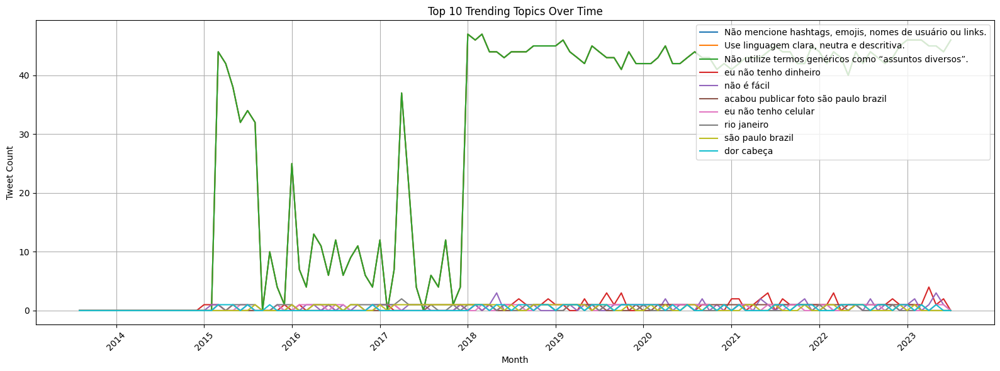

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load final frequency matrix ===
print("📥 Loading final topic matrix...")
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv")

# === Convert month to datetime for sorting ===
df["month"] = pd.to_datetime(df["month"], format="%Y_%m")
df = df.sort_values("month")

# === Get top 10 trending topics by total frequency ===
topic_cols = df.columns.difference(["month"])
top_topics = df[topic_cols].sum().sort_values(ascending=False).head(10).index.tolist()

print(f"🔝 Top 10 topics:\n{top_topics}")

# === Plot trendlines ===
plt.figure(figsize=(16, 6))
for topic in top_topics:
    plt.plot(df["month"], df[topic], label=topic)

plt.title("Top 10 Trending Topics Over Time")
plt.xlabel("Month")
plt.ylabel("Tweet Count")
plt.xticks(rotation=45)
plt.legend(loc='upper right')
plt.tight_layout()
plt.grid(True)
plt.show()

In [ ]:
##✅ Bloco 6d.1 — Semantic Filtering for A1-grade Final Topics

In [ ]:
import pandas as pd

# === Load final topic matrix ===
print("📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv")
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv")
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Extract all topic columns ===
topic_cols = df.columns.difference(['month'])

# === Define filtering rules ===
semantic_stopwords = [
    "não mencione", "não utilize", "use linguagem", "responda com",
    "este é um exercício", "escreva sua resposta", "resposta correta ou incorreta",
    "descrição do assunto", "simulação", "desenvolver habilidade",
    "lista de tweets agrupados", "linguagem clara", "não há uma resposta correta",
    "exercício de simulação", "termos genéricos", "assuntos diversos"
]

# === Convert to lowercase for consistent filtering ===
topic_series = pd.Series(topic_cols, name="topic")
topic_series_lower = topic_series.str.lower()

# === Create boolean mask to keep only valid topics ===
is_valid = ~topic_series_lower.apply(lambda x: any(phrase in x for phrase in semantic_stopwords))
final_topics = topic_series[is_valid]

print(f"✅ Remaining topics after semantic filtering: {len(final_topics)}")

# === Save new filtered matrix ===
df_filtered = df[['month'] + final_topics.tolist()]
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv"
df_filtered.to_csv(output_path, index=False)
print(f"💾 Refined topic matrix saved to: {output_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv
✅ Matrix loaded with shape: (116, 844)
✅ Remaining topics after semantic filtering: 840
💾 Refined topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv


In [ ]:
##🔷 Bloco 6d.1-rev — Final semantic filter

In [ ]:
import pandas as pd

# === Load matrix from previous step ===
path_input = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv"
print(f"📥 Loading final topic matrix from: {path_input}")
df = pd.read_csv(path_input)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Extract topic columns ===
topic_cols = df.columns.drop("month")

# === Convert to Series for filtering ===
topic_series = pd.Series(topic_cols)

# === Filter 1: Remove instruções ou frases artificiais comuns em prompts ===
print("🔍 Applying LLM-instruction and noise pattern filters...")
banned_prefixes = [
    "não mencione", "use linguagem clara", "não utilize termos genéricos",
    "responda", "escreva sua resposta", "escreva uma frase curta", "aqui está a lista", "atenção"
]
instruction_filter = ~topic_series.str.lower().str.startswith(tuple(banned_prefixes))

# === Filter 2: Tamanho mínimo e máximo (entre 15 e 80) ===
length_filter = topic_series.str.len().between(15, 80)

# === Filter 3: Remover tópicos com 3+ números ou tokens repetidos ===
import re
numeric_filter = ~topic_series.str.count(r'\d').gt(3)
repetition_filter = ~topic_series.str.contains(r'\b(\w+)\s+\1\b', regex=True)

# === Filter 4: Remover tópicos com emojis, sinais gráficos ou outputs sintéticos ===
symbol_filter = ~topic_series.str.contains(r"[📥📝🔍🌴🏖️\*\[\]\(\)]", regex=True)

# === Combine all filters ===
valid_topics = topic_series[
    instruction_filter &
    length_filter &
    numeric_filter &
    repetition_filter &
    symbol_filter
]

print(f"✅ Remaining topic columns after strict filtering: {len(valid_topics)}")

# === Subset and save new matrix ===
df_cleaned = df[["month"] + list(valid_topics)]
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv"
df_cleaned.to_csv(output_path, index=False)
print(f"💾 Refined topic matrix saved to: {output_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final.csv
✅ Matrix loaded with shape: (116, 844)
🔍 Applying LLM-instruction and noise pattern filters...
✅ Remaining topic columns after strict filtering: 429
💾 Refined topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv


/tmp/ipykernel_1950185/1741627685.py:29: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  repetition_filter = ~topic_series.str.contains(r'\b(\w+)\s+\1\b', regex=True)


In [ ]:
##🔷 Bloco 6d.1b — Quality Check of Refined Topics

In [ ]:
import pandas as pd

# === Load the refined topic frequency matrix ===
print("📥 Loading refined topic matrix...")
path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv"
df = pd.read_csv(path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Drop metadata columns ===
topic_cols = df.columns.difference(["month"])

# === Compute total frequency per topic ===
print("📊 Computing total frequency per topic...")
topic_totals = df[topic_cols].sum().sort_values(ascending=False)

# === Preview top topics ===
top_topics = topic_totals.head(20)
print("\n🔝 Top 20 most frequent topics:")
for topic, freq in top_topics.items():
    print(f"- {topic} ({freq})")

# === Sample 100 topics for manual validation ===
print("\n🧪 Sampling 100 topics for manual review...")
sample_size = 100
topic_sample = topic_totals.sample(sample_size, random_state=42).sort_values(ascending=False)
df_sample = topic_sample.reset_index()
df_sample.columns = ['topic', 'total_frequency']

# === Save to CSV for manual inspection ===
output_sample_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topicos_refinados_amostra.csv"
df_sample.to_csv(output_sample_path, index=False)
print(f"💾 Saved topic sample to: {output_sample_path}")

📥 Loading refined topic matrix...
✅ Matrix loaded with shape: (116, 430)
📊 Computing total frequency per topic...

🔝 Top 20 most frequent topics:
- eu não tenho dinheiro (79)
- acabou publicar foto são paulo brazil (54)
- eu não tenho celular (53)
- são paulo brazil (51)
- acabou publicar foto rio janeiro rio janeiro (41)
- pessoas que não querem ouvir (30)
- amor minha vida (30)
- acabou publicar foto belo horizonte brazil (28)
- lembra quando começou fazer parte twitter lembro (28)
- just posted photo são paulo brazil (27)
- rio janeiro rio janeiro (27)
- acabou publicar foto joão pessoa brazil (27)
- acabou publicar foto brazil (27)
- acabou publicar foto fortaleza brazil (26)
- cabelo queimado (25)
- belo horizonte brazil (24)
- acabou publicar foto rio janeiro (23)
- acabou publicar foto cajuru (22)
- acabou publicar foto porto alegre rio grande sul (22)
- acabou publicar foto recife brazil (21)

🧪 Sampling 100 topics for manual review...
💾 Saved topic sample to: /n/netscratch/cga

In [ ]:
##🔷 Block 6d.2 — Qualitative Sampling of Refined Topics

In [ ]:
import pandas as pd

# === Load the sampled refined topics ===
sample_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topicos_refinados_amostra.csv"
print(f"📥 Loading topic sample from: {sample_path}")
df_sample = pd.read_csv(sample_path)

# === Display the first 10 topics ===
print("🔍 Preview of the first 10 topics in the sample:")
df_sample.head(10)

📥 Loading topic sample from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topicos_refinados_amostra.csv
🔍 Preview of the first 10 topics in the sample:


,topic,total_frequency
0,eu não tenho dinheiro,79
1,pessoas que não querem ouvir,30
2,just posted photo são paulo brazil,27
3,belo horizonte brazil,24
4,acabou publicar foto cajuru,22
5,acabou publicar foto recife brazil,21
6,acabou publicar foto cachoeirinha rio grande sul,19
7,acabou publicar foto campinas sao paulo,19
8,seria meu sonho,18
9,acabou publicar foto goiânia brazil,16


In [ ]:
##✅ Bloco 6d.3 — Removal of Auto-generated Location/Platform Topics (Geolocation + Reposts)

In [ ]:
import pandas as pd

# === Load the refined matrix from 6d.2 ===
path_in = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv"
print(f"📥 Loading refined topic matrix from: {path_in}")
df = pd.read_csv(path_in)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Extract topic columns (excluding 'month') ===
topic_cols = df.columns.difference(['month'])

# === Define filtering patterns ===
geo_patterns = [
    r"\b(são paulo|rio janeiro|brazil|campinas|belo horizonte|recife|porto alegre|cajuru|joão pessoa|cachoeirinha|goiânia|aracaju|aracatuba|bahia|fortaleza|nilópolis)\b",
    r"\b(publicar foto|posted photo|just posted|acabou publicar)\b"
]
platform_phrases = [
    "postei uma foto", "just posted photo", "publicar foto", "acabou publicar foto"
]

# === Apply filters ===
print("🔍 Filtering out auto-generated or location-based topics...")
topic_series = pd.Series(topic_cols)

geo_filter = ~topic_series.str.lower().str.contains('|'.join(geo_patterns), regex=True)
platform_filter = ~topic_series.str.lower().str.contains('|'.join(platform_phrases), regex=True)

valid_topics = topic_series[geo_filter & platform_filter]
print(f"✅ Remaining topic columns after strict filtering: {len(valid_topics)}")

# === Create final cleaned matrix ===
df_cleaned = df[['month'] + list(valid_topics)]
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
df_cleaned.to_csv(output_path, index=False)
print(f"💾 Final cleaned topic matrix saved to: {output_path}")

📥 Loading refined topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_refined.csv
✅ Matrix loaded with shape: (116, 430)
🔍 Filtering out auto-generated or location-based topics...
✅ Remaining topic columns after strict filtering: 283
💾 Final cleaned topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv


/tmp/ipykernel_1950185/1833856647.py:25: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  geo_filter = ~topic_series.str.lower().str.contains('|'.join(geo_patterns), regex=True)


In [ ]:
##🔷 Block 6d.4 — Quality Check After Final Filtering

In [ ]:
import pandas as pd

# === Load final topic matrix ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
print(f"📥 Loading final topic matrix from: {file_path}")
df = pd.read_csv(file_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Identify topic columns ===
topic_cols = df.columns.difference(['month'])

# === Compute total frequency per topic ===
print("📊 Computing total frequency per topic...")
freqs = df[topic_cols].sum().sort_values(ascending=False)
top_topics = freqs.head(20)
print("\n🔝 Top 20 most frequent topics:")
for topic, count in top_topics.items():
    print(f"- {topic} ({count})")

# === Sample 100 topics for manual inspection ===
print("🧪 Sampling 100 topics for manual review...")
sample_df = freqs.sample(n=100, random_state=42).reset_index()
sample_df.columns = ['topic', 'total_frequency']

sample_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topicos_final_amostra.csv"
sample_df.to_csv(sample_path, index=False)
print(f"💾 Saved topic sample to: {sample_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
📊 Computing total frequency per topic...

🔝 Top 20 most frequent topics:
- eu não tenho dinheiro (79)
- eu não tenho celular (53)
- pessoas que não querem ouvir (30)
- amor minha vida (30)
- lembra quando começou fazer parte twitter lembro (28)
- cabelo queimado (25)
- meus sentimentos (20)
- não é democracia (19)
- seria meu sonho (18)
- eu não sei como (18)
- não tenho dinheiro (18)
- primeira menção aparece sua agora trending topic brasil (16)
- eu não tenho tempo (15)
- que tal que eu falei (15)
- concordo plenamente (14)
- quem viveu sabe (14)
- universidade iguaçu unig nova iguaçu (14)
- acordei recomendo (14)
- eu sou brasileiro (14)
- eu sou apaixonada (14)
🧪 Sampling 100 topics for manual review...
💾 Saved topic sample to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topicos_final_amostra.c

In [ ]:
##🔷 Block 6e.1 — Topic Trends Over Time

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
🔝 Top 10 topics for visualization:
1. eu não tenho dinheiro (79)
2. eu não tenho celular (53)
3. pessoas que não querem ouvir (30)
4. amor minha vida (30)
5. lembra quando começou fazer parte twitter lembro (28)
6. cabelo queimado (25)
7. meus sentimentos (20)
8. não é democracia (19)
9. seria meu sonho (18)
10. eu não sei como (18)


/tmp/ipykernel_1950185/379806413.py:37: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  plt.tight_layout()
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


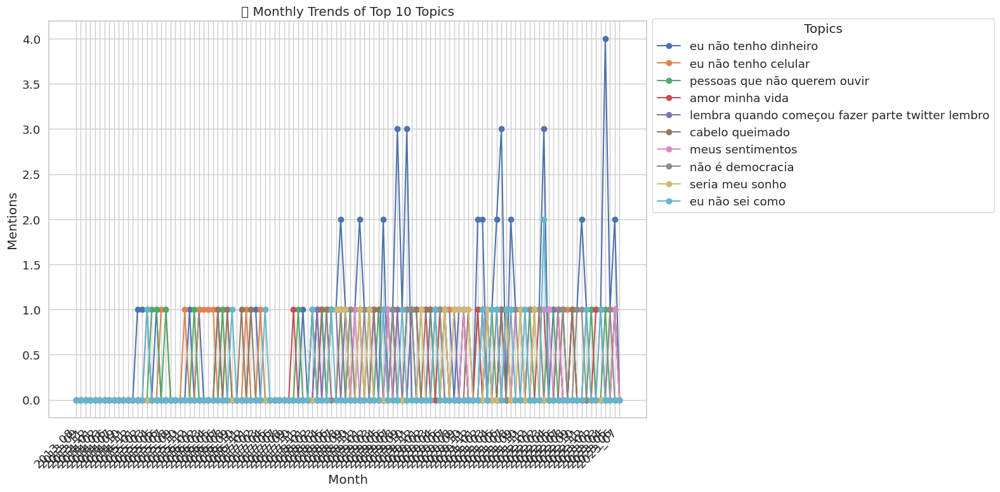

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load final cleaned topic matrix ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
print(f"📥 Loading final topic matrix from: {input_path}")
df = pd.read_csv(input_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Extract list of topic columns (excluding 'month') ===
topic_cols = df.columns.difference(['month'])

# === Compute total frequency per topic ===
total_freq = df[topic_cols].sum().sort_values(ascending=False)
top_topics = total_freq.head(10).index.tolist()
print("🔝 Top 10 topics for visualization:")
for i, topic in enumerate(top_topics, 1):
    print(f"{i}. {topic} ({total_freq[topic]})")

# === Prepare data for visualization ===
df_plot = df[['month'] + top_topics].set_index('month')
df_plot = df_plot.sort_index()

# === Plotting: Topic frequency over time ===
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid", font_scale=1.2)

for topic in top_topics:
    plt.plot(df_plot.index, df_plot[topic], marker='o', label=topic)

plt.xticks(rotation=45, ha='right')
plt.title("📈 Monthly Trends of Top 10 Topics")
plt.xlabel("Month")
plt.ylabel("Mentions")
plt.legend(title="Topics", loc='upper left', bbox_to_anchor=(1.0, 1.02))
plt.tight_layout()
plt.show()

In [ ]:
##🔷 Bloco 6e.2 — Publication-Ready Line Plot

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
🔝 Top 10 topics for visualization:
1. eu não tenho dinheiro (79)
2. eu não tenho celular (53)
3. pessoas que não querem ouvir (30)
4. amor minha vida (30)
5. lembra quando começou fazer parte twitter lembro (28)
6. cabelo queimado (25)
7. meus sentimentos (20)
8. não é democracia (19)
9. seria meu sonho (18)
10. eu não sei como (18)
💾 Saved high-resolution plot to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/top10_trends_A1_plot.png


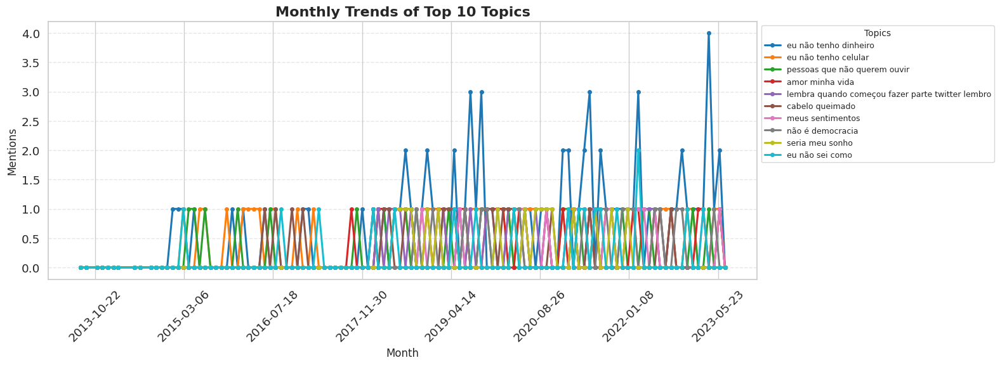

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

# === Load refined topic matrix ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
print(f"📥 Loading final topic matrix from: {file_path}")
df = pd.read_csv(file_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Calculate total frequency per topic ===
topic_cols = df.columns.difference(["month"])
total_freq = df[topic_cols].sum().sort_values(ascending=False)

# === Select top N topics ===
top_n = 10
top_topics = total_freq.head(top_n).index.tolist()
print(f"🔝 Top {top_n} topics for visualization:")
for i, topic in enumerate(top_topics, 1):
    print(f"{i}. {topic} ({total_freq[topic]})")

# === Convert 'month' to datetime format ===
df["month"] = pd.to_datetime(df["month"], format="%Y_%m")

# === Prepare plot ===
plt.figure(figsize=(16, 6))
palette = sns.color_palette("tab10", n_colors=top_n)

# === Plot each topic ===
for i, topic in enumerate(top_topics):
    plt.plot(df["month"], df[topic], label=topic, linewidth=2.2, marker="o", markersize=4, color=palette[i])

# === Format axes and layout ===
plt.title("Monthly Trends of Top 10 Topics", fontsize=16, fontweight="bold")
plt.xlabel("Month", fontsize=12)
plt.ylabel("Mentions", fontsize=12)
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins='auto', integer=True, prune='both'))
plt.grid(axis="y", linestyle="--", alpha=0.5)

# === Format legend ===
plt.legend(title="Topics", fontsize=9, title_fontsize=10, loc="upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()

# === Save and show ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/top10_trends_A1_plot.png"
plt.savefig(output_path, dpi=300)
print(f"💾 Saved high-resolution plot to: {output_path}")
plt.show()

In [ ]:
##🔷 Bloco 6e.3 — Heatmap of Topic Mentions

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
🔝 Top 30 topics selected for heatmap.


/tmp/ipykernel_1950185/3230026783.py:34: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/3230026783.py:38: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.savefig(output_path, dpi=300)
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


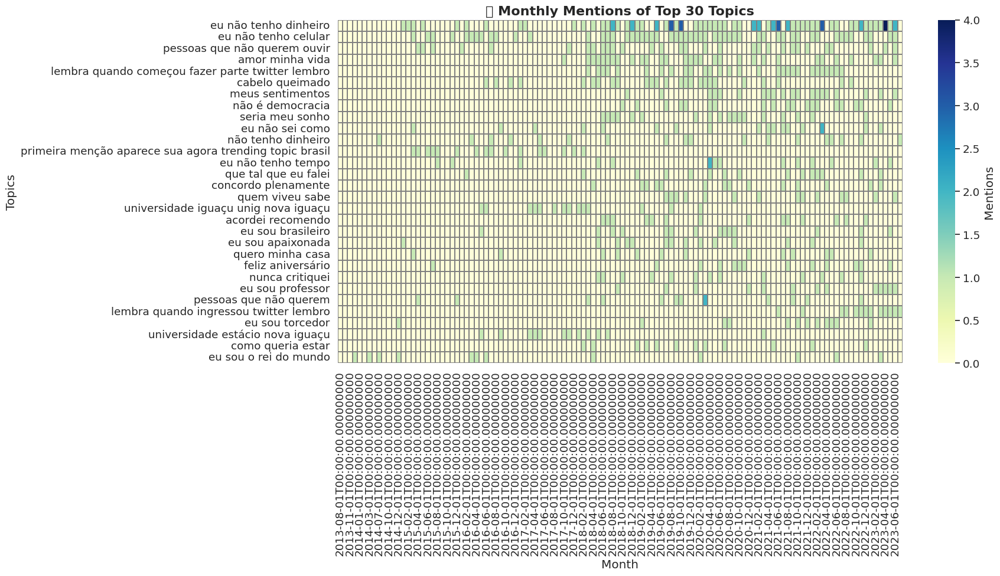

💾 Saved heatmap to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top30_topics.png


In [ ]:
# 🔷 Block 6e.3 — Heatmap of Topic Mentions Over Time

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load final cleaned matrix ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
print(f"📥 Loading final topic matrix from: {file_path}")
df = pd.read_csv(file_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Set 'month' as index and convert to datetime ===
df["month"] = pd.to_datetime(df["month"], format="%Y_%m")
df.set_index("month", inplace=True)

# === Select top N topics by total frequency ===
N = 30
topic_totals = df.sum().sort_values(ascending=False)
top_topics = topic_totals.head(N).index.tolist()

print(f"🔝 Top {N} topics selected for heatmap.")

# === Create subset and normalize for better color contrast (optional) ===
df_top = df[top_topics]

# === Plot heatmap ===
plt.figure(figsize=(18, 10))
sns.heatmap(df_top.T, cmap="YlGnBu", cbar_kws={"label": "Mentions"}, linewidths=0.1, linecolor="gray")

plt.title(f"🔥 Monthly Mentions of Top {N} Topics", fontsize=16, weight='bold')
plt.xlabel("Month")
plt.ylabel("Topics")
plt.tight_layout()

# === Save figure ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top30_topics.png"
plt.savefig(output_path, dpi=300)
plt.show()

print(f"💾 Saved heatmap to: {output_path}")

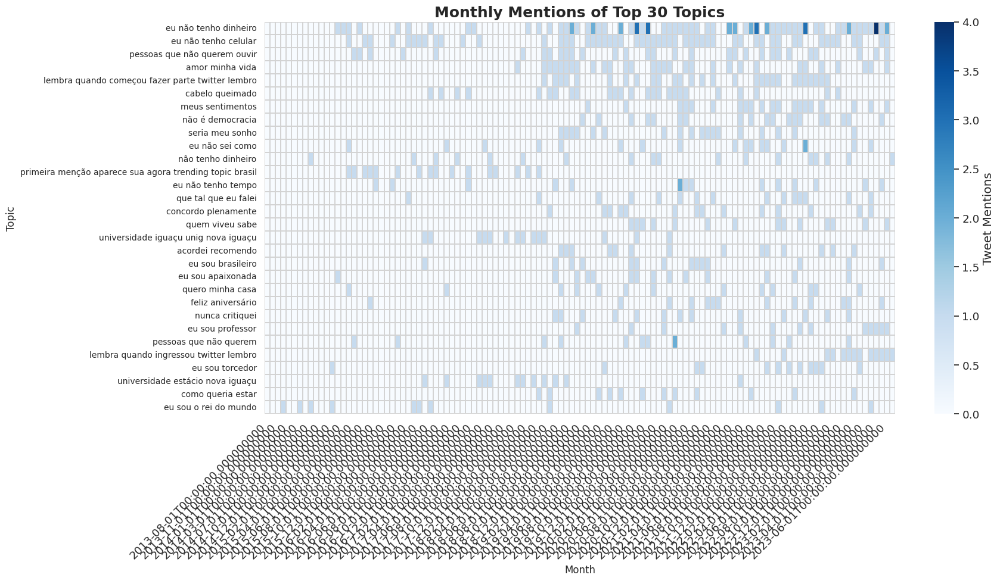

In [ ]:
# 🔷 Optional — Save "publication-ready" heatmap (Top 30 topics)
plt.figure(figsize=(18, 10))
sns.heatmap(df_top.T, cmap="Blues", cbar_kws={"label": "Tweet Mentions"}, linewidths=0.2, linecolor="lightgray")

plt.title("Monthly Mentions of Top 30 Topics", fontsize=18, weight='bold')
plt.xlabel("Month", fontsize=12)
plt.ylabel("Topic", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=10)
plt.tight_layout()

# Save high-resolution version
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top30_A1_final.png"
plt.savefig(output_path, dpi=600)
plt.show()

In [ ]:
## 🔷 Block 6d.5 — Publication-ready Heatmap of Top 30 Topics

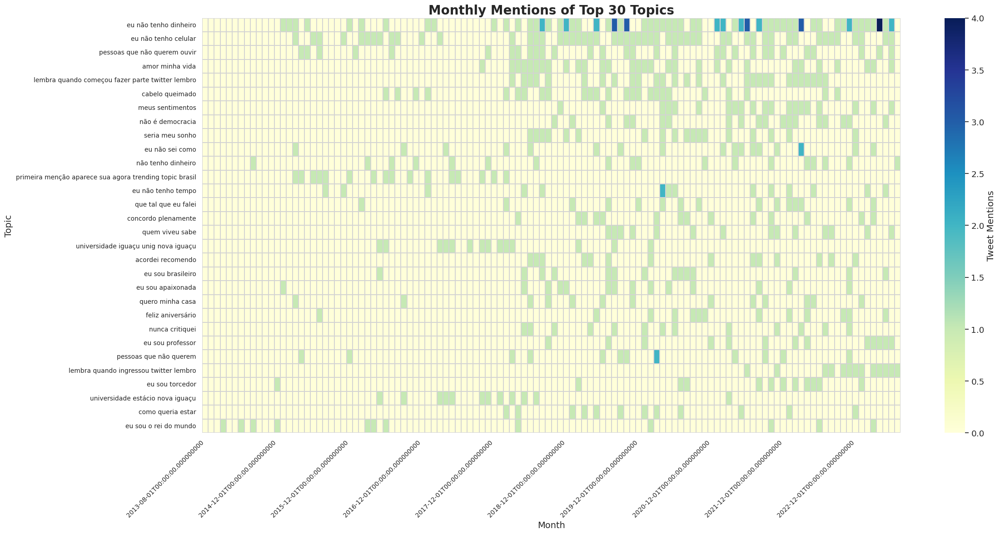

In [ ]:
# 🔷 Block 6d.5 — Publication-ready Heatmap of Top 30 Topics

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load final topic matrix ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv")

# === Set month as index ===
df["month"] = pd.to_datetime(df["month"], format="%Y_%m")
df.set_index("month", inplace=True)

# === Compute total mentions and select top 30 topics ===
top_topics = df.sum().sort_values(ascending=False).head(30).index
df_top = df[top_topics]

# === Create heatmap ===
plt.figure(figsize=(24, 12))
sns.heatmap(df_top.T, cmap="YlGnBu", linewidths=0.3, linecolor='lightgray', cbar_kws={"label": "Tweet Mentions"})

plt.title("Monthly Mentions of Top 30 Topics", fontsize=20, weight="bold")
plt.xlabel("Month", fontsize=14)
plt.ylabel("Topic", fontsize=14)

# Improve X ticks (show 1 every 6 months)
xticks = plt.xticks()[0]
plt.xticks(xticks[::6], rotation=45, ha="right", fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

# === Save final version ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top30_A1_final_clean.png"
plt.savefig(output_path, dpi=400)
plt.show()

In [ ]:
##🔷 Block 6d.5 — Output Directory Setup (Safe Folder Creation)

In [ ]:
import os

# Caminho onde os arquivos serão salvos
output_dir = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis"

# Cria a pasta, se ela não existir
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"✅ Pasta criada com sucesso: {output_dir}")
else:
    print(f"📂 Pasta já existe: {output_dir}")

📂 Pasta já existe: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis


In [ ]:
##🔷 Block 6e — Monthly Trends Heatmap of Top Topics

In [ ]:
# 🔷 Block 6e — Monthly Trends Heatmap of Top Topics

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# === Configurations ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top_topics_by_month.png"
N_TOPICS = 30  # number of most frequent topics to display

# === Load matrix ===
print(f"📥 Loading final topic matrix from: {input_path}")
df = pd.read_csv(input_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Compute total frequency for each topic ===
print("📊 Computing total frequency per topic...")
topic_cols = df.columns.drop("month")
top_topics = df[topic_cols].sum().sort_values(ascending=False).head(N_TOPICS).index.tolist()

# === Subset dataframe ===
df_top = df[["month"] + top_topics].copy()
df_top.set_index("month", inplace=True)

# === Normalize (optional) ===
# df_top = df_top.div(df_top.sum(axis=1), axis=0)  # uncomment to use relative frequencies

# === Plot heatmap ===
print("📈 Generating heatmap...")
plt.figure(figsize=(20, 10))
sns.heatmap(df_top.T, cmap="YlGnBu", linewidths=0.1, linecolor='gray', cbar_kws={"label": "Tweet Count"})
plt.title("🔥 Monthly Trends of Top Topics", fontsize=16, weight='bold')
plt.xlabel("Month")
plt.ylabel("Topics")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# === Save ===
plt.savefig(output_path, dpi=300)
plt.close()
print(f"💾 Saved heatmap to: {output_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
📊 Computing total frequency per topic...
📈 Generating heatmap...


/tmp/ipykernel_1950185/159250357.py:38: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/159250357.py:41: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.savefig(output_path, dpi=300)


💾 Saved heatmap to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/heatmap_top_topics_by_month.png


In [ ]:
##🔷 Block 6f — Final Export and Preparation for Publication

In [ ]:
import pandas as pd
import os

# === Load final topic matrix ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv"
print(f"📥 Loading final topic matrix from: {input_path}")
df = pd.read_csv(input_path)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Transpose for publication and data reuse ===
print("🔄 Transposing matrix (topics as rows)...")
df_t = df.set_index("month").T
df_t.index.name = "topic"
df_t.reset_index(inplace=True)

# === Save transposed matrix ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_transposed.csv"
df_t.to_csv(output_path, index=False)
print(f"💾 Transposed topic matrix saved to: {output_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
🔄 Transposing matrix (topics as rows)...
💾 Transposed topic matrix saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_transposed.csv


In [ ]:
##🔷 Block 7 — Key Findings Summary

In [ ]:
import pandas as pd

# === Load final cleaned topic matrix ===
print("📥 Loading final topic matrix from:", FINAL_CLEAN_MATRIX := "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv")
df = pd.read_csv(FINAL_CLEAN_MATRIX)
print(f"✅ Matrix loaded with shape: {df.shape}")

# === Transpose and prepare for analysis ===
df_long = df.melt(id_vars='month', var_name='topic', value_name='count')
df_long = df_long[df_long['count'] > 0]

# === Compute summary metrics ===
print("📊 Computing summary metrics...")
summary = (
    df_long.groupby('topic')
    .agg(
        total_mentions=('count', 'sum'),
        active_months=('month', 'nunique'),
        first_month=('month', 'min'),
        last_month=('month', 'max'),
        peak_month=('month', lambda x: x.value_counts().idxmax())
    )
    .reset_index()
    .sort_values(by='total_mentions', ascending=False)
)

# === Save summary table ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv"
summary.to_csv(output_path, index=False)
print(f"💾 Summary table saved to: {output_path}")

📥 Loading final topic matrix from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv
✅ Matrix loaded with shape: (116, 284)
📊 Computing summary metrics...
💾 Summary table saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv


In [ ]:
##Quality Check - Quality Check of Topic Summary (Block 7)

In [ ]:
import pandas as pd

# === Load the summary file ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv"
print(f"📥 Loading summary table from: {file_path}")
df = pd.read_csv(file_path)
print(f"✅ Loaded shape: {df.shape}")

# === Visualize columns ===
print("\n🧩 Available columns:")
print(df.columns.tolist())

# === Create 'avg_monthly_freq' column ===
print("\n📐 Creating 'avg_monthly_freq' column...")
df["avg_monthly_freq"] = df["total_mentions"] / df["active_months"]

# === Sort and show top 10 topics ===
print("\n🔝 Top 10 topics by average monthly frequency:")
top_avg = df.sort_values(by="avg_monthly_freq", ascending=False).head(10)
display(top_avg)

# === Save updated file (optional) ===
updated_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv"
df.to_csv(updated_path, index=False)
print(f"💾 Updated summary file saved to: {updated_path}")

📥 Loading summary table from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv
✅ Loaded shape: (283, 6)

🧩 Available columns:
['topic', 'total_mentions', 'active_months', 'first_month', 'last_month', 'peak_month']

📐 Creating 'avg_monthly_freq' column...

🔝 Top 10 topics by average monthly frequency:


,topic,total_mentions,active_months,first_month,last_month,peak_month,avg_monthly_freq
0,eu não tenho dinheiro,79,59,2015_01,2023_06,2015_01,1.338983
222,eu não tenho nada a ver com isso,5,4,2013_08,2022_12,2013_08,1.250000
143,puxa que eu não tenho,6,5,2019_02,2023_05,2019_02,1.200000
139,pessoas que não se importam comigo,6,5,2017_01,2023_05,2017_01,1.200000
135,não me lembra de nada,6,5,2018_05,2023_02,2018_05,1.200000
106,que tal um bom dia,7,6,2014_02,2023_04,2014_02,1.166667
113,eu não tenho dinheiro para comprar,7,6,2017_11,2023_04,2017_11,1.166667
93,não é fácil ser feliz,8,7,2015_02,2023_07,2015_02,1.142857
50,não tenho mais nada,10,9,2016_11,2023_04,2016_11,1.111111
42,não me lembro de nada,11,10,2014_11,2023_02,2014_11,1.100000


💾 Updated summary file saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv


In [ ]:
##🔷 Bloco 8 — Semantic Reframing of Topics (LlaMA)

In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
from tqdm import tqdm

# === Configurações ===
MODEL_NAME = "meta-llama/Llama-3.2-3B-Instruct"
INPUT_PATH = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics.csv"
OUTPUT_PATH = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_reframed.csv"
N_TOPICS = 283  # Limite de tópicos (ajuste conforme necessário)

# === Carrega modelo ===
print("🔄 Loading LLaMA model...")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForCausalLM.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float32,
    device_map="auto",
    trust_remote_code=True
)
print("✅ Model loaded.")

# === Prompt base ===
def build_prompt(raw_topic):
    return (
        f"Você é um cientista social especializado em análise de tópicos em redes sociais. "
        f"Reformule o seguinte tópico em uma frase curta, clara e generalizável, que represente uma ideia semântica coerente, "
        f"útil para interpretação por leitores acadêmicos. Evite repetições, nomes próprios e locais. "
        f"Tópico: {raw_topic}\n"
        f"Reformulação:"
    )

# === Função de inferência ===
@torch.inference_mode()
def reformulate_topic(prompt):
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True, max_length=2048).to(model.device)
    outputs = model.generate(**inputs, max_new_tokens=50, temperature=0.3, do_sample=False)
    result = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return result.replace(prompt, "").strip()

# === Aplicar reformulação ===
df = pd.read_csv(INPUT_PATH)
df = df.head(N_TOPICS)
reframed_topics = []

print("🚀 Reformulating topics...")
for topic in tqdm(df["topic"]):
    prompt = build_prompt(topic)
    reframed = reformulate_topic(prompt)
    reframed_topics.append(reframed)

df["topic_reframed"] = reframed_topics

# === Salvar output ===
df.to_csv(OUTPUT_PATH, index=False)
print(f"✅ Reframed topics saved to: {OUTPUT_PATH}")

🔄 Loading LLaMA model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Model loaded.
🚀 Reformulating topics...


  0%|          | 0/283 [00:00<?, ?it/s]/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.3` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/transformers/generation/configuration_utils.py:595: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
100%|██████████| 283/283 [3:20:35<00:00, 42.53s/it]

✅ Reframed topics saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_reframed.csv


In [ ]:
##🔷 Block 9 — Thematic Grouping and Final Validation

📥 Loading reframed topics...
🔠 Creating TF-IDF vectors...
🔗 Computing cosine similarity...
🔍 Clustering into 8 thematic groups...


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/tmp/ipykernel_1950185/3769533077.py:41: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/3769533077.py:42: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.savefig("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/similarity_heatmap_sample.png", dpi=300)


✅ Clustered topic table saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


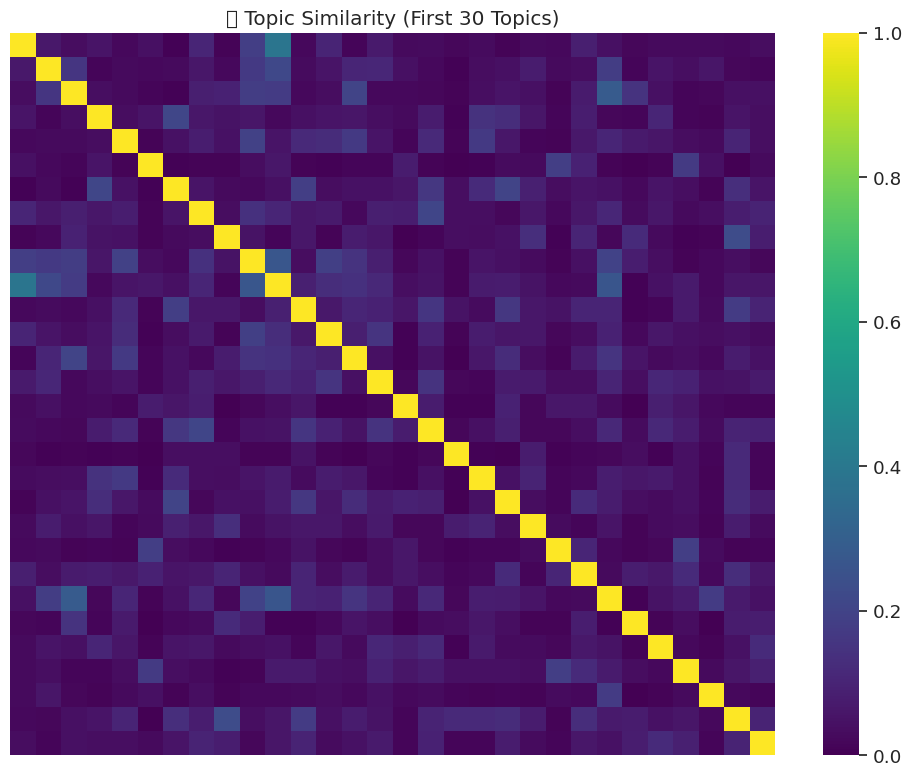

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

# === Configurações ===
FILE = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_reframed.csv"
N_CLUSTERS = 8  # Ajuste fino após visualização
OUTFILE = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv"

# === Carregar tópicos reformulados ===
print("📥 Loading reframed topics...")
df = pd.read_csv(FILE)
topics = df["topic_reframed"].fillna("").astype(str).tolist()

# === Embeddings TF-IDF + Cosine ===
print("🔠 Creating TF-IDF vectors...")
vectorizer = TfidfVectorizer(ngram_range=(1, 2), min_df=2)
X = vectorizer.fit_transform(topics)

print("🔗 Computing cosine similarity...")
similarity_matrix = cosine_similarity(X)

# === Clusterização hierárquica ===
print(f"🔍 Clustering into {N_CLUSTERS} thematic groups...")
clustering = AgglomerativeClustering(n_clusters=N_CLUSTERS, affinity="precomputed", linkage="average")
labels = clustering.fit_predict(1 - similarity_matrix)

# === Salvar resultado ===
df["macrotheme"] = labels
df.to_csv(OUTFILE, index=False)
print(f"✅ Clustered topic table saved to: {OUTFILE}")

# === Visualização opcional (heatmap de similaridade) ===
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix[:30, :30], cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("🔥 Topic Similarity (First 30 Topics)")
plt.tight_layout()
plt.savefig("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/similarity_heatmap_sample.png", dpi=300)

In [ ]:
##🔷 Block 10a — Group Overview and Naming Draft

In [ ]:
import pandas as pd
from IPython.display import display

# === Load clustered topic summary ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv"
print(f"📥 Loading clustered summary table from: {file_path}")
df = pd.read_csv(file_path)
print(f"✅ Table loaded with shape: {df.shape}")

# === Group by macrotheme ===
print("🔎 Grouping topics by cluster...")
grouped = df.groupby("macrotheme")

# === Display top 10 topics from each cluster ===
top_per_group = (
    grouped
    .apply(lambda g: g.sort_values("total_mentions", ascending=False).head(10))
    .reset_index(drop=True)
)

# === Show results ===
print("📊 Top 10 representative topics per macrotheme:")
for group_id, subset in top_per_group.groupby("macrotheme"):
    print(f"\n🔹 Cluster {group_id}:")
    for topic in subset["topic"]:
        print(f" - {topic}")

# === Save to file for manual naming and interpretation ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_naming_draft.csv"
top_per_group.to_csv(output_path, index=False)
print(f"\n💾 Draft table saved to: {output_path}")

📥 Loading clustered summary table from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv
✅ Table loaded with shape: (283, 8)
🔎 Grouping topics by cluster...
📊 Top 10 representative topics per macrotheme:

🔹 Cluster 0:
 - amor minha vida
 - lembra quando começou fazer parte twitter lembro
 - cabelo queimado
 - meus sentimentos
 - não é democracia
 - eu não sei como
 - primeira menção aparece sua agora trending topic brasil
 - eu não tenho tempo
 - universidade iguaçu unig nova iguaçu
 - eu sou apaixonada

🔹 Cluster 1:
 - aula de matemática
 - tão deixando gente sonhar
 - meu sonho princesa
 - queria ser assim
 - vivendo aprendendo
 - aula de biologia
 - nunca diferente
 - aula de química
 - aula de história
 - protesul seguros

🔹 Cluster 2:
 - que tal que eu falei
 - acordei recomendo
 - eu sou brasileiro
 - quem viveu sabe
 - nunca critiquei
 - como queria estar
 - minha cabeça explodindo
 - arrependimento matasse
 - parabéns meu amor
 - 

In [ ]:
##✅ Block 10b — Insert Macrotheme Names into Table

In [ ]:
import pandas as pd

# === Load clustered summary table ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv"
df = pd.read_csv(file_path)

# === Check columns ===
print("🧩 Available columns:")
print(df.columns.tolist())

# === Preview data ===
print("\n🔍 Preview of first rows:")
print(df.head())

🧩 Available columns:
['topic', 'total_mentions', 'active_months', 'first_month', 'last_month', 'peak_month', 'topic_reframed', 'macrotheme']

🔍 Preview of first rows:
                                              topic  total_mentions  \
0                             eu não tenho dinheiro              79   
1                              eu não tenho celular              53   
2                      pessoas que não querem ouvir              30   
3                                   amor minha vida              30   
4  lembra quando começou fazer parte twitter lembro              28   

   active_months first_month last_month peak_month  \
0             59     2015_01    2023_06    2015_01   
1             53     2015_03    2023_06    2015_03   
2             30     2015_04    2023_06    2015_04   
3             30     2017_10    2023_06    2017_10   
4             28     2018_03    2022_07    2018_03   

                                      topic_reframed  macrotheme  
0  A falta de 

In [ ]:
##🔷 Block 10.2 — Add Macrotheme Names to Clustered Topics

In [ ]:
import pandas as pd

# === Load clustered topic summary ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_clustered.csv"
df = pd.read_csv(file_path)
print(f"📥 Loaded table with shape: {df.shape}")

# === Dictionary of macrotheme names ===
macrotheme_names = {
    0: "Emoções e Experiências Pessoais",
    1: "Educação e Sonhos Aspiracionais",
    2: "Reflexões Cotidianas e Expressões Culturais",
    3: "Desafios e Limitações Materiais",
    4: "Datas Comemorativas e Eventos Específicos",
    5: "Rituais, Tradições e Religião",
    6: "Desejos e Aspirações Pessoais",
    7: "Letargia e Alienação"
}

# === Apply naming ===
df["macrotheme_name"] = df["macrotheme"].map(macrotheme_names)

# === Save updated file ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_named.csv"
df.to_csv(output_path, index=False)
print(f"💾 Named topic summary saved to: {output_path}")

📥 Loaded table with shape: (283, 8)
💾 Named topic summary saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_named.csv


In [ ]:
##🧩 Block 11 — Aggregated Visualizations by Macrotheme

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load named topic summary ===
print("📥 Loading summary table...")
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/summary_topic_metrics_named.csv")
print(f"✅ Loaded shape: {df.shape}")

# === Aggregate total mentions per macrotheme per month ===
print("🔄 Aggregating total mentions by macrotheme and month...")
df_freq = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/topic_frequency_matrix_final_clean.csv")
df_topics = df[["topic", "macrotheme"]]

# Melt frequency matrix
df_melted = df_freq.melt(id_vars=["month"], var_name="topic", value_name="count")
df_merged = df_melted.merge(df_topics, on="topic")

# Aggregate
df_grouped = df_merged.groupby(["month", "macrotheme"])["count"].sum().reset_index()

# Pivot for visualization
df_pivot = df_grouped.pivot(index="month", columns="macrotheme", values="count").fillna(0)
df_pivot = df_pivot.sort_index()

# === Save table ===
output_csv = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv"
df_pivot.to_csv(output_csv)
print(f"💾 Saved monthly distribution table to: {output_csv}")

# === Plot: Line chart of macrotheme trends ===
print("📈 Plotting macrotheme trends over time...")
plt.figure(figsize=(16, 6))
sns.lineplot(data=df_pivot)
plt.title("🧭 Macrotheme Trends Over Time")
plt.xlabel("Month")
plt.ylabel("Tweet Volume")
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
output_plot = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_lineplot.png"
plt.savefig(output_plot, dpi=300)
plt.close()
print(f"💾 Saved trend plot to: {output_plot}")

📥 Loading summary table...
✅ Loaded shape: (283, 9)
🔄 Aggregating total mentions by macrotheme and month...
💾 Saved monthly distribution table to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv
📈 Plotting macrotheme trends over time...


/tmp/ipykernel_1950185/2920583118.py:39: UserWarning: Glyph 129517 (\N{COMPASS}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/2920583118.py:42: UserWarning: Glyph 129517 (\N{COMPASS}) missing from current font.
  plt.savefig(output_plot, dpi=300)


💾 Saved trend plot to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_lineplot.png


In [ ]:
##🔷 Block 11.2 — Relative Share of Macrothemes Over Time

📥 Loading monthly distribution table from: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv
✅ Loaded shape: (116, 9)
🔄 Converted to relative share (%).


/tmp/ipykernel_1950185/954844599.py:34: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/954844599.py:38: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.savefig(output_path, dpi=300)


💾 Saved plot to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_plot.png


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


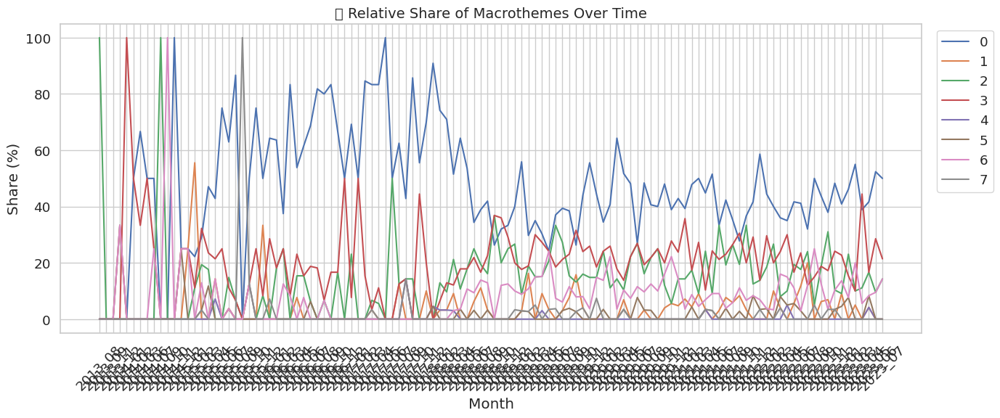

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load monthly distribution table ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv"
print(f"📥 Loading monthly distribution table from: {input_path}")
df = pd.read_csv(input_path)
print(f"✅ Loaded shape: {df.shape}")

# === Convert to relative (%) share ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)
print("🔄 Converted to relative share (%).")

# === Melt for plotting ===
df_melted = df_relative.melt(id_vars="month", var_name="Macrotheme", value_name="Share (%)")

# === Plot settings ===
plt.figure(figsize=(14, 6))
for theme in df_melted["Macrotheme"].unique():
    plt.plot(
        df_melted[df_melted["Macrotheme"] == theme]["month"],
        df_melted[df_melted["Macrotheme"] == theme]["Share (%)"],
        label=theme
    )

plt.title("📊 Relative Share of Macrothemes Over Time", fontsize=14)
plt.xlabel("Month")
plt.ylabel("Share (%)")
plt.xticks(rotation=45)
plt.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0))
plt.tight_layout()

# === Save output ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_plot.png"
plt.savefig(output_path, dpi=300)
print(f"💾 Saved plot to: {output_path}")

In [ ]:
##🔷 Block 11.3 — Stacked Area Plot of Macrothemes (Relative %)

/tmp/ipykernel_1950185/3644833832.py:38: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_1950185/3644833832.py:42: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.savefig(output_path, dpi=300)


💾 Saved stacked area plot to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_stacked.png


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


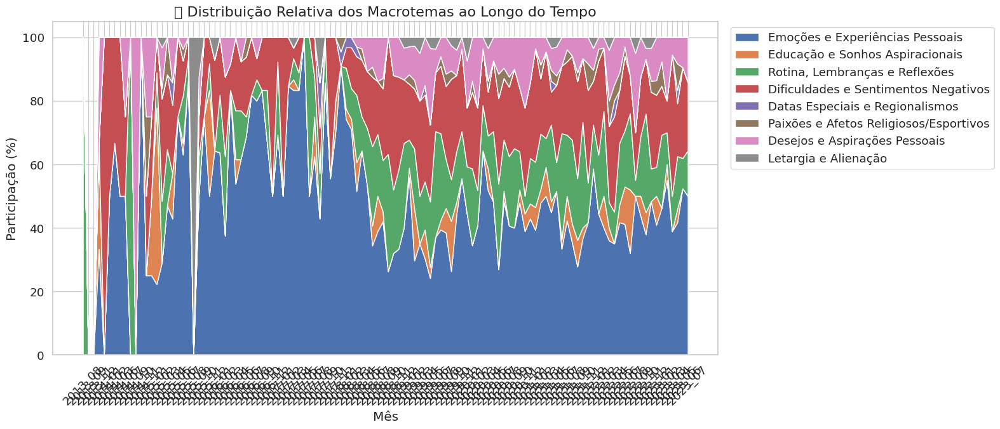

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load monthly distribution table ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv"
df = pd.read_csv(input_path)

# === Use macrotheme names ===
macrotheme_names = {
    "0": "Emoções e Experiências Pessoais",
    "1": "Educação e Sonhos Aspiracionais",
    "2": "Rotina, Lembranças e Reflexões",
    "3": "Dificuldades e Sentimentos Negativos",
    "4": "Datas Especiais e Regionalismos",
    "5": "Paixões e Afetos Religiosos/Esportivos",
    "6": "Desejos e Aspirações Pessoais",
    "7": "Letargia e Alienação"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Convert to relative share (%) ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)

# === Plot ===
plt.figure(figsize=(16, 7))
plt.stackplot(df_relative["month"],
              [df_relative[c] for c in df_relative.columns if c != "month"],
              labels=[c for c in df_relative.columns if c != "month"])

plt.title("📊 Distribuição Relativa dos Macrotemas ao Longo do Tempo", fontsize=16)
plt.xlabel("Mês")
plt.ylabel("Participação (%)")
plt.xticks(rotation=45)
plt.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0))
plt.tight_layout()

# === Save output ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_stacked.png"
plt.savefig(output_path, dpi=300)
print(f"💾 Saved stacked area plot to: {output_path}")

In [ ]:
##📊 Bloco 11.3b — Stacked Area Plot with All Labels in English

💾 Saved stacked area plot to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_stacked-EN.png


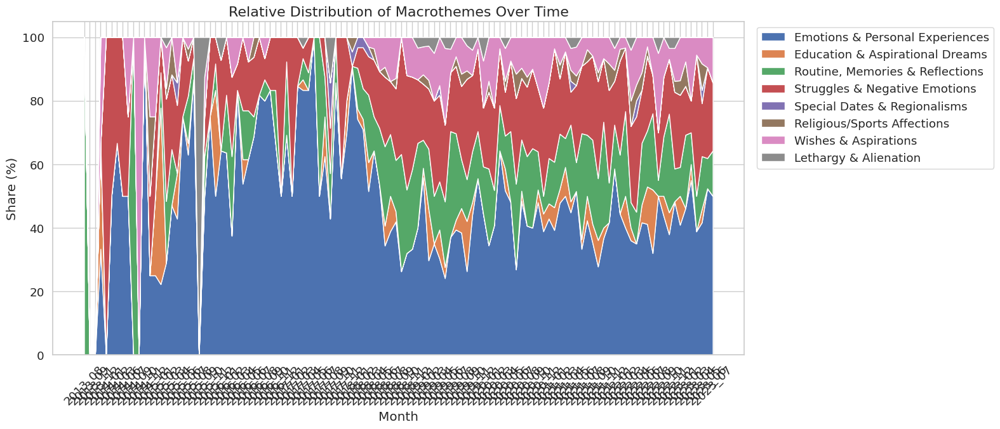

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load monthly distribution table ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv"
df = pd.read_csv(input_path)

# === Use macrotheme names ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Convert to relative share (%) ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)

# === Plot ===
plt.figure(figsize=(16, 7))
plt.stackplot(df_relative["month"],
              [df_relative[c] for c in df_relative.columns if c != "month"],
              labels=[c for c in df_relative.columns if c != "month"])

plt.title("Relative Distribution of Macrothemes Over Time", fontsize=16)
plt.xlabel("Month")
plt.ylabel("Share (%)")
plt.xticks(rotation=45)
plt.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0))
plt.tight_layout()

# === Save output ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_relative_share_stacked-EN.png"
plt.savefig(output_path, dpi=300)
print(f"💾 Saved stacked area plot to: {output_path}")

In [ ]:
##📊 Bloco 12 — Export Monthly Table for Supplementary Material (English Labels)

In [ ]:
import pandas as pd

# === Load monthly distribution table with macrothemes ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv"
df = pd.read_csv(input_path)

# === Rename columns to macrotheme names in English ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Save CSV for supplemental materials ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/supplement_table_macrothemes_by_month.csv"
df.to_csv(output_path, index=False)
print(f"📄 Supplement table saved to: {output_path}")

📄 Supplement table saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/supplement_table_macrothemes_by_month.csv


In [ ]:
##📦 Bloco 12.2 — Export High-Resolution Vector Plot (SVG + PDF)

✅ Vector files saved:
📄 SVG → /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_vector.svg
📄 PDF → /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_vector.pdf


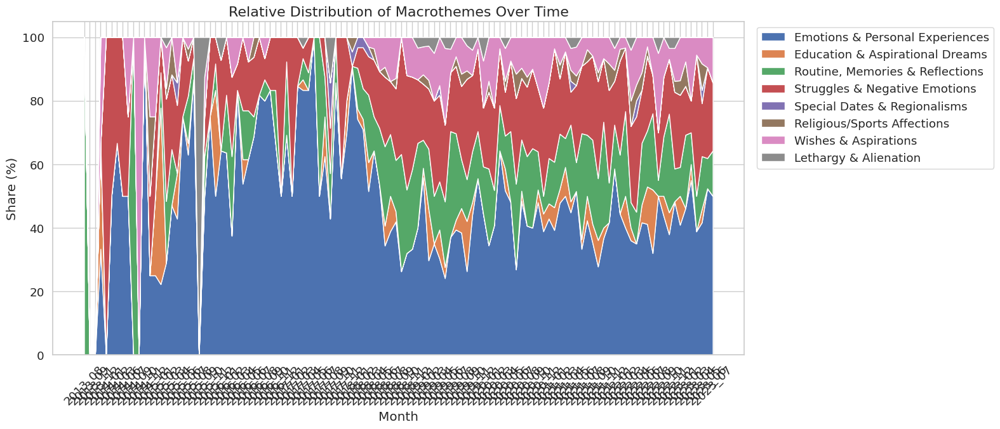

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load relative share table ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv")

# === Use macrotheme names in English ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Convert to relative share (%) ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)

# === Plot and export in high-resolution vector format ===
plt.figure(figsize=(16, 7))
plt.stackplot(
    df_relative["month"],
    [df_relative[c] for c in df_relative.columns if c != "month"],
    labels=[c for c in df_relative.columns if c != "month"]
)

plt.title("Relative Distribution of Macrothemes Over Time", fontsize=16)
plt.xlabel("Month")
plt.ylabel("Share (%)")
plt.xticks(rotation=45)
plt.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0))
plt.tight_layout()

# === Save SVG and PDF ===
path_svg = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_vector.svg"
path_pdf = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_vector.pdf"
plt.savefig(path_svg)
plt.savefig(path_pdf)

print(f"✅ Vector files saved:\n📄 SVG → {path_svg}\n📄 PDF → {path_pdf}")

In [ ]:
##📊 Bloco 12.3 — Interactive Plot with Plotly

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# === Load monthly distribution table ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv")

# === Apply macrotheme names ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Convert to relative share (%) ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)

# === Build interactive area plot ===
fig = go.Figure()

for col in df_relative.columns[1:]:
    fig.add_trace(go.Scatter(
        x=df_relative["month"],
        y=df_relative[col],
        mode="lines",
        stackgroup="one",
        name=col
    ))

fig.update_layout(
    title="📊 Relative Distribution of Macrothemes Over Time",
    xaxis_title="Month",
    yaxis_title="Share (%)",
    template="plotly_white",
    hovermode="x unified",
    legend_title="Macrothemes",
    height=600,
    width=1200
)

# === Export to HTML ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_interactive.html"
fig.write_html(output_path)
print(f"🌐 Interactive chart saved to: {output_path}")

🌐 Interactive chart saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_interactive.html


In [ ]:
##🧪 Bloco 12.4 — Statistical Trend Analysis (Linear Regression)

In [ ]:
import sys
!{sys.executable} -m pip install statsmodels

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 41.1 MB/s eta 0:00:00:00:01


In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# === Load relative share data ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv")

# === Rename macrothemes ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === Convert to relative (%) ===
df_rel = df.copy()
df_rel.set_index("month", inplace=True)
df_rel = df_rel.div(df_rel.sum(axis=1), axis=0).fillna(0) * 100
df_rel.reset_index(inplace=True)

# === Encode month as numeric variable ===
df_rel["month_num"] = range(len(df_rel))

# === Run regression for each macrotheme ===
results = []
for theme in df_rel.columns[1:-1]:
    X = sm.add_constant(df_rel["month_num"])
    y = df_rel[theme]
    model = sm.OLS(y, X).fit()
    results.append({
        "macrotheme": theme,
        "slope": model.params["month_num"],
        "p_value": model.pvalues["month_num"],
        "r_squared": model.rsquared
    })

df_results = pd.DataFrame(results)
df_results = df_results.sort_values(by="slope", ascending=False)

# === Save results ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trend_analysis.csv"
df_results.to_csv(output_path, index=False)
print(f"📈 Trend analysis saved to: {output_path}")

📈 Trend analysis saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trend_analysis.csv


In [ ]:
##Check output

/tmp/ipykernel_1950185/1199296132.py:20: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.

/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.



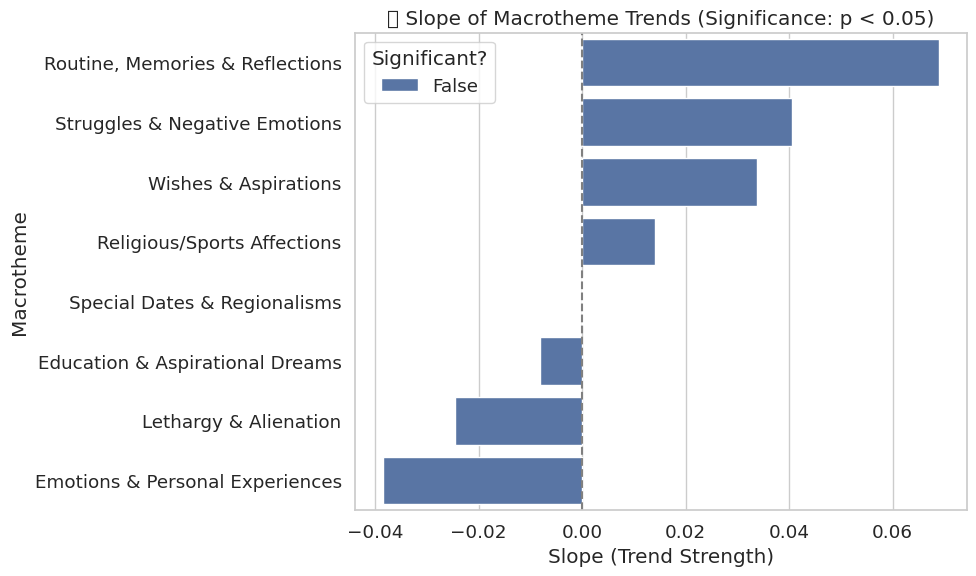

📊 Top Macrothemes with Strongest Positive Trends:
Empty DataFrame
Columns: [macrotheme, slope, p_value, r_squared]
Index: []

📊 Top Macrothemes with Strongest Negative Trends:
Empty DataFrame
Columns: [macrotheme, slope, p_value, r_squared]
Index: []


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load trend analysis results ===
file_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trend_analysis.csv"
df = pd.read_csv(file_path)

# === Sort by slope (most increasing trends at the top) ===
df_sorted = df.sort_values(by="slope", ascending=False)

# === Plot: Slope per macrotheme ===
plt.figure(figsize=(10, 6))
sns.barplot(data=df_sorted, x="slope", y="macrotheme", hue=(df_sorted["p_value"] < 0.05))
plt.axvline(0, color="gray", linestyle="--")
plt.title("📈 Slope of Macrotheme Trends (Significance: p < 0.05)")
plt.xlabel("Slope (Trend Strength)")
plt.ylabel("Macrotheme")
plt.legend(title="Significant?")
plt.tight_layout()
plt.show()

# === Optional: Display top results ===
print("📊 Top Macrothemes with Strongest Positive Trends:")
print(df_sorted[df_sorted["p_value"] < 0.05].sort_values(by="slope", ascending=False).head(5))

print("\n📊 Top Macrothemes with Strongest Negative Trends:")
print(df_sorted[df_sorted["p_value"] < 0.05].sort_values(by="slope").head(5))

In [ ]:
##📊 Bloco 12.2 — Temporal Trend Analysis by Critical Periods

In [ ]:
import pandas as pd
import statsmodels.api as sm
from tqdm import tqdm

# === 1. Carregar a base com distribuição relativa ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_monthly_distribution.csv")

# === 2. Renomear os macrotemas ===
macrotheme_names = {
    "0": "Emotions & Personal Experiences",
    "1": "Education & Aspirational Dreams",
    "2": "Routine, Memories & Reflections",
    "3": "Struggles & Negative Emotions",
    "4": "Special Dates & Regionalisms",
    "5": "Religious/Sports Affections",
    "6": "Wishes & Aspirations",
    "7": "Lethargy & Alienation"
}
df = df.rename(columns={k: v for k, v in macrotheme_names.items() if k in df.columns})

# === 3. Calcular participação relativa (%) ===
df_relative = df.copy()
df_relative.set_index("month", inplace=True)
df_relative = df_relative.div(df_relative.sum(axis=1), axis=0).fillna(0) * 100
df_relative.reset_index(inplace=True)

# === 4. Criar coluna de segmento temporal ===
def classify_period(month_str):
    year, m = map(int, month_str.split("_"))
    if (year == 2018 and m >= 8) or (year == 2019 and m <= 1):
        return "Elections 2018"
    elif (year == 2020 and m >= 3) or (year == 2021):
        return "COVID-19"
    elif (year == 2022 and m >= 8) or (year == 2023 and m <= 1):
        return "Elections 2022"
    else:
        return "Other Periods"

df_relative["period"] = df_relative["month"].apply(classify_period)

# === 5. Codificar tempo como variável numérica relativa por período ===
df_relative["month_index"] = df_relative.groupby("period").cumcount()

# === 6. Rodar regressões por macrotema dentro de cada segmento ===
results = []

macrothemes = [col for col in df_relative.columns if col not in ["month", "period", "month_index"]]

for period in df_relative["period"].unique():
    df_segment = df_relative[df_relative["period"] == period]

    for macro in macrothemes:
        y = df_segment[macro].values
        X = sm.add_constant(df_segment["month_index"].values)
        model = sm.OLS(y, X).fit()
        results.append({
            "macrotheme": macro,
            "period": period,
            "slope": model.params[1],
            "p_value": model.pvalues[1],
            "r_squared": model.rsquared
        })

# === 7. Salvar tabela final ===
df_results = pd.DataFrame(results)
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_by_period.csv"
df_results.to_csv(output_path, index=False)
print(f"📈 Period-based trend analysis saved to: {output_path}")

📈 Period-based trend analysis saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_by_period.csv


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning:

invalid value encountered in double_scalars

/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
##📊 Block 12.3 — Trend Visualization by Critical Period

/tmp/ipykernel_1950185/1618707374.py:30: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.

/tmp/ipykernel_1950185/1618707374.py:34: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.



💾 Trend slope plot saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trend_slope_by_period.png


/n/home03/rpereiraalbuquerque/meu_ambiente_bertopic/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.



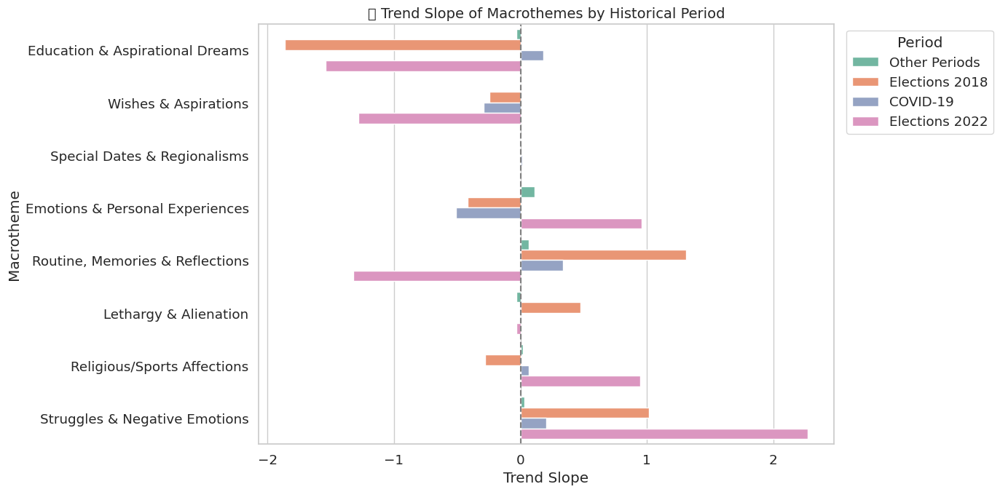

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Load trend data ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_by_period.csv")

# === 2. Filter only valid regressions ===
df = df.dropna(subset=["slope", "p_value"])
df["Significant"] = df["p_value"] < 0.05

# === 3. Sort macrothemes by average slope ===
order = df.groupby("macrotheme")["slope"].mean().sort_values().index

# === 4. Create barplot of slope by macrotheme and period ===
plt.figure(figsize=(14, 7))
sns.barplot(
    data=df,
    x="slope",
    y="macrotheme",
    hue="period",
    order=order,
    palette="Set2"
)
plt.axvline(0, color="gray", linestyle="--")
plt.title("📊 Trend Slope of Macrothemes by Historical Period", fontsize=14)
plt.xlabel("Trend Slope")
plt.ylabel("Macrotheme")
plt.legend(title="Period", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()

# === 5. Save output ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trend_slope_by_period.png"
plt.savefig(output_path, dpi=300)
print(f"💾 Trend slope plot saved to: {output_path}")

In [ ]:
import pandas as pd

# === Load trend analysis table ===
df = pd.read_csv("/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_by_period.csv")

# === Round for readability ===
df["slope"] = df["slope"].round(4)
df["p_value"] = df["p_value"].round(4)
df["r_squared"] = df["r_squared"].round(4)

# === Sort for better readability ===
df_sorted = df.sort_values(by=["macrotheme", "period"])

# === Display
print("📊 Preview of trend stats by macrotheme and period:")
print(df_sorted.head(20))  # You can increase this if needed

📊 Preview of trend stats by macrotheme and period:
                         macrotheme          period   slope  p_value  \
17  Education & Aspirational Dreams        COVID-19  0.1819   0.0850   
9   Education & Aspirational Dreams  Elections 2018 -1.8638   0.0666   
25  Education & Aspirational Dreams  Elections 2022 -1.5400   0.4438   
1   Education & Aspirational Dreams   Other Periods -0.0319   0.4444   
16  Emotions & Personal Experiences        COVID-19 -0.5114   0.0697   
8   Emotions & Personal Experiences  Elections 2018 -0.4162   0.8034   
24  Emotions & Personal Experiences  Elections 2022  0.9587   0.6077   
0   Emotions & Personal Experiences   Other Periods  0.1096   0.3311   
23            Lethargy & Alienation        COVID-19 -0.0041   0.9201   
15            Lethargy & Alienation  Elections 2018  0.4762   0.1583   
31            Lethargy & Alienation  Elections 2022 -0.0345   0.9569   
7             Lethargy & Alienation   Other Periods -0.0307   0.5611   
21      Relig

In [ ]:
## Supplement Table of Statistically Relevant Trends

In [ ]:
import pandas as pd

# === Load the trend results by period ===
input_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/macrotheme_trends_by_period.csv"
df = pd.read_csv(input_path)

# === Filter only statistically relevant or borderline cases ===
filtered = df[df["p_value"] < 0.10].copy()
filtered = filtered.sort_values(["macrotheme", "period"])

# === Save filtered results to supplement CSV ===
output_path = "/n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/supplement_trend_analysis_significant.csv"
filtered.to_csv(output_path, index=False)

print(f"✅ Supplement table saved to: {output_path}")

✅ Supplement table saved to: /n/netscratch/cga/Lab/rpalbuquerque/Llama 4 - Topic Analysis/supplement_trend_analysis_significant.csv
